# Intro

In [1]:
import numpy as np
import matplotlib
import pandas as pd
import healpy as hp
import scipy
import matplotlib.patches as patches
import photutils
import seaborn as sns

from matplotlib import pyplot as plt
from scipy.io import FortranFile as ff
from scipy.ndimage import gaussian_filter
from scipy import interpolate
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits 
from scipy import stats
from ipywidgets import IntProgress
from IPython.display import display
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from matplotlib.colors import LogNorm
from regions import PixCoord, CircleSkyRegion, CirclePixelRegion, RectangleSkyRegion, RectanglePixelRegion
from photutils import CircularAperture, CircularAnnulus
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1 import make_axes_locatable 
from matplotlib.lines import Line2D
from matplotlib import rcParams
    
cFS = '#80A4ED'
cnoFS ='#87A937'
colors = ['#E7B075' , '#57DC1F']  # R -> G -> B


plt.rcParams["text.usetex"] = 'True'
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times'
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["xtick.minor.visible"] = "True"
plt.rcParams["ytick.minor.visible"] = "True"
plt.rc('font', size=15) 
plt.rc('text.latex', preamble=r'\usepackage{amsmath,newtxmath,color, xcolor}')

/home/simon/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/simon/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (
/home/simon/anaconda3/lib/python3.9/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==58.0.4 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before runnin

## Define classy parameters

In [2]:
galaxy = ['J0021_0052','J0036_3333','J0127_0619','J0144_0453','J0337_0502','J0405_3648','J0808_3948',
          'J0823_2806','J0926_4427','J0934_5514','J0938_5428','J0940_2935','J0942_3547','J0944_0038',
          'J0944_3442','J1016_3754','J1024_0524','J1025_3622','J1044_0353','J1105_4444','J1112_5503',
          'J1119_5130','J1129_2034','J1132_1411','J1132_5722','J1144_4012','J1148_2546','J1150_1501',
          'J1157_3220','J1200_1343','J1225_6109','J1253_0312','J1314_3452','J1323_0132','J1359_5726',
          'J1416_1223','J1418_2102','J1428_1653','J1429_0643','J1444_4237','J1448_0110','J1521_0759',
          'J1525_0757','J1545_0858','J1612_0817']

label  = ['j0021+0052','j0036-3333','j0127-0619','j0144+0453','j0337-0502','j0405-3648','j0808+3948',
          'j0823+2806','j0926+4427','j0934+5514','j0938+5428','j0940+2935','j0942+3547','j0944-0038',
          'j0944+3442','j1016+3754','j1024+0524','j1025+3622','j1044+0353','j1105+4444','j1112+5503',
          'j1119+5130','j1129+2034','j1132+1411','j1132+5722','j1144+4012','j1148+2546','j1150+1501',
          'j1157+3220','j1200+1343','j1225+6109','j1253-0312','j1314+3452','j1323-0132','j1359+5726',
          'j1416+1223','j1418+2102','j1428+1653','j1429+0643','j1444+4237','j1448-0110','j1521+0759',
          'j1525+0757','j1545+0858','j1612+0817']

z = np.array([0.098393,0.020598,0.005400,0.005200,0.013520,0.002800,0.091230,
              0.047223,0.180667,0.002500,0.102102,0.001675,0.014857,0.004776,
              0.020046,0.003879,0.033191,0.126500,0.012870,0.021540,0.131635,
              0.004458,0.004703,0.017637,0.005041,0.126947,0.045117,0.002448,
              0.010970,0.066750,0.002341,0.022723,0.002885,0.022464,0.033829,
              0.123156,0.008550,0.181666,0.173502,0.002300,0.027412,0.094261,
              0.075791,0.037724,0.149143])

df = pd.read_csv('../Classy/AnalysisClassy.csv')
res   =  df['resol'].values
MstarAp   =  df['MstarAper'].values
MstarTot  =  df['MstarTot'].values
SFRAp  =  df['SFRAper'].values
SFRTot  =  df['SFRTot'].values
aperSize = df['aper'].values
fractAp = df['fr50aper'].values
EWLya = df['EWtotLya'].values

h_cgs     = 6.6260755e-27  # [erg s]
c_cgs     = 2.99792458e10  # [cm/s]
c = 299792.458

classy = pd.read_csv('../Classy/AnalysisClassy.csv')
ClassFluo =  pd.read_csv('csv/Classy_Fluo_V2.csv')
ClassAbs =  pd.read_csv('csv/Classy_Abs.csv')

offsiIIfluo1265 = ((1265.002-1260.42)/1260.42*c)
offsetsII = (1259.518-1260.42 )/1260.42*c
offcIIfluo1335 = ((1335.708-1334.5322)/1334.532*c)
wcII1334  = 1334.532
wsiII1260 = 1260.42
wLya = 1215.67

print('Offset CII - CII*: ', offcIIfluo1335)
print('Offset SiII - SiII*: ',offsiIIfluo1265)
print('Offset S II - Si II: ', offsetsII)

maskInc = ((ClassAbs['EWSiII']<-2.5)  & (ClassAbs['EWCII']<-2.5)) | ((ClassAbs['VcenCII']<-300) & (ClassAbs['VcenSiII']<-300))
maskGal = classy['Galaxy'][maskInc].values
print(maskGal)
from astropy.cosmology import FlatLambdaCDM

cosmo = FlatLambdaCDM(H0=67.8, Om0=0.308)

Offset CII - CII*:  264.13452215188124
Offset SiII - SiII*:  1089.8343746972944
Offset S II - Si II:  -214.54181710541965
['J0808+3948' 'J1112+5503' 'J1144+4012' 'J1416+1223' 'J1525+0757'
 'J1612+0817']


In [3]:
#Compute masks
nGal = len(galaxy)
mask_all = []

for i in range(nGal):
#     print(label[i])
    spec = '../Classy/%s/hlsp_classy_hst_cos_%s_multi_v1_coadded.fits'%(galaxy[i].replace("_", ""), label[i])
    gal   = fits.open(spec)
    HRB   = gal[10].data # Rest-frame, galactic extinction-corrected, co-added, binned high-resolution spectrum 
    mask  = HRB['MASK'].astype('bool')

    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']#[mask]
    flux   = data['flux']#[mask]
    fit    = gaussian_filter(data['fit'], sigma = 10)#[mask]
    fitori = gaussian_filter(data['fit'], sigma = 0)#[mask]
    err    = data['err']
    absflux = gaussian_filter(flux/fit,sigma = 0)

    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c
    vLyad  = (wave/wLya-1)*c

    if label[i] == 'j0337-0502' :
        mask = mask | (abs(vcIId)<1000) | (abs(vsiIId) < 600)
        mask_all.append(mask)
    elif label[i] == 'j0405-3648':
        mask = mask & ~((vcIId < -500) & (vcIId > -1000)) & ~((vsiIId < -500) & (vsiIId > -1000))
        mask_all.append(mask)
    elif label[i] == 'j0823+2806':
        mask = mask | (abs(vsiIId) < 2000)
        mask_all.append(mask)
    elif label[i] == 'j0934+5514':
        mask = mask & ~((vcIId < -400) & (vcIId > -1000))
        mask_all.append(mask)
    elif label[i] == 'j0942+3547':
        mask = mask | (abs(vcIId)<1000) 
        mask_all.append(mask)
    elif label[i] == 'j0944+3442':
        mask = mask & ~((abs(vsiIId)< 2000))
        mask_all.append(mask)
    elif label[i] ==  'j1016+3754':
        mask = mask & ~((vcIId < -600) & (vcIId > -1000))
        mask_all.append(mask)       
    elif label[i] == 'j1024+0524':
        mask = mask | (vsiIId < 300) | (vsiIId>700) 
        mask_all.append(mask)     
    elif label[i] == 'j1044+0353':
        mask = (mask | (vcIId < 1000)) & ~((abs(vsiIId)< 2000))
        mask_all.append(mask)   
    elif label[i] == 'j1105+4444':
        mask = mask & ~((abs(vcIId)< 1500))
        mask_all.append(mask)    
    elif label[i] == 'j1132+1411':
        mask = mask | (vcIId < 00) 
        mask_all.append(mask)         
    elif label[i] == 'j1148+2546':
        mask = (mask & ~((abs(vcIId)< 1500))) | (abs(vsiIId) < 300) 
        mask_all.append(mask)  
    elif label[i] == 'j1157+3220':
        mask = mask & ~((abs(vsiIId)< 2000))
        mask_all.append(mask)   
    elif label[i] == 'j1314+3452':
        mask = mask & ~((vcIId < -400) & (vcIId > -1000))
        mask_all.append(mask)   
    elif label[i] == 'j1359+5726':
        mask = mask & ~((abs(vsiIId)< 2000))
        mask_all.append(mask)    
    elif label[i] == 'j1545+0858':
        mask = mask | (vsiIId >-300) 
        mask_all.append(mask)      
    else:
        mask_all.append(mask)
        
        
    cutCIIall = (vcIId>-1000) & (vcIId<1000) 
    cutSiIIall = (vsiIId>-800) & (vsiIId<2000) 

    cutLyaall = (vLyad>-4000) & (vLyad<4000) 
    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]
    if(i == 4):
        absflux[cutSiIIall] = absflux[cutSiIIall]/0.8
        
        
    #absflux /= np.median(absflux[cutSiIIall])
    
#     fig, axs = plt.subplots(1,2,figsize=(15,5))
#     axs[0].plot(vcIId[cutCIIall], flux[cutCIIall]/np.nanmedian(flux[cutCIIall]),     c='k', label = 'Observed',drawstyle='steps-mid')
#     axs[0].plot(vcIId[cutCIIall], absflux[cutCIIall]/np.nanmedian(absflux[cutCIIall]),  c=cnoFS, label = 'Continuum divided',drawstyle='steps-mid')
#     axs[0].plot(vcIId[cutCIIall], fitori[cutCIIall]/np.nanmedian(fitori[cutCIIall]),      c='gray', label = 'SB99 HR', linestyle = ':')
#     axs[0].plot(vcIId[cutCIIall], fit[cutCIIall]/np.nanmedian(fit[cutCIIall]),      c='forestgreen', label = 'SB99 smoothed')
# #     axs[0].plot(vcIId[cutCIIall], )
#     axs[0].fill_between(vcIId[cutCIIall][~maskCII], np.nanmin(flux[cutCIIall]/np.nanmedian(flux[cutCIIall])), 
#                         np.nanmax(flux[cutCIIall]/np.nanmedian(flux[cutCIIall])), alpha=0.2, color= 'r')

#     axs[0].set_title('C II 1334')
#     axs[0].legend(frameon=False, fontsize = 15)
    
#     axs[1].plot(vsiIId[cutSiIIall], flux[cutSiIIall]/np.nanmedian(flux[cutSiIIall]),     c='k', label = 'Observed',drawstyle='steps-mid')
#     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall]/np.nanmedian(absflux[cutSiIIall]),  c=cnoFS, label = 'Continuum divided',drawstyle='steps-mid')
#     axs[1].plot(vsiIId[cutSiIIall], fitori[cutSiIIall]/np.nanmedian(fitori[cutSiIIall]),      c='gray', label = 'SB99 HR', linestyle = ':')
#     axs[1].plot(vsiIId[cutSiIIall], fit[cutSiIIall]/np.nanmedian(fit[cutSiIIall]),      c='forestgreen', label = 'SB99 smoothed')
#     axs[1].fill_between(vsiIId[cutSiIIall][~maskSiII], np.nanmin(flux[cutSiIIall]/np.nanmedian(flux[cutSiIIall])), 
#                         np.nanmax(flux[cutSiIIall]/np.nanmedian(flux[cutSiIIall])), alpha=0.2, color= 'r')  
#     axs[1].set_title('Si II 1260')

# #     axs[2].plot(vLyad[cutLyaall], absflux[cutLyaall],  c='k')
# #     axs[2].fill_between(vLyad[cutLyaall],absflux[cutLyaall]-err[cutLyaall],absflux[cutLyaall]+err[cutLyaall],
# #                         color = 'k', alpha = 0.1)
# #     axs[2].set_title('Lyman-alpha')
# #     axs[2].set_ylim(0, np.max([2,np.nanmax(absflux[abs(vLyad) < 1000])]))
 
#     plt.suptitle(label[i])
#     plt.show()
#     plt.savefig(galaxy[i]+'match.pdf', bbox_inches = 'tight')


## Define functions

In [4]:
def measureEWabs(lam, vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        fluxA[fluxA>1.05]=1.05
        EW = scipy.integrate.simps(fluxA[valid]-1, x = lam[valid])
        EWstd = 0
    else:
        mes = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux[modFlux>1] = 1
            modFlux[modFlux<0] = 0
            mes[i] =  scipy.integrate.simps(modFlux-1, x = lam[valid])
        EW = np.median(mes)
        EWstd = np.std(mes)
    return [EW, EWstd]

def measureEWall(lam, vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
#         fluxA[fluxA>1.05]=1.05
        EW = scipy.integrate.simps(fluxA[valid]-1, x = lam[valid])
        EWstd = 0
    else:
        mes = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux[modFlux<0] = 0
            mes[i] =  scipy.integrate.simps(modFlux-1, x = lam[valid])
        EW = np.median(mes)
        EWstd = np.std(mes)
    return [EW, EWstd]

def measureEWemi(lam, vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        fluxA[fluxA<1]=1
        EW = scipy.integrate.simps(fluxA[valid]-1, x = lam[valid])
        EWstd = 0
    else:
        mes = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux[modFlux<1] = 1
            mes[i] =  scipy.integrate.simps(modFlux-1, x = lam[valid])
        EW = np.median(mes)
        EWstd = np.std(mes)
    return [EW, EWstd]

def measureMinVel(vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        modFlux = gaussian_filter(fluxA[valid], sigma = 0.)
        V = vel[valid][modFlux == np.min(modFlux)][0]
        Vstd = 0
        Fmin =  np.min(modFlux[(vel[valid]>=V-20) & (vel[valid] <=V+20)])
        Fstd = 0
    else:
        mes = np.zeros(1000)
        mes2 = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            mes[i] =  vel[valid][modFlux == np.min(modFlux)][0]
            mes2[i] =  np.median(modFlux[(vel[valid]>=mes[i]-20) & (vel[valid] <=mes[i]+20)])
        V = np.median(mes)
        Vstd = np.std(mes)        
        Fstd = np.std(mes2)
        Fmin = np.median(mes2)
    return [V, Vstd, Fmin, Fstd]

def measureMaxVel(vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        modFlux = gaussian_filter(fluxA[valid], sigma = 0.)
        V = vel[valid][modFlux == np.max(modFlux)][0]
        Vstd = 0
        Fmin = np.max(modFlux)
        Fstd = 0
    else:
        mes = np.zeros(1000)
        mes2 = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            mes[i] =  vel[valid][modFlux == np.max(modFlux)][0]
            mes2[i] = np.median(modFlux[(vel[valid]>= mes[i]-20) & (vel[valid] <= mes[i]+20)])
        V = np.median(mes)
        Vstd = np.std(mes)        
        Fstd = np.std(mes2)
        Fmin = np.median(mes2)  
    return [V, Vstd, Fmin, Fstd]

def measureCenV(vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)  
    vel2= vel[valid]
    if(np.sum(errA) == 0): 
        modFlux = gaussian_filter(1-fluxA[valid], sigma = 0.)
        modFlux[modFlux<= 0] = 0
        vcen = vel2[np.cumsum(modFlux)>= 0.5*np.max(np.cumsum(modFlux))][0]
        vstd = 0
    else:
        mes = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux = 1 - modFlux
            modFlux[modFlux<= 0] = 0
            mes[i] =  vel2[np.cumsum(modFlux)>= 0.5*np.max(np.cumsum(modFlux))][0]
        vcen = np.median(mes)
        vstd = np.std(mes)        
    return [vcen, vstd]

def read_file(Dir,FileName,ndir):
    f = ff('%s/%s_spectrum'%(Dir,FileName))
    n = f.read_ints()[0]
    aperture,lmin,lmax = f.read_reals('d')
    spec = np.zeros((ndir,n))
    spec[0,:] = f.read_reals('d')
    for j in range(1,ndir):
        f.read_ints()
        f.read_reals('d')
        spec[j,:] = f.read_reals('d')
    f.close()

    return lmin,lmax,n,spec

# To get the spectra, in the appropriate units
def read_spectrum_si(path_to_data, halo):
    f = ff('%s/%s/SiII_SMC/spectra_SiII_1260/IC_photons_%i_nphots'%(path_to_data,str(halo).zfill(5),
                                                                          1000000))
    a = f.read_ints()
    lum_per_packet = f.read_reals()
    f.close()
    lum_per_packet = lum_per_packet/a
    lmin,lmax,npix,phot_packets = \
        read_file('%s/%s/SiII_SMC/spectra_SiII_1260/'%(path_to_data,str(halo).zfill(5)),'output.out',ndirections)
    dl   = (lmax - lmin) / npix                  # [A] 
    l    = np.arange(lmin,lmax-1e-5,dl) + 0.5*dl # [A]
    flux = h_cgs*c_cgs/(l*1e-8)*lum_per_packet   # [erg / s / phot packet]
    flux = flux / dl                             # [erg / s / A / phot packet]
    flux = flux * phot_packets                   # [erg / s/ A]
    
    return l,flux


def read_spectrum_c(path_to_data,halo):
    f = ff('%s/%s/CII_SMC/spectra_CII_1334/IC_photons_%i_nphots'%(path_to_data,str(halo).zfill(5),
                                                                          1000000))
    a = f.read_ints()
    lum_per_packet = f.read_reals()
    f.close()
    lum_per_packet = lum_per_packet/a
    lmin,lmax,npix,phot_packets = \
        read_file('%s/%s/CII_SMC/spectra_CII_1334/'%(path_to_data,str(halo).zfill(5)),'output.out',ndirections)
    dl   = (lmax - lmin) / npix                  # [A] 
    l    = np.arange(lmin,lmax-1e-5,dl) + 0.5*dl # [A]
    flux = h_cgs*c_cgs/(l*1e-8)*lum_per_packet   # [erg / s / phot packet]
    flux = flux / dl                             # [erg / s / A / phot packet]
    flux = flux * phot_packets                   # [erg / s/ A]
    
    return l,flux

ndirections = 300
directions = np.zeros((ndirections,3))

for i in range(ndirections):
    directions[i,:] = hp.pix2vec(5,i)
    
    
h_cgs     = 6.6260755e-27  # [erg s]
c_cgs     = 2.99792458e10  # [cm/s]

cu_to_cm  = 0.218526280953331e26
cu_to_pc  = cu_to_cm/3.086e18

def read_spectrum_lyb(path_to_data,halo):
    f = ff('%s/%s/HI_new_fid/spectra_LyB/IC_photons_%i_nphots'%(path_to_data,str(halo).zfill(5),
                                                                         3000000))
    a = f.read_ints()
    lum_per_packet = f.read_reals()
    f.close()
    lum_per_packet = lum_per_packet/a
    lmin,lmax,npix,phot_packets = \
        read_file('%s/%s/HI_new_fid/spectra_LyB/'%(path_to_data,str(halo).zfill(5)),'output.out',ndirections)
    dl   = (lmax - lmin) / npix                  # [A] 
    l    = np.arange(lmin,lmax-1e-5,dl) + 0.5*dl # [A]
    flux = h_cgs*c_cgs/(l*1e-8)*lum_per_packet   # [erg / s / phot packet]
    flux = flux / dl                             # [erg / s / A / phot packet]
    flux = flux * phot_packets                   # [erg / s/ A]
    
    return l,flux

def read_cube(path,ndir):
    
    f = ff('%s/output.out_cube'%path,'r')
    nlbda,nxy = f.read_ints()
    lmin,lmax,imsize = f.read_reals('d')
    center = f.read_reals('d')
    cube = np.zeros((ndir,nxy,nxy,nlbda))
    cube1 = f.read_reals('d')
    cube[0] = cube1.reshape(nxy,nxy,nlbda)
    for j in range(1,ndir):
        f.read_ints()
        f.read_reals('d')
        f.read_reals('d')
        cube1 = f.read_reals('d')
        cube[j] = cube1.reshape((nxy,nxy,nlbda))
    f.close()
    
    
    f = ff('%s/IC_photons_16000000_nphots'%path,'r')
    nphot = f.read_ints()[0]
    total_lum = f.read_reals()
    f.close()
    
    l = np.linspace(lmin,lmax,nlbda)
    
    cube = cube*total_lum/nphot
    cube = cube*h_cgs*c_cgs / (l*1e-8)
    cube = cube/((lmax-lmin)/nlbda)   

    return nxy,imsize*cu_to_pc,l,cube

# nxy,imsize,lcube,cube = read_cube('./data_cubes_output_148/',300)
# nxy: number of pixels
# imsize: size of the side of the image, in parsecs
# l : wavelength array, in A
# cube : spectrum in each pixel, in erg/s/A   (might be confusing, but it's not in erg/s/A/parsec**2)
v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)


## Read simulation measurements

In [5]:
#Read Simu measurements

fescM = np.zeros(75)
fesc900M = np.zeros(75)
fesc = np.zeros((75,300))
fesc900 = np.zeros((75,300))

EWabsSiIIfs = np.zeros((75,300))
EWemiSiIIfs = np.zeros((75,300))
VabsSiIIfs = np.zeros((75,300))
VcenSiIIfs = np.zeros((75,300))
VemiSiIIfs = np.zeros((75,300))
RSiIIfs = np.zeros((75,300))
EWabsCIIfs = np.zeros((75,300))
EWemiCIIfs = np.zeros((75,300))
VabsCIIfs = np.zeros((75,300))
VcenCIIfs = np.zeros((75,300))
VemiCIIfs = np.zeros((75,300))
RCIIfs = np.zeros((75,300))

EWabsSiIInf = np.zeros((75,300))
EWemiSiIInf = np.zeros((75,300))
VabsSiIInf = np.zeros((75,300))
VcenSiIInf = np.zeros((75,300))
VemiSiIInf = np.zeros((75,300))
RSiIInf = np.zeros((75,300))
EWabsCIInf = np.zeros((75,300))
EWemiCIInf = np.zeros((75,300))
VabsCIInf = np.zeros((75,300))
VcenCIInf = np.zeros((75,300))
VemiCIInf = np.zeros((75,300))
RCIInf = np.zeros((75,300))

EWabsSiIIdu = np.zeros((75,300))
EWemiSiIIdu = np.zeros((75,300))
VabsSiIIdu = np.zeros((75,300))
VcenSiIIdu = np.zeros((75,300))
VemiSiIIdu = np.zeros((75,300))
RSiIIdu = np.zeros((75,300))
EWabsCIIdu = np.zeros((75,300))
EWemiCIIdu = np.zeros((75,300))
VabsCIIdu = np.zeros((75,300))
VcenCIIdu = np.zeros((75,300))
VemiCIIdu = np.zeros((75,300))
RCIIdu = np.zeros((75,300))


EWabsSiIIdep = np.zeros((75,300))
EWemiSiIIdep = np.zeros((75,300))
VabsSiIIdep = np.zeros((75,300))
VcenSiIIdep = np.zeros((75,300))
VemiSiIIdep = np.zeros((75,300))
RSiIIdep = np.zeros((75,300))
EWabsCIIdep = np.zeros((75,300))
EWemiCIIdep = np.zeros((75,300))
VabsCIIdep = np.zeros((75,300))
VcenCIIdep = np.zeros((75,300))
VemiCIIdep = np.zeros((75,300))
RCIIdep = np.zeros((75,300))
for i in range(75):
    f = pd.read_csv('dat_files/fesc/fesc_%d.txt'%int(i+90), delimiter = ' ', skiprows=1, header= None)
#     print(f)
    fesc[i,:]    = f[0]
    fesc900[i,:] = f[1]

    fescM[i] = np.round(np.mean(fesc[i,:]),4)
    fesc900M[i] = np.round(np.mean(fesc900[i,:]),4)
    
    EWSiII = pd.read_csv(f'CII_SiII_nofine/Measurements/SiII_%d_300.csv'%(i+90))
    EWCII = pd.read_csv(f'CII_SiII_nofine/Measurements/CII_%d_300.csv'%(i+90))
    
    EWabsSiIInf[i] = EWSiII['EWabsLR']
    EWemiSiIInf[i] = EWSiII['EWemiLR']
    VabsSiIInf[i]  = EWSiII['VabsLR']
    VcenSiIInf[i]  = EWSiII['VcenLR']
    VemiSiIInf[i]  = EWSiII['VemiLR']
    RSiIInf[i]     = EWSiII['RabsLR']
    EWabsCIInf[i]  = EWCII['EWabsLR']
    EWemiCIInf[i]  = EWCII['EWemiLR']
    VabsCIInf[i]   = EWCII['VabsLR']
    VcenCIInf[i]   = EWCII['VcenLR']
    VemiCIInf[i]   = EWCII['VemiLR']
    RCIInf[i]      = EWCII['RabsLR']
    
    EWSiII = pd.read_csv(f'CII_SiII_fine/Measurements/SiII_%d_300.csv'%(i+90))
    EWCII = pd.read_csv(f'CII_SiII_fine/Measurements/CII_%d_300.csv'%(i+90))
    
    EWabsSiIIfs[i] = EWSiII['EWabsLR']
    EWemiSiIIfs[i] = EWSiII['EWemiLR']
    VabsSiIIfs[i]  = EWSiII['VabsLR']
    VcenSiIIfs[i]  = EWSiII['VcenLR']
    VemiSiIIfs[i]  = EWSiII['VemiLR']
    RSiIIfs[i]     = EWSiII['RabsLR']
    EWabsCIIfs[i]  = EWCII['EWabsLR']
    EWemiCIIfs[i]  = EWCII['EWemiLR']
    VabsCIIfs[i]   = EWCII['VabsLR']
    VcenCIIfs[i]   = EWCII['VcenLR']
    VemiCIIfs[i]   = EWCII['VemiLR']
    RCIIfs[i]      = EWCII['RabsLR']
    
    EWSiII = pd.read_csv(f'CII_SiII_ND/Measurements/SiII_%d_300.csv'%(i+90))
    EWCII = pd.read_csv(f'CII_SiII_ND/Measurements/CII_%d_300.csv'%(i+90))
    
    EWabsSiIIdu[i] = EWSiII['EWabsLR']
    EWemiSiIIdu[i] = EWSiII['EWemiLR']
    VabsSiIIdu[i]  = EWSiII['VabsLR']
    VcenSiIIdu[i]  = EWSiII['VcenLR']
    VemiSiIIdu[i]  = EWSiII['VemiLR']
    RSiIIdu[i]     = EWSiII['RabsLR']
    EWabsCIIdu[i]  = EWCII['EWabsLR']
    EWemiCIIdu[i]  = EWCII['EWemiLR']
    VabsCIIdu[i]   = EWCII['VabsLR']
    VcenCIIdu[i]   = EWCII['VcenLR']
    VemiCIIdu[i]   = EWCII['VemiLR']
    RCIIdu[i]      = EWCII['RabsLR']
    
    EWSiII = pd.read_csv(f'CII_SiII_depletion/Measurements/SiII_%d_300.csv'%(i+90))
    EWCII = pd.read_csv(f'CII_SiII_depletion/Measurements/CII_%d_300.csv'%(i+90))
    
    EWabsSiIIdep[i] = EWSiII['EWabsLR']
    EWemiSiIIdep[i] = EWSiII['EWemiLR']
    VabsSiIIdep[i]  = EWSiII['VabsLR']
    VcenSiIIdep[i]  = EWSiII['VcenLR']
    VemiSiIIdep[i]  = EWSiII['VemiLR']
    RSiIIdep[i]     = EWSiII['RabsLR']
    EWabsCIIdep[i]  = EWCII['EWabsLR']
    EWemiCIIdep[i]  = EWCII['EWemiLR']
    VabsCIIdep[i]   = EWCII['VabsLR']
    VcenCIIdep[i]   = EWCII['VcenLR']
    VemiCIIdep[i]   = EWCII['VemiLR']
    RCIIdep[i]      = EWCII['RabsLR']
#     print(fescM, fesc900M
# print(VcenSiIInf)
Mgas = np.zeros(75)
f = pd.read_csv('dat_files/Mgas.dat', delimiter = ' ', header= None)
Mgas = f[1][f[0]>=90].values

Mhalo = np.zeros(75)
f = pd.read_csv('dat_files/Mhalo.dat', delimiter = ' ', header= None)
Mhalo = f[1][f[0]>=90].values

Mstar = np.zeros(75)
f = pd.read_csv('dat_files/Mstar.dat', delimiter = ' ', header= None)
Mstar = f[3][f[0]>=90].values
# print(Mstar)
Zgas = np.zeros(75)
f = pd.read_csv('dat_files/Zgas.dat', delimiter = ' ', header= None)
Zgas = f[1][f[0]>=90].values

Zstar = np.zeros(75)
f = pd.read_csv('dat_files/Zstar.dat', delimiter = ' ', header= None)
Zstar = f[1][f[0]>=90].values

SFR10 = np.zeros(75)
f = pd.read_csv('dat_files/SFR_10.dat', delimiter = ' ', header= None)
SFR10 = f[3][f[0]>=90].values

SFR100 = np.zeros(75)
f = pd.read_csv('dat_files/SFR_100.dat', delimiter = ' ', header= None)
SFR100 = f[3][f[0]>=90].values


EWabsSiIIim = np.zeros((300,63))
EWemiSiIIim =  np.zeros((300,63))
VcenSiIIim = np.zeros((300,63))
RSiIIim =  np.zeros((300,63))
EWabsCIIim =  np.zeros((300,63))
EWemiCIIim =  np.zeros((300,63))
VcenCIIim =  np.zeros((300,63))
RCIIim = np.zeros((300,63))
ContCIIim = np.zeros((300,63))
ContSiIIim =  np.zeros((300,63))

for i in range(300):
    
    EWSiII = pd.read_csv(f'data_cubes_output_148/Image_Measurements_dep/SiII_image_%d.csv'%(i))
    EWCII = pd.read_csv(f'data_cubes_output_148/Image_Measurements_dep/CII_image_%d.csv'%(i))
    
    EWabsSiIIim[i] = EWSiII['EWabs']
    EWemiSiIIim[i] = EWSiII['EWemi']
    VcenSiIIim[i]  = EWSiII['Vcen']
    RSiIIim[i]     = EWSiII['Rabs']
    ContSiIIim[i]     = EWSiII['Rabs']

    EWabsCIIim[i]  = EWCII['EWabs']
    EWemiCIIim[i]  = EWCII['EWemi']
    VcenCIIim[i]   = EWCII['Vcen']
    RCIIim[i]      = EWCII['Rabs']
    ContCIIim[i]      = EWCII['Rabs']

# Virtual galaxy properties

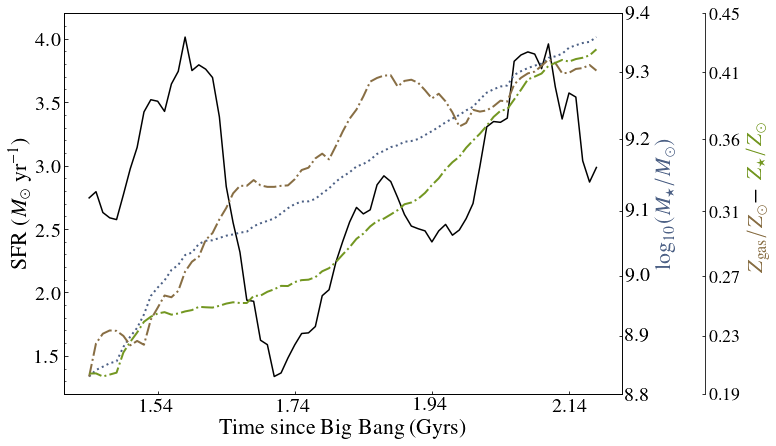

In [6]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (10,7))
gs = GridSpec(8, 8)
ax_main =ax1

ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR')
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 22)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 22)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 20)
ax_main.tick_params(axis='y', which='major', labelsize=20)

ax_main.set_ylim(1.2, 4.2)
dd = ax_main.get_yticks()
# dd = ax_main.get_yticklabels()

# print(dd)
# a = ax.get_xticklabels() 
# print(*a)
xq = np.log10(Mstar)
xqm = gaussian_filter(xq, sigma = 0)
xqm2 = xqm.copy()
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)

ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =2, 
             color = cb_colors[1], label = 'EW(Si II)')

twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]
twin1.set_ylim(ax_main.get_ylim())
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
# twin1.set_ylim(np.min(SFR100), 4.2)
# twin1.set_yscale('log')

twin1.set_ylabel(r'log$_{10}(M_\star/M_\odot)$', fontsize = 22, labelpad = 5)
twin1.yaxis.label.set_color('k')
dd= [1.2, 1.66,2.13, 2.643, 3.209, 3.735,4.2]
twin1.set_yticks(dd)
# twin1.set_yticks(dd)

twin1.set_yticklabels(tick_function(dd), size = 20)
twin1.yaxis.label.set_color(cb_colors[1])
twin1.minorticks_off()

xq = abs(Zgas)
xqm = gaussian_filter(xq,sigma = 0)
xqm2=xqm.copy()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(0.43 - 0.2)  + 0.2 
    return ["%.2f" % z for z in V]

xqm = ((xqm - np.min(xqm))/(0.43 - 0.2))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
             color = cb_colors[2], label = r'$-v_{\rm cen}$(Si II)')
twin2 = ax_main.twinx()
twin2.set_ylim(ax_main.get_ylim())

twin2.spines['right'].set_position(("axes", 1.15))
# twin2.set_ylabel(r'$Z_{\rm gas}/Z_\odot$ $--$ \textcolor{blue}{ddddddd}', fontsize = 20, labelpad = 5)
twin2.yaxis.label.set_color('k')
dd= [1.2, 1.66,2.13, 2.643, 3.209, 3.735,4.2]
twin2.set_yticks(dd)
# twin1.set_yticks(dd)

twin2.set_yticklabels(tick_function(dd), size = 18)
# twin2.yaxis.label.set_color(cb_colors[2])
twin2.minorticks_off()

# dd = ax_main.get_yticks()
xqm3 = abs(Zstar)
xqm = ((xqm3 - np.min(xqm3))/(0.43 - 0.2))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2,
             color = cb_colors[0], label = '$|$EW(Si II*)$|$')


label_x = 186

twin2.text(label_x, 2.2, r'$Z_{\rm gas}/Z_\odot$', color=cb_colors[2], rotation='vertical',fontsize = 22)
twin2.text(label_x-1, 2.75, r"$-$", color='k', rotation='vertical',  fontsize = 25)
twin2.text(label_x, 2.92, r"$Z_{\star}/Z_\odot$", color=cb_colors[0], rotation='vertical', fontsize = 22)

# twin2.set_ylim(0.4, 4.2)
# twin2.set_yticks([0.5,1.64,4.2])
# twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
# twin2.set_ylabel('Velocity', fontsize = 20, labelpad =-10)
# twin2.yaxis.label.set_color('k')


# xq = abs(1-RSiIIdep)
# xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), xqm, linestyle = '--', linewidth =2,
#              color = cb_colors[4], label = '$1-R_f$(Si II)')


# ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= (0,1))



# print(f'Galaxies in output 148: {np.sum(allOutnoFS==148)}')
# print(f'Galaxies in output 149: {np.sum(allOutnoFS==149)}')
# print(f'Galaxies in output 150: {np.sum(allOutnoFS==150)}')
# print(f'Galaxies in output 151: {np.sum(allOutnoFS==151)}')
# print(f'Galaxies in output 152: {np.sum(allOutnoFS==151)}')

plt.savefig('Plots/VirtualGalprop.pdf', bbox_inches = 'tight')

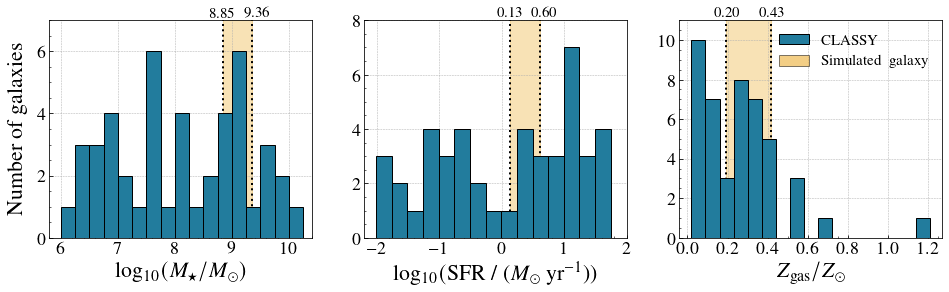

<Figure size 432x288 with 0 Axes>

In [7]:
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (16,4))
# ax1.fill_betweenx([0,8], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)), color='#4682B4', alpha = 0.3)
# ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= '#4682B4', lw =2)
# ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='#4682B4', lw = 2)


# def make_legend_arrow(legend, orig_handle, xdescent, ydescent,width, height, fontsize):
#     p =mpatches.FancyArrow(0, 0.5*height, width, 0, length_includes_head=True, head_width=6., head_length = 0.1 )
#     return p
# arrow = plt.arrow(0,0, 0.5, 0.6,  label='My label', )
# p1 = patches.FancyArrowPatch((0, 0), (1, 1), arrowstyle='<->', mutation_scale=20)

# ax1.legend(handles = [p1], labels = ['My label'])

def make_legend_arrow(legend, orig_handle,
                      xdescent, ydescent, width, height,
                       fontsize):

    p = mpatches.FancyArrowPatch((0,5), (30,5), arrowstyle='|-|', mutation_scale=4,)
                           
    
    return p

f = plt.figure()
an = mpatches.Patch(facecolor='#E99F0C', edgecolor = 'k', lw =1, alpha = 0.5)# mpatches.FancyArrowPatch((1, 2), (2, 2), arrowstyle='|-|', mutation_scale=20, lw = 2)
red_patch = mpatches.Patch(facecolor='#227C9D', edgecolor = 'k', lw =1)

ax3.legend(handles=[red_patch,an], 
           labels=['CLASSY','Simulated \\ galaxy' ], 
           ncol = 1, loc = 'upper right', fontsize = 15, frameon = False)


ax3.fill_betweenx([0,12.3], x1 = np.min(Zstar), x2 = np.max(Zstar), color='#E99F0C', alpha = 0.3)
ax3.axvline(np.min(Zstar), ls = ':', c= 'k', lw =2)
ax3.axvline(np.max(Zstar), ls = ':',c='k', lw = 2)
ax3.hist(classy['Zstell'],bins=np.arange(np.min(classy['Zstell']),np.max(classy['Zstell'])+0.025,0.07),align='mid',  
         alpha = 1, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', zorder =5)
# ax3.vlines([np.min( np.min(Zstar)),  np.max(Zstar)],10.17,10.73, lw = 2, color= 'k' )
# ax3.hlines([10.45,10.45], np.min(Zstar),  np.max(Zstar), lw = 2, color= 'k' )
ax3.set_ylim(0,11)
spacing = 0.25 # This can be your user specified spacing. 
from matplotlib.ticker import MultipleLocator
minorLocator = MultipleLocator(spacing)
# Set minor tick locations.
ax3.xaxis.set_minor_locator(minorLocator)
ax3.grid(linestyle = '--', linewidth = 0.5)
# ax3.grid(axis='x',which = 'minor')
ax3.set_xlabel(r'$Z_{\rm gas}/Z_\odot$', fontsize = 22)
ax3.set_xticks([0,0.2,0.4,0.6,0.8,1,1.2])
ax3.text( np.min(Zstar)-0.06, 11.18,  '0.20', rotation = 0)
ax3.text( np.max(Zstar)-0.06, 11.18,  0.43, rotation = 0)
ax3.tick_params(axis='both', which='major', labelsize=18)


# handler_map={mpatches.FancyArrowPatch : HandlerPatch(patch_func=make_legend_arrow),                 },
ax2.fill_betweenx([0,8.3], x1 = np.min(np.log10(SFR100)), x2 =  np.log10(np.max(SFR100)), color='#E99F0C', alpha = 0.3)
ax2.axvline(np.min(np.log10(SFR100)), ls = ':', c= 'k', lw =2)
ax2.axvline( np.log10(np.max(SFR100)), ls = ':',c='k', lw = 2)
ax2.hist(classy['SFRTot'],bins=np.arange(np.min(classy['SFRTot']),np.max(classy['SFRTot'])+0.15,0.25),align='mid',  
         alpha = 1, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', zorder =5)
# ax2.vlines([np.min(np.log10(SFR100)),  np.log10(np.max(SFR100))],7.35,7.75, lw = 2, color= 'k' )
# ax2.hlines([7.55,7.55], np.log10(np.min(SFR100)),  np.log10(np.max(SFR100)), lw = 2, color= 'k' )
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
ax2.set_ylim(0,8)
ax2.grid(linestyle = '--', linewidth = 0.5)
ax2.set_xlabel(r'log$_{10}($SFR / ($M_\odot$ yr$^{-1}$))', fontsize = 22)
ax2.text( np.log10(np.min(SFR100))-0.2, 8.13, np.round(np.log10(np.min(SFR100)),2), rotation = 0)
ax2.text( np.log10(np.max(SFR100))-0.13, 8.13,  f'{np.round(np.log10(np.max(SFR100)),2):0.2f}', rotation = 0)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.set_xticks([-2,  -1, 0,1,2])

ahist = ax1.hist(classy['MstarTot'],bins=np.arange(6,10.75,0.25),align='mid',  alpha = 1,
             edgecolor = 'k',color = '#227C9D', zorder =5, lw = 1)
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
# ax1.vlines([np.min(np.log10(Mstar)), np.max(np.log10(Mstar))],6.37,6.73, lw = 2, color= 'k' )
# ax1.hlines([6.55,6.55],np.min(np.log10(Mstar)), np.max(np.log10(Mstar)), lw = 2, color= 'k' )
ax1.set_xlabel(r'log$_{10}(M_\star/M_\odot)$', fontsize = 22)
ax1.set_ylabel(r'Number of galaxies', fontsize = 22, labelpad = 10)
ax1.set_ylim(0,7.)
ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)
# an = ax1.annotate('', xy=(np.min(np.log10(Mstar)), 7.),
#              xycoords='data',
#              xytext=(np.max(np.log10(Mstar)),  7.),
#              textcoords='data',
#              arrowprops=dict(arrowstyle= '|-|',
#                              color='k',
#                              lw=2,
#                              mutation_scale=5,)
#            )
# p = mpatches.FancyArrowPatch(posA = (0,1), posB = (1,1), arrowstyle= '|-|' )
# ax1.legend([p],labels =  ['yeah'])
ax1.text( np.log10(np.min(Mstar))-0.25, 7.1, f'{np.round(np.log10(np.min(Mstar)),2):0.2f}', rotation = 0)
ax1.text( np.log10(np.max(Mstar))-0.15, 7.1,  f'{np.round(np.log10(np.max(Mstar)),2):0.2f}', rotation = 0)
ax1.fill_betweenx([0,7.5], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
                  color='#E99F0C', alpha = 0.3)
ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)


fig.savefig('Plots/VirtualGalClassyprop.pdf', bbox_inches = 'tight')

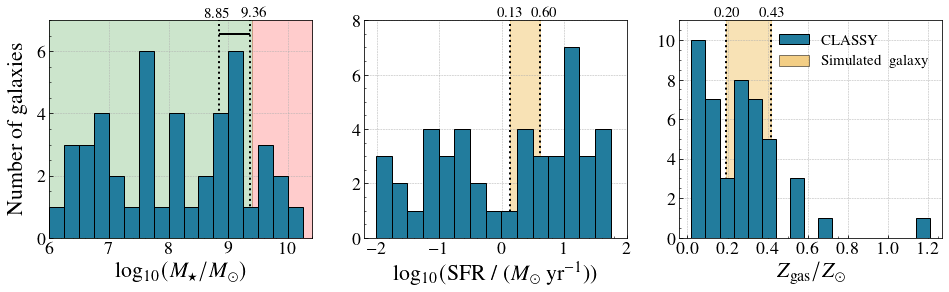

<Figure size 432x288 with 0 Axes>

In [14]:
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (16,4))
# ax1.fill_betweenx([0,8], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)), color='#4682B4', alpha = 0.3)
# ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= '#4682B4', lw =2)
# ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='#4682B4', lw = 2)


# def make_legend_arrow(legend, orig_handle, xdescent, ydescent,width, height, fontsize):
#     p =mpatches.FancyArrow(0, 0.5*height, width, 0, length_includes_head=True, head_width=6., head_length = 0.1 )
#     return p
# arrow = plt.arrow(0,0, 0.5, 0.6,  label='My label', )
# p1 = patches.FancyArrowPatch((0, 0), (1, 1), arrowstyle='<->', mutation_scale=20)

# ax1.legend(handles = [p1], labels = ['My label'])

def make_legend_arrow(legend, orig_handle,
                      xdescent, ydescent, width, height,
                       fontsize):

    p = mpatches.FancyArrowPatch((0,5), (30,5), arrowstyle='|-|', mutation_scale=4,)
                           
    
    return p

f = plt.figure()
an = mpatches.Patch(facecolor='#E99F0C', edgecolor = 'k', lw =1, alpha = 0.5)# mpatches.FancyArrowPatch((1, 2), (2, 2), arrowstyle='|-|', mutation_scale=20, lw = 2)
red_patch = mpatches.Patch(facecolor='#227C9D', edgecolor = 'k', lw =1)

ax3.legend(handles=[red_patch,an], 
           labels=['CLASSY','Simulated \\ galaxy' ], 
           ncol = 1, loc = 'upper right', fontsize = 15, frameon = False)


ax3.fill_betweenx([0,12.3], x1 = np.min(Zstar), x2 = np.max(Zstar), color='#E99F0C', alpha = 0.3)

ax3.axvline(np.min(Zstar), ls = ':', c= 'k', lw =2)
ax3.axvline(np.max(Zstar), ls = ':',c='k', lw = 2)
ax3.hist(classy['Zstell'],bins=np.arange(np.min(classy['Zstell']),np.max(classy['Zstell'])+0.025,0.07),align='mid',  
         alpha = 1, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', zorder =5)
# ax3.vlines([np.min( np.min(Zstar)),  np.max(Zstar)],10.17,10.73, lw = 2, color= 'k' )
# ax3.hlines([10.45,10.45], np.min(Zstar),  np.max(Zstar), lw = 2, color= 'k' )
ax3.set_ylim(0,11)
spacing = 0.25 # This can be your user specified spacing. 
from matplotlib.ticker import MultipleLocator
minorLocator = MultipleLocator(spacing)
# Set minor tick locations.
ax3.xaxis.set_minor_locator(minorLocator)
ax3.grid(linestyle = '--', linewidth = 0.5)
# ax3.grid(axis='x',which = 'minor')
ax3.set_xlabel(r'$Z_{\rm gas}/Z_\odot$', fontsize = 22)
ax3.set_xticks([0,0.2,0.4,0.6,0.8,1,1.2])
ax3.text( np.min(Zstar)-0.06, 11.18,  '0.20', rotation = 0)
ax3.text( np.max(Zstar)-0.06, 11.18,  0.43, rotation = 0)
ax3.tick_params(axis='both', which='major', labelsize=18)


# handler_map={mpatches.FancyArrowPatch : HandlerPatch(patch_func=make_legend_arrow),                 },
ax2.fill_betweenx([0,8.3], x1 = np.min(np.log10(SFR100)), x2 =  np.log10(np.max(SFR100)), color='#E99F0C', alpha = 0.3)
ax2.axvline(np.min(np.log10(SFR100)), ls = ':', c= 'k', lw =2)
ax2.axvline( np.log10(np.max(SFR100)), ls = ':',c='k', lw = 2)
ax2.hist(classy['SFRTot'],bins=np.arange(np.min(classy['SFRTot']),np.max(classy['SFRTot'])+0.15,0.25),align='mid',  
         alpha = 1, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', zorder =5)
# ax2.vlines([np.min(np.log10(SFR100)),  np.log10(np.max(SFR100))],7.35,7.75, lw = 2, color= 'k' )
# ax2.hlines([7.55,7.55], np.log10(np.min(SFR100)),  np.log10(np.max(SFR100)), lw = 2, color= 'k' )
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
ax2.set_ylim(0,8)
ax2.grid(linestyle = '--', linewidth = 0.5)
ax2.set_xlabel(r'log$_{10}($SFR / ($M_\odot$ yr$^{-1}$))', fontsize = 22)
ax2.text( np.log10(np.min(SFR100))-0.2, 8.13, np.round(np.log10(np.min(SFR100)),2), rotation = 0)
ax2.text( np.log10(np.max(SFR100))-0.13, 8.13,  f'{np.round(np.log10(np.max(SFR100)),2):0.2f}', rotation = 0)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.set_xticks([-2,  -1, 0,1,2])

ahist = ax1.hist(classy['MstarTot'],bins=np.arange(6,10.75,0.25),align='mid',  alpha = 1,
             edgecolor = 'k',color = '#227C9D', zorder =5, lw = 1)
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
# ax1.vlines([np.min(np.log10(Mstar)), np.max(np.log10(Mstar))],6.37,6.73, lw = 2, color= 'k' )
ax1.hlines([6.55,6.55],np.min(np.log10(Mstar)), np.max(np.log10(Mstar)), lw = 2, color= 'k' )
ax1.fill_betweenx([0,7.5], x1 = 6, x2 = 9.4, color='g', alpha = 0.2)
ax1.fill_betweenx([0,7.5], x1 = 9.4, x2 = 11, color='r', alpha = 0.2)

ax1.set_xlabel(r'log$_{10}(M_\star/M_\odot)$', fontsize = 22)
ax1.set_ylabel(r'Number of galaxies', fontsize = 22, labelpad = 10)
ax1.set_ylim(0,7.)
ax1.set_xlim(6,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)
# an = ax1.annotate('', xy=(np.min(np.log10(Mstar)), 7.),
#              xycoords='data',
#              xytext=(np.max(np.log10(Mstar)),  7.),
#              textcoords='data',
#              arrowprops=dict(arrowstyle= '|-|',
#                              color='k',
#                              lw=2,
#                              mutation_scale=5,)
#            )
# p = mpatches.FancyArrowPatch(posA = (0,1), posB = (1,1), arrowstyle= '|-|' )
# ax1.legend([p],labels =  ['yeah'])
ax1.text( np.log10(np.min(Mstar))-0.25, 7.1, f'{np.round(np.log10(np.min(Mstar)),2):0.2f}', rotation = 0)
ax1.text( np.log10(np.max(Mstar))-0.15, 7.1,  f'{np.round(np.log10(np.max(Mstar)),2):0.2f}', rotation = 0)
# ax1.fill_betweenx([0,7.5], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
#                   color='#E99F0C', alpha = 0.3)
ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)


# fig.savefig('Plots/VirtualGalClassyprop.pdf', bbox_inches = 'tight')

# Comparison simulation to CLASSY 

## Picture showing measurementa

114 117
-88.2678012529601


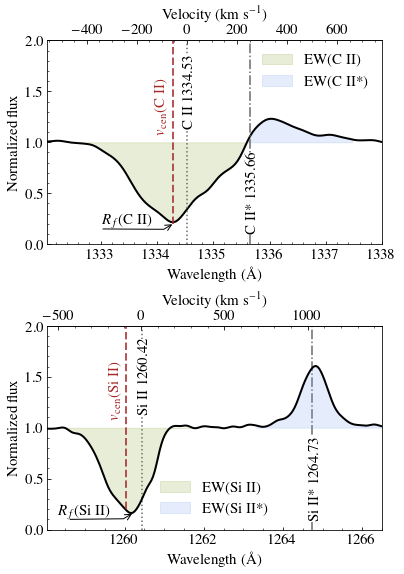

In [329]:
fig, (ax1,ax2) = plt.subplots(2,1, figsize = (6,9))
plt.subplots_adjust(hspace = 0.4)
bestDir =114# np.random.randint(0, high = 300)
bestOut = 117#np.random.randint(90, high = 165)
print(bestDir, bestOut)
path_to_data2 = './CII_SiII_depletion/' 

lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )

lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
lcII_systemic  = lcII_systemic[1:] -0.2
vcII_s         = (lcII_systemic/wcII1334 -1)*c
sigma_pixelcii = 60 / 2.355/((vcII_s[50]-vcII_s[49]))
modelNewcii    = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)


rmedCII = ((vcII_s<-600) | (vcII_s > 700)) 
fmedCII = np.nanmedian(modelNewcii[rmedCII])
modelNewcii /= fmedCII
ax1.plot(lcII_systemic, modelNewcii, c ='k', lw = 2)
ax1.fill_between(lcII_systemic[(lcII_systemic> wcII1334-2)& (lcII_systemic< wcII1334+2)& (modelNewcii<1)],
                 np.ones(len(lcII_systemic[(lcII_systemic> wcII1334-2)& (lcII_systemic< wcII1334+2) & (modelNewcii<1)])),
                 modelNewcii[(lcII_systemic> wcII1334-2)& (lcII_systemic< wcII1334+2)& (modelNewcii<1)], alpha = 0.2,
                label = 'EW(C II)', color= cnoFS)
ax1.fill_between(lcII_systemic[(vcII_s> offcIIfluo1335-400)& (vcII_s<  offcIIfluo1335+400)& (modelNewcii>1)],
                 np.ones(len(lcII_systemic[(vcII_s> offcIIfluo1335-400)& (vcII_s<  offcIIfluo1335+400)& (modelNewcii>1)])),
                 modelNewcii[(vcII_s> offcIIfluo1335-400)& (vcII_s<  offcIIfluo1335+400)& (modelNewcii>1)], alpha = 0.2,
                label = 'EW(C II*)', color= cFS)
ax1.axvline(wcII1334, c = 'dimgray', ls = ':')
ax1.axvline(1335.66, c = 'dimgray', ls = '-.')
ax1.set_ylim(0, 2)

ax1.set_xlim(1332.05, 1338)
ax1.set_xlabel(r'Wavelength (\AA)')
ax1.set_ylabel(r'Normalized flux')
ax1.annotate("",
            xy=(1334.35, 0.22), xycoords='data',
            xytext=(1332.95, 0.15), textcoords='data',
            arrowprops=dict(arrowstyle="->", color="k",
                            shrinkA=5, shrinkB=5,
                            patchA=None, patchB=None,
                            connectionstyle="arc,angleA=40,angleB=30,armA=0,armB=-15,rad=0",
                            ),
                            )
ax1.text(1333.,0.2,r'$R_f$(C II)', color='k', fontsize = 15)

v, oo = measureCenV(vcII_s, modelNewcii, np.zeros(len(modelNewcii)), -500, 300 )
ax1.text(wcII1334-0.1, 1.5, "C II 1334.53", fontsize = 15,
         rotation=90, verticalalignment='center', bbox=dict(facecolor='white', edgecolor='white', pad = -1))

ax1.text(1335.66-0.1, 0.5, "C II* 1335.66", fontsize = 15, rotation=90, verticalalignment='center', bbox=dict(facecolor='white', edgecolor='white', pad = -1))
ax1.legend(frameon = False, loc = 'upper right')
def deg2rad(x):
    return (x -wcII1334)/wcII1334  * c


def rad2deg(x):
    return x /c * wcII1334 + wcII1334
ax1.axvline(rad2deg(v), ymin = 0.1, ymax = 1, c = 'brown', ls = '--', 
             lw = 2, alpha = 0.8)
ax1.text(rad2deg(v)-0.33,1.1,r'$v_{\rm cen}$(C II)', color='brown', fontsize = 15, rotation = 90)




secax = ax1.secondary_xaxis('top', functions=(deg2rad, rad2deg))
secax.set_xlabel(r'Velocity (km s$^{-1}$)')


           #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))


    ## Si II plot
lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
lsiII_systemic = lsiII_systemic[1:]-0.2
vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
sigma_pixelsi  = 60/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
modelNewsi          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
rmedSiII = ((vsiII_s<-600) | ((vsiII_s > 300) & (vsiII_s < 500)))
fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
modelNewsi /= fmedSiII  
ax2.plot(lsiII_systemic, modelNewsi, c ='k', lw = 2)
ax2.axvline(wsiII1260+0.02, c = 'dimgray', ls = ':', zorder = 0)
ax2.axvline(1264.73, c = 'dimgray', ls = '-.', zorder = 0)
ax2.set_ylim(0, 2)

ax2.set_xlim(1258.05, 1266.5)

ax2.fill_between(lsiII_systemic[(lsiII_systemic> wsiII1260-2)& (lsiII_systemic< wsiII1260+2)& (modelNewsi<1)],
                 np.ones(len(lsiII_systemic[(lsiII_systemic> wsiII1260-2)& (lsiII_systemic< wsiII1260+2) & (modelNewsi<1)])),
                 modelNewsi[(lsiII_systemic> wsiII1260-2)& (lsiII_systemic< wsiII1260+2)& (modelNewsi<1)], alpha = 0.2,
                label = 'EW(Si II)', color= cnoFS)
ax2.fill_between(lsiII_systemic[(vsiII_s> offsiIIfluo1265-400)& (vsiII_s<  offsiIIfluo1265+400)& (modelNewsi>1)],
                 np.ones(len(lsiII_systemic[(vsiII_s> offsiIIfluo1265-400)& (vsiII_s<  offsiIIfluo1265+400)& (modelNewsi>1)])),
                 modelNewsi[(vsiII_s> offsiIIfluo1265-400)& (vsiII_s<  offsiIIfluo1265+400)& (modelNewsi>1)], alpha = 0.2,
                label = 'EW(Si II*)', color= cFS)
# \
ax2.text(wsiII1260-0.1, 1.5, "Si II 1260.42", fontsize = 15,
         rotation=90, verticalalignment='center', bbox=dict(facecolor='white', edgecolor='white', pad = -1))

ax2.text(1264.73-0.1, 0.5, "Si II* 1264.73", fontsize = 15, rotation=90, verticalalignment='center', bbox=dict(facecolor='white', edgecolor='white', pad = -1))
ax2.set_xlabel(r'Wavelength (\AA)')
ax2.set_ylabel(r'Normalized flux')
ax2.annotate("",
            xy=(1260.3, 0.18), xycoords='data',
            xytext=(1258.5, 0.10), textcoords='data',
            arrowprops=dict(arrowstyle="->", color="k",
                            shrinkA=5, shrinkB=5,
                            patchA=None, patchB=None,
                            connectionstyle="arc,angleA=40,angleB=30,armA=0,armB=-15,rad=0",
                            ),
                            )
ax2.text(1258.3,0.14,r'$R_f$(Si II)', color='k', fontsize = 15)

v, oo = measureCenV(vsiII_s, modelNewsi, np.zeros(len(modelNewsi)), -500, 300 )
print(v)
def deg2rad(x):
    return (x -wsiII1260)/wsiII1260  * c


def rad2deg(x):
    return x /c * wsiII1260 + wsiII1260

ax2.axvline(rad2deg(v), ymin = 0.1, ymax = 1, c = 'brown', ls = '--', 
             lw = 2, alpha = 0.8)
ax2.legend(frameon = False)
# ax2.annotate("",
#             xy=(rad2deg(v), 2), xycoords='data',
#             xytext=(rad2deg(v)-1.7, 1.7), textcoords='data',
#             arrowprops=dict(arrowstyle="->", color="brown",
#                             shrinkA=5, shrinkB=5,
#                             patchA=None, patchB=None,
#                             connectionstyle="arc,angleA=40,angleB=60,armA=0,armB=-35,rad=0",
#                             ),
#                             )
ax2.text(rad2deg(v)-0.45,1.1,r'$v_{\rm cen}$(Si II)', color='brown', fontsize = 15, rotation = 90)
secax = ax2.secondary_xaxis('top', functions=(deg2rad
                                              , rad2deg))
secax.set_xlabel(r'Velocity (km s$^{-1}$)')
fig.savefig('Plots/Measurementsexample.pdf', bbox_inches = 'tight')

## GLobal properties


ValueError: 'xerr' must not contain negative values

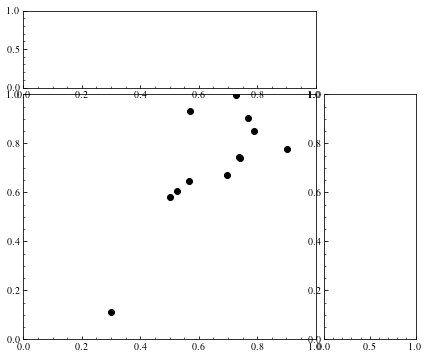

In [7]:
# cb_colors = ["#FFC15E", "#F7B05B", "#F7934C", "#CC5803", "#1F1300"]
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

mstarAll = np.zeros((75,300))
for i in range(75):
#     print(Mstar[i])
    mstarAll[i,:] += np.log10(Mstar[i])
vmin = np.min(mstarAll.flatten()[:])
vmax = np.max(mstarAll.flatten()[:])
vmin = np.min(classy['MstarTot'])
vmax = np.max(classy['MstarTot'])
maskIt = (~np.isnan(ClassAbs['EWSiII']))&(~np.isnan(ClassAbs['EWCII']))

fig = plt.figure(figsize=(16,13))
gs = GridSpec(17, 18)
ax_main = plt.subplot(gs[2:8, :6])
ax_xDist = plt.subplot(gs[0:2, :6],sharex=ax_main)
ax_yDist = plt.subplot(gs[2:8, 6:8],sharey=ax_main)
maskInc = np.zeros(len(ClassAbs['EWSiII'])).astype('bool')
# ax_main.scatter(ClassAbs['EWSiII'], ClassAbs['EWCII'], marker='.')
# ax_main.errorbar(-ClassAbs['EWSiII'][maskInc], -ClassAbs['EWCII'][maskInc], 
#                 xerr = -ClassAbs['ErrEWSiII'][maskInc], yerr = -ClassAbs['ErrEWCII'][maskInc],
#                 label = 'CLASSY - Excluded', c = 'k', linestyle = 'None', marker = 's', markeredgecolor = 'k')
# ax_main.scatter(-ClassAbs['EWSiII'][maskInc], -ClassAbs['EWCII'][maskInc], c = classy['MstarTot'][maskInc],
#                 marker = 's', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)
ax_main.errorbar(-ClassAbs['EWSiII'][~maskInc], -ClassAbs['EWCII'][~maskInc], 
                xerr = -ClassAbs['ErrEWSiII'][~maskInc], yerr = -ClassAbs['ErrEWCII'][~maskInc],
                label = 'CLASSY', linestyle = 'None', marker = 'o',c='k', markeredgecolor = 'k')
ax_main.scatter(-ClassAbs['EWSiII'][~maskInc], -ClassAbs['EWCII'][~maskInc], c = classy['MstarTot'][~maskInc],
                marker = 'o', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)
ax_main.set(xlabel="x data", ylabel="y data")
ax_main.plot(np.linspace(-0.1,3.8),np.linspace(-0.1,3.8), linestyle = '--', c = 'k', label='1-1 line')

cm = ax_main.scatter( -np.flip(EWabsSiIIdep.flatten()[:]), -np.flip(EWabsCIIdep.flatten()[:]), zorder = 0, marker = '+', 
                  c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax, label = 'Simulation')
ax_xDist.hist(-ClassAbs['EWSiII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.3, label = 'CLASSY',
             edgecolor = '#1C1C1C',color = '#1C1C1C', )
ax_xDist.hist(-np.flip(EWabsSiIIdep.flatten()[:]),bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = '#ECEBE4',)
ax_xDist.axis(False)
ax_xDist.legend(frameon = False)

ax_yDist.hist(-ClassAbs['EWCII'],bins=np.linspace(0,4,20),orientation='horizontal',align='mid', density=True, alpha = 0.3, 
              edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_yDist.hist(-np.flip(EWabsCIIdep.flatten()[:]),bins=np.linspace(0,4,20),orientation='horizontal',align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')
# ax_main.scatter(-np.median(EWabsSiIIdep[::2],axis=1),   - np.median(EWabsCIIdep[::2],axis=1), 
#                 c =np.log10(Mstar[::2])
#                 , vmin = vmin, vmax = vmax, marker = 'd', cmap = cmap)
# h,xx,yy = np.histogram2d( -np.flip(EWabsCIIdep.flatten()[:]),-np.flip(EWabsSiIIdep.flatten()[:]),
#                          bins=np.linspace(0,4,40), density=True)
# ax_main.contour(xx[:-1],yy[:-1],h, levels = [0.3,0.93, 0.999])
# ax_yDist.set(xlabel='count')
ax_yDist.axis(False)
ax_main.set_xlabel(r'EW(Si II) ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'EW(C II) ($\rm \AA$)', fontsize = 20)
ax_main.set_xlim(-0.05,4)
ax_main.set_ylim(-0.05,4)

line0 = Line2D([0], [0], label='1-1 lines', marker='None', linestyle='--', color='k')    
line1 = Line2D([], [], label='Simulation', marker='+', linestyle='None', color='w',markeredgecolor = 'k')    
# line2 = Line2D([], [], label='CLASSY - Excluded', marker='s', linestyle='None', color='w',markeredgecolor = 'k')
line3 = Line2D([], [], label='CLASSY - Included', marker='o', linestyle='None', color='w',markeredgecolor = 'k')
labels = ['1-1 line','Simulation','CLASSY']
ll = ax_main.legend([line0,line1,line3], labels,frameon = False, fontsize = 14, loc = 'upper left')
# ll.legendHandles[1]._sizes = [60,60,60,60]
ax_main.tick_params(axis='both', which='major', labelsize=18)
ax_main.set_yticks([0,1,2,3,4])

plt.subplots_adjust(wspace=0, hspace=0)
plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)

ax_main = plt.subplot(gs[11:17, :6])
ax_xDist = plt.subplot(gs[9:11, :6],sharex=ax_main)
ax_yDist = plt.subplot(gs[11:17, 6:8],sharey=ax_main)


# ax_main.scatter(ClassAbs['EWSiII'], ClassAbs['EWCII'], marker='.')
ax_main.errorbar(ClassAbs['RSiII'][maskInc], ClassAbs['RCII'][maskInc], 
                xerr = ClassAbs['ErrRSiII'][maskInc], yerr = ClassAbs['ErrRCII'][maskInc],
                label = 'CLASSY - Excluded', c = 'k', linestyle = 'None', marker = 's', markeredgecolor = 'k')
ax_main.scatter(ClassAbs['RSiII'][maskInc], ClassAbs['RCII'][maskInc], c = classy['MstarTot'][maskInc],
                marker = 's', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)
ax_main.errorbar(ClassAbs['RSiII'][~maskInc], ClassAbs['RCII'][~maskInc], 
                xerr = ClassAbs['ErrRSiII'][~maskInc], yerr = ClassAbs['ErrRCII'][~maskInc],
                label = 'CLASSY - Included', linestyle = 'None', marker = 'o',c='k', markeredgecolor = 'k')
ax_main.scatter(ClassAbs['RSiII'][~maskInc], ClassAbs['RCII'][~maskInc], c = classy['MstarTot'][~maskInc],
                marker = 'o', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)

ax_main.set_xlabel(r'$R_f$(Si II)', fontsize = 20)
ax_main.set_ylabel(r'$R_f$(C II)', fontsize = 20)

ax_main.plot(np.linspace(-1,1.07),np.linspace(-1,1.07), linestyle = '--', c = 'k', label='1-1 line')

cm = ax_main.scatter( np.flip(RSiIIdep.flatten()[:]), np.flip(RCIIdep.flatten()[:]), zorder = 0, marker = '+', 
                  c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax)
    
ax_xDist.hist(ClassAbs['RSiII'],bins=np.linspace(0,1,20),align='mid', density=True, alpha = 0.3, label = 'CLASSY', 
             edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_xDist.hist(np.flip(RSiIIdep.flatten()[:]),bins=np.linspace(0,1,20),align='mid', density=True,   alpha =0.5,    
              edgecolor = 'k', color = '#ECEBE4')
ax_xDist.axis(False)
# ax_xDist.legend(frameon 
# = False)

ax_yDist.hist(ClassAbs['RCII'],bins=np.linspace(0,1,20),orientation='horizontal',align='mid', density=True, alpha = 0.3,
             edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_yDist.hist(np.flip(RCIIdep.flatten()[:]),bins=np.linspace(0,1,20),orientation='horizontal',align='mid', density=True, 
               alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')

ax_yDist.axis(False)
ax_main.set_xlim(-0.05,1.03)
ax_main.set_ylim(-0.05,1.03)
# plt.subplots_adjust(wspace=0, hspace=0)
plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)





ax_main = plt.subplot(gs[2:8, 10:16])
ax_xDist = plt.subplot(gs[0:2, 10:16],sharex=ax_main)
ax_yDist = plt.subplot(gs[2:8, 16:18],sharey=ax_main)


# ax_main.scatter(ClassAbs['EWSiII'], ClassAbs['EWCII'], marker='.')
ax_main.errorbar(ClassFluo['EWFluoSiII'][maskInc], ClassFluo['EWFluoCII'][maskInc], 
                xerr = ClassFluo['ErrEWFluoCII'][maskInc], yerr = ClassFluo['ErrEWFluoCII'][maskInc],
                label = 'CLASSY - Excluded', c = 'k', linestyle = 'None', marker = 's', markeredgecolor = 'k')
ax_main.scatter(ClassFluo['EWFluoSiII'][maskInc], ClassFluo['EWFluoCII'][maskInc],  c = classy['MstarTot'][maskInc],
                marker = 's', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)

ax_main.errorbar(ClassFluo['EWFluoSiII'][~maskInc], ClassFluo['EWFluoCII'][~maskInc], 
                xerr = ClassFluo['ErrEWFluoCII'][~maskInc], yerr = ClassFluo['ErrEWFluoCII'][~maskInc],
                label = 'CLASSY - Included', linestyle = 'None', marker = 'o',c='k', markeredgecolor = 'k')
ax_main.scatter(ClassFluo['EWFluoSiII'][~maskInc], ClassFluo['EWFluoCII'][~maskInc],  c = classy['MstarTot'][~maskInc],
                marker = 'o', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)

cm = ax_main.scatter( np.flip(EWemiSiIIdep.flatten()[:]), np.flip(EWemiCIIdep.flatten()[:]), zorder = 0, marker = '+', 
                  c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax)
ax_main.plot(np.linspace(-0.01,1.8),np.linspace(-0.01,1.8), linestyle = '--', c = 'k')
ax_main.set_xlabel(r'$|$EW(Si II*)$|$ ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'$|$EW(C II*)$|$ ($\rm \AA$)', fontsize = 20)

ax_xDist.hist(ClassFluo['EWFluoSiII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = 0.3, label = 'CLASSY', 
             edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_xDist.hist(np.flip(EWemiSiIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),align='mid', density=True, 
                alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')
ax_xDist.axis(False)
# ax_xDist.legend(frameon 
# = False)

ax_yDist.hist(ClassFluo['EWFluoCII'],bins=np.linspace(0,1.3,20),orientation='horizontal',align='mid', density=True, alpha = 0.3,
               edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_yDist.hist(np.flip(EWemiCIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),orientation='horizontal',align='mid', density=True, 
                alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')

ax_yDist.axis(False)
ax_main.set_xlim(-0.05,1.6)
ax_main.set_ylim(-0.05,1.6)
# plt.subplots_adjust(wspace=0, hspace=0)
ax_main.set_yticks([0,0.5,1,1.5])


plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)


ax_main = plt.subplot(gs[11:17, 10:16])
ax_xDist = plt.subplot(gs[9:11, 10:16],sharex=ax_main)
ax_yDist = plt.subplot(gs[11:17, 16:18],sharey=ax_main)

ax_main.errorbar(ClassAbs['VcenSiII'][maskInc], ClassAbs['VcenCII'][maskInc], 
                xerr = ClassAbs['ErrVcenSiII'][maskInc], yerr = ClassAbs['ErrVcenCII'][maskInc],
                label = 'CLASSY - Excluded', c = 'k', linestyle = 'None', marker = 's', markeredgecolor = 'k')
ax_main.scatter(ClassAbs['VcenSiII'][maskInc], ClassAbs['VcenCII'][maskInc], c = classy['MstarTot'][maskInc],
                marker = 's', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)

ax_main.errorbar(ClassAbs['VcenSiII'][~maskInc], ClassAbs['VcenCII'][~maskInc], 
                xerr = ClassAbs['ErrVcenSiII'][~maskInc], yerr = ClassAbs['ErrVcenCII'][~maskInc],
                label = 'CLASSY - Included', linestyle = 'None', marker = 'o',c='k', markeredgecolor = 'k')
ax_main.scatter(ClassAbs['VcenSiII'][~maskInc], ClassAbs['VcenCII'][~maskInc], c = classy['MstarTot'][~maskInc],
                marker = 'o', s = 70, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)

cm = ax_main.scatter( np.flip(VcenSiIIdep.flatten()[:]), np.flip(VcenCIIdep.flatten()[:]), zorder = 0, marker = '+', 
                  c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax)
    
ax_main.plot(np.linspace(-600,200),np.linspace(-600,200), linestyle = '--', c = 'k')

ax_main.set_xlabel(r'$v_{\rm cen}$(Si II) ($\rm km\ s^{-1}$)', fontsize = 20)
ax_main.set_ylabel(r'$v_{\rm cen}$(C II) ($\rm km\ s^{-1}$)', fontsize = 20)
#$\lambda$1260
#$\lambda$1334
ax_xDist.hist(ClassAbs['VcenSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.3, label = 'CLASSY',
             edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_xDist.hist(np.flip(VcenSiIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True, 
                alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')
# ax_xDist.legend(frameon 
# = False)
ax_xDist.axis(False)

ax_yDist.hist( ClassAbs['VcenCII'],bins=np.linspace(-600,150,20),orientation='horizontal',align='mid', density=True, alpha = 0.3, 
               edgecolor = '#1C1C1C',color = '#1C1C1C')
ax_yDist.hist(np.flip(VcenCIIdep.flatten()[:]),bins=np.linspace(-600,150,20),orientation='horizontal',align='mid', density=True, 
                alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')

ax_yDist.axis(False)

ax_main.set_xlim(-600,150)
ax_main.set_ylim(-600,150)
# plt.subplots_adjust(wspace=0, hspace=0)
plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)


# ax_yDist
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.13, 0.02, 0.7])
cbar = fig.colorbar(cm, cax=cbar_ax, orientation='vertical')
cbar.ax.set_title(r'log$_{10}$(M$_{\star}$/M$_\odot$)', fontsize = 20)

# plt.savefig('Plots/GlobalProp_dep.png', bbox_inches = 'tight', dpi = 300)

plt.show()

### Histograms

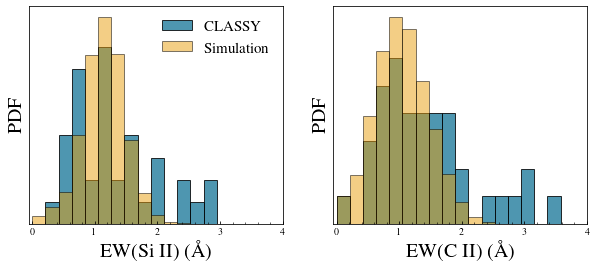

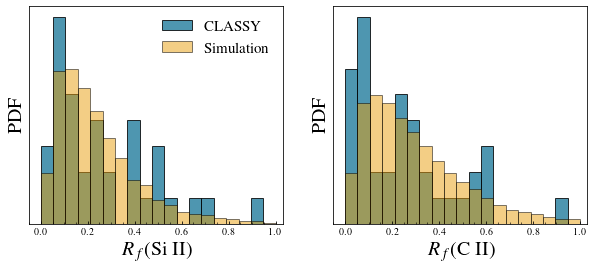

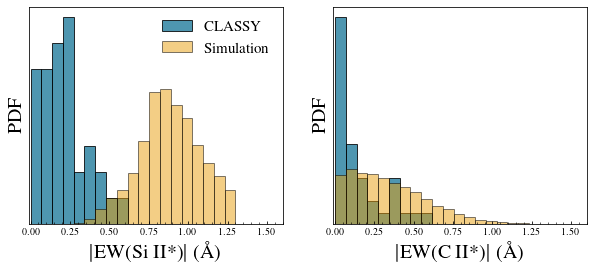

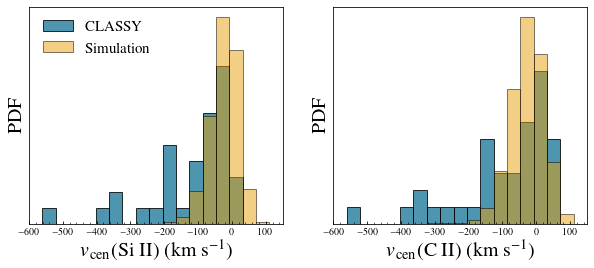

In [8]:
# cb_colors = ["#FFC15E", "#F7B05B", "#F7934C", "#CC5803", "#1F1300"]
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].hist(-ClassAbs['EWSiII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.8, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[0].hist(-np.flip(EWabsSiIIdep.flatten()[:]),bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)

axs[1].hist(-ClassAbs['EWCII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.8, 
              edgecolor = 'k',color = '#227C9D')
axs[1].hist(-np.flip(EWabsCIIdep.flatten()[:]),bins=np.linspace(0,4,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = '#E99F0C')
axs[0].set_xlabel(r'EW(Si II) ($\rm \AA$)', fontsize = 20)
axs[1].set_xlabel(r'EW(C II) ($\rm \AA$)', fontsize = 20)
axs[0].set_xlim(-0.05,4)
axs[1].set_xlim(-0.05,4)
axs[0].legend(frameon = False, fontsize = 15)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[1].set_ylabel(r'PDF', fontsize = 20)
axs[0].set_yticks([])
axs[1].set_yticks([])

fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].hist(ClassAbs['RSiII'],bins=np.linspace(0,1,20),align='mid', density=True, alpha = 0.8, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[0].hist(np.flip(RSiIIdep.flatten()[:]),bins=np.linspace(0,1,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)

axs[1].hist(ClassAbs['RCII'],bins=np.linspace(0,1,20),align='mid', density=True, alpha = 0.8, 
              edgecolor = 'k',color = '#227C9D')
axs[1].hist(np.flip(RCIIdep.flatten()[:]),bins=np.linspace(0,1,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = '#E99F0C')
axs[0].set_xlabel(r'$R_f$(Si II)', fontsize = 20)
axs[1].set_xlabel(r'$R_f$(C II)', fontsize = 20)
axs[0].set_xlim(-0.05,1.03)
axs[1].set_xlim(-0.05,1.03)
axs[0].legend(frameon = False, fontsize = 15)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[1].set_ylabel(r'PDF', fontsize = 20)
axs[0].set_yticks([])
axs[1].set_yticks([])


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].hist(ClassFluo['EWFluoSiII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = 0.8, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[0].hist(np.flip(EWemiSiIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)

axs[1].hist(ClassFluo['EWFluoCII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = 0.8, 
              edgecolor = 'k',color = '#227C9D')
axs[1].hist(np.flip(EWemiCIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = '#E99F0C')
axs[0].set_xlabel(r'$|$EW(Si II*)$|$ ($\rm \AA$)', fontsize = 20)
axs[1].set_xlabel(r'$|$EW(C II*)$|$ ($\rm \AA$)', fontsize = 20)
axs[0].set_xlim(-0.01,1.6)
axs[1].set_xlim(-0.01,1.6)
axs[0].legend(frameon = False, fontsize = 15)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[1].set_ylabel(r'PDF', fontsize = 20)
axs[0].set_yticks([])
axs[1].set_yticks([])

fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].hist(ClassAbs['VcenSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.8, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[0].hist(np.flip(VcenSiIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)

axs[1].hist(ClassAbs['VcenCII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.8, 
              edgecolor = 'k',color = '#227C9D')
axs[1].hist(np.flip(VcenCIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = '#E99F0C')
axs[0].set_xlabel(r'$v_{\rm cen}$(Si II) ($\rm km\ s^{-1}$)', fontsize = 20)
axs[1].set_xlabel(r'$v_{\rm cen}$(C II) ($\rm km\ s^{-1}$)', fontsize = 20)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[1].set_ylabel(r'PDF', fontsize = 20)
axs[0].set_yticks([])
axs[1].set_yticks([])

axs[0].set_xlim(-600,150)
axs[1].set_xlim(-600,150)
axs[0].legend(frameon = False, fontsize = 15)



plt.show()

## Galaxies excluded

In [21]:
maskInc = ((ClassAbs['EWSiII']<-2.5)  & (ClassAbs['EWCII']<-2.5)) | ((ClassAbs['VcenCII']<-300) & (ClassAbs['VcenSiII']<-300))


print(classy['Galaxy'][maskInc])

print(classy['Zstell'][~maskInc].min())

6     J0808+3948
20    J1112+5503
25    J1144+4012
35    J1416+1223
42    J1525+0757
44    J1612+0817
Name: Galaxy, dtype: object
0.02


In [9]:
print(classy['Galaxy'][ClassAbs['RSiII']>0.8])

33    J1323-0132
Name: Galaxy, dtype: object


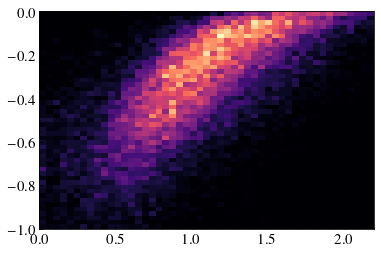

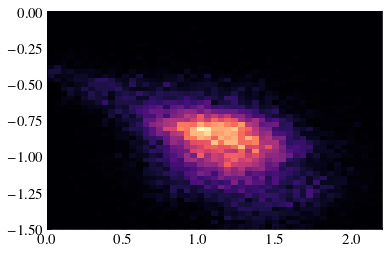

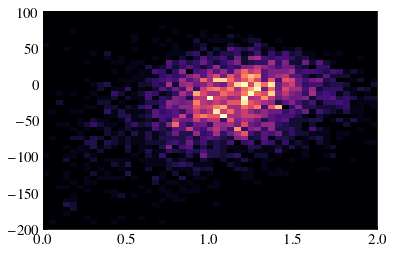

In [1148]:
d=plt.hist2d(np.flip(-EWabsCIIdep.flatten()[:]), np.flip(-EWemiCIIdep.flatten()[:]),bins = [np.linspace(0,2.2), np.linspace(-1,0)], cmap = 'magma')
plt.figure()
d=plt.hist2d(np.flip(-EWabsSiIIdep.flatten()[:]), np.flip(-EWemiSiIIdep.flatten()[:]),bins = [np.linspace(0,2.2), np.linspace(-1.5,0)], cmap = 'magma')


plt.figure()
d=plt.hist2d(np.flip(-EWabsSiIIdep.flatten()[::5]), np.flip(VcenSiIIdep.flatten()[::5]),bins = [np.linspace(0,2.), np.linspace(-200,100)], cmap = 'magma')


# Fits

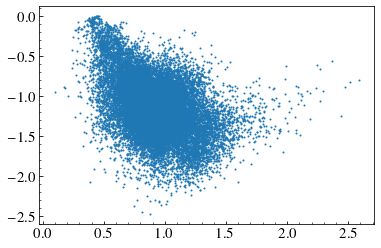

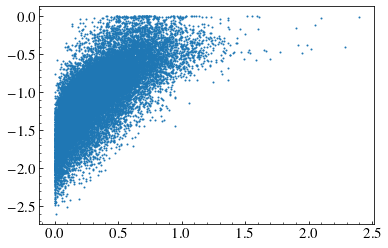

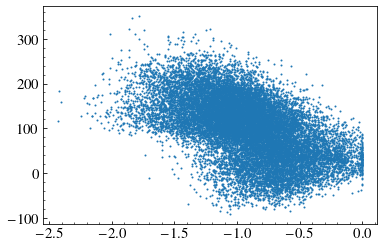

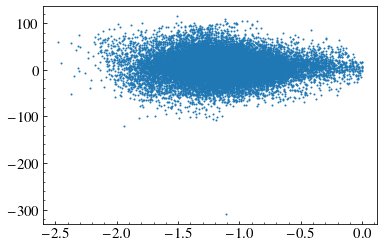

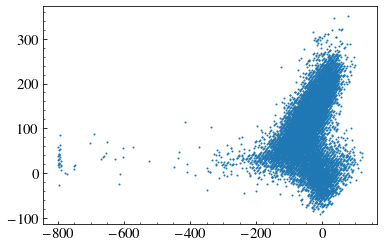

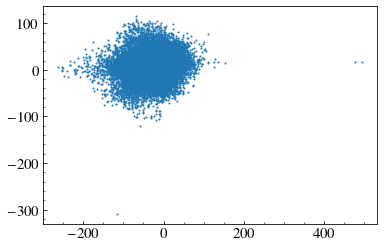

In [889]:
plt.figure()
plt.scatter(EWemiSiIIdep.flatten()[:], EWabsSiIIdep.flatten()[:],s= 1)
plt.figure()
plt.scatter(np.flip(EWemiCIIdep.flatten()[:]), np.flip(EWabsCIIdep.flatten()[:]), s= 1,)

######
plt.figure()
plt.scatter(np.flip(EWabsCIIdep.flatten()[:]), np.flip(VemiCIIdep.flatten()[:]-offcIIfluo1335), s= 1,)
# plt.xlim(-200,200)
plt.figure()
plt.scatter(EWabsSiIIdep.flatten()[:],np.flip(VemiSiIIdep.flatten()[:]-offsiIIfluo1265), s= 1,)

plt.figure()
plt.scatter(np.flip(VcenCIIdep.flatten()[:]), np.flip(VemiCIIdep.flatten()[:]-offcIIfluo1335), s= 1,)
# plt.xlim(-200,200)
plt.figure()
plt.scatter(VcenSiIIdep.flatten()[:],np.flip(VemiSiIIdep.flatten()[:]-offsiIIfluo1265), s= 1,)


-0.4107599547969624 0.0
SpearmanrResult(correlation=0.6533590091130463, pvalue=0.0)
SpearmanrResult(correlation=0.30684905784662725, pvalue=0.0)
SpearmanrResult(correlation=0.34859621878293623, pvalue=0.0)
SpearmanrResult(correlation=0.1293020629938725, pvalue=1.7682309288430806e-84)
SpearmanrResult(correlation=-0.42759303919456754, pvalue=0.0)

SpearmanrResult(correlation=-0.5805487987614211, pvalue=4.770583101936895e-08)
SpearmanrResult(correlation=-0.09381356777005714, pvalue=0.42337988921444747)
[20.76854191]
[60.68494481]


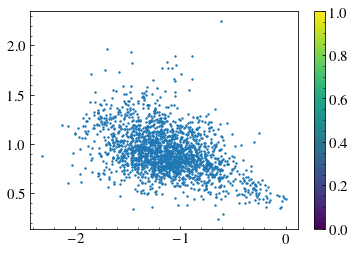

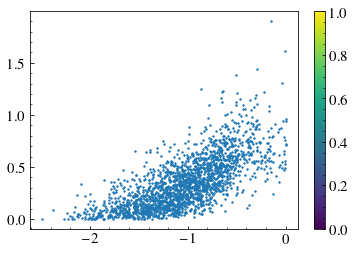

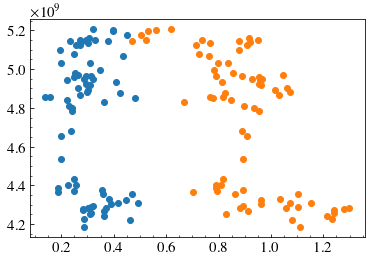

In [994]:

plt.figure()
plt.scatter(EWabsSiIIdep.flatten()[::11], EWemiSiIIdep.flatten()[::11],
            s= 2, cmap = 'magma')
plt.colorbar()
plt.figure()

plt.scatter(EWabsCIIdep.flatten()[::11], EWemiCIIdep.flatten()[::11], 
            s= 2, cmap = 'magma')
plt.colorbar()

r, p = scipy.stats.spearmanr(EWemiSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:], 
                            EWabsSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:])
print(r,p)
print(scipy.stats.spearmanr(EWemiCIIdep[~np.isnan(VemiCIIdep)].flatten()[:], EWabsCIIdep[~np.isnan(VemiCIIdep)].flatten()[:]))

print(scipy.stats.spearmanr(VemiSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:],VcenSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:]))
print(scipy.stats.spearmanr(VemiCIIdep[~np.isnan(VemiCIIdep)].flatten()[:], VcenCIIdep[~np.isnan(VemiCIIdep)].flatten()[:]))

print(scipy.stats.spearmanr(EWemiSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:],VcenSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:]))
print(scipy.stats.spearmanr(EWemiCIIdep[~np.isnan(VemiCIIdep)].flatten()[:], VcenCIIdep[~np.isnan(VemiCIIdep)].flatten()[:]))
print()
Mgas = np.zeros(75)
f = pd.read_csv('dat_files/Mgas.dat', delimiter = ' ', header= None)
Mgas =f[3][f[0]>=90].values
print(scipy.stats.spearmanr(np.median(EWemiSiIIdep,axis = 1), Mgas))
# print(scipy.stats.spearmanr(np.median(EWabsSiIIdep,axis = 1), Mgas))
print(scipy.stats.spearmanr(np.median(EWemiCIIdep,axis = 1), Mgas))
# print(scipy.stats.spearmanr(np.median(EWabsCIIdep,axis = 1), Mgas))
print(np.correlate(np.median(EWemiCIIdep,axis = 1), Mgas/np.max(Mgas)))
# print(np.correlate(np.median(EWabsCIIdep,axis = 1), Mgas/np.max(Mgas)))
print(np.correlate(np.median(EWemiSiIIdep,axis = 1), Mgas/np.max(Mgas)))
# print(np.correlate(np.median(EWabsSiIIdep,axis = 1), Mgas/np.max(Mgas)))

plt.figure()
plt.scatter(np.median(EWemiCIIdep,axis = 1), Mgas)
plt.scatter(np.median(EWemiSiIIdep,axis = 1), Mgas)

# print(scipy.stats.pearsonr(EWabsSiIIdep[~np.isnan(VemiSiIIdep)].flatten()[:], np.log10(fesc[~np.isnan(VemiSiIIdep)]).flatten()[:]))

## Plotting best fits

0 0
0.480639621261971
0.4129729949190222
0.46726124923222895


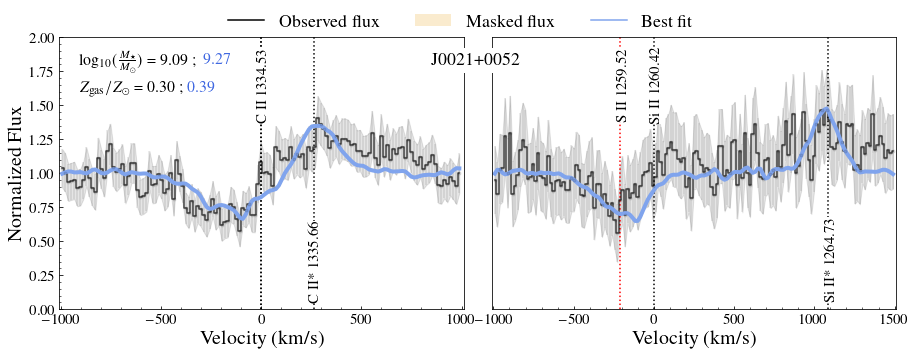

1 1
6.238534293412349
7.288213739702684
9.367370582090906


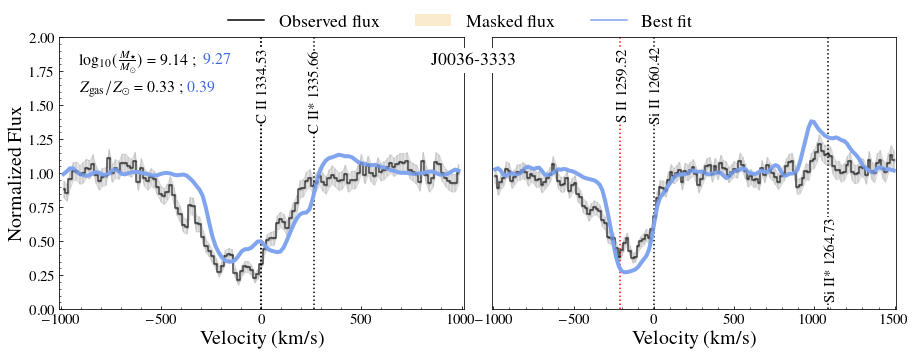

2 2
0.8418194839697685
2.3593144069373784
0.7187117124376331


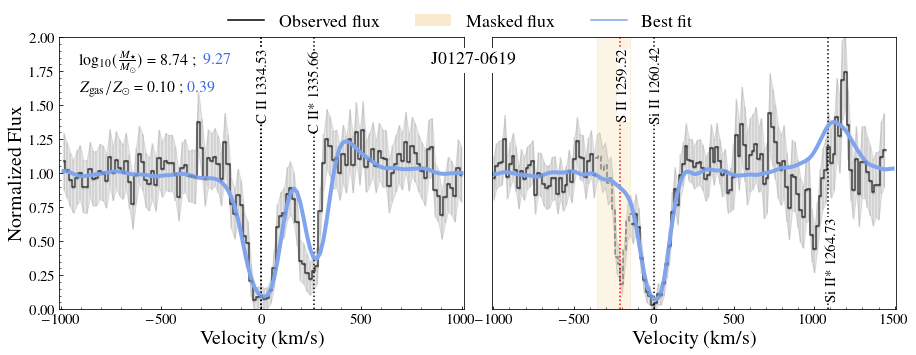

3 3
0.6539493122457263
1.079345564889703
0.5405989322711987


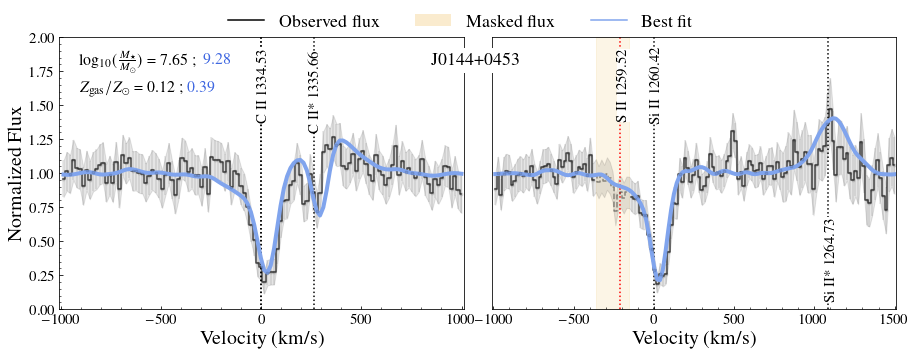

4 4
2.1948489371448643
4.731020119221305
1.660739514533108


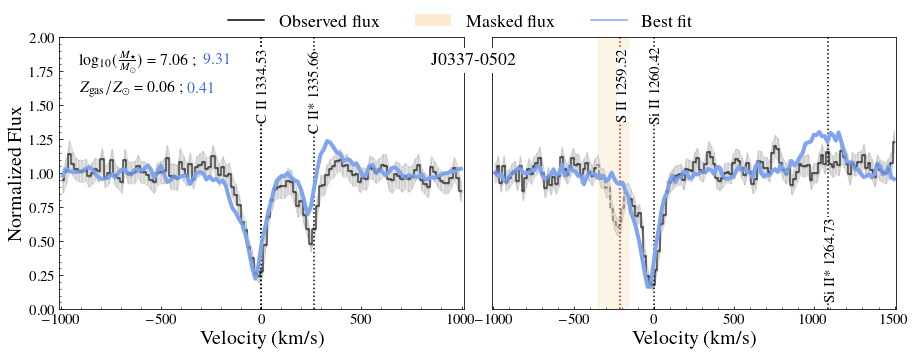

5 5
0.8242348991512174
1.4152346135259517
0.7623994114864764


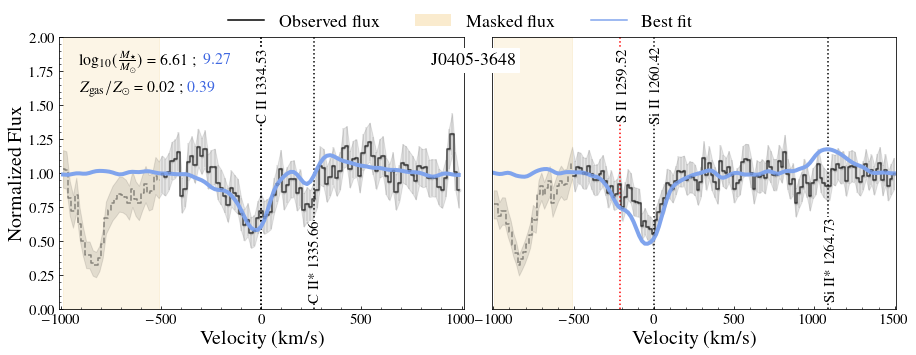

6 5
6.160498877867828
2.8302441521873027
21.18457383872991


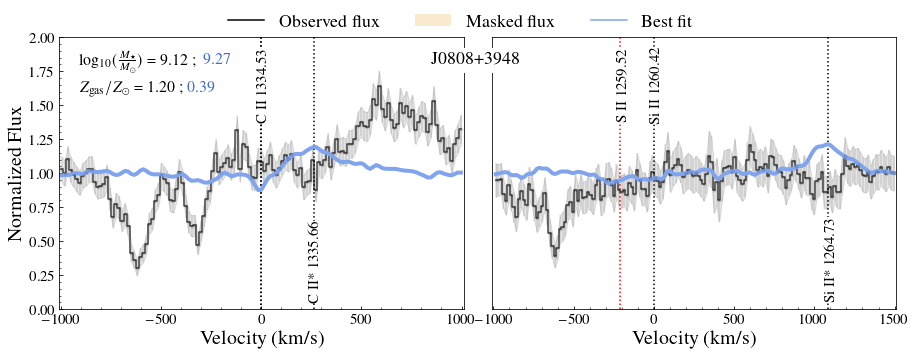

7 6
1.552992407836201
2.5597661813830186
1.8559090761229304


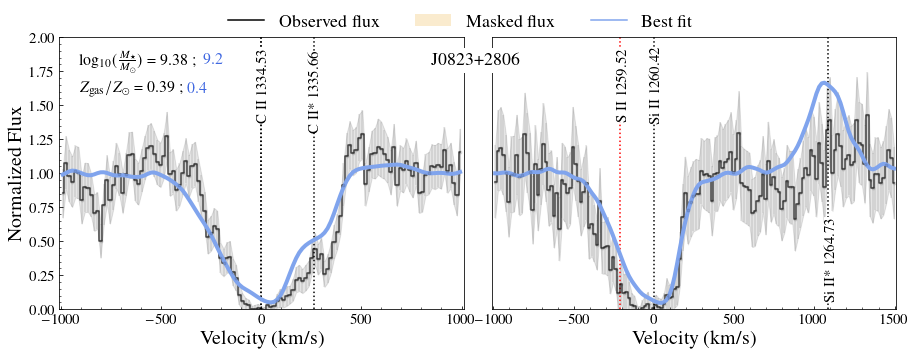

8 7
0.6970594751817744
0.9224730290661682
0.8235963297130362


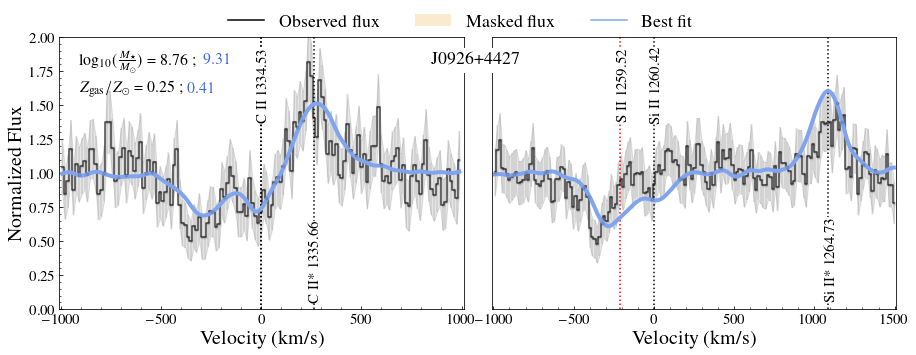

9 8
5.86722038087574
12.550724797744786
5.806707370152086


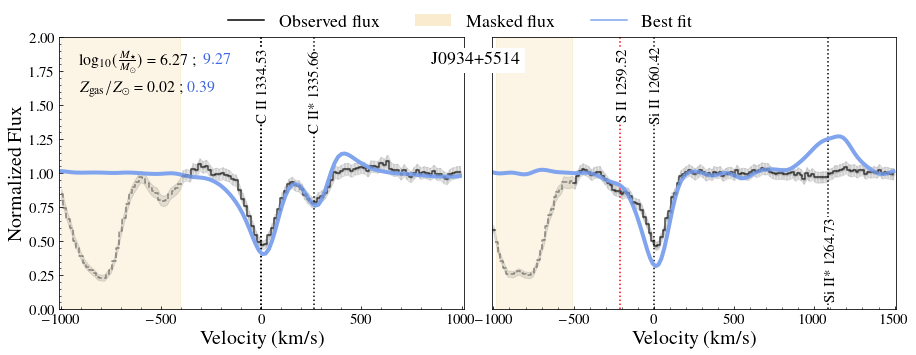

10 9
1.096829477644788
1.334421406991864
1.298689760286182


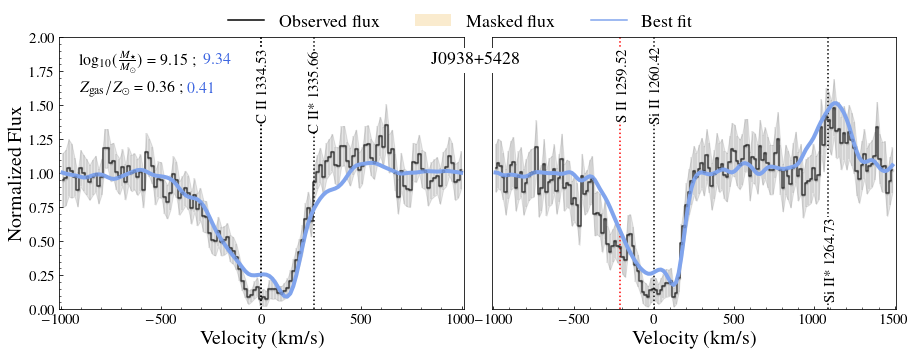

11 10
1.0177906665675198
2.0321521300020136
1.022946943520335


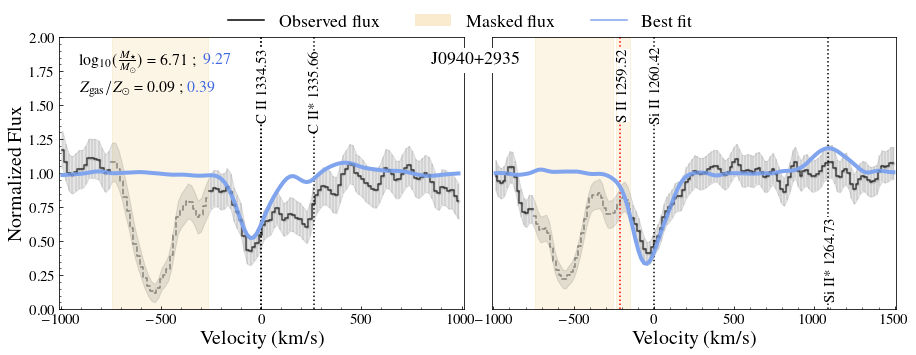

12 11
0.3625859743436153
0.4504384641289469
0.618964192124136


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


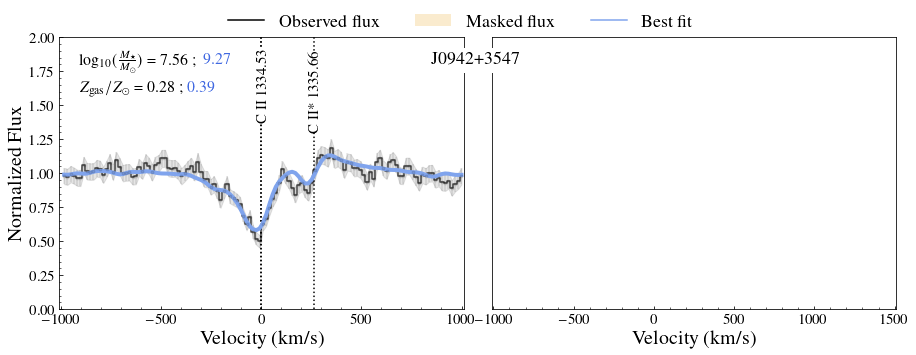

13 12
0.2978400296906918
0.2750828726024512
0.2296737640828955


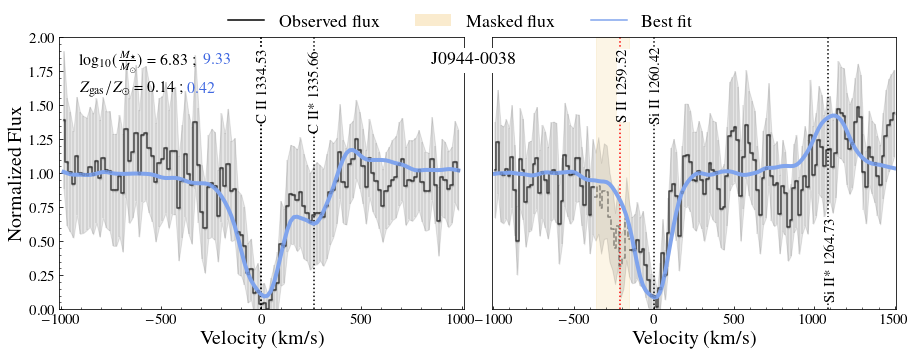

14 13
0.08945631282716457
0.04847535121198445
0.09223544690780332


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


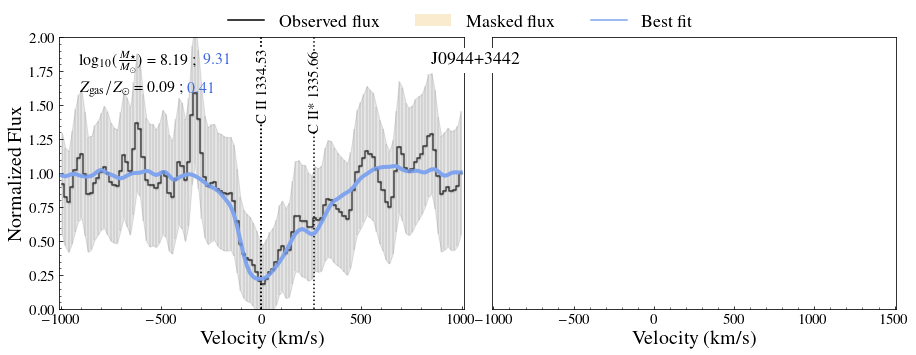

15 14
0.6136366925073343
1.3724597838024397
0.4411198816541173


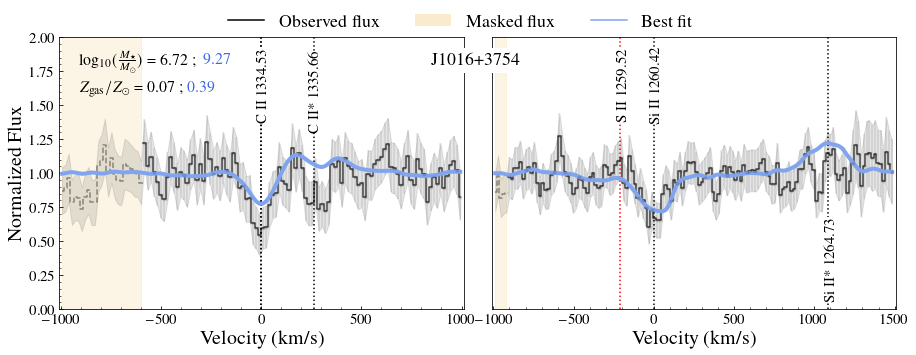

16 15
0.39339782186722416
0.23988182800412214
0.8200849201927902


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


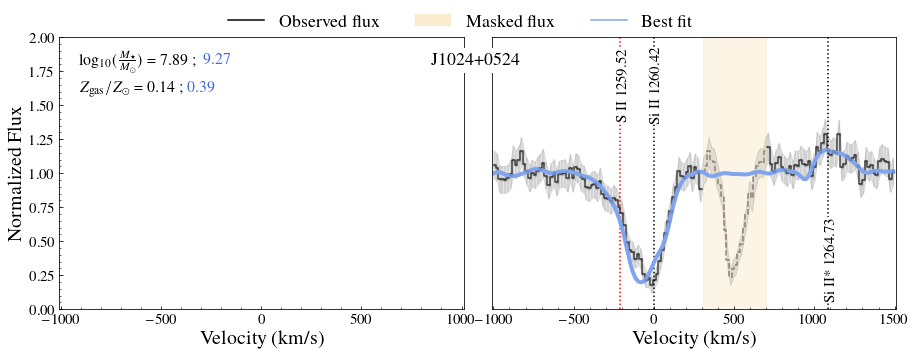

17 16
0.608414543030281
0.8572932030660391
0.6222520946157875


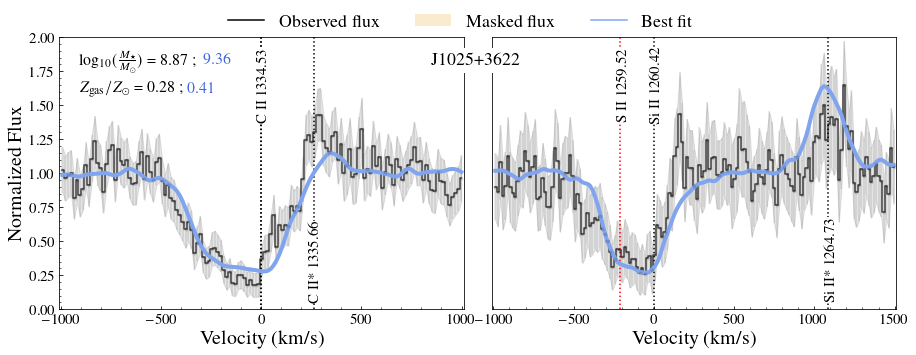

18 17
1.208627532694838
1.606905502888343
1.191787290129872


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


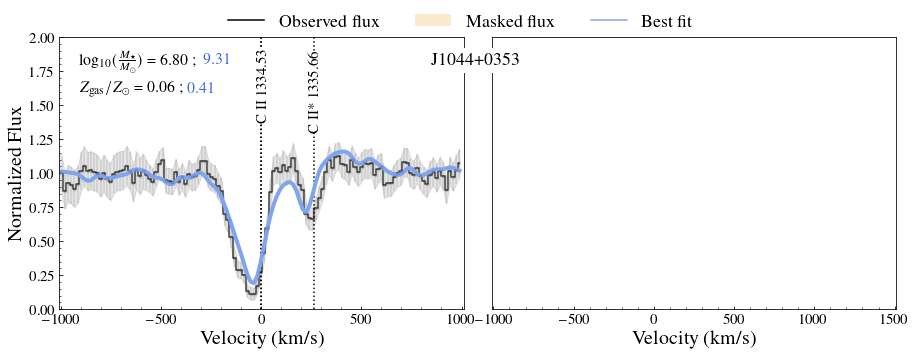

19 18
1.286200862928002
3.4914954698930654
1.1983144244325126


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


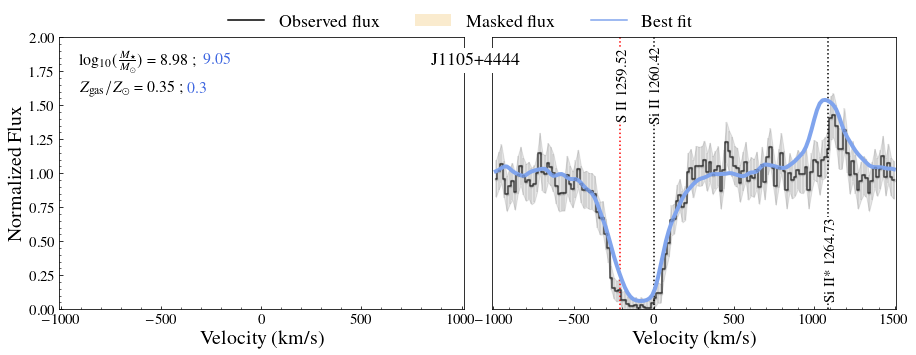

20 18
5.858573533226434
2.5819414664699534
11.04521273052393


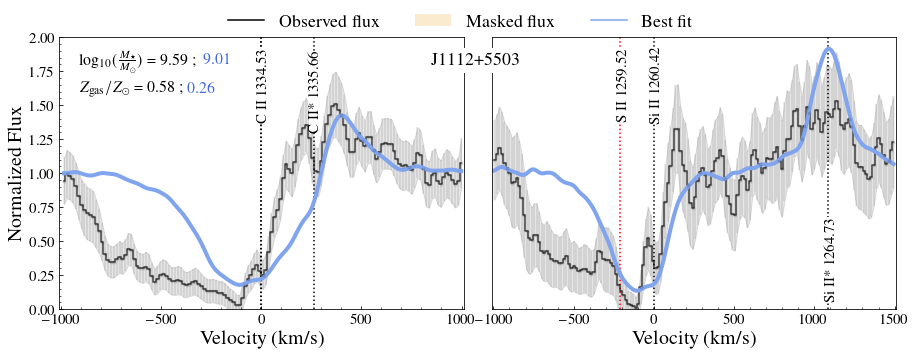

21 19
0.6754330553107604
1.32792460987786
0.707420156200412


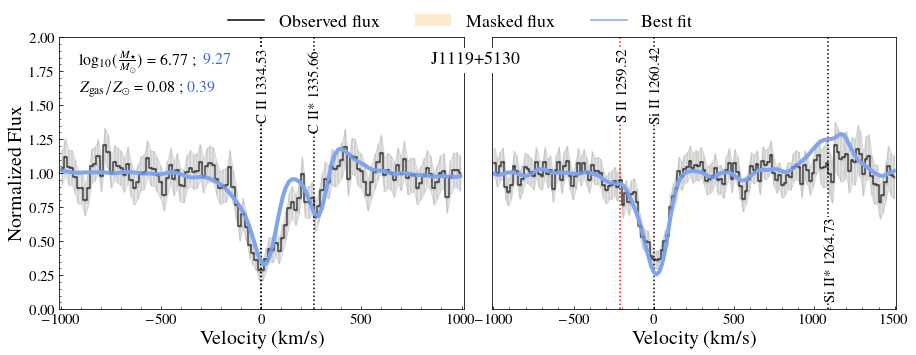

22 20
1.0811752184189163
2.540127044266951
0.8063792857417561


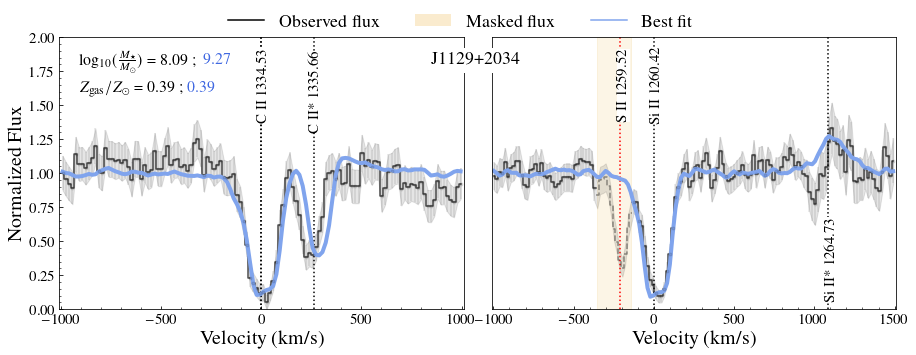

23 21
0.24639025849395926
0.4031153019449365
0.4545463605090502


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


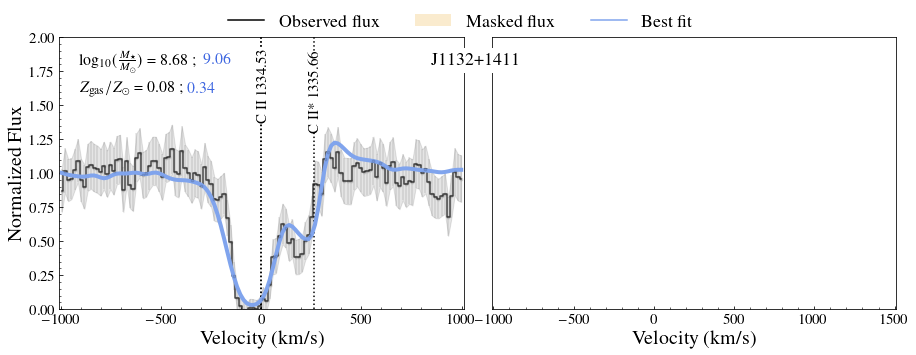

24 22
0.22725337495550615
0.28532253655522205
0.25726554715556726


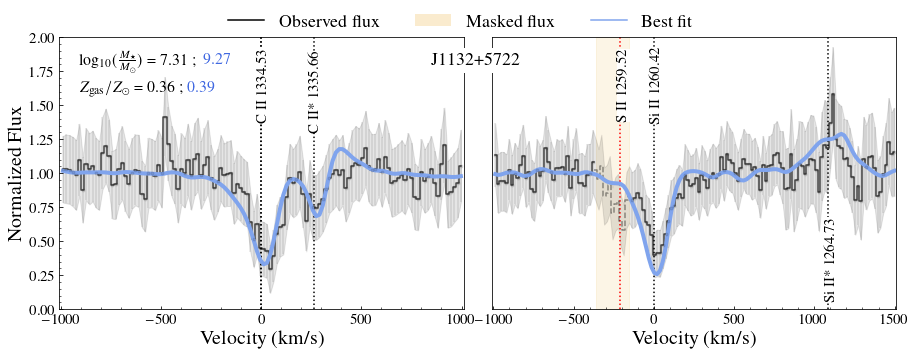

25 22
1.560998675632477
0.9369528996778992
3.092279836309479


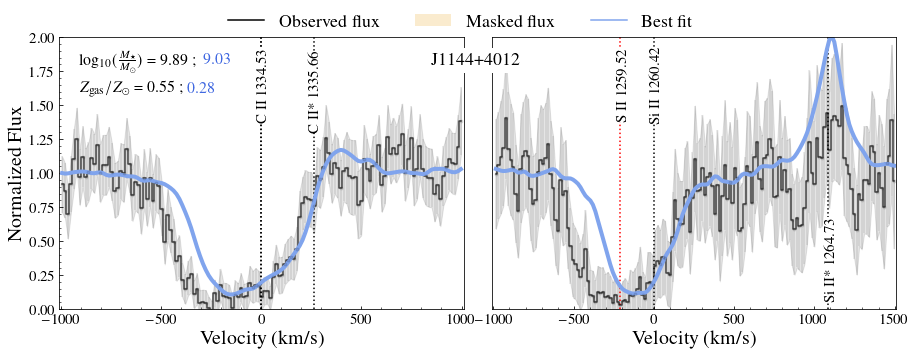

26 23
0.5367966765283225
1.1325126267460295
0.48883113733963623


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


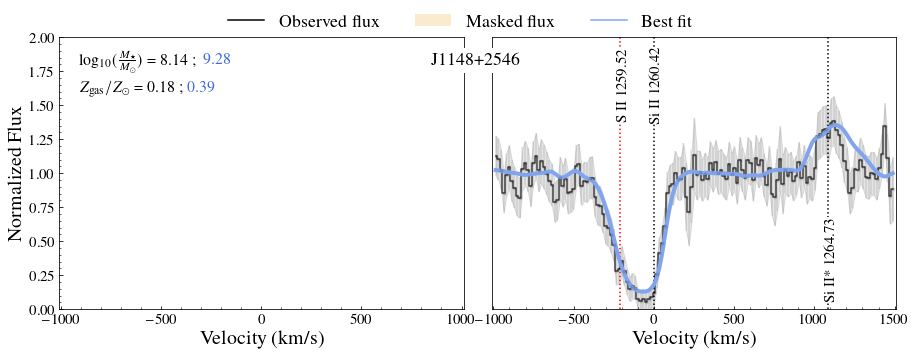

27 24
2.1744008766739062
2.4729336529885746
3.2856267443065383


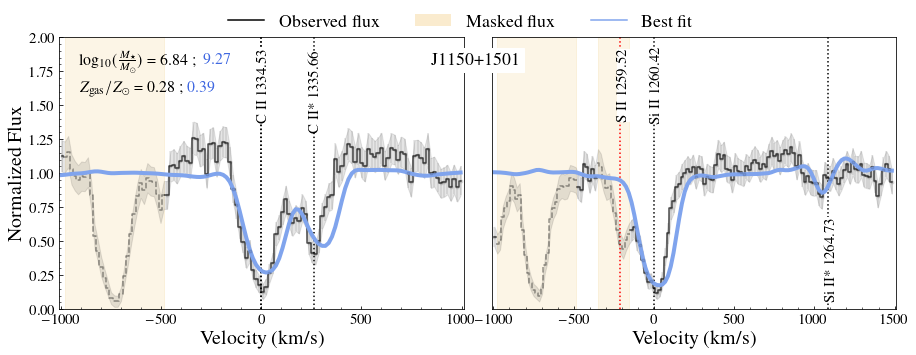

28 25
1.3724419384220383
1.367063829493068
1.3637174953782205


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


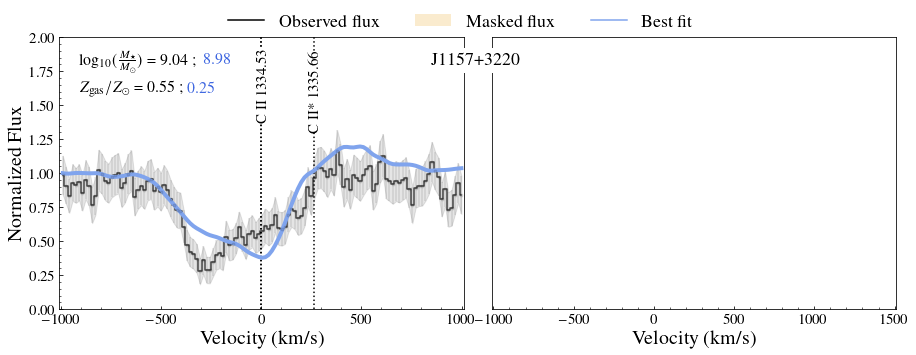

29 26
0.41956118097556944
0.5350697228570054
0.759381884553367


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


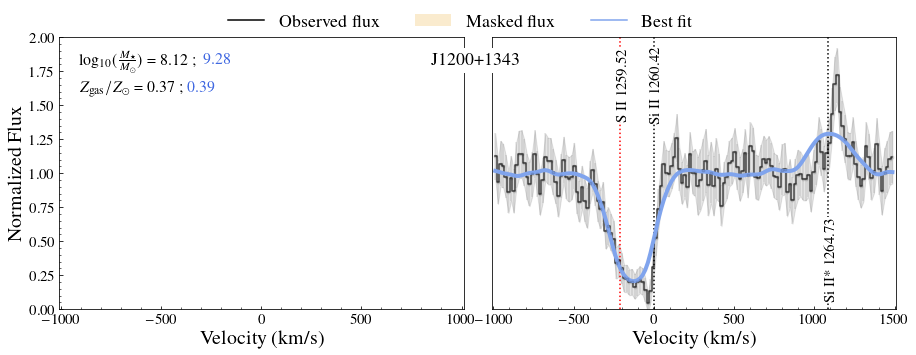

30 27
1.2334562805101397
2.189654415141464
1.4121752958224743


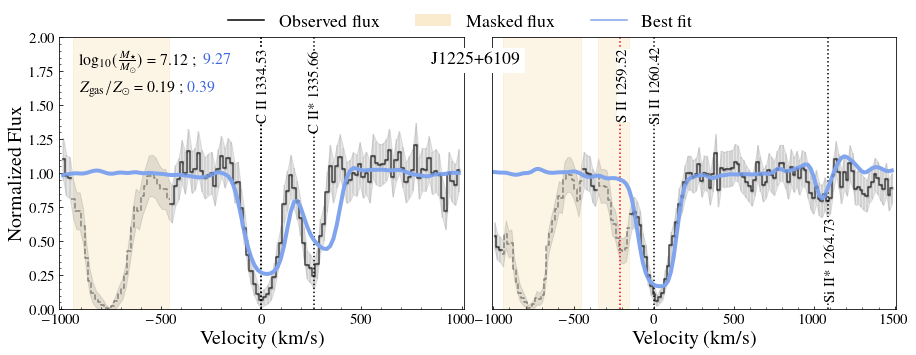

31 28
1.6628835064207708
4.277575878017937
0.7723856832606106


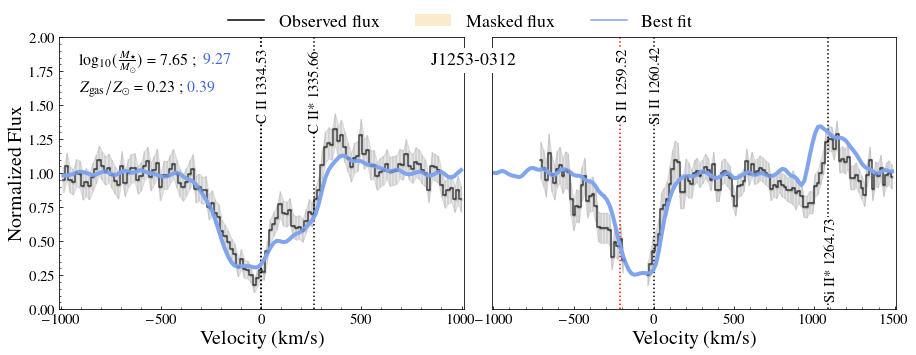

32 29
6.340206446108596
12.677965214943043
7.205538612716469


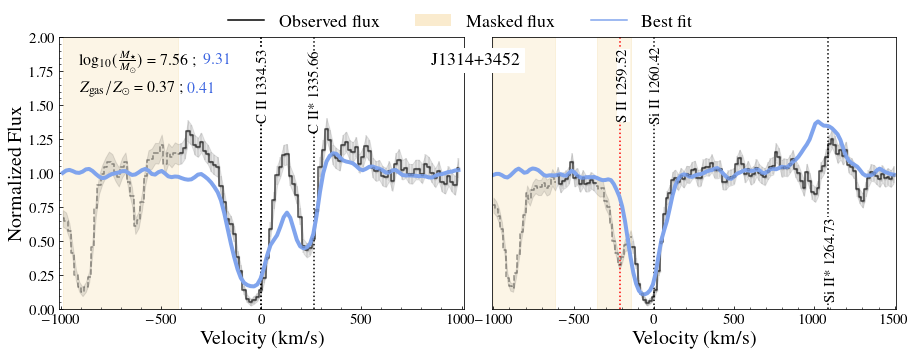

33 30
0.5245152781299931
0.5786250648480038
0.3545974859767686


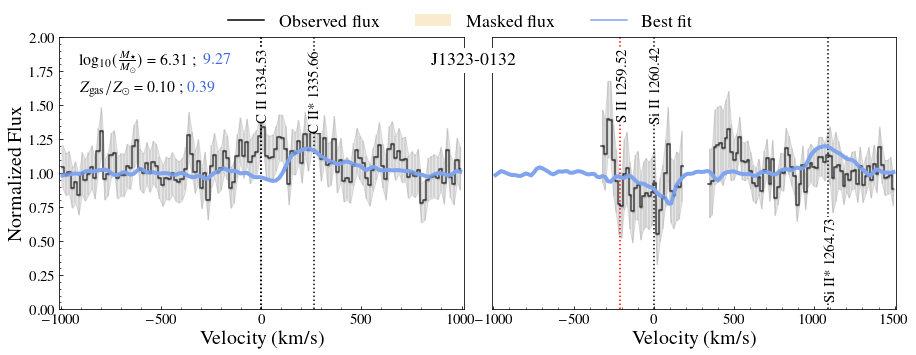

34 31
3.573976876083109
3.0441850107966104
2.5311646352323747


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


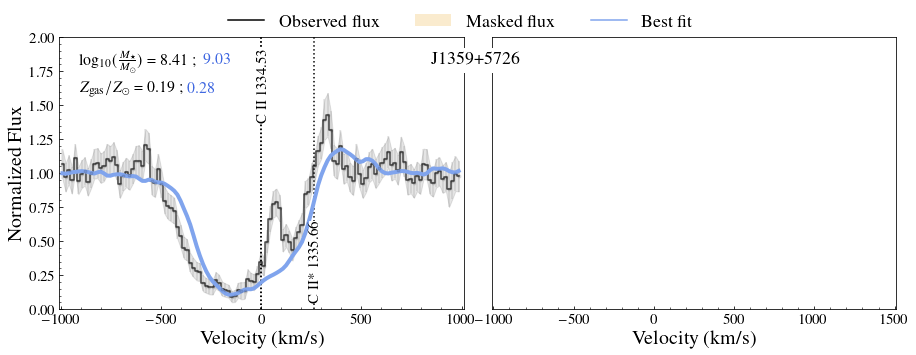

35 31
2.418944791706465
2.4117922295622467
3.449812567967659


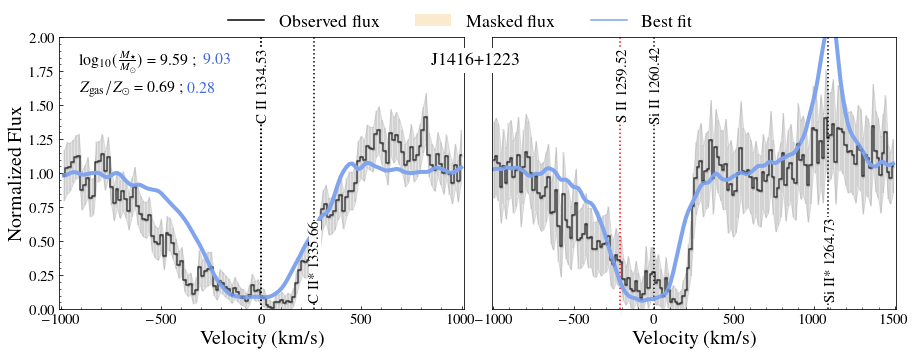

36 32
0.3013868051804739
0.26516960206485773
0.34847592461875393


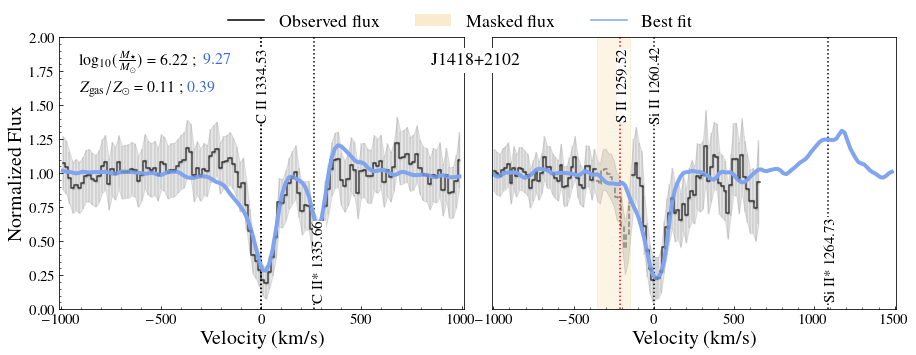

37 33
0.32356456582510895
0.2489285178458175
0.3247120997602482


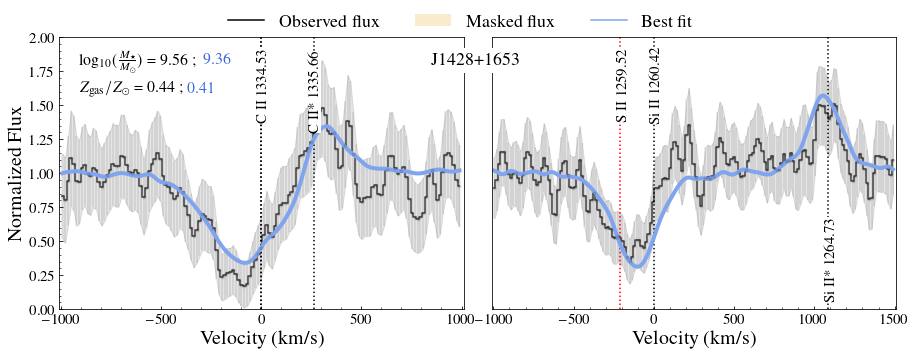

38 34
0.6636602114072637
0.6407494085278229
0.8086176842525311


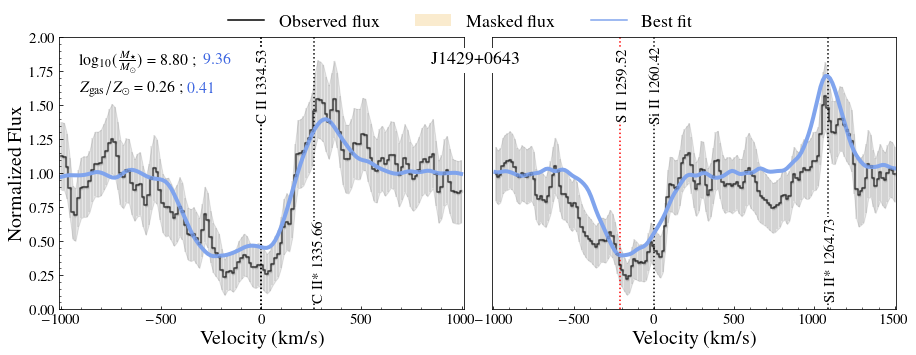

39 35
0.8482430272966007
0.6537938705622569
1.537090739409399


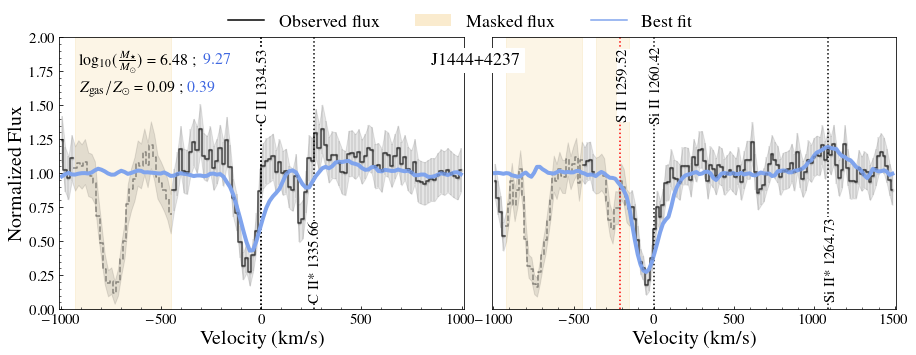

40 36
0.732575725803128
1.7422648824973626
0.7830756749106206


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


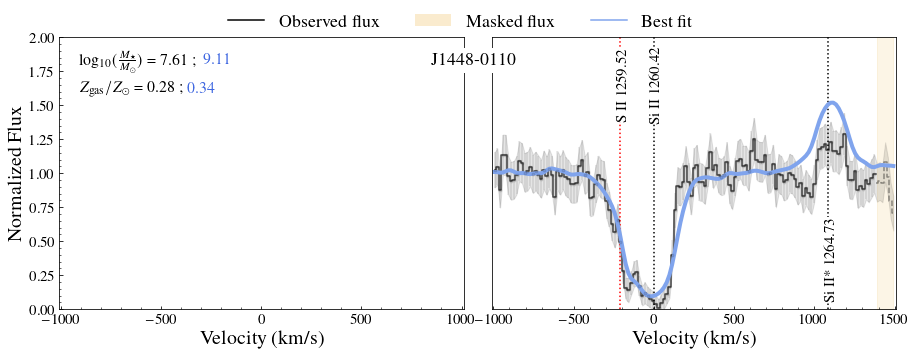

41 37
0.4119102984774635
0.27628593878791025
1.064503166040136


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


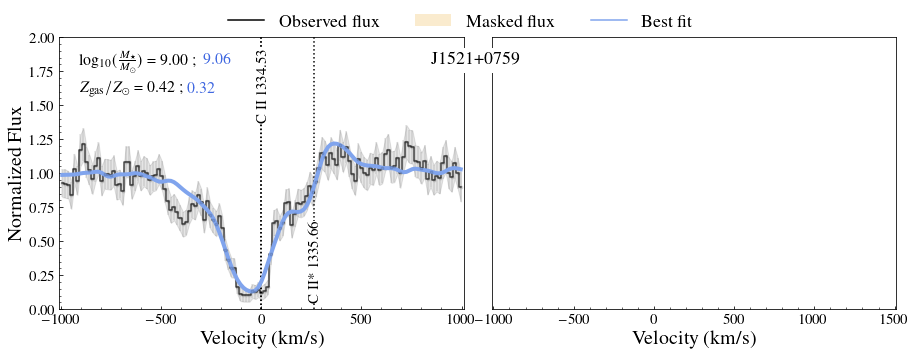

42 37
7.177420265290828
1.4511849059623494
20.403074625646454


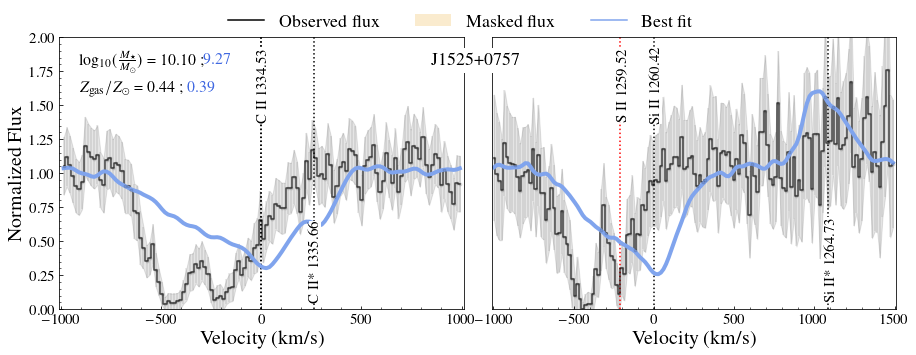

43 38
0.22491762712529528
0.21798682884641185
0.42891225807474853


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


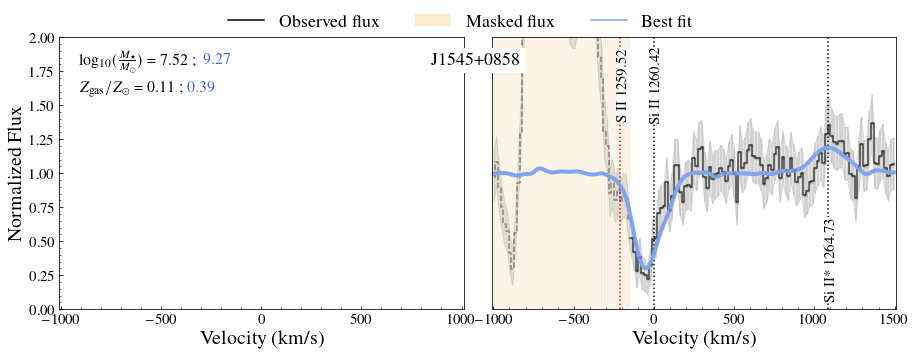

44 38
15.03701717223908
4.566688547948644
38.682627215445585


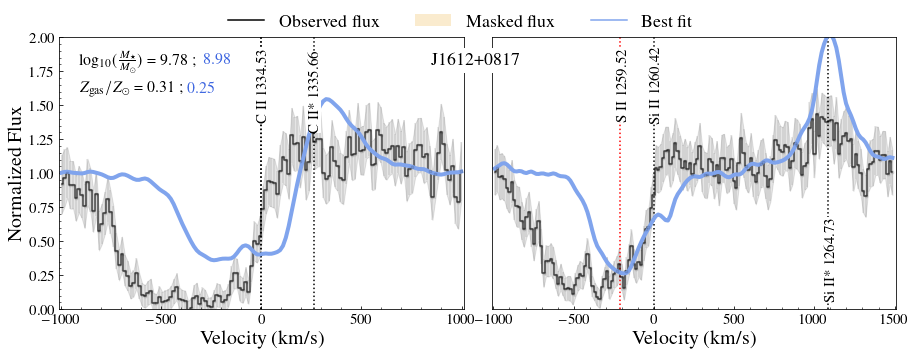

In [64]:
dfFS   = pd.read_csv('csv/Classy_dep_fit_V2.csv')

v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)

r50gal = []
r50cosgal = []
chi2allC_FS = []
chi2allS_FS = []
chi2emiC_FS = []
chi2emiS_FS = []
chi2absC_FS = []
chi2absS_FS = []
chi2all_FS = []
chi2emi_FS = []
chi2abs_FS = []
tt = -1
for i in range(len(galaxy)):

    if(label[i].upper() not in maskGal):
        tt +=1
#     if(maskIt[i] == True and (label[i].upper() not in maskGal)):
#         print('yes')
    ## Plot galaxy spectra
    #tt +=1
    print(i, tt)
    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[i]

    d_A = cosmo.angular_diameter_distance(z=classy.loc[classy.Galaxy == label[i].upper(), 'redshift'].values).value
    theta = 1.25 # arcsec
    theta_radian = theta * np.pi / 180 / 3600
    distance_coskpc = d_A * theta_radian *1e3
#     print(distance_coskpc)
    r50gal.append(classy.loc[classy.Galaxy == label[i].upper(), 'r50kpc'].values)
    r50cosgal.append(distance_coskpc)
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-1000) & (vcIId<1000) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]

    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    if(tt == 25 ):
        fcII/=1.1
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
    if(tt ==29 or i == 6 ):
        rmedSiII = (vsiII>1000) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    if(tt==30):
        fsiII/=0.84
    if(tt==34):
        fsiII/=1.02        
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    
    if(i == 20):
        fcII/=1.3
        fsiII/=1.1
        
    if (i == 44):
        fcII/=1.2
        fsiII/=1.1
    
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        axs[0].axvline(0, linestyle = ':', c='k')

        axs[0].text(-30, 1.65, "C II 1334.53", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(tt in [1,2,3,4,6,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,33,38]):
            yl = 1.6
        else:
            yl = 0.35
            
        if (tt == 15 or tt == 34 or tt == 32):
            axs[0].text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[0].text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        axs[0].axvline(264, linestyle = ':', c='k')   
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    axs[0].errorbar(vcII, fcIIgood, yerr = ecII, fmt='.k' , alpha=0.1)
    axs[0].plot(vcII, fcIIgood,  c='k', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    axs[0].plot(vcII, fcIIbad,  c='k', alpha = 0.4,drawstyle='steps-mid', label = 'Masked flux', linestyle = '--')#, label = 'Observed'

    if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
        axs[0].fill_between(vcII[~maskCII], 0,2, alpha=0.1,color="#E99F0C")  
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",
    axs[0].fill_between(vcII,fcII - ecII, fcII + ecII,color= 'k', alpha = 0.1)


    

    
    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].axvline(0, linestyle = ':', c='k')
       # if(i == 0):
        axs[1].text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(i == 2):
            axs[1].text(1066, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[1].text(1056, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))

        axs[1].axvline(1086, linestyle = ':', c='k')
        axs[1].axvline(-214, linestyle = ':', c='r')
        axs[1].text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',
            bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        
    if(i == 42 or i ==36):
        maskSiII = np.ones(len(maskSiII)).astype('bool')
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,34] or i in [25,29,31,33,35,37,40,44,42]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
        maskSiIIadd = np.ones(len(maskSiII)).astype('bool')
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII& ~((vsiII >-364) & (vsiII <-144)))] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII&~((vsiII >-364) & (vsiII <-144))] =np.nan 
        maskSiIIadd = ~((vsiII >-364) & (vsiII <-144))

        #maskSiII = maskSiII & ~((vsiII >-364) & (vsiII <-144))
        
    axs[1].errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
    axs[1].plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    axs[1].plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

    if(len(fsiII[~maskSiII | ~maskSiIIadd])>0 and np.nansum(fsiII[maskSiII]) != 0):
        axs[1].fill_between(vsiII[~maskSiII], 0,2, alpha=0.1,color="#E99F0C") 
        axs[1].fill_between(vsiII[~maskSiIIadd & maskSiII], 0,2, alpha=0.1,color="#E99F0C") 

#         axs[1].fill_between(vsiII[maskSiII], 0,2, alpha=0.3,color="#FFFFFF")  

#     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall],   c = 'k' )
    axs[1].fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)


    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll'][i]
    bestOut         = dfFS['OutputAll'][i]
    bestChi2FS      = dfFS['x2All'][i]

    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
#     alpha          = np.nansum((modelNewcii[maskCII]*fcII[maskCII]/(ecII[maskCII])**2))/ \
#                     np.nansum(modelNewcii[maskCII]**2/ecII[maskCII]**2)     
#     modelNewcii    *= alpha   
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best fit')

               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)
#     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     modelNewsi    *= alpha
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  

    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].plot(vsiII, modelNewsi, c =cFS, lw = 4)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    
#     axs[0].legend(fontsize = 18, frameon = False, ncol = 2)
#     axs[1].legend(fontsize = 18, frameon = False, ncol = 2)

    #if(i == 0):
#         handles, labels = axs[0].get_legend_handles_labels()

    line1 = Line2D([0], [0], label='Observed flux', color='k')    
    line2 = Line2D([0], [0], label='Masked flux', color='k', linestyle = '--', alpha = 0.3)    

    line3 = Line2D([0], [0], label='Best fit', color=cFS)
    patch = patches.Patch(facecolor='#E99F0C', label='Masked', alpha = 0.2)   

#         handles.extend([patch,line])
    axs[0].legend([line1,patch,line3], ['Observed flux', 'Masked flux', 'Best fit'], frameon = False, ncol = 3,
                 loc = (0.4,1), fontsize = 18)
        
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
#     axs[1].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-1010,1010)
    axs[1].set_xlim(-1010,1510)
    axs[1].text(-1390, 1.8, label[i].upper(), fontsize = 18,
        bbox=dict(facecolor='white', edgecolor='white'))
    
    axs[0].set_ylim(0,2)
    axs[1].set_ylim(0,2)
  #  maskCII  = maskCII & (vcII > 100) & (vcII < 500) #& (modelNewcii > 1.05)
  #  maskSiII = maskSiII & (vsiII > 700)& (vsiII < 1400)# & (modelNewsi > 1.05)
    maskCII = maskCII & (vcII >-800) & (vcII < 650)
    maskSiII = maskSiII & maskSiIIadd & (vsiII > - 800)  & (vsiII < 1500)
    #& (~((vsiII >-364) & (vsiII <-144)))
    try:
        lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
        ncII = len(modelNewcii[maskCII])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
        nsiII = len(modelNewsi[maskSiII])
    except:
        lnlikesiII = 0
        nsiII = 0
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
#     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
    if(ncII==0):
        chi2allC_FS.append(0)
    else:      
        chi2allC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2allS_FS.append(0)
    else:
        chi2allS_FS.append(lnlikesiII/nsiII)

    chi2all_FS.append(lnlikeall)
    print(lnlikeall)
    
    
    try:
        xminC = np.argmin(fcII[maskCII])

        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)]-\
                                  modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])**2)\
                                /ecII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)] - modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)]**2) #/len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
        nsiII =  len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
    except:
        nsiII = 0
        lnlikesiII = 0
        
    if (np.isnan(lnlikecII)):
        ncII = 0
        lnlikecII = 0
    if (np.isnan(lnlikesiII)):
        nsiII = 0
        lnlikesiII = 0
#     print('Emission ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2emiC_FS.append(0)
    else:      
        chi2emiC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2emiS_FS.append(0)
    else:
        chi2emiS_FS.append(lnlikesiII/nsiII)
    chi2emi_FS.append(lnlikeall)
    print(lnlikeall)



   # print(xminC)
   # print(vcII[maskCII][xminC])
   # print(modelNewcii[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])

    try:
        xminC = np.argmin(fcII[maskCII])

        #print(np.nansum(fcII[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)]))
        #print(modelNewcii[(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])
        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]-modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])**2)\
                               /ecII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        xminS = np.argmin(fsiII[maskSiII])
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)] - modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)]**2)# /len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
        nsiII = len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
    except:
        lnlikesiII = 0
        nsiII = 0
        
#     print('Absorption ', lnlikecII/ncII, lnlikesiII/nsiII)
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2absC_FS.append(0)
    else:      
        chi2absC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2absS_FS.append(0)
    else:
        chi2absS_FS.append(lnlikesiII/nsiII)
    print(lnlikeall)
    chi2abs_FS.append(lnlikeall)
    axs[0].text(0.05, 0.9, r'log$_{10}(\frac{M_\star}{M_\odot})$ = %.2f ; '%classy['MstarTot'][i],
                transform=axs[0].transAxes, fontsize = 16)
    axs[0].text(0.05, 0.8, r'$Z_{\rm gas}/Z_\odot$ = %.2f ; '%classy['Zstell'][i],
                transform=axs[0].transAxes, fontsize = 16)
    axs[0].text(0.05+(0.915-0.61), 0.9, str(np.round(np.log10(Mstar[bestOut-90]),2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    axs[0].text(0.05+(0.875-0.61), 0.8, str(np.round(Zgas[bestOut-90],2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')    
    plt.subplots_adjust(wspace=0.07, hspace=None)
    plt.savefig('Paper 1: CII SiII/Plots/Fits1/'+label[i]+'depletion.pdf', bbox_inches = 'tight')
    plt.show()


### V2

4 4


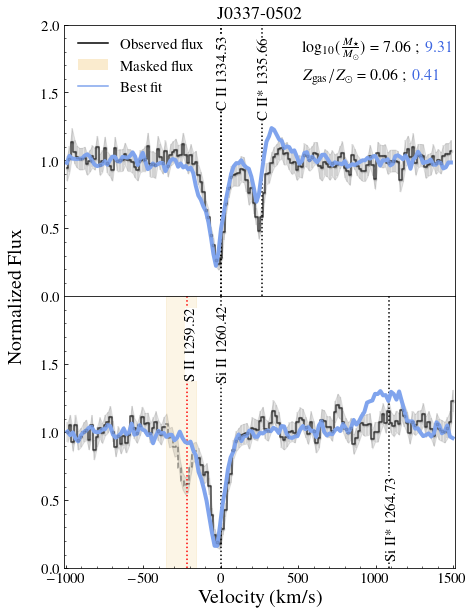

37 33


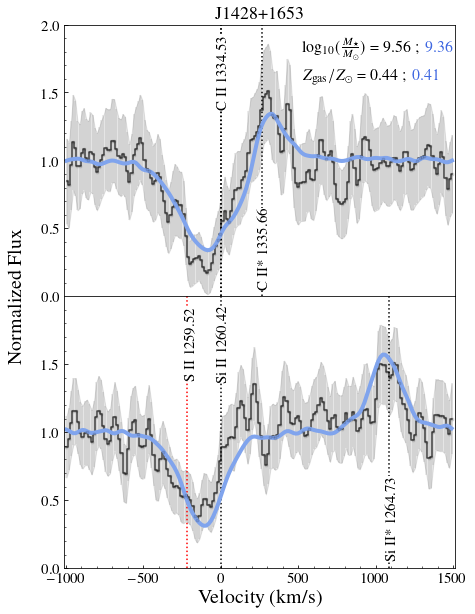

44 38


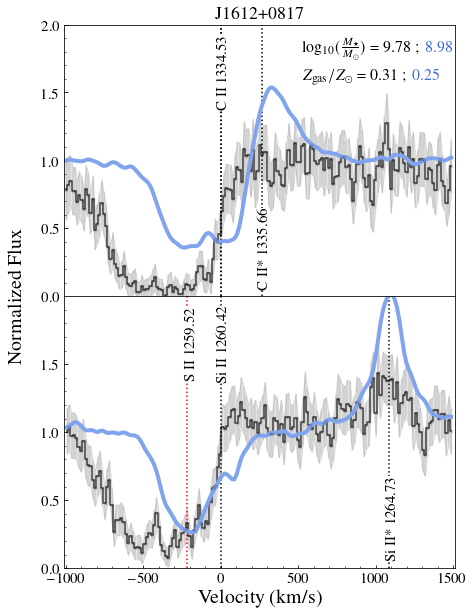

In [51]:
dfFS   = pd.read_csv('csv/Classy_dep_fit_V2.csv')

v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)

r50gal = []
r50cosgal = []
chi2allC_FS = []
chi2allS_FS = []
chi2emiC_FS = []
chi2emiS_FS = []
chi2absC_FS = []
chi2absS_FS = []
chi2all_FS = []
chi2emi_FS = []
chi2abs_FS = []
tt = -1
for i in range(len(galaxy)):

    if(label[i].upper() not in maskGal):
        tt +=1
        
    if(i not in [4,37,44]):
        continue
#     if(maskIt[i] == True and (label[i].upper() not in maskGal)):
#         print('yes')
    ## Plot galaxy spectra
    #tt +=1
    print(i, tt)
    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[i]

    d_A = cosmo.angular_diameter_distance(z=classy.loc[classy.Galaxy == label[i].upper(), 'redshift'].values).value
    theta = 1.25 # arcsec
    theta_radian = theta * np.pi / 180 / 3600
    distance_coskpc = d_A * theta_radian *1e3
#     print(distance_coskpc)
    r50gal.append(classy.loc[classy.Galaxy == label[i].upper(), 'r50kpc'].values)
    r50cosgal.append(distance_coskpc)
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-1000) & (vcIId<1500) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]

    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    if(tt == 25 ):
        fcII/=1.1
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
    if(tt ==29 or i == 6 ):
        rmedSiII = (vsiII>1000) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    if(tt==31):
        fsiII/=0.9
    if(tt==34):
        fsiII/=1.02        
    fig, axs = plt.subplots(2,1,figsize=(7,10))
    
    if(i == 20):
        fcII/=1.3
        fsiII/=1.1
        
    if (i == 44):
        fcII/=1.2
        fsiII/=1.1
    
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        axs[0].axvline(0, linestyle = ':', c='k')

        axs[0].text(-30, 1.65, "C II 1334.53", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(tt in [1,2,3,4,6,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,33,38] and i not in [37, 44] ):
            yl = 1.6
        else:
            yl = 0.35
            
        if (tt == 15 or tt == 34 or tt == 32):
            axs[0].text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[0].text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        axs[0].axvline(264, linestyle = ':', c='k')   
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    axs[0].errorbar(vcII, fcIIgood, yerr = ecII, fmt='.k' , alpha=0.1)
    axs[0].plot(vcII, fcIIgood,  c='k', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    axs[0].plot(vcII, fcIIbad,  c='k', alpha = 0.4,drawstyle='steps-mid', label = 'Masked flux', linestyle = '--')#, label = 'Observed'

    if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
        axs[0].fill_between(vcII[~maskCII], 0,2, alpha=0.1,color="#E99F0C")  
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",
    axs[0].fill_between(vcII,fcII - ecII, fcII + ecII,color= 'k', alpha = 0.1)


    

    
    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].axvline(0, linestyle = ':', c='k')
       # if(i == 0):
        axs[1].text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(i == 2):
            axs[1].text(1066, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[1].text(1056, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))

        axs[1].axvline(1086, linestyle = ':', c='k')
        axs[1].axvline(-214, linestyle = ':', c='r')
        axs[1].text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',
            bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        
    if(i == 42 or i ==36):
        maskSiII = np.ones(len(maskSiII)).astype('bool')
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,34] or i in [25,29,31,33,35,37,40,44,42]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
        maskSiIIadd = np.ones(len(maskSiII)).astype('bool')
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII& ~((vsiII >-364) & (vsiII <-144)))] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII&~((vsiII >-364) & (vsiII <-144))] =np.nan 
        maskSiIIadd = ~((vsiII >-364) & (vsiII <-144))

        #maskSiII = maskSiII & ~((vsiII >-364) & (vsiII <-144))
        
    axs[1].errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
    axs[1].plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    axs[1].plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

    if(len(fsiII[~maskSiII | ~maskSiIIadd])>0 and np.nansum(fsiII[maskSiII]) != 0):
        axs[1].fill_between(vsiII[~maskSiII], 0,2, alpha=0.1,color="#E99F0C") 
        axs[1].fill_between(vsiII[~maskSiIIadd & maskSiII], 0,2, alpha=0.1,color="#E99F0C") 

#         axs[1].fill_between(vsiII[maskSiII], 0,2, alpha=0.3,color="#FFFFFF")  

#     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall],   c = 'k' )
    axs[1].fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)


    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll'][i]
    bestOut         = dfFS['OutputAll'][i]
    bestChi2FS      = dfFS['x2All'][i]

    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
#     alpha          = np.nansum((modelNewcii[maskCII]*fcII[maskCII]/(ecII[maskCII])**2))/ \
#                     np.nansum(modelNewcii[maskCII]**2/ecII[maskCII]**2)     
#     modelNewcii    *= alpha   
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best fit')

               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)
#     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     modelNewsi    *= alpha
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  

    if(np.nansum(fsiII[maskSiII]) != 0):
        axs[1].plot(vsiII, modelNewsi, c =cFS, lw = 4)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    
#     axs[0].legend(fontsize = 18, frameon = False, ncol = 2)
#     axs[1].legend(fontsize = 18, frameon = False, ncol = 2)

    #if(i == 0):
#         handles, labels = axs[0].get_legend_handles_labels()

    line1 = Line2D([0], [0], label='Observed flux', color='k')    
    line2 = Line2D([0], [0], label='Masked flux', color='k', linestyle = '--', alpha = 0.3)    

    line3 = Line2D([0], [0], label='Best fit', color=cFS)
    patch = patches.Patch(facecolor='#E99F0C', label='Masked', alpha = 0.2)   

#         handles.extend([patch,line])
    if(i==4):
        axs[0].legend([line1,patch,line3], ['Observed flux', 'Masked flux', 'Best fit'], frameon = False, ncol = 1,
                 loc = 'upper left', fontsize = 15)
        
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
    axs[0].yaxis.set_label_coords(-0.1,0)
#     axs[1].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([0,0.5,1,1.5])
    axs[0].set_yticks([0,0.5,1,1.5,2])

    axs[0].set_xlim(-1010,1510)
    axs[1].set_xlim(-1010,1510)
#     axs[1].text(-1390, 1.8, label[i].upper(), fontsize = 18,
#         bbox=dict(facecolor='white', edgecolor='white'))
    axs[0].set_title(label[i].upper(), fontsize = 18)
    axs[0].set_ylim(0,2)
    axs[1].set_ylim(0,2)
  #  maskCII  = maskCII & (vcII > 100) & (vcII < 500) #& (modelNewcii > 1.05)
  #  maskSiII = maskSiII & (vsiII > 700)& (vsiII < 1400)# & (modelNewsi > 1.05)
    maskCII = maskCII & (vcII >-800) & (vcII < 650)
    maskSiII = maskSiII & maskSiIIadd & (vsiII > - 800)  & (vsiII < 1500)
    #& (~((vsiII >-364) & (vsiII <-144)))
    try:
        lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
        ncII = len(modelNewcii[maskCII])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
        nsiII = len(modelNewsi[maskSiII])
    except:
        lnlikesiII = 0
        nsiII = 0
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
#     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
    if(ncII==0):
        chi2allC_FS.append(0)
    else:      
        chi2allC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2allS_FS.append(0)
    else:
        chi2allS_FS.append(lnlikesiII/nsiII)

    chi2all_FS.append(lnlikeall)

    
    
    try:
        xminC = np.argmin(fcII[maskCII])

        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)]-\
                                  modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])**2)\
                                /ecII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)] - modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)]**2) #/len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
        nsiII =  len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
    except:
        nsiII = 0
        lnlikesiII = 0
        
    if (np.isnan(lnlikecII)):
        ncII = 0
        lnlikecII = 0
    if (np.isnan(lnlikesiII)):
        nsiII = 0
        lnlikesiII = 0
#     print('Emission ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2emiC_FS.append(0)
    else:      
        chi2emiC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2emiS_FS.append(0)
    else:
        chi2emiS_FS.append(lnlikesiII/nsiII)
    chi2emi_FS.append(lnlikeall)



   # print(xminC)
   # print(vcII[maskCII][xminC])
   # print(modelNewcii[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])

    try:
        xminC = np.argmin(fcII[maskCII])

        #print(np.nansum(fcII[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)]))
        #print(modelNewcii[(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])
        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]-modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])**2)\
                               /ecII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        xminS = np.argmin(fsiII[maskSiII])
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)] - modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)]**2)# /len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
        nsiII = len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
    except:
        lnlikesiII = 0
        nsiII = 0
        
#     print('Absorption ', lnlikecII/ncII, lnlikesiII/nsiII)
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2absC_FS.append(0)
    else:      
        chi2absC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2absS_FS.append(0)
    else:
        chi2absS_FS.append(lnlikesiII/nsiII)
    chi2abs_FS.append(lnlikeall)
    
    axs[0].set_xticks([])
    axs[0].text(0.61, 0.9, r'log$_{10}(\frac{M_\star}{M_\odot})$ = ' + str(classy['MstarTot'][i]) + ' ; ',
                transform=axs[0].transAxes, fontsize = 16)
    axs[0].text(0.61, 0.8, r'$Z_{\rm gas}/Z_\odot$ = '+str(classy['Zstell'][i]) + ' ; ',
                transform=axs[0].transAxes, fontsize = 16)

   # axs[0].text(0.61, 0.2, r'\bf log$_{\bf 10}\mathbf{(\it M_\star / M_\odot)}$ = ' + str(classy['MstarTot'][i]),
#                 transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
   # axs[0].text(0.61, 0.1, r'\bf $\mathbf{Z_{\rm \bf gas}}$ = '+str(classy['Zstell'][i]) + ' $\mathbf{Z_\odot}$',
#                 transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    axs[0].text(0.925, 0.9, str(np.round(np.log10(Mstar[bestOut-90]),2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    axs[0].text(0.89, 0.8, str(np.round(Zgas[bestOut-90],2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    plt.subplots_adjust(hspace=0.0)
    
#     for kk in range(1,5):
#         bestDir         = dfFS['DirAll'+str(kk)][i]
#         bestOut         = dfFS['OutputAll'+str(kk)][i]
#         lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 

#         model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
#         f              = interpolate.interp1d(vcII_s, model)
#         modelNewcii    = f(vcII)
#     #     alpha          = np.nansum((modelNewcii[maskCII]*fcII[maskCII]/(ecII[maskCII])**2))/ \
#     #                     np.nansum(modelNewcii[maskCII]**2/ecII[maskCII]**2)     
#     #     modelNewcii    *= alpha   
#         rmedCII = ((vcII<-500) | (vcII > 700)) 
#         fmedCII = np.nanmedian(modelNewcii[rmedCII])
#         modelNewcii /= fmedCII
#         if(np.nansum(fcII[maskCII]) != 0):
#             axs[0].plot(vcII, modelNewcii, lw = 1, c = 'g')

#         lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 

#         model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
#         f              = interpolate.interp1d(vsiII_s, model)
#         modelNewsi     = f(vsiII)
#     #     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#     #                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     #     modelNewsi    *= alpha
#         rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
#         fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
#         modelNewsi /= fmedSiII  

#         if(np.nansum(fsiII[maskSiII]) != 0):
#             axs[1].plot(vsiII, modelNewsi, lw = 1)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])

    plt.savefig('Paper 1: CII SiII/Plots/Fits1/'+label[i]+'depletionMain.pdf', bbox_inches = 'tight')
    plt.show()


### Value of chi square

In [1345]:
print(sum(dfFS['OutputAll']==148))

21


In [1340]:
# Checking number of gal in chi square range
chi2allC_FS = np.asarray(chi2allC_FS)
good_chi2allC_FS = chi2allC_FS[chi2allC_FS>0]
chi2allS_FS = np.asarray(chi2allS_FS)
good_chi2allS_FS = chi2allS_FS[chi2allS_FS>0]

chi2allS_FS = np.asarray(chi2allS_FS)
good_chi2allS_FS = chi2allS_FS[chi2allS_FS>0]


print(f'Number of galaxies included: {len(chi2allC_FS)}, \
        number with C II: {np.sum(np.asarray(chi2allC_FS)>0)}, \
        number with Si II: {np.sum(np.asarray(chi2allS_FS)>0)}')
print('')
print(f'Number of Gal with C II chi square < 1: {np.sum(abs(np.asarray(good_chi2allC_FS)<1.5))}')
print(f'Number of Gal with C II chi square < 3: {np.sum(abs(np.asarray(good_chi2allC_FS)<3))}')
print(f'Median C II chi square < 3: {np.median(abs(np.asarray(good_chi2allC_FS)))}')

print('')
print(f'Number of Gal with Si II chi square < 1: {np.sum(abs(np.asarray(good_chi2allS_FS)<1.5))}')
print(f'Number of Gal with Si II chi square < 3: {np.sum(abs(np.asarray(good_chi2allS_FS)<3))}')
print(f'Median Si II chi square < 3: {np.median(abs(np.asarray(good_chi2allS_FS)))}')

print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2all_FS)<1.5))}')
print(f'Number of Gal with all chi square < 3: {np.sum(abs(np.asarray(chi2all_FS)<3))}')
print(f'Median all chi square < 3: {np.median(abs(np.asarray(chi2all_FS)))}')


Number of galaxies included: 45,         number with C II: 39,         number with Si II: 38

Number of Gal with C II chi square < 1: 24
Number of Gal with C II chi square < 3: 30
Median C II chi square < 3: 1.1771390618500275

Number of Gal with Si II chi square < 1: 28
Number of Gal with Si II chi square < 3: 33
Median Si II chi square < 3: 0.8507728959782308

Number of Gal with all chi square < 1: 31
Number of Gal with all chi square < 3: 37
Median all chi square < 3: 0.8482430272966007


In [1341]:
# Checking number of gal in chi square range for fluorescent emission only
print(good_chi2emiC_FS)
chi2emiC_FS = np.asarray(chi2emiC_FS)
good_chi2emiC_FS = chi2emiC_FS[chi2emiC_FS>0]
chi2emiS_FS = np.asarray(chi2emiS_FS)
good_chi2emiS_FS = chi2emiS_FS[chi2emiS_FS>0]
print(f'Number of galaxies included: {len(chi2emiC_FS)}, \
        number with C II: {np.sum(np.asarray(chi2emiC_FS)>0)}, \
        number with Si II: {np.sum(np.asarray(chi2emiS_FS)>0)}')
print('')
print(f'Number of Gal with C II fluo chi square < 1: {np.sum(abs(np.asarray(good_chi2emiC_FS)<1.5))}')
print(f'Number of Gal with C II fluo chi square < 3: {np.sum(abs(np.asarray(good_chi2emiC_FS)<3))}')
print(f'Average C II chi square fluo < 3: {np.median(abs(np.asarray(good_chi2emiC_FS)))}')

print('')
print(f'Number of Gal with Si II fluo chi square < 1: {np.sum(abs(np.asarray(good_chi2emiS_FS)<1.5))}')
print(f'Number of Gal with Si II fluo chi square < 3: {np.sum(abs(np.asarray(good_chi2emiS_FS)<3))}')
print(f'Average Si II chi square fluo < 3: {np.median(abs(np.asarray(good_chi2emiS_FS)))}')

print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2emi_FS)<1.5))}')
print(f'Number of Gal with all chi square < 3: {np.sum(abs(np.asarray(chi2emi_FS)<3))}')
print(f'Median all chi square < 3: {np.median(abs(np.asarray(chi2emi_FS)))}')


[0.52986761 5.43987523 1.93796241 1.35280945 4.67515314 0.82169869
 2.49246343 3.25002535 0.62912229 1.982238   1.55243381 2.82425079
 0.86484185 0.11486716 0.04847535 1.20092021 0.91519247 1.6069055
 4.36597703 1.41673468 3.98645361 0.79010599 0.22891946 0.51182454
 4.25391097 1.36706383 3.49700657 1.6883416  7.61621944 0.52530026
 3.04418501 2.44262558 0.50912564 0.21088402 0.1686743  0.92614406
 0.53210625 2.26398828 3.7575149 ]
Number of galaxies included: 45,         number with C II: 39,         number with Si II: 37

Number of Gal with C II fluo chi square < 1: 20
Number of Gal with C II fluo chi square < 3: 29
Average C II chi square fluo < 3: 1.416734676282361

Number of Gal with Si II fluo chi square < 1: 23
Number of Gal with Si II fluo chi square < 3: 27
Average Si II chi square fluo < 3: 1.168044495754003

Number of Gal with all chi square < 1: 25
Number of Gal with all chi square < 3: 37
Median all chi square < 3: 1.3724597838024397


In [1342]:
# Checking number of gal in chi square range for fluorescent absssion only
# print(chi2absS_FS)
chi2absC_FS = np.asarray(chi2absC_FS)
good_chi2absC_FS = chi2absC_FS[chi2absC_FS>0]
chi2absS_FS = np.asarray(chi2absS_FS)
good_chi2absS_FS = chi2absS_FS[chi2absS_FS>0]
print(f'Number of galaxies included: {len(chi2absC_FS)}, \
        number with C II: {np.sum(np.asarray(chi2absC_FS)>0)}, \
        number with Si II: {np.sum(np.asarray(chi2absS_FS)>0)}')
print('')
print(f'Number of Gal with C II fluo chi square < 1: {np.sum(abs(np.asarray(good_chi2absC_FS)<1.5))}')
print(f'Number of Gal with C II fluo chi square < 3: {np.sum(abs(np.asarray(good_chi2absC_FS)<3))}')
print(f'Average C II chi square fluo < 3: {np.median(abs(np.asarray(good_chi2absC_FS)))}')

print('')
print(f'Number of Gal with Si II fluo chi square < 1: {np.sum(abs(np.asarray(good_chi2absS_FS)<1.5))}')
print(f'Number of Gal with Si II fluo chi square < 3: {np.sum(abs(np.asarray(good_chi2absS_FS)<3))}')
print(f'Average Si II chi square fluo < 3: {np.median(abs(np.asarray(good_chi2absS_FS)))}')

print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2abs_FS)<1.5))}')
print(f'Number of Gal with all chi square < 3: {np.sum(abs(np.asarray(chi2abs_FS)<3))}')
print(f'Median all chi square < 3: {np.median(abs(np.asarray(chi2abs_FS)))}')


Number of galaxies included: 45,         number with C II: 39,         number with Si II: 37

Number of Gal with C II fluo chi square < 1: 25
Number of Gal with C II fluo chi square < 3: 30
Average C II chi square fluo < 3: 0.9459646890800703

Number of Gal with Si II fluo chi square < 1: 24
Number of Gal with Si II fluo chi square < 3: 29
Average Si II chi square fluo < 3: 0.9614788719501679

Number of Gal with all chi square < 1: 31
Number of Gal with all chi square < 3: 35
Median all chi square < 3: 0.8200849201927902


In [465]:
print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2abs_FS)<2) & abs(np.asarray(chi2emi_FS)<2))}')

print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2abs_FS)<2) & abs(np.asarray(chi2emi_FS)>2))}')

print('')
print(f'Number of Gal with all chi square < 1: {np.sum(abs(np.asarray(chi2abs_FS)>2) & abs(np.asarray(chi2emi_FS)>2))}')



Number of Gal with all chi square < 1: 26

Number of Gal with all chi square < 1: 8

Number of Gal with all chi square < 1: 8


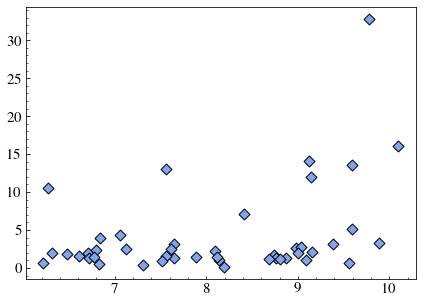

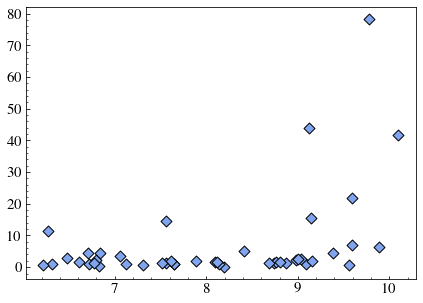

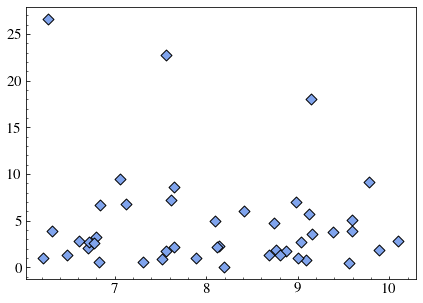

In [365]:
fig, ax1 = plt.subplots(1,1, figsize= (7,5), sharex = True)
plt.subplots_adjust(wspace=0.3)
good_chi2allC_FS = np.asarray(chi2allC_FS).copy()
good_chi2allC_FS[chi2allC_FS==0] = chi2allS_FS[chi2allC_FS==0]
good_chi2allS_FS = np.asarray(chi2allS_FS).copy()
good_chi2allS_FS[chi2allS_FS==0] = chi2allC_FS[chi2allS_FS==0]

ax1.scatter(classy['MstarTot'],good_chi2allC_FS+good_chi2allS_FS, color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = 'r', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2emiC_FS+good_chi2emiS_FS, color = 'g', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
fig, ax1 = plt.subplots(1,1, figsize= (7,5), sharex = True)
plt.subplots_adjust(wspace=0.3)
good_chi2absC_FS = np.asarray(chi2absC_FS)
good_chi2absC_FS[chi2absC_FS==0] = chi2absS_FS[chi2absC_FS==0]
good_chi2absS_FS = np.asarray(chi2absS_FS)
good_chi2absS_FS[chi2absS_FS==0] = chi2absC_FS[chi2absS_FS==0]
# plt.yscale('log')
ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = 'r', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2emiC_FS+good_chi2emiS_FS, color = 'g', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
fig, ax1 = plt.subplots(1,1, figsize= (7,5), sharex = True)
plt.subplots_adjust(wspace=0.3)
good_chi2emiC_FS = np.asarray(chi2emiC_FS)
good_chi2emiC_FS[chi2emiC_FS==0] = chi2emiS_FS[chi2emiC_FS==0]
good_chi2emiS_FS = np.asarray(chi2emiS_FS)
good_chi2emiS_FS[chi2emiS_FS==0] = chi2emiC_FS[chi2emiS_FS==0]
# plt.yscale('log')
ax1.scatter(classy['MstarTot'],good_chi2emiC_FS+good_chi2emiS_FS, color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+



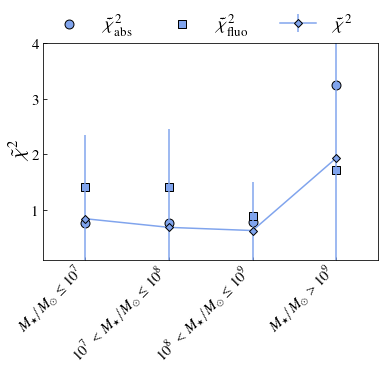

In [470]:
fig, ax1 = plt.subplots(1,1, figsize= (6,4), sharex = True)
plt.subplots_adjust(wspace=0.3)
good_chi2all_FS = np.asarray(chi2all_FS).copy()
# good_chi2all_FS[chi2allC_FS==0] = chi2all_FS[chi2allC_FS==0]
# good_chi2allS_FS = np.asarray(chi2allS_FS).copy()
# good_chi2allS_FS[chi2allS_FS==0] = chi2allC_FS[chi2allS_FS==0]
# print(np.median(good_chi2allC_FS+good_chi2allS_FS))
chi7 = np.median(np.array(good_chi2all_FS)[classy['MstarTot']<=7])
chi8 = np.median(np.array(good_chi2all_FS)[(classy['MstarTot']>7)&(classy['MstarTot']<=8)])
chi9 = np.median(np.array(good_chi2all_FS)[(classy['MstarTot']>8)&(classy['MstarTot']<=9)])
chi10 = np.median(np.array(good_chi2all_FS)[(classy['MstarTot']>9)&(classy['MstarTot']<=11)])
# chi7 = np.median(np.array(good_chi2allC_FS+good_chi2allS_FS)[classy['MstarTot']<7])
chi7s = np.std(np.array(good_chi2all_FS)[classy['MstarTot']<=7])
chi8s = np.std(np.array(good_chi2all_FS)[(classy['MstarTot']>7)&(classy['MstarTot']<=8)])
chi9s = np.std(np.array(good_chi2all_FS)[(classy['MstarTot']>8)&(classy['MstarTot']<=9)])
chi10s = np.std(np.array(good_chi2all_FS)[(classy['MstarTot']>9)&(classy['MstarTot']<=11)])

# ax1.scatter(classy['MstarTot'],good_chi2allC_FS+good_chi2allS_FS, color = cFS, edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
ax1.errorbar([6.5,7.5,8.5,9.5],[chi7,chi8,chi9,chi10],yerr = [chi7s,chi8s,chi9s,chi10s], color = cFS, 
             markeredgecolor = 'k', markersize = 5,
           label = r'$\tilde{\chi}^2$',marker='D')
# ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = 'r', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2emiC_FS+good_chi2emiS_FS, color = 'g', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# fig, ax1 = plt.subplots(1,1, figsize= (7,5), sharex = True)
# plt.subplots_adjust(wspace=0.3)
good_chi2abs_FS = np.asarray(chi2abs_FS).copy()
# good_chi2absC_FS[chi2absC_FS==0] = chi2absS_FS[chi2absC_FS==0]
# good_chi2absS_FS = np.asarray(chi2absS_FS).copy()
# good_chi2absS_FS[chi2absS_FS==0] = chi2absC_FS[chi2absS_FS==0]
chi7 = np.median(np.array(good_chi2abs_FS)[classy['MstarTot']<=7])
chi8 = np.median(np.array(good_chi2abs_FS)[(classy['MstarTot']>7)&(classy['MstarTot']<=8)])
chi9 = np.median(np.array(good_chi2abs_FS)[(classy['MstarTot']>8)&(classy['MstarTot']<=9)])
chi10 = np.median(np.array(good_chi2abs_FS)[(classy['MstarTot']>9)&(classy['MstarTot']<=11)])
# plt.yscale('log')
# ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = cFS, edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
ax1.scatter([6.5,7.5,8.5,9.5],[chi7,chi8,chi9,chi10], color = cFS, edgecolor = 'k', s = 80,
           label = r'$\tilde{\chi}^2_{\rm abs}$',marker='o')
# ax1.scatter(classy['MstarTot'],good_chi2absC_FS+good_chi2absS_FS, color = 'r', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# ax1.scatter(classy['MstarTot'],good_chi2emiC_FS+good_chi2emiS_FS, color = 'g', edgecolor = 'k', s = 60,
#            label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
# fig, ax1 = plt.subplots(1,1, figsize= (7,5), sharex = True)
plt.subplots_adjust(wspace=0.3)
good_chi2emi_FS = np.asarray(chi2emi_FS).copy()
# good_chi2emiC_FS[chi2emiC_FS==0] = chi2emiS_FS[chi2emiC_FS==0]
# good_chi2emiS_FS = np.asarray(chi2emiS_FS).copy()
# good_chi2emiS_FS[chi2emiS_FS==0] = chi2emiC_FS[chi2emiS_FS==0]
chi7 = np.median(np.array(good_chi2emi_FS)[classy['MstarTot']<=7])
chi8 = np.median(np.array(good_chi2emi_FS)[(classy['MstarTot']>7)&(classy['MstarTot']<=8)])
chi9 = np.median(np.array(good_chi2emi_FS)[(classy['MstarTot']>8)&(classy['MstarTot']<=9)])
chi10 = np.median(np.array(good_chi2emi_FS)[(classy['MstarTot']>9)&(classy['MstarTot']<=11)])
# plt.yscale('log')
ax1.scatter([6.5,7.5,8.5,9.5],[chi7,chi8,chi9,chi10], color = cFS, edgecolor = 'k', s = 80,
           label = r'$\tilde{\chi}^2_{\rm fluo}$',marker='s')

ax1.minorticks_off()
ax1.set_xticks([6.5,7.5,8.5,9.5])

ax1.set_xticklabels([r'$M_\star/M_\odot \leq 10^7$','$10^7$ $<$ $M_\star/M_\odot \leq 10^8$','$10^8$ $<$ $M_\star/M_\odot \leq 10^9$','$M_\star/M_\odot > 10^9$'],ha="right" ,rotation = 45)
plt.xlim(6,10)
plt.ylim(0.1,4)
plt.ylabel(r'$\tilde{\chi}^2$', fontsize = 20)
plt.legend(frameon=False, fontsize = 18, ncol = 3, loc=(0.,1))
# plt.savefig('Plots/chi2Mstar.pdf', bbox_inches = 'tight')

### Histogram of time-steps

Galaxies in output 148: 18
Galaxies in output 149: 4
Galaxies in output 150: 1
Galaxies in output 151: 0
Galaxies in output 152: 0


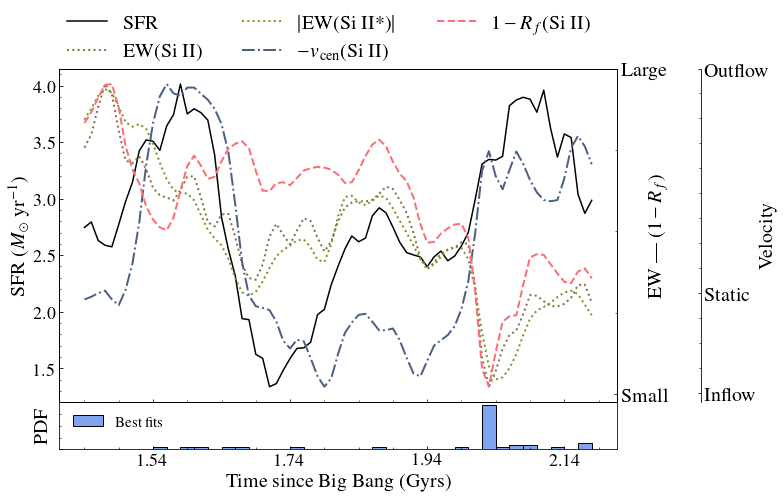

In [56]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (10,7))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[0:7, :8])
ax_xDist = plt.subplot(gs[7, :8],sharex=ax_main)

hist2 = ax_xDist.hist(allOutnoFS, bins = range(90,165,2), density = True, alpha = 1, label = 'Best fits', color =cFS,
                     edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR')
ax_xDist.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
ax_xDist.set_yticks([0,0.3])
ax_xDist.set_yticklabels(['',''])
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)

# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, loc = 'upper left')
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)

dd = ax_main.get_yticks()


xq = abs(EWabsSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm2 = xqm.copy()




xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =2, 
             color = cb_colors[2], label = 'EW(Si II)')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]
twin1.set_ylim(0.4, 4.2)
twin1.set_yticks([0.5, 4.5])
twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel('EW | ($1-R_f$)', fontsize = 20, labelpad = -20,)
twin1.yaxis.label.set_color('k')



xq = gaussian_filter(EWemiSiIIdep, sigma = 1)
xqm = np.median(xq, axis = 1)
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm2 = xqm.copy()
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 1), linestyle = ':', linewidth =2,
             color = cb_colors[0], label = '$|$EW(Si II*)$|$')




xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqm2=xqm.copy()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
             color = cb_colors[1], label = r'$-v_{\rm cen}$(Si II)')
twin2 = ax_main.twinx()
twin2.spines['right'].set_position(("axes", 1.15))

twin2.set_ylim(0.4, 4.2)
twin2.set_yticks([0.5,1.64,4.2])
twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
twin2.set_ylabel('Velocity', fontsize = 20, labelpad =-10)
twin2.yaxis.label.set_color('k')


xq = abs(1-RSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), xqm, linestyle = '--', linewidth =2,
             color = cb_colors[4], label = '$1-R_f$(Si II)')


ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= (0,1))



print(f'Galaxies in output 148: {np.sum(allOutnoFS==148)}')
print(f'Galaxies in output 149: {np.sum(allOutnoFS==149)}')
print(f'Galaxies in output 150: {np.sum(allOutnoFS==150)}')
print(f'Galaxies in output 151: {np.sum(allOutnoFS==151)}')
print(f'Galaxies in output 152: {np.sum(allOutnoFS==151)}')

plt.savefig('Plots/SFR_histogram_depall.pdf', bbox_inches = 'tight')

#### Sketch

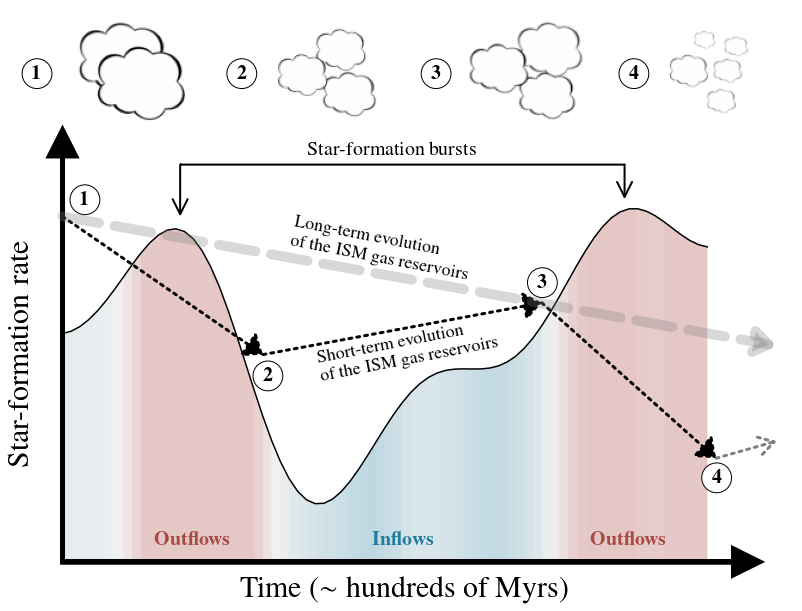

In [29]:
# Sketch
allOutnoFS = pd.read_csv('csv/Classy_depletion_fit.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (14,9))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[0:8, :8])
# ax_yDist = plt.subplot(gs[0, :8],sharey=ax_main)
# ax_xDist.hist(ClassAbs['EWSiII'],bins=10,align='mid', density=True, alpha = 0.3, label = 'CLASSY', color= cFS)
# ax_xDist.hist(np.flip(EWabsSiIIdu.flatten()[:]),bins=10,align='mid', density=True, alpha = 0.3, 
#               label = 'Simulation', color = cnoFS)

# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_xDist.bar(range(90,165,2), allval, alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(SFR100, sigma = 5), c ='k', label = 'SFR')
ax_main.set_xlabel(r'Time ($\sim$ hundreds of Myrs)', fontsize = 30, labelpad = -20)
ax_main.set_ylabel(r'Star-formation rate', fontsize = 30, labelpad = -20)
# ax_main.set_xticks([100,120,140, 160])
# ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], fontsize = 18)
# ax_main.set_yticklabels(fontsize = 18)
# ax_main.legend(fontsize = 13)

# ax_yDist.imshow(newAv.T, cmap = 'plasma', interpolation='bilinear', vmin = 0.1, alpha = 0.5)

plt.subplots_adjust(wspace=0, hspace=0)
ax_main.set_yticks([])
ax_main.set_xticks([])
# ax_main.axis('off')
# im = plt.imread('zzzpng.png')
# newax = fig.add_axes([0.05,0.15,0.1,0.15], anchor='SW', zorder=1)
# newax.imshow(im)
# newax.axis('off')

# for direction in ["xzero", "yzero"]:
for side in ['right','top', 'bottom', 'left']:
    ax_main.spines[side].set_visible(False)
    
# ax_main.plot(1, 0, "<k",  clip_on=False)
# ax_main.plot(0, 1, "^k",  clip_on=False)

ax_main.arrow(90, 1.5, 80, 0, fc='k', ec='k', lw = 5, 
         head_width=0.15, head_length=3, 
         length_includes_head= True, clip_on = False) 
 
ax_main.arrow(90, 1.5, 0, 2.5, fc='k', ec='k', lw = 5, 
         head_width=3, head_length=0.15, 
         length_includes_head= True, clip_on = False) 
# ax.arrow(0, ymin, 0., ymax-ymin, fc='k', ec='k', lw = lw, 
#          head_width=yhw, head_length=yhl, overhang = ohg, 
#          length_includes_head= True, clip_on = False) 


# for side in ['bottom','left']:
# ax_main.plot(1, 0, ">k", transform=ax_main.get_yaxis_transform(), clip_on=False)
# ax.plot(0, 1, "^k", transform=ax.get_xaxis_transform(), clip_on=False)
# ax_main.axis[direction].set_visible(True)

        # added to invert the label from right to left.
#         ax.axis["yzero"].invert_ticklabel_direction()

        # set 'left' to be invisible
#         for direction in ["left", "right", "top"]:  # for direction in ["right", "top"]:
#             ax.axis[direction].set_visible(False)
            
newSFR = gaussian_filter(SFR100, sigma = 5)
xx = np.arange(90,165,1)
xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 2)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(newSFR) - np.min(newSFR))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(newSFR) - np.min(newSFR)) + np.min(newSFR)
yy = xqm
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(newSFR) - np.min(newSFR)) + np.min(newSFR)


# plt.plot(xx,yy)
cb_colors = ["#227C9D","#D3D3D3" ,"#AA4A44"]


num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
colourmap = cmap2
normalize = matplotlib.colors.Normalize(vmin=-5, vmax=40)
npts = 75
for i in range(npts - 1):
#     print( xqm[i],np.max(xqm), xqm[i]/np.max(xqm[i]))
#     ax_main.axvspan(xx[i]
#                     , xx[i+1], ymin=0.1, ymax = 1.*xqm[i]/np.max(xqm)/1.5,
#                      color=colourmap(normalize(yy[i]))
#                      ,alpha=0.3, edgecolor = 'None', lw=0)
    ax_main.fill_between([xx[i],xx[i+1]], np.zeros(2)+1.5, [newSFR[i], newSFR[i+1]],
                 color=colourmap(normalize(yy[i]))
                 ,alpha=0.3, edgecolor = 'None', lw=0)
# plt.show()
plt.text(100.5, 1.6, r'\bf Outflows', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(150.5, 1.6, r'\bf Outflows', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(125.5, 1.6, r'\bf Inflows', color = '#227C9D', alpha = 1, fontsize = 20)


prop = dict(arrowstyle="-|>,head_width=0.8,head_length=1",lw=3,ls = 'dotted',color='k',
            shrinkA=0,shrinkB=0)


# ax_main.annotate("", xy=(95,3.5), xytext=(90,3.5),
#                  arrowprops = dict(arrowstyle="-|>,head_width=0.01,head_length=0.",lw=3,ls = 'dotted',color='k',))
                 
                 
ax_main.annotate("", xy=(113,2.7), xytext=(90,3.5), arrowprops=prop)
ax_main.annotate(r"\bf 1",(92,3.57), 
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

ax_main.annotate(r"\bf 2",(113,2.55), 
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

ax_main.annotate(r"\bf 3",(144.5,3.09), 
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

ax_main.annotate(r"\bf 4",(164.5,1.96), 
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)
# ax_main.annotate("", xy=(113,2.7), xytext=(108,2.7),
#                  arrowprops = dict(arrowstyle="-|>,head_width=0.01,head_length=0.",lw=3,ls = 'dotted',color='k',))
ax_main.annotate("", xy=(145,3.), xytext=(113,2.7), arrowprops=prop)
#ax_main.annotate("", xy=(148,3.1), xytext=(130,3.1),
  #               arrowprops = dict(arrowstyle="-|>,head_width=0.01,head_length=0.",lw=3,ls = 'dotted',color='k'))
ax_main.annotate("", xy=(165,2.1), xytext=(145,3.), arrowprops=prop)
# ax_main.annotate("", xy=(165,1.9), xytext=(157,1.9),
#                  arrowprops = dict(arrowstyle="-|>,head_width=0.01,head_length=0.",lw=3,ls = 'dotted',color='gray'))
# ax_main.annotate("", xy=(168,2.4), xytext=(165,1.9),
#                  arrowprops = dict(arrowstyle="-|>,head_width=0.01,head_length=0.",lw=3,ls = 'dotted',color='gray'))
ax_main.annotate("", xy=(172,2.2), xytext=(165,2.1), 
                 arrowprops= dict(arrowstyle="->,head_width=0.6,head_length=1",lw=3,ls = 'dotted',color='gray',
            shrinkA=0,shrinkB=0))



ax_main.annotate("", xy=(172,2.75), xytext=(90,3.5), 
                 arrowprops= dict(arrowstyle="-|>,head_width=0.7,head_length=1",lw=10,ls = 'dashed',
                                  color='gray', alpha = 0.3,
            shrinkA=0,shrinkB=0),)


# ax_main.annotate("", xy=(144,3.5), xytext=(135,3.5), 
#                  arrowprops=dict(arrowstyle="-|>,head_width=0.5,head_length=0.7",ls = 'dotted',lw=3,color='k'), va='center',
#                  multialignment='left', fontsize = 20)
# ax_main.text(112, 3.42, "Short-term evolution\n of gas reservoirs", fontsize = 20)

### SFR peaks
ax_main.annotate("", xy=(103.5,3.5), xytext=(103.5,3.8), 
                 arrowprops= dict(arrowstyle="->,head_width=0.5,head_length=1",lw=2,color='k',
            shrinkA=0,shrinkB=0))

ax_main.annotate("", xy=(154.5,3.6), xytext=(154.5,3.8), 
                 arrowprops= dict(arrowstyle="->,head_width=0.5,head_length=1",lw=2,color='k',
            shrinkA=0,shrinkB=0))

ax_main.annotate("", xy=(103.5,3.8), xytext=(154.5,3.8), 
                 arrowprops= dict(arrowstyle="->,head_width=0.01,head_length=0",lw=2,color='k',
            shrinkA=0,shrinkB=0))


# ax_main.text(173,2.2, "Short-term evolution\n of the ISM gas reservoirs", fontsize = 18)
ax_main.text(119,2.55, "Short-term evolution\n of the ISM gas reservoirs", fontsize = 18,rotation =11)

ax_main.text(116,3.14, "Long-term evolution\n of the ISM gas reservoirs", fontsize = 18, rotation=-11)
# ax_main.text(173,2.6, "Long-term evolution\n of the ISM gas reservoirs", fontsize = 18)




im = plt.imread('ISMgas2.png')
newax = fig.add_axes([0.13,0.85,0.75,1], anchor='SW', zorder=1)
newax.imshow(im)
newax.axis('off')

ax_main.text(86.5,4.3, r"\bf 1",
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20, zorder = 10)

ax_main.text(110,4.3, r"\bf 2",
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20, zorder = 10)

ax_main.text(132.3,4.3, r"\bf 3",
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20, zorder = 10)

ax_main.text(155,4.3, r"\bf 4",
             bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20, zorder = 10)

# ax_main.annotate(r"\bf 2",(113,4.25), 
#              bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

# ax_main.annotate(r"\bf 3",(144.5,4.25), 
#              bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

# ax_main.annotate(r"\bf 4",(164.5,4.25), 
#              bbox={"boxstyle" : "circle", "facecolor":"white", "edgecolor":"black"}, fontsize = 20)

# ax_main.text(175, 4.25,'ISM gas evolution', fontsize = 20)

# arrow = plt.arrow(0, 0, 0.5, 0.6,label='My label')

# plt.legend([arrow,], ['My label',])
# plt.annotate("Gas reservoirs", xy=(174,4.3), xytext=(165,4.1), 
#                  arrowprops= dict(arrowstyle="-|>,head_width=0.01,head_length=0",lw=3,ls = 'dotted',color='gray',
#             shrinkA=0,shrinkB=0))

ax_main.text(118, 3.86,'Star-formation bursts', fontsize = 20)
# ax_main.text(173, 3.77,'Star-formation bursts', fontsize = 18)

plt.savefig('Plots/SFR_histogram_sketch.pdf', bbox_inches = 'tight')

[ 31.79831746  29.88128308  26.6465033   45.31037103  32.08208925
  23.34299353  37.33280387  52.01599362  50.34528684 103.39023828
  97.5508976   99.76557701 114.5222286   92.1623035   86.32808527
  92.33545153  93.09328212  86.54005861  85.64924665  86.07050815
  78.73450195  78.36229284  56.4249028   41.14988778  39.80511482
  48.21349172  58.52138073  54.8297416   42.3805396   27.88368266
  28.74379444  39.56147325  37.93820577  29.42089364  19.21831091
  16.50451993  13.50979732  21.53499125  37.43024276  32.33619808
  37.60890113  35.39012693  30.94304036  25.10731019  27.42678901
  41.87936431  36.58988865  39.43707353  31.24299577  26.42928713
  27.84704308  33.33117182  31.88774193  36.05264876  26.9540437
  44.01548524  52.82789088  50.7962689  141.17507657 119.59043414
  90.21346818  86.31586503  72.75069314  97.98725408  62.68504675
  64.00317913  61.22697315  50.50504363  86.03327662  70.29610259
 103.26146005 107.80231872 103.42710605 108.82686679  97.36705946]
Galaxies i

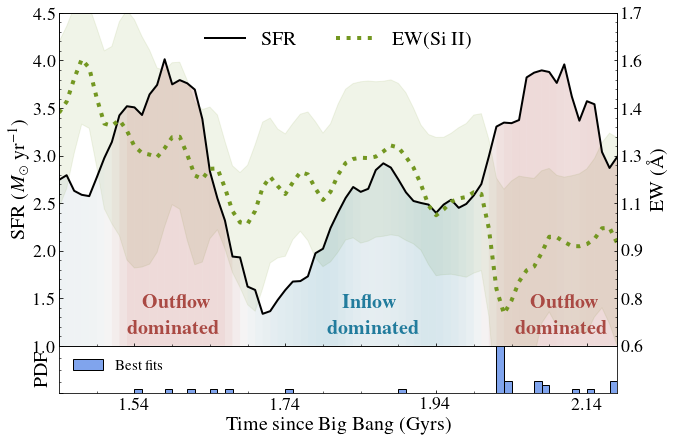

In [812]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit_V2.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (10,7))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[0:7, :8])
ax_xDist = plt.subplot(gs[7, :8],sharex=ax_main)

hist2 = ax_xDist.hist(allOutnoFS, bins = range(90,165,1), density = True, alpha = 1, label = 'Best fits', color =cFS,
                     edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(SFR100, sigma = 0), c ='k', label = 'SFR', linewidth =2)
ax_xDist.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
ax_xDist.set_yticks([0,0.3])
ax_xDist.set_yticklabels(['',''])
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)
ax_main.set_ylim(1., 4.5)
ax_main.set_xlim(90,164)
ax_xDist.set_ylim(0,0.3)
# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, loc = 'upper left')
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)

dd = ax_main.get_yticks()

print(np.percentile(xq, 84, axis = 1))
xq = abs(EWabsSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =4, 
             color = '#739721', label = 'EW(Si II)')
ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
                     xqm-xqs16,
                     alpha=0.1,
             color = '#739721')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks(dd)

twin1.set_yticklabels(tick_function(dd), size = 18)

# twin1.set_ylim(0.4, 4.2)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'EW (\AA)', fontsize = 20)
twin1.yaxis.label.set_color('k')



# xq = gaussian_filter(EWemiSiIIdep, sigma = 1)
# xqm = np.median(xq, axis = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm2 = xqm.copy()
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 1), linestyle = ':', linewidth =2,
#              color = cb_colors[0], label = '$|$EW(Si II*)$|$')




# xq = -VcenSiIIdep
# xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
# xqm2=xqm.copy()
# def tick_function(X):
#     V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
#     return ["%.1f" % z for z in V]
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
#              color = cb_colors[1], label = r'$-v_{\rm cen}$(Si II)')
# twin2 = ax_main.twinx()
# twin2.spines['right'].set_position(("axes", 1.15))

# twin2.set_ylim(0.4, 4.2)
# twin2.set_yticks([0.5,1.64,4.2])
# twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
# twin2.set_ylabel('Velocity', fontsize = 20, labelpad =-10)
# twin2.yaxis.label.set_color('k')


# xq = abs(1-RSiIIdep)
# xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), xqm, linestyle = '--', linewidth =2,
#              color = cb_colors[4], label = '$1-R_f$(Si II)')


ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= 'upper center')

cb_colors = ["#227C9D","#D3D3D3" ,"#AA4A44"]

xx = np.arange(90,165,1)
xx = np.arange(90,165,1)
xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 2)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(newSFR) - np.min(newSFR))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(newSFR) - np.min(newSFR)) + np.min(newSFR)
yy = xqm
num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
colourmap = cmap2
normalize = matplotlib.colors.Normalize(vmin=-5, vmax=40)
npts = 75
for i in range(npts - 1):
#     print( xqm[i],np.max(xqm), xqm[i]/np.max(xqm[i]))
#     ax_main.axvspan(xx[i]
#                     , xx[i+1], ymin=0.1, ymax = 1.*xqm[i]/np.max(xqm)/1.5,
#                      color=colourmap(normalize(yy[i]))
#                      ,alpha=0.3, edgecolor = 'None', lw=0)
    ax_main.fill_between([xx[i],xx[i+1]], np.zeros(2)+1., [SFR100[i], SFR100[i+1]],
                 color=colourmap(normalize(yy[i]))
                 ,alpha=0.2, edgecolor = 'None', lw=0)
# plt.show()
plt.text(99., 1.4, r'\bf Outflow \\ \\ dominated', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(150.5, 1.4, r'\bf Outflow \\ \\ dominated', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(125.5, 1.4, r'\bf Inflow \\ \\ dominated', color = '#227C9D', alpha = 1, fontsize = 20)



print(f'Galaxies in output 148: {np.sum(allOutnoFS==148)}')
print(f'Galaxies in output 149: {np.sum(allOutnoFS==149)}')
print(f'Galaxies in output 150: {np.sum(allOutnoFS==150)}')
print(f'Galaxies in output 151: {np.sum(allOutnoFS==151)}')
print(f'Galaxies in output 152: {np.sum(allOutnoFS==151)}')

# plt.savefig('Plots/SFR_histogram_EWSiII.pdf', bbox_inches = 'tight')

In [817]:
xq = abs(EWabsSiIIdep)

print(scipy.stats.iqr(np.array(xq)[SFR100>3]))
print(scipy.stats.iqr(np.array(xq)[SFR100<3]))
print(np.median(SFR100))

0.510772452283403
0.3866049242595174
2.771


Galaxies in output 148: 19
Galaxies in output 149: 3
Galaxies in output 150: 0
Galaxies in output 151: 0
Galaxies in output 152: 0


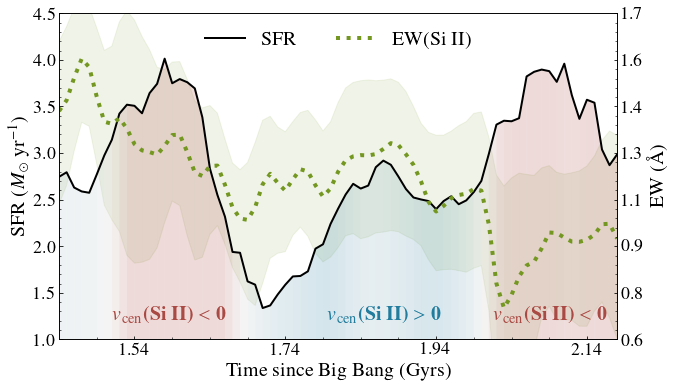

In [15]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit_V2.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax_main = plt.subplots(1,1, figsize= (10,6))
# gs = GridSpec(8, 8)
# ax_main = plt.subplot(gs[0:7, :8])
# ax_xDist = plt.subplot(gs[7, :8],sharex=ax_main)

# hist2 = ax_xDist.hist(allOutnoFS, bins = range(90,165,1), density = True, alpha = 1, label = 'Best fits', color =cFS,
#                      edgecolor = 'k')
# allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(SFR100, sigma = 0), c ='k', label = 'SFR', linewidth =2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_ylabel('PDF', fontsize = 20)
# ax_xDist.set_yticks([0,0.3])
# ax_xDist.set_yticklabels(['',''])
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)
ax_main.set_ylim(1., 4.5)
ax_main.set_xlim(90,164)
# ax_xDist.set_ylim(0,0.3)
# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
# ax_xDist.legend(frameon = False, loc = 'upper left')
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)

dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(EWabsSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =4, 
             color = '#739721', label = 'EW(Si II)')
ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
                     xqm-xqs16,
                     alpha=0.1,
             color = '#739721')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks(dd)

twin1.set_yticklabels(tick_function(dd), size = 18)

# twin1.set_ylim(0.4, 4.2)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'EW (\AA)', fontsize = 20)
twin1.yaxis.label.set_color('k')



# xq = gaussian_filter(EWemiSiIIdep, sigma = 1)
# xqm = np.median(xq, axis = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm2 = xqm.copy()
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 1), linestyle = ':', linewidth =2,
#              color = cb_colors[0], label = '$|$EW(Si II*)$|$')




# xq = -VcenSiIIdep
# xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
# xqm2=xqm.copy()
# def tick_function(X):
#     V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
#     return ["%.1f" % z for z in V]
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
#              color = cb_colors[1], label = r'$-v_{\rm cen}$(Si II)')
# twin2 = ax_main.twinx()
# twin2.spines['right'].set_position(("axes", 1.15))

# twin2.set_ylim(0.4, 4.2)
# twin2.set_yticks([0.5,1.64,4.2])
# twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
# twin2.set_ylabel('Velocity', fontsize = 20, labelpad =-10)
# twin2.yaxis.label.set_color('k')


# xq = abs(1-RSiIIdep)
# xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), xqm, linestyle = '--', linewidth =2,
#              color = cb_colors[4], label = '$1-R_f$(Si II)')


ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= 'upper center')

cb_colors = ["#227C9D","#D3D3D3" ,"#AA4A44"]

xx = np.arange(90,165,1)
xx = np.arange(90,165,1)
xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 2)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(newSFR) - np.min(newSFR))
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(newSFR) - np.min(newSFR)) + np.min(newSFR)
yy = xqm
num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
colourmap = cmap2
normalize = matplotlib.colors.Normalize(vmin=-5, vmax=40)
npts = 75
for i in range(npts - 1):
#     print( xqm[i],np.max(xqm), xqm[i]/np.max(xqm[i]))
#     ax_main.axvspan(xx[i]
#                     , xx[i+1], ymin=0.1, ymax = 1.*xqm[i]/np.max(xqm)/1.5,
#                      color=colourmap(normalize(yy[i]))
#                      ,alpha=0.3, edgecolor = 'None', lw=0)
    ax_main.fill_between([xx[i],xx[i+1]], np.zeros(2)+1., [SFR100[i], SFR100[i+1]],
                 color=colourmap(normalize(yy[i]))
                 ,alpha=0.2, edgecolor = 'None', lw=0)
# plt.show()
plt.text(97., 1.2, r'\bf $v_{\rm cen}$(Si II) $ < $ 0', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(147.5, 1.2, r'\bf $v_{\rm cen}$(Si II) $ < $ 0', color = '#AA4A44', alpha = 1, fontsize = 20)
plt.text(125.5, 1.2, r'\bf $v_{\rm cen}$(Si II) $ > $ 0', color = '#227C9D', alpha = 1, fontsize = 20)



print(f'Galaxies in output 148: {np.sum(allOutnoFS==148)}')
print(f'Galaxies in output 149: {np.sum(allOutnoFS==149)}')
print(f'Galaxies in output 150: {np.sum(allOutnoFS==150)}')
print(f'Galaxies in output 151: {np.sum(allOutnoFS==151)}')
print(f'Galaxies in output 152: {np.sum(allOutnoFS==151)}')



# plt.savefig('Plots/SFR_histogram_EWSiII.pdf', bbox_inches = 'tight')

In [368]:
print(np.corrcoef(-gaussian_filter(np.median(VcenSiIIdep, axis = 1), sigma = 2), SFR100))
xq = abs(EWabsSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
print(np.corrcoef(np.gradient(gaussian_filter(np.median(xq, axis = 1), sigma = 2)), np.gradient(SFR100)))

[[1.         0.77867728]
 [0.77867728 1.        ]]
[[ 1.         -0.02691502]
 [-0.02691502  1.        ]]


In [376]:
v_cm = np.genfromtxt('./dat_files//vcm_90_164.dat',unpack=True)
all_nmed = np.zeros((75, 300))
for output in range(90,165,1):
    l_c, flux_c = read_spectrum_c('CII_SiII_depletion/',output )
    l_si, flux_si = read_spectrum_si('CII_SiII_depletion/',output )
    vGal = v_cm[:,output-90]

    for idir in range(300):
        l_sys_c = l_c + np.dot(directions[idir,:],vGal)/c_cgs*1e5*np.mean(l_c)
        l_sys_c =l_sys_c[1:]
        vcII   = (l_sys_c/wcII1334 -1)*c
        all_nmed[output-90, idir] =  np.nanmedian(flux_c[idir,1:])

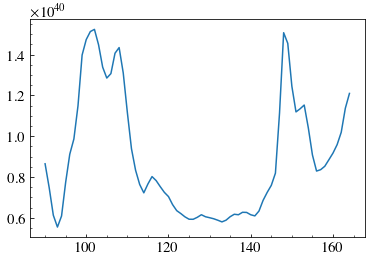

In [381]:
plt.plot(np.arange(90,165,1), np.median(gaussian_filter(all_nmed, sigma = 1), axis = 1))

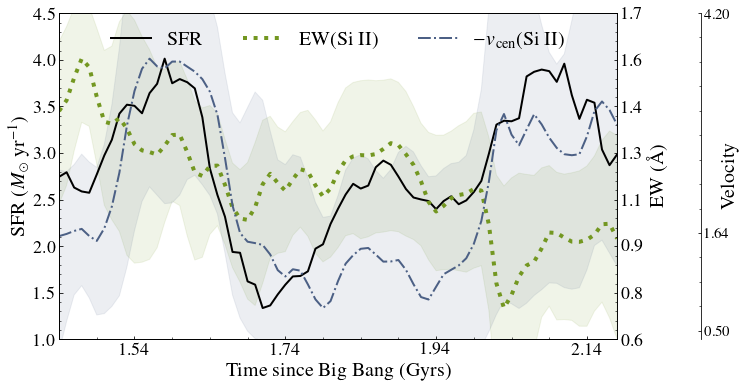

In [130]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit_V2.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax_main = plt.subplots(1,1, figsize= (10,6))
# gs = GridSpec(8, 8)
# ax_main = plt.subplot(gs[0:7, :8])
# ax_xDist = plt.subplot(gs[7, :8],sharex=ax_main)

# hist2 = ax_xDist.hist(allOutnoFS, bins = range(90,165,1), density = True, alpha = 1, label = 'Best fits', color =cFS,
#                      edgecolor = 'k')
# allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(SFR100, sigma = 0), c ='k', label = 'SFR', linewidth =2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_ylabel('PDF', fontsize = 20)
# ax_xDist.set_yticks([0,0.3])
# ax_xDist.set_yticklabels(['',''])
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)
ax_main.set_ylim(1., 4.5)
ax_main.set_xlim(90,164)
# ax_xDist.set_ylim(0,0.3)
# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
# ax_xDist.legend(frameon = False, loc = 'upper left')
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)

dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(EWabsSiIIdep)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =4, 
             color = '#739721', label = 'EW(Si II)')
ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
                     xqm-xqs16,
                     alpha=0.1,
             color = '#739721')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks(dd)

twin1.set_yticklabels(tick_function(dd), size = 18)

# twin1.set_ylim(0.4, 4.2)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'EW (\AA)', fontsize = 20)
twin1.yaxis.label.set_color('k')



# xq = gaussian_filter(EWemiSiIIdep, sigma = 1)
# xqm = np.median(xq, axis = 1)
# xqs = np.std(xq, axis = 1)
# xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
# xqm2 = xqm.copy()
# xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
# ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 1), linestyle = ':', linewidth =2,
#              color = cb_colors[0], label = '$|$EW(Si II*)$|$')




xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)

xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)

xqm2=xqm.copy()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
             color = cb_colors[1], label = r'$-v_{\rm cen}$(Si II)')
twin2 = ax_main.twinx()
twin2.spines['right'].set_position(("axes", 1.15))

twin2.set_ylim(0.4, 4.2)
twin2.set_yticks([0.5,1.64,4.2])
# twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
twin2.set_ylabel('Velocity', fontsize = 20, labelpad =-10)
twin2.yaxis.label.set_color('k')



ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
                     xqm-xqs16,
                     alpha=0.1,
             color = cb_colors[1])


ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= 'upper center')

cb_colors = ["#227C9D","#D3D3D3" ,"#AA4A44"]



# plt.savefig('Plots/SFR_histogram_EWSiII.pdf', bbox_inches = 'tight')

KendalltauResult(correlation=-0.007929356769595459, pvalue=0.9198398281229578)
KendalltauResult(correlation=0.5694719861800376, pvalue=4.92120316675594e-13)


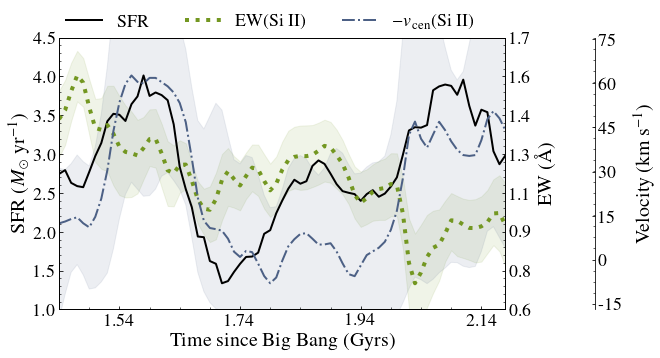

In [9]:
# OUTPUT and DIR
allOutnoFS = pd.read_csv('csv/Classy_dep_fit_V2.csv')['OutputAll'][~maskInc]
cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]

fig, (ax_main) = plt.subplots(1,1, figsize= (8,5))

ax_main.plot(np.arange(90,165, 1), gaussian_filter(SFR100, sigma = 0), c ='k', label = 'SFR', linewidth =2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_main.set_xticks([])

ax_main.tick_params(axis='y', which='major', labelsize=18)
ax_main.set_ylim(1., 4.5)
ax_main.set_xlim(90,164)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)


dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(EWabsSiIIdep)

xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
print(scipy.stats.kendalltau(xqm, SFR100))

xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(Mgas/1e9) - np.min(Mgas/1e9)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(Mgas/1e9) - np.min(Mgas/1e9)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =4, 
             color = '#739721', label = 'EW(Si II)')
ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
                     xqm-xqs16,
                     alpha=0.1,
             color = '#739721')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % z for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks(dd[:])

twin1.set_yticklabels(tick_function(dd)[:], size = 18)

# twin1.set_ylim(0.4, 4.2)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'EW (\AA)', fontsize = 20)
twin1.yaxis.label.set_color('k')






dd = ax_main.get_yticks()


xq = -VcenSiIIdep
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
print(scipy.stats.kendalltau(xqm, SFR100))

xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)

xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)

xqm2=xqm.copy()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.0f" % z for z in V]
xqs = np.std(xq, axis = 1)
xqs = xqs/(np.max(xqm) - np.min(xqm))*(np.max(SFR100) - np.min(SFR100))
xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = '-.', linewidth =2, 
             color = cb_colors[1], label = r'$-v_{\rm cen}$(Si II)')
twin2 = ax_main.twinx()
# twin2.spines['right'].set_position(("axes", 1.15))

twin2.spines['right'].set_position(("axes", 1.2))

twin2.set_ylim(ax_main.get_ylim())
dd = [1.073, 1.643, 2.203, 2.203+0.57,2.203+2*0.57, 2.203+3*0.57, 2.203+4*0.57]
twin2.set_yticks(dd)

twin2.set_yticklabels(tick_function(dd), size = 18)
# twin2.set_ylim(0.4, 4.2)
# twin2.set_yticks([0.5,1.64,4.2])
# twin2.set_yticklabels(['Inflow', 'Static', 'Outflow'], fontsize = 20)
twin2.set_ylabel('Velocity (km s$^{-1}$)', fontsize = 20, labelpad =10)
twin2.yaxis.label.set_color('k')



ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
       xqm-xqs16,
                     alpha=0.1,
             color = cb_colors[1])


ax_main.legend(frameon = False, fontsize = 18, ncol = 3, loc= (0,1))




# plt.savefig('Plots/SFR_histogram_EWSiII.pdf', bbox_inches = 'tight')



# Aperture effects

## Plot CLASSY Fluo emission

In [42]:
d_A = cosmo.angular_diameter_distance(z=3).value
theta = 1 # arcsec
theta_radian = theta * np.pi / 180 / 3600
distance_coskpc = d_A * theta_radian *1e3
print(distance_coskpc)

d_A = cosmo.angular_diameter_distance(z=4.1).value
theta = 1 # arcsec
theta_radian = theta * np.pi / 180 / 3600
distance_coskpc = d_A * theta_radian *1e3
print(distance_coskpc)

7.891588558946613
7.045156205864084


In [35]:
for i in range(len(galaxy)):

    d_A = cosmo.angular_diameter_distance(z=classy.loc[classy.Galaxy == label[i].upper(), 'redshift'].values).value
    theta = 1.25 # arcsec
    theta_radian = theta * np.pi / 180 / 3600
    distance_coskpc = d_A * theta_radian *1e3
    classy.loc[classy.Galaxy == label[i].upper(), 'rcoskpc'] = distance_coskpc

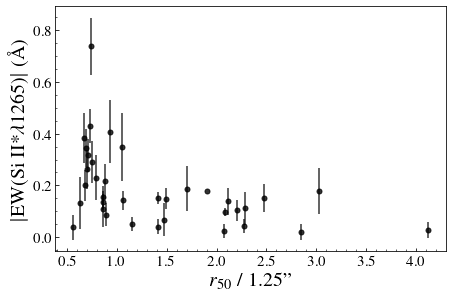

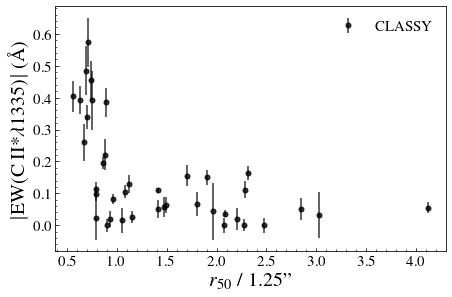

In [60]:
            
z = np.polyfit(classy['rcoskpc'][~maskInc],classy['redshift'][~maskInc], 2)
p = np.poly1d(z)

def tick_function(X):
    V = p(X)
    return ["%.2f" % z for z in V]

fig, ax= plt.subplots(1,1, figsize =(7,4.5))


d = classy['fr50aper']#classy['r50kpc']/classy['rcoskpc']
ax.errorbar(d[~maskInc],classy['EWemiSiII1260Fluo'][~maskInc], 
                yerr = ClassFluo['ErrEWFluoSiII'][~maskInc],
                label = 'CLASSY galaxies', c = 'k', linestyle = 'None', marker = 'o', markersize = 5, 
            markeredgecolor = 'k', alpha = 0.8)

    
ax.set_xlabel(r'$r_{50}$ / 1.25"', fontsize = 20)
ax.set_ylabel(r'$|$EW(Si II*$\lambda$1265)$|$ ($\rm \AA$)', fontsize = 20)
plt.savefig('Plots/FluoClassySiII.pdf', bbox_inches = 'tight')



fig, ax= plt.subplots(1,1, figsize =(7,4.5))
ax.set_xlabel(r'$r_{50}$ / 1.25"', fontsize = 20)
ax.errorbar(d[~maskInc],ClassFluo['EWFluoCII'][~maskInc], 
                yerr = classy['ErrEWemiCII334Fluo'][~maskInc],
                label = 'CLASSY', c = 'k', linestyle = 'None', marker = 'o', markersize = 5, 
            markeredgecolor = 'k', alpha = 0.8)
ax.set_ylabel(r'$|$EW(C II*$\lambda$1335)$|$  ($\rm \AA$)', fontsize = 20)
ax.legend(frameon = False, fontsize = 15, loc = 'upper right')

plt.savefig('Plots/FluoClassyCII.pdf', bbox_inches = 'tight')
    

0     0.566590
1     0.129239
2          NaN
3     0.234111
4     0.029550
5     0.000000
6     0.215778
7     0.181270
8     0.320445
9     0.013992
10    0.264385
11    0.000000
12         NaN
13    0.458223
14         NaN
15    0.177638
16    0.142345
17    0.257683
18         NaN
19    0.174529
20    0.485337
21    0.101213
22    0.169824
23         NaN
24    0.182675
25    0.307109
26    0.246338
27    0.066850
28         NaN
29    0.266349
30    0.005655
31    0.142082
32    0.130270
33    0.103207
34         NaN
35    0.264959
36         NaN
37    0.369326
38    0.437391
39    0.094196
40    0.111805
41         NaN
42    0.377934
43    0.268005
44    0.392072
Name: EWFluoSiII, dtype: float64


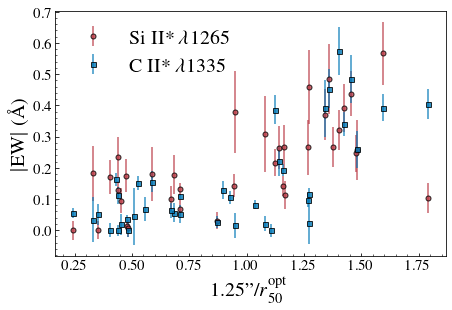

In [61]:
fig, ax= plt.subplots(1,1, figsize =(7,4.5))


d = classy['fr50aper']#classy['r50kpc']/classy['rcoskpc']
ax.errorbar(1/d[~maskInc],ClassFluo['EWFluoSiII'][~maskInc], 
                yerr = ClassFluo['ErrEWFluoSiII'][~maskInc],
                label = 'Si II* $\lambda$1265',   c = '#BA3B46', linestyle = 'None', marker = 'o', markersize = 5, 
            markeredgecolor = 'k', alpha = 0.8)

ax.errorbar(1/d[~maskInc],ClassFluo['EWFluoCII'][~maskInc], 
                yerr = classy['ErrEWemiCII334Fluo'][~maskInc],
            label = 'C II* $\lambda$1335',   c = '#0077B6', linestyle = 'None', marker = 's', markersize = 5, 
            markeredgecolor = 'k', alpha = 0.8)

ax.set_xlabel(r'1.25"/$r_{50}^{\rm opt}$', fontsize = 20)
ax.set_ylabel(r'$|$EW$|$ ($\rm \AA$)', fontsize = 20)
ax.legend(frameon=False, fontsize = 20)
plt.savefig('Plots/FluoClassySiIICII.pdf', bbox_inches = 'tight')

print(ClassFluo['EWFluoSiII'][~maskInc])

## Fits cube

### Read cubes

In [22]:
dfFS   = pd.read_csv('csv/Classy_dep_fit.csv')
# dfcube1   = pd.read_csv('Classy_cube_freefit.csv')
dfcube1   = pd.read_csv('csv/Classy_cubedep_peakfit.csv')

nxy,imsize,lcubecII,cubecII = read_cube('./data_cubes_output_148/CII_dep/',300)
# print(nxy)
nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII_dep/',300)

### Plots fits

In [665]:
print(classy['Galaxy'][(classy['fr50aper'] > 1) & (dfFS['OutputAll'] ==148)])

1     J0036-3333
2     J0127-0619
5     J0405-3648
9     J0934+5514
11    J0940+2935
12    J0942+3547
15    J1016+3754
16    J1024+0524
21    J1119+5130
22    J1129+2034
24    J1132+5722
27    J1150+1501
30    J1225+6109
39    J1444+4237
42    J1525+0757
Name: Galaxy, dtype: object


0 0
1 1
j0036-3333
OLD 6.238534293412349 8.038574291604867 9.367370582090906
New 3.4414579475295435 2.549327740023616 5.722290919144052


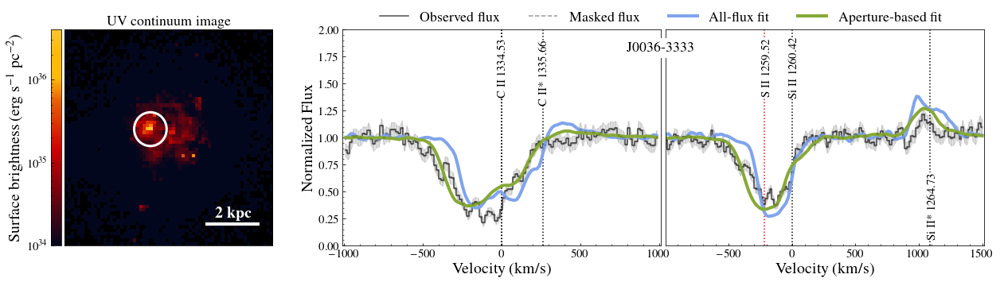

2 2
j0127-0619
OLD 0.8884026149443429 2.683080610144704 0.7269222540917452
New 0.9314604395749176 0.9063647907836595 0.8695516103043172


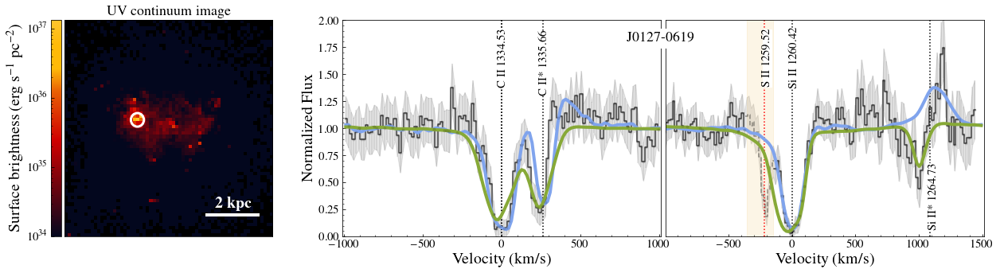

3 3
4 4
j0337-0502
OLD 2.1948489371448643 5.252561966954939 1.660739514533108
New 2.1192892335222715 1.050611534060077 3.2716615453072313


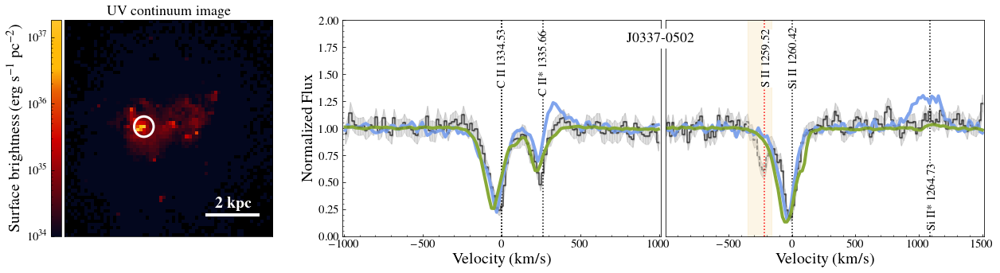

5 5
j0405-3648
OLD 0.8242348991512174 1.686382754478117 0.7623994114864764
New 0.5569901525723339 0.48473892031569393 0.6494338775035495


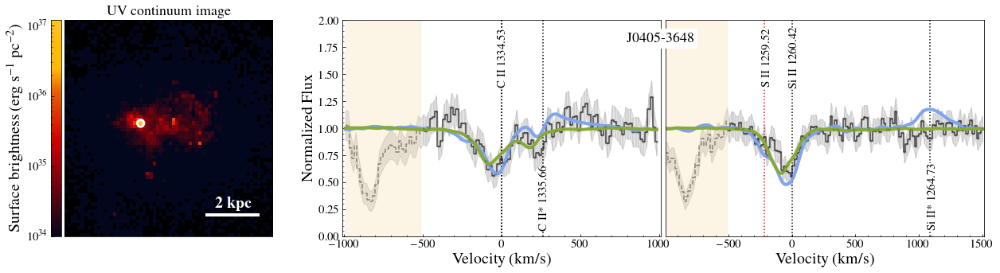

6 5
7 6
8 7
9 8
j0934+5514
OLD 5.86722038087574 16.08071289305001 5.806707370152086
New 3.365081936137044 1.0194580321657227 7.010616004273335


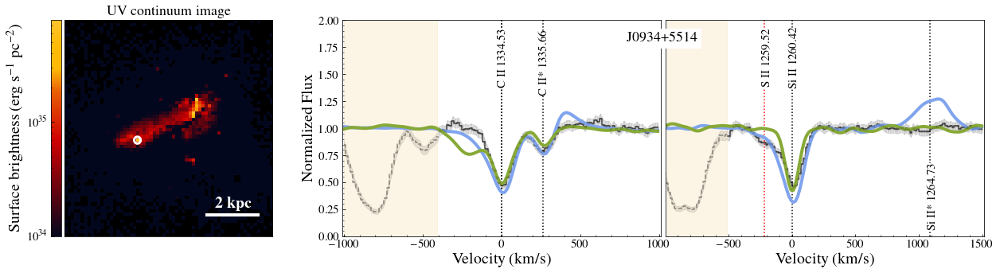

10 9
11 10
j0940+2935
OLD 1.0177906665675198 2.4308034475701836 1.022946943520335
New 0.6302585166253918 0.5515426946045069 1.3034231382313093


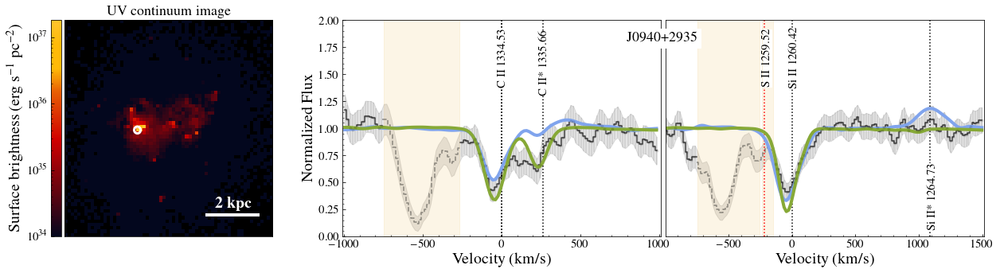

12 11
13 12
14 13
15 14
j1016+3754
OLD 0.6136366925073343 1.520243713711473 0.4411198816541173
New 0.39907662837338986 0.5655265277945554 0.37825372336526775


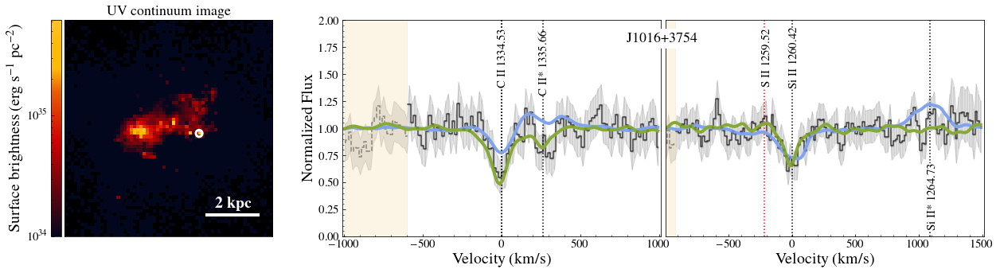

16 15
17 16
18 17
19 18
20 18
21 19
j1119+5130
OLD 0.6754330553107604 1.594740184609017 0.707420156200412
New 1.0329251800659167 0.5796318096525237 1.491454105419036


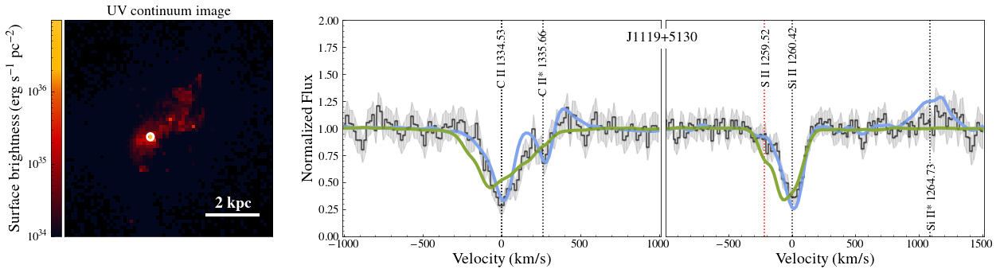

22 20
j1129+2034
OLD 1.0811752184189163 2.208919225022918 0.8063792857417561
New 1.0668438260972293 2.033856876769529 0.9817377940171594


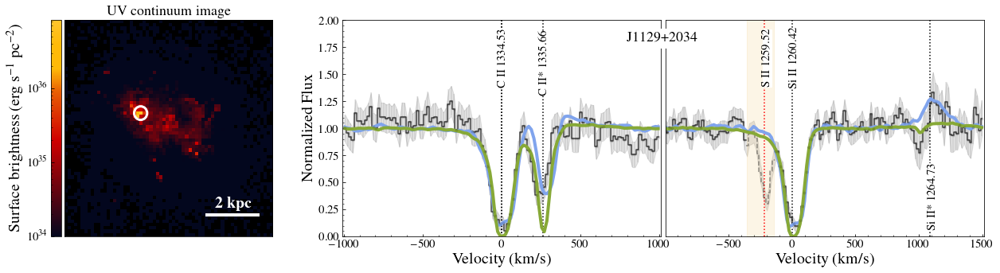

23 21
24 22
j1132+5722
OLD 0.22725337495550615 0.29572297716284074 0.25726554715556726
New 0.1945718043532123 0.21785593289980784 0.19470246449088674


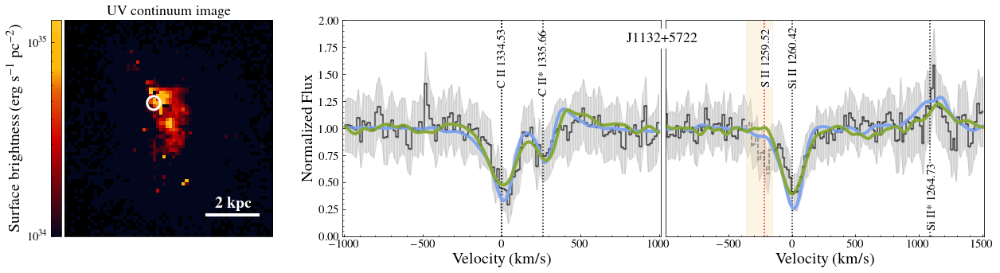

25 22
26 23
27 24
j1150+1501
OLD 2.1744008766739062 1.062813129228123 3.2856267443065383
New 1.576464343730593 1.2075021059605209 2.48317859921412


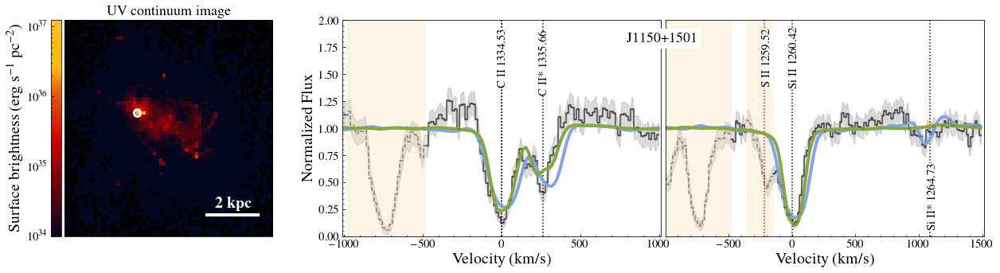

28 25
29 26
30 27
j1225+6109
OLD 1.2481590807582172 1.5773152910520514 1.4483221324599111
New 0.7985466889384877 1.3173040692264035 0.9519747768044877


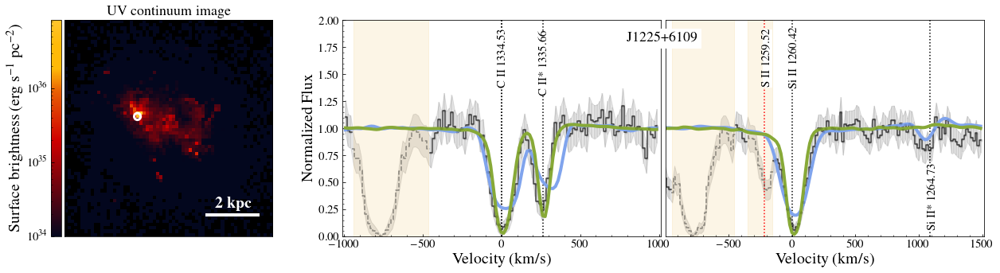

31 28
32 29
33 30
34 31
35 31
36 32
37 33
38 34
39 35
j1444+4237
OLD 0.7412667521431269 0.8026841601445596 1.226728433766331
New 0.5497435892102074 0.6503419677228686 0.774268627780082


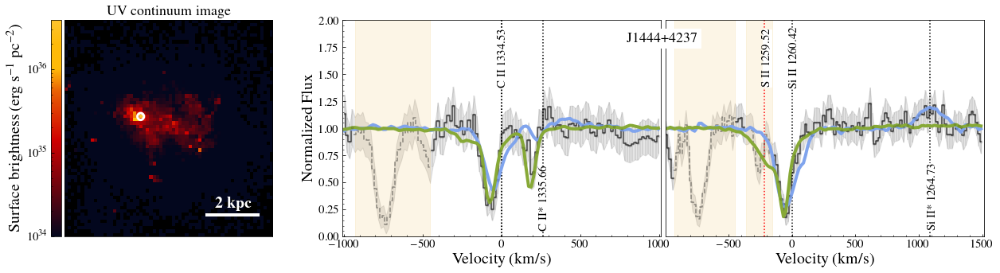

40 36
41 37
42 37
j1525+0757
OLD 7.177420265290828 1.5274464011213613 20.403074625646454
New 6.149776488381361 2.6667783446128657 16.698847448367335


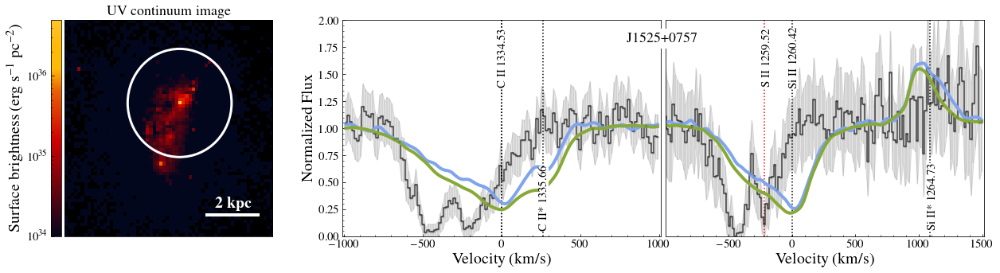

43 38
44 38


In [729]:
#Plot fits

dfFS   = pd.read_csv('csv/Classy_dep_fit_V2.csv')
# dfcube1   = pd.read_csv('Classy_cube_freefit.csv')
dfcube1   = pd.read_csv('csv/Classy_cubedep_peakfit_V3.csv')

# nxy,imsize,lcubecII,cubecII = read_cube('./data_cubes_output_148/CII_dep/',300)
# print(nxy)
# nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII3/',300)

cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]


num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)


v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)
# v_cm = np.genfromtxt('./CII_SiII/vcm_90_164.dat',unpack=True)

r50gal = []
r50cosgal = []

chi2allC_FS = []
chi2allS_FS = []
chi2emiC_FS = []
chi2emiS_FS = []
chi2absC_FS = []
chi2absS_FS = []
chi2all_FS = []
chi2emi_FS = []
chi2abs_FS = []

chi2allC_im = []
chi2allS_im = []
chi2emiC_im = []
chi2emiS_im = []
chi2absC_im = []
chi2absS_im = []
chi2all_im = []
chi2emi_im = []
chi2abs_im = []

tt = -1
alli = []

cnoFS ='#87A937'
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list('mcm',cmaplist, cmap.N)
cmap.set_bad('black',1.)
itoinc = []
sIIExclude = [2,4,10,11,13,22,24,27,30,32,36,39]
nGal = 45
nGal_fitted = 0
allr50 = []
for i in range(nGal):

    if(label[i].upper() not in maskGal):
        tt +=1
    #tt +=1
    print(i, tt)
#     print(label[i])

#     if(tt not in [1,2,3,4,5,7,9,11,13,18,19,21,23,26,27,28,34]):
#         continue
    if(classy.loc[classy.Galaxy == label[i].upper(), 'fr50aper'].values <= 1 ): #or dfFS['OutputAll'][i]!=148
        continue
    if(np.isnan(ClassAbs['EWCII'][i]) or np.isnan(ClassAbs['EWSiII'][i])):
        continue
    if((dfFS['OutputAll'][i] !=148) & (label[i] != 'j0337-0502')):
        continue
    alli.append(i)
    allr50.append(classy.loc[classy.Galaxy == label[i].upper(), 'fr50aper'].values)
#     if(maskIt[i] == True and (label[i].upper() not in maskGal)):
#         print('yes')
    ## Plot galaxy spectra
    print(label[i])
    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[i]

    d_A = cosmo.angular_diameter_distance(z=classy.loc[classy.Galaxy == label[i].upper(), 'redshift'].values).value
    theta = 1.25 # arcsec
    theta_radian = theta * np.pi / 180 / 3600
    distance_coskpc = d_A * theta_radian *1e3
#     print(distance_coskpc)
    r50gal.append(classy.loc[classy.Galaxy == label[i].upper(), 'r50kpc'].values)
    r50cosgal.append(distance_coskpc)
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-1000) & (vcIId<1000) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]

#     rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
#     fmedCII = np.nanmedian(fcII[rmedCII])
#     fcII /= fmedCII
    
#     rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
#     if(tt ==29 ):
#         rmedSiII = (vsiII>1000) & maskSiII

#     fmedSiII = np.nanmedian(fsiII[rmedSiII])
#     fsiII /= fmedSiII
#     if(i == 39):
#         fcII /=1.1
        
    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    if(tt == 25 ):
        fcII/=1.1
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
    if(tt ==29 or i == 6 ):
        rmedSiII = (vsiII>1000) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    if(tt==31):
        fsiII/=0.9
    if(tt==34):
        fsiII/=1.02    
        
       
    if(i == 20):
        fcII/=1.3
        fsiII/=1.1
        
    if (i == 44):
        fcII/=1.2
        fsiII/=1.1
        
    if(i == 32 or i == 39):
        fcII /=1.1
    fig = plt.figure(figsize = (21,5))
    gs = GridSpec(5, 29)
    ax1 = plt.subplot(gs[:6, :7])
    ax2 = plt.subplot(gs[:6, 9:19])
    ax3 = plt.subplot(gs[:6, 19:29])    
    

    
    if(np.nansum(fcII[maskCII]) != 0):
        ax2.axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        ax2.axvline(0, linestyle = ':', c='k')

        ax2.text(-30, 1.65, "C II 1334.53", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(tt in [1,2,3,4,6,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,33,38]):
            yl = 1.6
        else:
            yl = 0.35
            
        if (tt == 15 or tt == 34 or tt == 32):
            ax2.text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            ax2.text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        ax2.axvline(264, linestyle = ':', c='k')   
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    ax2.errorbar(vcII, fcIIgood, yerr = ecII, fmt='.k' , alpha=0.1)
    ax2.plot(vcII, fcIIgood,  c='k', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    ax2.plot(vcII, fcIIbad,  c='k', alpha = 0.4,drawstyle='steps-mid', label = 'Masked flux', linestyle = '--')#, label = 'Observed'

    ax2.fill_between(vcII,fcII - ecII, fcII + ecII,color= 'k', alpha = 0.1)
    if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
        ax2.fill_between(vcII[~maskCII], 0,2, alpha=0.1,color="#E99F0C")  
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",


    if(np.nansum(fsiII[maskSiII]) != 0):

        ax3.axvline(0, linestyle = ':', c='k')
       # if(i == 0):
        ax3.text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(i == 2):
            ax3.text(1066, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            ax3.text(1056, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))

        ax3.axvline(1086, linestyle = ':', c='k')
        ax3.axvline(-214, linestyle = ':', c='r')
        ax3.text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',
            bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        
    if(i == 42 or i == 36):
        maskSiII = np.ones(len(maskSiII)).astype('bool')
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,34] or i in [25,29,31,33,35,37,40,44,42]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
        maskSiIIadd = np.ones(len(maskSiII)).astype('bool')
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII& ~((vsiII >-364) & (vsiII <-144)))] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII&~((vsiII >-364) & (vsiII <-144))] =np.nan 
        maskSiIIadd = ~((vsiII >-364) & (vsiII <-144))

    ax3.errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
    ax3.plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    ax3.plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

    ax3.fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)
    if(len(fsiII[~maskSiII | ~maskSiIIadd])>0 and np.nansum(fsiII[maskSiII]) != 0):
        ax3.fill_between(vsiII[~maskSiII], 0,2, alpha=0.1,color="#E99F0C") 
        ax3.fill_between(vsiII[~maskSiIIadd & maskSiII], 0,2, alpha=0.1,color="#E99F0C") 
   
    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll'][i]
    bestOut         = dfFS['OutputAll'][i]
    bestChi2FS      = dfFS['x2All'][i]
    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )
    
    
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    if i ==2:
        sigma_pixelcii /=2    
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
  
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        ax2.plot(vcII, modelNewcii, c =cFS, lw = 4, 
                                label = 'All-flux fit')
               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))
#     if i ==2:
#         sigma_pixelsi /=2
    if(label[i] == 'j1225+6109'):
        sigma_pixelsi *=2
    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    if(np.nansum(fsiII[maskSiII]) != 0):
        ax3.plot(vsiII, modelNewsi, c =cFS, lw = 4, 
                                label = 'All flux integrated')
 

    maskCII = maskCII & (vcII >-800) & (vcII < 650)
    maskSiII = maskSiII & maskSiIIadd & (vsiII > - 800)  & (vsiII < 1500)
    
    try:
        lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
        ncII = len(modelNewcii[maskCII])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
        nsiII = len(modelNewsi[maskSiII])
    except:
        lnlikesiII = 0
        nsiII = 0
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
#     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
    if(ncII==0):
        chi2allC_FS.append(0)
    else:      
        chi2allC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2allS_FS.append(0)
    else:
        chi2allS_FS.append(lnlikesiII/nsiII)

    chi2all_FS.append(lnlikeall)
    
    
    
    try:
        xminC = np.argmin(fcII[maskCII])

        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)]-\
                                  modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)])**2)\
                                /ecII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)] - modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)]**2) #/len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
        nsiII =  len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
    except:
        nsiII = 0
        lnlikesiII = 0
        
    if (np.isnan(lnlikecII)):
        ncII = 0
        lnlikecII = 0
    if (np.isnan(lnlikesiII)):
        nsiII = 0
        lnlikesiII = 0
#     print('Emission ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2emiC_FS.append(0)
    else:      
        chi2emiC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2emiS_FS.append(0)
    else:
        chi2emiS_FS.append(lnlikesiII/nsiII)
    chi2emi_FS.append(lnlikeall)



   # print(xminC)
   # print(vcII[maskCII][xminC])
   # print(modelNewcii[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])

    try:
        xminC = np.argmin(fcII[maskCII])

        #print(np.nansum(fcII[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)]))
        #print(modelNewcii[(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])
        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]-modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])**2)\
                               /ecII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
        ncII = len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        xminS = np.argmin(fsiII[maskSiII])
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)] - modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)]**2)# /len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
        nsiII = len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
    except:
        lnlikesiII = 0
        nsiII = 0
        
#     print('Absorption ', lnlikecII/ncII, lnlikesiII/nsiII)
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2absC_FS.append(0)
    else:      
        chi2absC_FS.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2absS_FS.append(0)
    else:
        chi2absS_FS.append(lnlikesiII/nsiII)
    chi2abs_FS.append(lnlikeall)

    print('OLD', chi2all_FS[nGal_fitted],chi2emi_FS[nGal_fitted],chi2abs_FS[nGal_fitted])
    
   # ax1 = axs[0]
    bestDir         = dfcube1['DirAll'][i]
    bestX = dfcube1['x'][i]
    bestY = dfcube1['y'][i]
    imagecont2 = np.sum(cubecII[bestDir,:,:,40:70],axis=(2))#/ (imsize/nxy)**2 
    fimageoricII = cubecII[bestDir,:,:,40:-40].copy()
    fimageorisiII = cubeSiII[bestDir,:,:,40:-10].copy()

#     cx,cy = np.where(imagecont2 == np.max(imagecont2))
    im1 = ax1.imshow(imagecont2/(120*120), norm=LogNorm(vmin=10**34,
                                                        vmax=0.5*np.nanmax(imagecont2)/(120*120)), cmap = cmap, aspect="auto")#norm=vmin=1e35,vmax=1e38, vmin = 0, vmax = 1.

    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('left', size='5%', pad=0.05)
    cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
    cax.yaxis.set_ticks_position('left')

#     ax1.set_title('Continuum image')
#     ax1.scatter(cy,cx, s = 200, color = 'green', marker = '+', linewidths=3 )
#     rect = patches.Rectangle((xb-pixels_around_center, yb-pixels_around_center), 2*pixels_around_center, 2*pixels_around_center, 
#                              linewidth=2, edgecolor='cyan', facecolor='None')
    
    rcos = classy.loc[classy.Galaxy == label[i].upper(), 'rcoskpc'].values*1000
    npix = rcos/(imsize/nxy)
    pixels_around_center = int(np.ceil(npix))

    circle1 = plt.Circle((bestX, bestY), pixels_around_center, color='w', fill=False , linewidth=3,)
    ax1.add_patch(circle1)
    
#     if(label[i] == 'j1225+6109'):
#         pixels_around_center+=4
    aperture = CircularAperture([bestX,bestY], r=pixels_around_center) 
    aperture_masks = aperture.to_mask(method='center') # create mask
    fimagecII = []#cube[dd,:,:,:].copy()
    fimagesiII = []#cube[dd,:,:,:].copy()

    for ii in range(fimageoricII.shape[-1]):
        fimagecII.append(aperture_masks.multiply(fimageoricII[:,:,ii]))
    for ii in range(fimageorisiII.shape[-1]):
        fimagesiII.append(aperture_masks.multiply(fimageorisiII[:,:,ii]))
    #yy-pixels_around_center:yy+pixels_around_center,\
    #                       xx-pixels_around_center:xx+pixels_around_center    
    spec_centercII = np.sum(np.asarray(fimagecII)[:,:,:],axis=(1,2))
    spec_centersiII = np.sum(np.asarray(fimagesiII)[:,:,:],axis=(1,2))


    lsyscII    = lcubecII + np.dot(directions[bestDir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII) 
    lsyssiII   = lcubeSiII + np.dot(directions[bestDir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII) 

    vcII_s  = (lsyscII[40:-40]/wcII1334-1)*c
    vsiII_s  = (lsyssiII[40:-10]/wsiII1260-1)*c

    sigma_pixelcII  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] /2.355/ ((vcII_s[50] - vcII_s[49]))
    sigma_pixelsiII  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] /2.355/ ((vsiII_s[50] - vsiII_s[49]))

    spec_centercII    = gaussian_filter(spec_centercII, sigma = sigma_pixelcII)
    spec_centersiII    = gaussian_filter(spec_centersiII, sigma = sigma_pixelsiII)

    f                 = interpolate.interp1d(vcII_s, spec_centercII)
    spec_centercII    = f(vcII)

    f                 = interpolate.interp1d(vsiII_s, spec_centersiII)
    spec_centersiII    = f(vsiII)       

    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(spec_centercII[rmedCII])
    spec_centercII /= fmedCII

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(spec_centersiII[rmedSiII])
    spec_centersiII /= fmedSiII

#     maskCII = maskCII & (abs(vcII <550))
#     maskSiII = maskSiII & (vsiII > - 550) 
#     if(i in sIIExclude):
#         maskSiII = maskSiII & (~((vsiII >-364) & (vsiII <-144)))

#         #             if(np.isnan(np.nanmedian(spec_center[rmedCII])) or np.nanmedian(spec_center[rmedCII]) ==0):
#         #                 continue
#         #             spec_center    /= np.nanmedian(spec_center[rmedCII])
#     try:
#         lnlikecII  =  np.nansum(((fcII[maskCII]-spec_centercII[maskCII])**2)/(ecII[maskCII]**2))/len(spec_centercII[maskCII])
#     except:
#         lnlikecII = 0
        
#     try:   
#         lnlikesiII  =  np.nansum(((fsiII[maskSiII]-spec_centersiII[maskSiII])**2)/(esiII[maskSiII]**2))/len(spec_centersiII[maskSiII])
#     except:
#         lnlikesiII = 0
        
#     lnlikeall = lnlikecII + lnlikesiII

#     if(lnlikecII == 0):
#         chi2emiC_im.append(np.nan)
#     else:
#         chi2emiC_im.append(lnlikecII)

#     if(lnlikesiII == 0):
#         chi2emiS_im.append(np.nan)
#     else:
#         chi2emiS_im.append(lnlikesiII)
        
#     print('NEW: %.2f, %.2f =  %.2f'%(lnlikecII, lnlikesiII, lnlikeall))

#     try:
#         lnlikecII  =  np.nansum(((fcII[(vcII >100) & (vcII <300)]-spec_centercII[(vcII >100) & (vcII <300)])**2)\
#                                 /ecII[(vcII >100) & (vcII <300)]**2)/len(spec_centercII[(vcII >100) & (vcII <300)])
#     except:
#         lnlikecII = 0
#     try:
#         lnlikesiII =  np.nansum(((fsiII[(vsiII >950) & (vsiII <1150)] - spec_centersiII[(vsiII >950) & (vsiII <1150)])**2)\
#                                  /esiII[(vsiII >950) & (vsiII <1150)]**2) /len(spec_centersiII[(vsiII >950) & (vsiII <1150)])
#     except:
#         lnlikesiII = 0
        
#     lnlikeall  = lnlikecII + lnlikesiII
    
#     print('New emi: %.2f, %.2f =  %.2f'%(lnlikecII, lnlikesiII, lnlikeall))
#     chi2emiC_im2.append(lnlikecII)
#     chi2emiS_im2.append(lnlikesiII)    
    
    
    maskCII = maskCII & (vcII >-800) & (vcII < 650)
    maskSiII = maskSiII & maskSiIIadd & (vsiII > - 800)  & (vsiII < 1500)
    
    try:
        lnlikecII  =  np.nansum(((fcII[maskCII]-spec_centercII[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
        ncII = len(spec_centercII[maskCII])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII] - spec_centersiII[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
        nsiII = len(spec_centersiII[maskSiII])
    except:
        lnlikesiII = 0
        nsiII = 0
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
#     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
    if(ncII==0):
        chi2allC_im.append(0)
    else:      
        chi2allC_im.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2allS_im.append(0)
    else:
        chi2allS_im.append(lnlikesiII/nsiII)

    chi2all_im.append(lnlikeall)
    
    
    
    try:
        xminC = np.argmin(fcII[maskCII])

        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)]-\
                                  spec_centercII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)])**2)\
                                /ecII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <500)])
        ncII = len(spec_centercII[maskCII][(vcII[maskCII] >100)& (vcII[maskCII] <300)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)] - spec_centersiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)]**2) #/len(modelNewsi[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
        nsiII =  len(spec_centersiII[maskSiII][(vsiII[maskSiII] >900) & (vsiII[maskSiII] <1300)])
    except:
        nsiII = 0
        lnlikesiII = 0
        
    if (np.isnan(lnlikecII)):
        ncII = 0
        lnlikecII = 0
    if (np.isnan(lnlikesiII)):
        nsiII = 0
        lnlikesiII = 0
#     print('Emission ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2emiC_im.append(0)
    else:      
        chi2emiC_im.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2emiS_im.append(0)
    else:
        chi2emiS_im.append(lnlikesiII/nsiII)
    chi2emi_im.append(lnlikeall)



   # print(xminC)
   # print(vcII[maskCII][xminC])
   # print(modelNewcii[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])

    try:
        xminC = np.argmin(fcII[maskCII])

        #print(np.nansum(fcII[maskCII][(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)]))
        #print(modelNewcii[(vcII[maskCII] >vcII[maskCII][xminC]-400) & (vcII[maskCII] <vcII[maskCII][xminC]+150)])
        lnlikecII  =  np.nansum(((fcII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]-spec_centercII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])**2)\
                               /ecII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)]**2)#/len(modelNewcii[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
        ncII = len(spec_centercII[maskCII][(vcII[maskCII] <=vcII[maskCII][xminC]+150)])
    except:
        lnlikecII = 0
        ncII = 0
    try:
        xminS = np.argmin(fsiII[maskSiII])
        lnlikesiII =  np.nansum(((fsiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)] - spec_centersiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])**2)\
                                 /esiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)]**2)# /len(modelNewsi[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
        nsiII = len(spec_centersiII[maskSiII][(vsiII[maskSiII] <vsiII[maskSiII][xminS]+200)])
    except:
        lnlikesiII = 0
        nsiII = 0
        
#     print('Absorption ', lnlikecII/ncII, lnlikesiII/nsiII)
        
    if (np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    if (np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
    if(ncII==0):
        chi2absC_im.append(0)
    else:      
        chi2absC_im.append(lnlikecII/ncII)
        
    if(nsiII==0):
        chi2absS_im.append(0)
    else:
        chi2absS_im.append(lnlikesiII/nsiII)
    chi2abs_im.append(lnlikeall)

    print('New', chi2all_im[nGal_fitted],chi2emi_im[nGal_fitted],chi2abs_im[nGal_fitted])
 

    ax2.set_xlim(-1010,1010)
    ax3.set_xlim(-990,1510)
    ax3.text(-1300, 1.8, label[i].upper(), fontsize = 18,
        bbox=dict(facecolor='white', edgecolor='white'))
    

    ax2.set_xlabel('Velocity (km/s)', fontsize = 20,)
    ax3.set_xlabel('Velocity (km/s)', fontsize = 20)
    ax2.set_ylabel('Normalized Flux', fontsize = 20)

    ax2.plot(vcII, spec_centercII, label='Aperture-based fit', c = cnoFS, linewidth = 4) 

    ax3.plot(vsiII, spec_centersiII,label='Original best fit', c = cnoFS, linewidth = 4) 
    ax1.set_title('UV continuum image')
    cbar.ax.get_yaxis().labelpad = -70

    cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
    ax1.hlines(57, 43,43+2000/120.,'w', linewidth = 4)
    ax1.text(46, 55,r'\bf 2 kpc',c = 'w', fontsize = 20)

    if(label[i] == 'j0036-3333'):
        ax2.legend(frameon=False, loc = (0.1,1), ncol = 4, fontsize = 18)
#     print('Cube: ',lnlikecII )
#     plt.suptitle(label[i].upper())
    ax2.set_ylim(0,2)
    ax3.set_ylim(0,2)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax3.set_yticks([])
    plt.savefig('Plots/'+label[i]+'COS.pdf', bbox_inches = 'tight')
    nGal_fitted+=1
#     ax3.set_xticklabels(['','-500','0','500','1000','1500'])
    plt.show()
#     cFS= '#80A4ED'

['J0036-3333' 'J0127-0619' 'J0337-0502' 'J0405-3648' 'J0934+5514'
 'J0940+2935' 'J1016+3754' 'J1119+5130' 'J1129+2034' 'J1132+5722'
 'J1150+1501' 'J1225+6109' 'J1444+4237' 'J1525+0757']


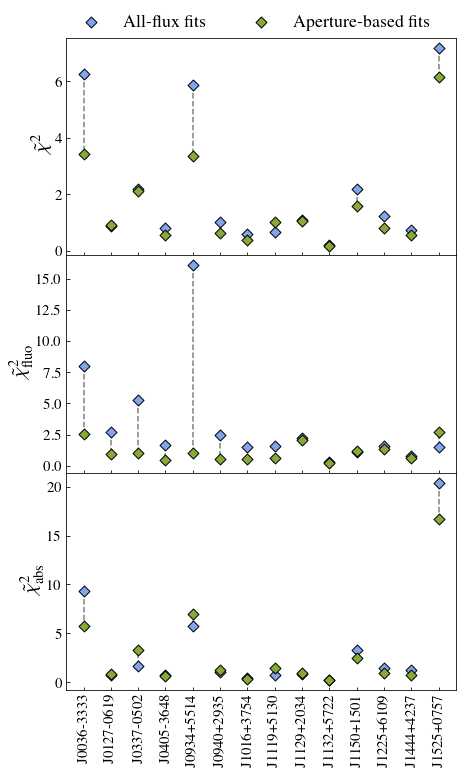

In [730]:
z = np.polyfit(classy['rcoskpc'][~maskInc]/3.8,classy['redshift'][~maskInc], 2)
p = np.poly1d(z)

def tick_function(X):
    V = p(X)
    return ["%.2f" % z for z in V]

new_tick_locations = np.array([0, 0.1,0.2, 0.3])

# print(len(np.asarray(r50cosgal)), len(np.asarray(chi2emiC)))

# mask = (np.asarray(chi2emiC_FS) != 0)
# chi2all_FS = [x for _, x in sorted(zip(allr50, chi2all_FS))]
# chi2all_im = [x for _, x in sorted(zip(allr50, chi2all_im))]
# chi2emi_FS = [x for _, x in sorted(zip(allr50, chi2emi_FS))]
# chi2emi_im = [x for _, x in sorted(zip(allr50, chi2emi_im))]
# chi2abs_FS = [x for _, x in sorted(zip(allr50, chi2abs_FS))]
# chi2abs_im = [x for _, x in sorted(zip(allr50, chi2abs_im))]
# alli = [x for _, x in sorted(zip(allr50, alli))]

fig, (ax1, ax2,ax3) = plt.subplots(3,1, figsize= (7,12), sharex = True)
plt.subplots_adjust(wspace=0.3)
# mask1 = np.asarray(chi2emiC_FS)>0
# mask2 = np.asarray(chi2emiS_FS)>0

# print(len(np.asarray(r50cosgal)),len(np.asarray(chi2emiC_FS)), len(classy['rcoskpc'][~maskInc]))


# fig, (ax1, ax2) = plt.subplots(1,2, figsize= (15,5))

ax1.scatter(np.arange(0, len(chi2all_FS),1),np.asarray(chi2all_FS), color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
ax1.scatter(np.arange(0, len(chi2all_im),1),np.asarray(chi2all_im), color = cnoFS, edgecolor = 'k', s = 60,
           label = 'Aperture-based fits',marker = 'D')#np.asarray(chi2emiS)+

ax1.vlines(np.arange(0, len(chi2all_FS),1), np.asarray(chi2all_FS), 
           np.asarray(chi2all_im), 
           linestyle = '--', color ='gray', zorder = 0) 
# ax1.set_xlabel(r'$\frac{\rm COS\ aperture\ radius}{\rm Galaxy\ size}$', fontsize = 30)
ax1.set_ylabel(r'$\tilde{\chi}^2$', fontsize = 20)
ax1.legend(frameon=False, fontsize = 18, loc = (0,1), ncol = 2)

ax2.scatter(np.arange(0, len(chi2emi_FS),1),np.asarray(chi2emi_FS), color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
ax2.scatter(np.arange(0, len(chi2emi_im),1),np.asarray(chi2emi_im), color = cnoFS, edgecolor = 'k', s = 60,
           label = 'COS-flux fits',marker = 'D')#np.asarray(chi2emiS)+
ax2.vlines(np.arange(0, len(chi2emi_FS),1), np.asarray(chi2emi_FS), 
           np.asarray(chi2emi_im), 
           linestyle = '--', color ='gray', zorder = 0) 

ax3.scatter(np.arange(0, len(chi2abs_FS),1),np.asarray(chi2abs_FS), color = cFS, edgecolor = 'k', s = 60,
           label = 'All-flux fits',marker='D')#np.asarray(chi2emiS)+
ax3.scatter(np.arange(0, len(chi2abs_im),1),np.asarray(chi2abs_im), color = cnoFS, edgecolor = 'k', s = 60,
           label = 'COS-flux fits',marker = 'D')#np.asarray(chi2emiS)+
ax3.vlines(np.arange(0, len(chi2abs_FS),1), np.asarray(chi2abs_FS), 
           np.asarray(chi2abs_im), 
           linestyle = '--', color ='gray', zorder = 0) 


label_arr = [label[i].upper() for i in range(len(label))]
label_arr = np.asarray(label_arr)
# print(alli, len(alli))
# ax2.set_xlabel(r'$\frac{\rm COS\ aperture\ radius}{\rm Galaxy\ size}$', fontsize = 30)
ax2.set_ylabel(r'$\tilde{\chi}^2_{\rm fluo}$', fontsize = 20)
ax2.set_xticks(np.arange(0, len(chi2emiS_FS),1))
ax1.minorticks_off()
ax2.minorticks_off()
ax3.minorticks_off()

ax3.set_ylabel(r'$\tilde{\chi}^2_{\rm abs}$', fontsize = 20)


    
print(label_arr[np.asarray(alli).astype('int')])

ax3.set_xticklabels(label_arr[np.asarray(alli).astype('int')], rotation = 90)

plt.subplots_adjust(hspace = 0)
# plt.savefig('Plots/chisquare_dep.pdf', bbox_inches = 'tight')


In [731]:
print(sum((np.asarray(chi2all_FS) - np.asarray(chi2all_im))>1))
print(sum((np.asarray(chi2emi_FS) - np.asarray(chi2emi_im))>1))
print(sum((np.asarray(chi2abs_FS) - np.asarray(chi2abs_im))>1))

print(sum((np.asarray(chi2all_FS) - np.asarray(chi2all_im))<-1))
print(sum((np.asarray(chi2emi_FS) - np.asarray(chi2emi_im))<-1))
print(sum((np.asarray(chi2abs_FS) - np.asarray(chi2abs_im))<-1))
# print(np.asarray(chi2emiS_FS2)+np.asarray(chi2emiC_FS2) - np.asarray(chi2emiS_im2)-np.asarray(chi2emiC_im2))

3
7
2
0
1
2


### Plots for core papre

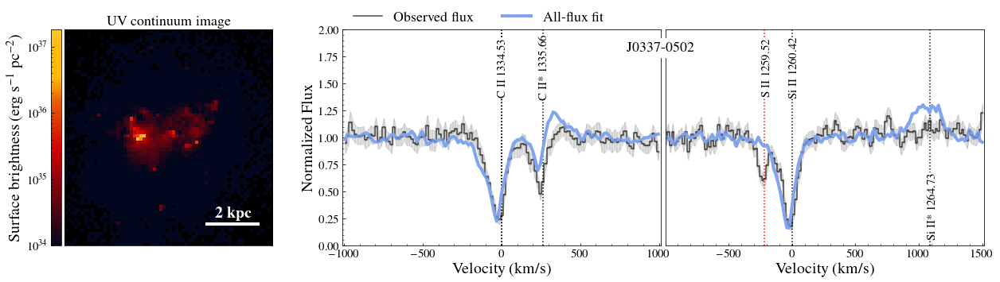

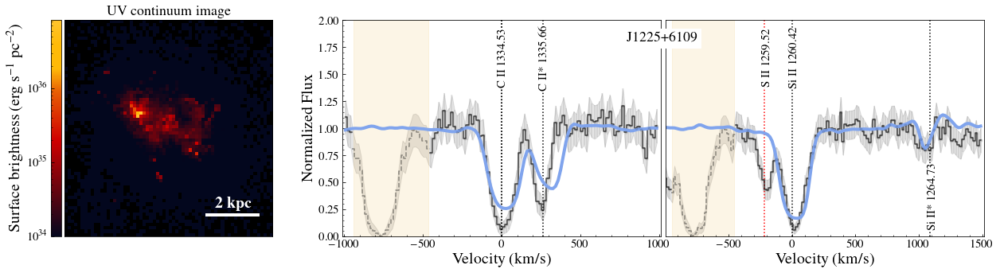

In [11]:
#Plots core paper
dfFS   = pd.read_csv('csv/Classy_dep_fit_V2.csv')
# dfcube1   = pd.read_csv('Classy_cube_freefit.csv')
dfcube1   = pd.read_csv('csv/Classy_cubedep_peakfit_V3.csv')

# nxy,imsize,lcubecII,cubecII = read_cube('./data_cubes_output_148/CII2/',300)
# print(nxy)
# nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII2/',300)

v_cm = np.genfromtxt('./dat_files//vcm_90_164.dat',unpack=True)
# v_cm = np.genfromtxt('./CII_SiII/vcm_90_164.dat',unpack=True)
# cmap = 'jet'
# cmap = plt.cm.jet_r
# cmaplist = [cmap(i) for i in range(cmap.N)]
# alli = []

cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]


num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)
tt=0
for i in range(len(galaxy)):

    if(label[i] not in ['j0337-0502', 'j1225+6109']):
        continue
#     tt +=1
#     print(tt)
#     if(tt not in [1,2,3,4,5,7,9,11,13,18,19,21,23,26,27,28,34]):
#         continue
#     alli.append(i)


    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[i]

    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-1000) & (vcIId<1000) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]

    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
#     if(tt ==29 ):
#         rmedSiII = (vsiII>1000) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
                
#     fig, axs = plt.subplots(1,3,figsize=(15,5))
    fig = plt.figure(figsize = (21,5))
    gs = GridSpec(5, 29)
#     ax1 = plt.subplot(gs[0:5, :5])
#     ax2 = plt.subplot(gs[6:11, :5])
#     ax3 = plt.subplot(gs[11:17, :5])
    ax1 = plt.subplot(gs[:6, :7])
    ax2 = plt.subplot(gs[:6, 9:19])
    ax3 = plt.subplot(gs[:6, 19:29])    
    
    if(np.nansum(fcII[maskCII]) != 0):
        ax2.axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        ax2.axvline(0, linestyle = ':', c='k')

        ax2.text(-30, 1.65, "C II 1334.53", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        ax2.text(234, 1.65, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
#         if(tt in [2,3,4,8,9,10,11,12,13,16,17,18,19,20,21,23,24,26,27,28,31]):
#             yl = 1.6
#         else:
#             yl = 0.35
            
#         if (tt == 15 or tt == 34 or tt == 32):
#             ax2.text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
#         bbox=dict(facecolor='white', edgecolor='white', pad = -1))
#         else:
#             ax2.text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
#         bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        ax2.axvline(264, linestyle = ':', c='k')   
        
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    ax2.errorbar(vcII, fcIIgood, yerr = ecII, fmt='.k' , alpha=0.1)
    ax2.plot(vcII, fcIIgood,  c='k', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    ax2.plot(vcII, fcIIbad,  c='k', alpha = 0.4,drawstyle='steps-mid', linestyle = '--')#, label = 'Observed'

    #     if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
#         ax2.fill_between(vcII[~maskCII], 0, 2, 
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",
    ax2.fill_between(vcII,fcII - ecII, fcII + ecII,color= 'k', alpha = 0.1)
    if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
        ax2.fill_between(vcII[~maskCII], 0,2, alpha=0.1,color="#E99F0C")  
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",


    
    if(np.nansum(fsiII[maskSiII]) != 0):

        ax3.axvline(0, linestyle = ':', c='k')
       # if(i == 0):
        ax3.text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(i == 2):
            ax3.text(1066, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            ax3.text(1056, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))

        ax3.axvline(1086, linestyle = ':', c='k')
        ax3.axvline(-214, linestyle = ':', c='r')
        ax3.text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',
            bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,34] or i in [25,29,31,33,35,37,40,44,42]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
        maskSiIIadd = np.ones(len(maskSiII)).astype('bool')
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII& ~((vsiII >-364) & (vsiII <-144)))] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII&~((vsiII >-364) & (vsiII <-144))] =np.nan 
        maskSiIIadd = ~((vsiII >-364) & (vsiII <-144))

    ax3.errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
    ax3.plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux' )
    ax3.plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

    ax3.fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)
    if(len(fsiII[~maskSiII | ~maskSiIIadd])>0 and np.nansum(fsiII[maskSiII]) != 0):
        ax3.fill_between(vsiII[~maskSiII], 0,2, alpha=0.1,color="#E99F0C", label = 'Masked flux') 
        ax3.fill_between(vsiII[~maskSiIIadd & maskSiII], 0,2, alpha=0.1,color="#E99F0C") 
   
#     ax3.errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
#     ax3.plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
#     ax3.plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

# #     if(len(fsiII[~maskSiII])>0 and np.nansum(fsiII[maskSiII]) != 0):
# #         ax3.fill_between(vsiII[~maskSiII], 0,2, alpha=0.2,color="none", hatch="X", edgecolor="k")  
# #     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall],   c = 'k' )
#     ax3.fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)
# #     axs[1].set_title('Si II 1260')


   
    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll'][i]
    bestOut         = dfFS['OutputAll'][i]
    bestChi2FS      = dfFS['x2All'][i]
    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )
    
    
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
  
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        ax2.plot(vcII, modelNewcii, c =cFS, lw = 4, 
                                 label = 'All-flux fit')
               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))

    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    if(np.nansum(fsiII[maskSiII]) != 0):
        ax3.plot(vsiII, modelNewsi, c =cFS, lw = 4, 
                                 label = 'All-flux fit')
    
   # ax1 = axs[0]
    bestDir         = dfcube1['DirAll'][i]
    bestX = dfcube1['x'][i]
    bestY = dfcube1['y'][i]
    imagecont2 = np.sum(cubecII[bestDir,:,:,40:70],axis=(2))#/ (imsize/nxy)**2 
    fimageoricII = cubecII[bestDir,:,:,40:-40].copy()
    fimageorisiII = cubeSiII[bestDir,:,:,40:-10].copy()

#     cx,cy = np.where(imagecont2 == np.max(imagecont2))
    im1 = ax1.imshow(imagecont2/(120*120), norm=LogNorm(vmin=10**34,
                                                        vmax=0.5*np.nanmax(imagecont2)/(120*120)), cmap = cmap, aspect="auto")#norm=vmin=1e35,vmax=1e38, vmin = 0, vmax = 1.

    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('left', size='5%', pad=0.05)
    cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
    cax.yaxis.set_ticks_position('left')

#     ax1.set_title('Continuum image')
#     ax1.scatter(cy,cx, s = 200, color = 'green', marker = '+', linewidths=3 )
#     rect = patches.Rectangle((xb-pixels_around_center, yb-pixels_around_center), 2*pixels_around_center, 2*pixels_around_center, 
#                              linewidth=2, edgecolor='cyan', facecolor='None')
    
    rcos = classy.loc[classy.Galaxy == label[i].upper(), 'rcoskpc'].values*1000
    npix = rcos/(imsize/nxy)
    pixels_around_center = int(np.ceil(npix))
    circle1 = plt.Circle((bestX, bestY), pixels_around_center, color='w', fill=False , linewidth=3,)
#     ax1.add_patch(circle1)
    

    aperture = CircularAperture([bestX,bestY], r=pixels_around_center) 
    aperture_masks = aperture.to_mask(method='center') # create mask
    fimagecII = []#cube[dd,:,:,:].copy()
    fimagesiII = []#cube[dd,:,:,:].copy()

    for ii in range(fimageoricII.shape[-1]):
        fimagecII.append(aperture_masks.multiply(fimageoricII[:,:,ii]))
    for ii in range(fimageorisiII.shape[-1]):
        fimagesiII.append(aperture_masks.multiply(fimageorisiII[:,:,ii]))
    #yy-pixels_around_center:yy+pixels_around_center,\
    #                       xx-pixels_around_center:xx+pixels_around_center    
    spec_centercII = np.sum(np.asarray(fimagecII)[:,:,:],axis=(1,2))
    spec_centersiII = np.sum(np.asarray(fimagesiII)[:,:,:],axis=(1,2))


    lsyscII    = lcubecII + np.dot(directions[bestDir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII) 
    lsyssiII   = lcubeSiII + np.dot(directions[bestDir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII) 

    vcII_s  = (lsyscII[40:-40]/wcII1334-1)*c
    vsiII_s  = (lsyssiII[40:-10]/wsiII1260-1)*c

    sigma_pixelcII  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] /2.355/ ((vcII_s[50] - vcII_s[49]))
    sigma_pixelsiII  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] /2.355/ ((vsiII_s[50] - vsiII_s[49]))

    spec_centercII    = gaussian_filter(spec_centercII, sigma = sigma_pixelcII)
    spec_centersiII    = gaussian_filter(spec_centersiII, sigma = sigma_pixelsiII)

    f                 = interpolate.interp1d(vcII_s, spec_centercII)
    spec_centercII    = f(vcII)

    f                 = interpolate.interp1d(vsiII_s, spec_centersiII)
    spec_centersiII    = f(vsiII)       

    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(spec_centercII[rmedCII])
    spec_centercII /= fmedCII

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(spec_centersiII[rmedSiII])
    spec_centersiII /= fmedSiII

    
    ax2.set_xlim(-1010,1010)
    ax3.set_xlim(-990,1510)
    ax3.text(-1300, 1.8, label[i].upper(), fontsize = 18,
        bbox=dict(facecolor='white', edgecolor='white'))
    

    ax2.set_xlabel('Velocity (km/s)', fontsize = 20,)
    ax3.set_xlabel('Velocity (km/s)', fontsize = 20)
    ax2.set_ylabel('Normalized Flux', fontsize = 20)

#     ax2.plot(vcII, spec_centercII,  label='Aperture-based fit', c = cnoFS, linewidth =4) 

#     ax3.plot(vsiII, spec_centersiII,  label='Aperture-based fit', c = cnoFS, linewidth = 4) 
    ax1.set_title('UV continuum image')
    cbar.ax.get_yaxis().labelpad = -70

    cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)

#     print('Cube: ',lnlikecII )
#     plt.suptitle(label[i].upper())
    ax2.set_ylim(0,2)
    ax3.set_ylim(0,2)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax3.set_yticks([])
    ax1.hlines(57, 43,43+2000/120.,'w', linewidth = 4)
    ax1.text(46, 55,r'\bf 2 kpc',c = 'w', fontsize = 20)
    if(label[i] == 'j0337-0502'):
        ax3.legend(frameon=False, loc = (-1,1), ncol = 4, fontsize = 18)
#     plt.savefig('Plots/'+label[i]+'COSdep_paper.pdf', bbox_inches = 'tight')

#     ax3.set_xticklabels(['','-500','0','500','1000','1500'])
    plt.show()


# Spatial properties

## Read cubes

In [9]:
# nxy,imsize,lcubecIIint,cubecIIint = read_cube('./data_cubes_output_148/CII_int/',300)

nxy,imsize,lcubecII,cubecII = read_cube('./data_cubes_output_148/CII_dep/',300)
print(nxy)
nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII_dep/',300)

64


## Measure light curves and EW as function of radii

### EW Plot absolute

4.253384963780157


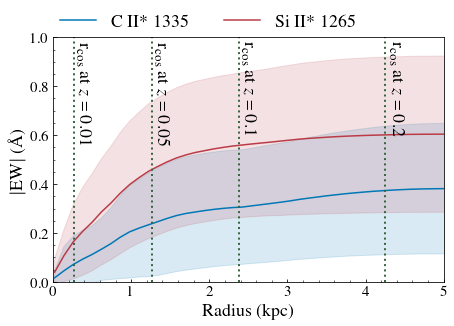

In [517]:
## Light curves + spectra in increasing rings

fig, ax2 = plt.subplots(1,1,figsize = (7,4.5))


# fig, (ax1) = plt.subplots(1,1,figsize = (7,10), sharex = True)
ax2.plot(np.arange(1,64,1)*120-100, np.mean(EWemiCIIim[:,:], axis =0), color = '#0077B6', label = 'C II* 1335')
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(1,64,1)*120-100,np.mean(EWemiCIIim[:,:], axis =0)-np.std(EWemiCIIim[:,:], axis =0),
                 np.mean(EWemiCIIim[:,:], axis =0)+np.std(EWemiCIIim[:,:], axis =0), alpha = 0.15, color = '#0077B6')
ax2.plot(np.arange(1,64,1)*120-100, np.mean(EWemiSiIIim[:,:], axis =0), color = '#BA3B46', label = 'Si II* 1265' )
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(1,64,1)*120-100,np.mean(EWemiSiIIim[:,:], axis =0)-np.std(EWemiSiIIim[:,:], axis =0),
                 np.mean(EWemiSiIIim[:,:], axis =0)+np.std(EWemiSiIIim[:,:], axis =0), alpha = 0.15, color = '#BA3B46')
plt.subplots_adjust(hspace = 0.1)
# plt.axvline(160, label = r'$r_{50}^{\rm UV}$', color = '#386641', linestyle = ':', linewidth = 2 )
# plt.axvline(1589.5335068817576, label = r'$r_{50}^{\rm C\ II*}$', color = '#0077B6', linestyle = ':', linewidth = 2 )
# plt.axvline(1262, label = r'$r_{50}^{\rm Si\ II*}$', color = '#BA3B46', linestyle = ':', linewidth = 2 )
# plt.axvline(160,  color = '#386641', linestyle = ':', linewidth = 2 )
# plt.axvline(1589.5335068817576, color = '#0077B6', linestyle = ':', linewidth = 2 )
# plt.axvline(1262,color = '#BA3B46', linestyle = ':', linewidth = 2 )

# plt.axvspan(269-297, 269+297,color = 'k',
#            alpha = 0.1)
theta = 1.25 # arcsec
theta_radian = theta * np.pi / 180 / 3600
d_A = cosmo.angular_diameter_distance(z=0.01).value
distance_coskpc_01 = d_A * theta_radian *1e3

plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
plt.text(distance_coskpc_01*1105, 0.57, r'r$_{\rm cos}$ at $z = 0.01$', rotation = -90, fontsize = 18)

d_A = cosmo.angular_diameter_distance(z=0.05).value
distance_coskpc_01 = d_A * theta_radian *1e3

plt.axvline(distance_coskpc_01*1000, color = '#386641', linestyle = ':', linewidth = 2 )
plt.text(distance_coskpc_01*1025, 0.57, r'r$_{\rm cos}$ at $z = 0.05$', rotation = -90, fontsize = 18)

d_A = cosmo.angular_diameter_distance(z=0.1).value
distance_coskpc_01 = d_A * theta_radian *1e3

plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
plt.text(distance_coskpc_01*1010, 0.61, r'r$_{\rm cos}$ at $z = 0.1$', rotation = -90, fontsize = 18, ha ='left')

d_A = cosmo.angular_diameter_distance(z=0.2).value
distance_coskpc_01 = d_A * theta_radian *1e3
plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
plt.text(distance_coskpc_01*1010, 0.61, r'r$_{\rm cos}$ at $z = 0.2$', rotation = -90, fontsize = 18, ha ='left')

print(distance_coskpc_01)

ax2.set_xlim(0,5000)
ax2.set_ylim(0,1)
ax2.set_xlabel(r'Radius (kpc)', fontsize = 18)
ax2.set_xticks([0,1000,2000,3000,4000,5000])
ax2.set_xticklabels([0,1,2,3,4,5])

ax2.set_ylabel(r'$|$EW$|$ ($\rm \AA$)', fontsize = 18)
ax2.legend(frameon=False, fontsize = 18, ncol = 2, loc = (0,1))
# plt.subplots_adjust(hspace = 0)
plt.savefig('Plots/EWfluosim.pdf', bbox_inches = 'tight')

### EW plot relative

/tmp/ipykernel_610952/1641470898.py:9: RuntimeWarning: invalid value encountered in true_divide
  EWCIInorm[i,:] /=EWCIInorm[i,-1]
/tmp/ipykernel_610952/1641470898.py:9: RuntimeWarning: divide by zero encountered in true_divide
  EWCIInorm[i,:] /=EWCIInorm[i,-1]
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1741: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe', where=where)


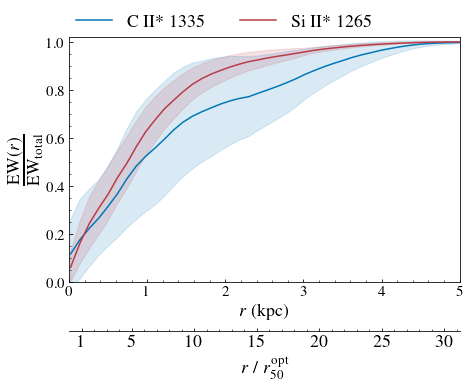

In [17]:
## Light curves + spectra in increasing rings

fig, ax2 = plt.subplots(1,1,figsize = (7,4.5))

# print(np.max(EWemiCIIim, axis=1))
EWCIInorm = EWemiCIIim[:,:64].copy()
for i in range(300):
#     print(np.max(EWCIInorm[i,:]),EWCIInorm[i,-1]) 
    EWCIInorm[i,:] /=EWCIInorm[i,-1]
    
EWSiIInorm = EWemiSiIIim[:,:64].copy()
for i in range(300):
#     print(np.max(EWCIInorm[i,:]),EWCIInorm[i,-1]) 
    EWSiIInorm[i,:] /=EWSiIInorm[i,-1]
#     print(EWCIInorm[i,-1])
# print(EWCIInorm[:,-1])
# fig, (ax1) = plt.subplots(1,1,figsize = (7,10), sharex = True)
ax2.plot(np.arange(0,63,1)*120-100, np.nanmean(EWCIInorm, axis =0), color = '#0077B6', label = 'C II* 1335')
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(0,63,1)*120-100,np.nanmean(EWCIInorm[:,:], axis =0)-np.nanstd(EWCIInorm[:,:], axis =0),
                 np.nanmean(EWCIInorm[:,:], axis =0)+np.nanstd(EWCIInorm[:,:], axis =0), alpha = 0.15, color = '#0077B6')
ax2.plot(np.arange(1,64,1)*120-100, np.mean(EWSiIInorm[:,:], axis =0), color = '#BA3B46', label = 'Si II* 1265' )
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(1,64,1)*120-100,np.mean(EWSiIInorm[:,:], axis =0)-np.std(EWSiIInorm[:,:], axis =0),
                 np.mean(EWSiIInorm[:,:], axis =0)+np.std(EWSiIInorm[:,:], axis =0), alpha = 0.15, color = '#BA3B46')
plt.subplots_adjust(hspace = 0.1)
# plt.axvline(160, label = r'$r_{50}^{\rm UV}$', color = '#386641', linestyle = ':', linewidth = 2 )
# plt.axvline(1589.5335068817576, label = r'$r_{50}^{\rm C\ II*}$', color = '#0077B6', linestyle = ':', linewidth = 2 )
# plt.axvline(1262, label = r'$r_{50}^{\rm Si\ II*}$', color = '#BA3B46', linestyle = ':', linewidth = 2 )
# plt.axvline(160,  color = '#386641', linestyle = ':', linewidth = 2 )
# plt.axvline(1589.5335068817576, color = '#0077B6', linestyle = ':', linewidth = 2 )
# plt.axvline(1262,color = '#BA3B46', linestyle = ':', linewidth = 2 )

# plt.axvspan(269-297, 269+297,color = 'k',
#            alpha = 0.1)
# theta = 1.25 # arcsec
# theta_radian = theta * np.pi / 180 / 3600
# d_A = cosmo.angular_diameter_distance(z=0.01).value
# distance_coskpc_01 = d_A * theta_radian *1e3

# plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
# plt.text(distance_coskpc_01*1105, 0.57, r'r$_{\rm cos}$ at $z = 0.01$', rotation = -90, fontsize = 18)

# d_A = cosmo.angular_diameter_distance(z=0.05).value
# distance_coskpc_01 = d_A * theta_radian *1e3

# plt.axvline(distance_coskpc_01*1000, color = '#386641', linestyle = ':', linewidth = 2 )
# plt.text(distance_coskpc_01*1025, 0.06, r'r$_{\rm cos}$ at $z = 0.05$', rotation = -90, fontsize = 18)

# d_A = cosmo.angular_diameter_distance(z=0.1).value
# distance_coskpc_01 = d_A * theta_radian *1e3

# plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
# plt.text(distance_coskpc_01*1010, 0.06, r'r$_{\rm cos}$ at $z = 0.10$', rotation = -90, fontsize = 18, ha ='left')

# d_A = cosmo.angular_diameter_distance(z=0.2).value
# distance_coskpc_01 = d_A * theta_radian *1e3
# plt.axvline(distance_coskpc_01*1000,  color = '#386641', linestyle = ':', linewidth = 2 )
# plt.text(distance_coskpc_01*1010, 0.06, r'r$_{\rm cos}$ at $z = 0.20$', rotation = -90, fontsize = 18, ha ='left')

# print(distance_coskpc_01)

ax2.set_xlim(0,5000)
ax2.set_ylim(0,1.02)
ax2.set_xlabel(r'$r$ (kpc)', fontsize = 18)
ax2.set_xticks([0,1000,2000,3000,4000,5000])
ax2.set_xticklabels([0,1,2,3,4,5])

ax2.set_ylabel(r'$\frac{{\rm EW}(r)}{\rm EW_{\rm total}}$', fontsize = 24)
ax2.legend(frameon=False, fontsize = 18, ncol = 2, loc = (0,1))
# plt.subplots_adjust(hspace = 0)

ax3 = ax2.twiny()
ax3.set_xlim(0,5000)

new_tick_locations = np.array([160,1600,3200])


# Move twinned axis ticks and label from top to bottom
ax3.xaxis.set_ticks_position("bottom")
ax3.xaxis.set_label_position("bottom")

# Offset the twin axis below the host
ax3.spines["bottom"].set_position(("axes", -0.20))

# Turn on the frame for the twin axis, but then hide all 
# but the bottom spine
ax3.set_frame_on(True)
ax3.patch.set_visible(False)

# as @ali14 pointed out, for python3, use this
# for sp in ax2.spines.values():
# and for python2, use this
for sp in ax3.spines.values():
    sp.set_visible(False)
ax3.spines["bottom"].set_visible(True)
ax3.set_xticks([])

ax3.set_xticks([160, 1600/2, 1600,2400, 3200, 25*160,30*160])
ax3.set_xticklabels([1,5, 10,15,20,25,30], fontsize = 18)
ax3.set_xlabel(r"$r$ / $r_{50}^{\rm opt}$", fontsize = 18)

plt.savefig('Plots/EWfluosimrel.pdf', bbox_inches = 'tight')

In [605]:
print(sum(classy['redshift']<0.01)/45)
print(sum(classy['redshift']<0.05)/45)
print(sum(classy['redshift']<0.10)/45)
print(sum(classy['redshift']<0.20)/45)


0.3333333333333333
0.6888888888888889
0.8
1.0


<ErrorbarContainer object of 3 artists>

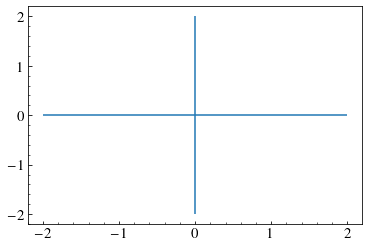

In [62]:
plt.errorbar(0,0,xerr = 2, yerr = 2)

### Light curve plot

In [472]:
## Light curves + spectra in increasing rings
nrad = 50
rrad  = np.zeros(nrad)

ndir = 300

rfluxcontcii = np.zeros((ndir,nrad))
totalcontcii= np.zeros((ndir,nrad))
rfluxfluocii = np.zeros((ndir,nrad))
totalfluocii = np.zeros((ndir,nrad))
rfluxcontsiii = np.zeros((ndir,nrad))
totalcontsiii= np.zeros((ndir,nrad))
rfluxfluosiii = np.zeros((ndir,nrad))
totalfluosiii = np.zeros((ndir,nrad))

for idir in range(ndir):


#     spec = np.sum(cube[idir,:,:,1:],axis=(0,1)) # the first wavelength pixel bugs, so I start at 1
    lsyscII    = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 
    vcII_s  = (lsyscII/wcII1334-1)*c
    
    lsyssiII    = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vsiII_s  = (lsyssiII/wsiII1260-1)*c
    
    imagecontcII = np.sum(cubecII[idir,:,:,40:50],axis=(2))#/ (imsize/nxy)**2 
#     imagecontsiII = np.sum(cubeSiII[idir,:,:,55:57],axis=(2))#/ (imsize/nxy)**2 

    y,x = np.where(imagecontcII == np.max(imagecontcII))


    fimageoricII = cubecII[idir,:,:,1:].copy()
    fimageorisiII = cubeSiII[idir,:,:,1:].copy()

    
    aperture = CircularAperture([x[0],y[0]], r=1) 
    aperture_masks = aperture.to_mask(method='center') # create mask
    fimagecII = []
    for i in range(fimageoricII.shape[-1]):
        fimagecII.append(aperture_masks.multiply(fimageoricII[:,:,i]))
 
    fimagesiII = []
    for i in range(fimageorisiII.shape[-1]):
        fimagesiII.append(aperture_masks.multiply(fimageorisiII[:,:,i]))

    fimagecII = np.asarray(fimagecII)
    fimagesiII = np.asarray(fimagesiII)
    
#     maskcII = (vcII_s>234)  & (vcII_s < 294)
    maskcII = (vcII_s>260)  #& (vcII_s < 310)
    idxcII = np.arange(0,len(maskcII),1)[maskcII][0]
#     print(np.arange(0,len(maskcII),1)[maskcII][0])
    fcontcII =  fimagecII[20,:,:]
    ffluocII =  fimagecII[idxcII,:,:] - fcontcII

    #masksiII = (vsiII_s>1060)  & (vsiII_s < 1120)
    masksiII = (vsiII_s>1088)  #& (vsiII_s < 1120)
    idxsiII = np.arange(0,len(masksiII),1)[masksiII][0]

    fcontsiII =  fimagesiII[20,:,:]
    ffluosiII =  fimagesiII[idxsiII,:,:] - fcontsiII
#     plt.imshow(np.log(fcontcII))
#     plt.figure()
#     plt.imshow(np.log(ffluocII))
    
#     plt.figure()
#     plt.plot(vcII_s, np.sum(fimagecII[:,:,:], axis = (1,2)))
#     plt.axvline(vcII_s[174])
#     plt.axvline(vcII_s[174])
#     plt.axvline(310)

    rrad[0]      = 0.5

    rfluxcontcii[idir, 0] = np.sum(fcontcII)
    totalcontcii[idir, 0] = rfluxcontcii[idir,0]
    rfluxfluocii[idir, 0] = np.sum(ffluocII[ffluocII>0])#[ffluocII>0]
    totalfluocii[idir, 0] = rfluxfluocii[idir,0]
    
    rfluxcontsiii[idir, 0] = np.sum(fcontsiII)
    totalcontsiii[idir, 0] = rfluxcontsiii[idir,0]
    rfluxfluosiii[idir, 0] = np.sum(ffluosiII[ffluosiII>0]) #[ffluosiII>0]
    totalfluosiii[idir, 0] = rfluxfluosiii[idir,0]
    
    # plt.imshow(fimage2)
    for kk in range(1,nrad):
        ppix1 = kk 
        ppix2 = (kk+1) 
        aperture2 = CircularAnnulus([x[0],y[0]], r_in=ppix1, r_out=ppix2) 
        aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask
        fimagecII = []
        for i in range(fimageoricII.shape[-1]):
            fimagecII.append(aperture_masks2.multiply(fimageoricII[:,:,i]))

        fimagesiII = []
        for i in range(fimageorisiII.shape[-1]):
            fimagesiII.append(aperture_masks2.multiply(fimageorisiII[:,:,i]))

        fimagecII = np.asarray(fimagecII)
        fimagesiII = np.asarray(fimagesiII)

#         maskcII = (vcII_s>214)  & (vcII_s < 314)

        fcontcII =  fimagecII[20,:,:]
        ffluocII =  fimagecII[idxcII,:,:] - fcontcII

        
#         masksiII = (vsiII_s>1040)  & (vsiII_s < 1140)
    
        fcontsiII =  fimagesiII[20,:,:]
        ffluosiII =  fimagesiII[idxsiII,:,:] - fcontsiII
        rrad[kk]  = kk + 1
        rfluxcontcii[idir,kk] = np.nansum(fcontcII)
        totalcontcii[idir,kk] = totalcontcii[idir,kk-1] + rfluxcontcii[idir,kk]
        rfluxfluocii[idir,kk] = np.nansum(ffluocII[ffluocII>0]) #[ffluocII>0]
        totalfluocii[idir,kk] = totalfluocii[idir,kk-1] + rfluxfluocii[idir,kk]    
 
        rfluxcontsiii[idir,kk] = np.nansum(fcontsiII)
        totalcontsiii[idir,kk] = totalcontsiii[idir,kk-1] + rfluxcontsiii[idir,kk]
        rfluxfluosiii[idir,kk] = np.nansum(ffluosiII[ffluosiII>0]) #[ffluosiII>0]
        totalfluosiii[idir,kk] = totalfluosiii[idir,kk-1] + rfluxfluosiii[idir,kk]  
        


In [473]:
print(vcII_s[40:50])

[-1147.91849431 -1137.95728742 -1127.99608052 -1118.03487363
 -1108.07366673 -1098.11245984 -1088.15125294 -1078.19004605
 -1068.22883915 -1058.26763225]


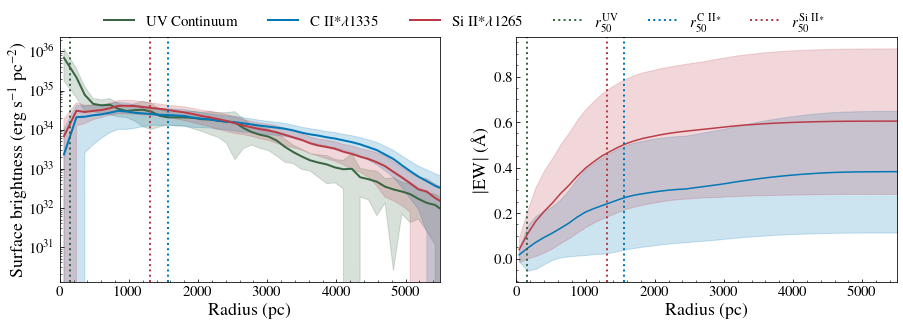

In [42]:
meanrfluxcII = np.nanmean(rfluxcontcii, axis = 0)
stdrfluxcII = np.nanstd(rfluxcontcii, axis = 0)
stdrfluxcII[(meanrfluxcII-stdrfluxcII)< 0] = stdrfluxcII[(meanrfluxcII-stdrfluxcII)< 0]*0.6
stdrfluxcII = gaussian_filter(stdrfluxcII,sigma = 1)
meantotfcII = np.mean(totalcontcii, axis = 0)

meanrfluxsiII = np.nanmean(rfluxcontsiii, axis = 0)
stdrfluxsiII = np.nanstd(rfluxcontsiii, axis = 0)
stdrfluxsiII[(meanrfluxsiII-stdrfluxsiII)< 0] = stdrfluxsiII[(meanrfluxsiII-stdrfluxsiII)< 0]*0.6
# stdrfluxsiII = gaussian_filter(stdrfluxsiII,sigma = 1)


meantotfsiII = np.mean(totalcontsiii, axis = 0)
r50cii = np.zeros(300)
r50siii = np.zeros(300)
r50fluocii = np.zeros(300)
r50fluosiii = np.zeros(300)


for i in range(300):
    
    xnew  = np.arange(np.min(rrad), np.max(rrad), 0.01)

    f  = interpolate.interp1d(rrad, rfluxcontcii[i])
    ft = interpolate.interp1d(rrad, totalcontcii[i])
    ynewcii  = f(xnew)   # use interpolation function returned by `interp1d`
    ytnewcii = ft(xnew) 

    
    f  = interpolate.interp1d(rrad, rfluxcontsiii[i])
    ft = interpolate.interp1d(rrad, totalcontsiii[i])
    ynewsiii  = f(xnew)   # use interpolation function returned by `interp1d`
    ytnewsiii = ft(xnew) 

    half_fluxcii = np.max(ytnewcii)/2.0
    half_fluxsiii = np.max(ytnewsiii)/2.0

#     print(half_fluxcii,half_fluxsiii)
    r50s = (imsize/nxy)*( xnew[(xnew > 1) & (np.round(ytnewcii,1) >= half_fluxcii)])
#     r50cii = r50s
    if len(r50s > 1): r50cii[i] = r50s[0]
    else: r50cii[i] = r50s

    r50s = (imsize/nxy)*( xnew[(xnew > 1) & (np.round(ytnewsiii,1) >= half_fluxsiii)])
#     r50siii = r50s
    if len(r50s > 1): r50siii[i] = r50s[0]
    else: r50siii[i] = r50s
        
        
# FLUO TIME
    xnew  = np.arange(np.min(rrad), np.max(rrad), 0.01)

    f  = interpolate.interp1d(rrad, rfluxfluocii[i])
    ft = interpolate.interp1d(rrad, totalfluocii[i])
    ynewcii  = f(xnew)   # use interpolation function returned by `interp1d`
    ytnewcii = ft(xnew) 

    
    f  = interpolate.interp1d(rrad, rfluxfluosiii[i])
    ft = interpolate.interp1d(rrad, totalfluosiii[i])
    ynewsiii  = f(xnew)   # use interpolation function returned by `interp1d`
    ytnewsiii = ft(xnew) 

    half_fluxcii = np.max(ytnewcii)/2.0
    half_fluxsiii = np.max(ytnewsiii)/2.0

#     print(half_fluxcii,half_fluxsiii)
    r50s = (imsize/nxy)*( xnew[(xnew > 1) & (np.round(ytnewcii,1) >= half_fluxcii)])
#     r50cii = r50s
    if len(r50s > 1): r50fluocii[i] = r50s[0]
    else: r50fluocii[i] = r50s

    r50s = (imsize/nxy)*( xnew[(xnew > 1) & (np.round(ytnewsiii,1) >= half_fluxsiii)])
#     r50siii = r50s
    if len(r50s > 1): r50fluosiii[i] = r50s[0]
    else: r50fluosiii[i] = r50s

        

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (15,4.5))
ax1.plot(rrad*(imsize/nxy),meanrfluxsiII/(120*120),label='UV Continuum', c = '#386641', linewidth = 2)
ax1.fill_between(rrad*(imsize/nxy),meanrfluxsiII/(120*120)+stdrfluxsiII/(120*120),
                 meanrfluxsiII/(120*120) - stdrfluxsiII/(120*120), color= '#386641', alpha = 0.2)
ax1.plot(rrad*(imsize/nxy),np.nanmean(rfluxfluocii, axis = 0)/(120*120),label='C II*$\lambda$1335', color = "#0077B6",
         linewidth = 2)
ax1.fill_between(rrad*(imsize/nxy),np.nanmean(rfluxfluocii, axis = 0)/(120*120)+np.nanstd(rfluxfluocii, axis = 0)/(120*120),
                 np.nanmean(rfluxfluocii, axis = 0)/(120*120)- np.nanstd(rfluxfluocii, axis = 0)/(120*120),
                 color = '#0077B6', alpha = 0.2)

ax1.plot(rrad*(imsize/nxy),np.nanmean(rfluxfluosiii, axis = 0)/(120*120),label='Si II*$\lambda$1265',color = "#BA3B46", 
         linewidth = 2)
ax1.fill_between(rrad*(imsize/nxy),np.nanmean(rfluxfluosiii, axis = 0)/(120*120)+np.nanstd(rfluxfluosiii, axis = 0)/(120*120),
                 np.nanmean(rfluxfluosiii, axis = 0)/(120*120) - np.nanstd(rfluxfluosiii, axis = 0)/(120*120),
                                                                 color = '#BA3B46', alpha = 0.2)

ax1.axvline(np.nanmedian(r50siii), label = r'$r_{50}^{\rm UV}$', color = '#386641', linestyle = ':', linewidth = 2 )
ax1.axvline(np.nanmedian(r50fluocii), label = r'$r_{50}^{\rm C\ II*}$', color = '#0077B6', linestyle = ':', linewidth = 2 )
ax1.axvline(np.nanmedian(r50fluosiii), label = r'$r_{50}^{\rm Si\ II*}$', color = '#BA3B46', linestyle = ':', linewidth = 2 )


ax2.plot(np.arange(1,64,1)*120-80, np.mean(EWemiCIIim[:,:], axis =0), color = '#0077B6', label = 'C II* 1335')
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(1,64,1)*120-80,np.mean(EWemiCIIim[:,:], axis =0)-np.std(EWemiCIIim[:,:], axis =0),
                 np.mean(EWemiCIIim[:,:], axis =0)+np.std(EWemiCIIim[:,:], axis =0), alpha = 0.2, color = '#0077B6')
ax2.plot(np.arange(1,64,1)*120-80, np.mean(EWemiSiIIim[:,:], axis =0), color = '#BA3B46', label = 'Si II* 1265' )
# plt.plot(np.arange(1,64,1)*120, np.mean(EWabs[:10,1:], axis =0))
ax2.fill_between(np.arange(1,64,1)*120-80,np.mean(EWemiSiIIim[:,:], axis =0)-np.std(EWemiSiIIim[:,:], axis =0),
                 np.mean(EWemiSiIIim[:,:], axis =0)+np.std(EWemiSiIIim[:,:], axis =0), alpha = 0.2, color = '#BA3B46')
# plt.subplots_adjust(hspace = 0.1)
# plt.axvline(160, label = r'$r_{50}^{\rm UV}$', color = '#386641', linestyle = ':', linewidth = 2 )
# plt.axvline(1589.5335068817576, label = r'$r_{50}^{\rm C\ II*}$', color = '#0077B6', linestyle = ':', linewidth = 2 )
# plt.axvline(1262, label = r'$r_{50}^{\rm Si\ II*}$', color = '#BA3B46', linestyle = ':', linewidth = 2 )
ax2.axvline(160,  color = '#386641', linestyle = ':', linewidth = 2 )
ax2.axvline(1560, color = '#0077B6', linestyle = ':', linewidth = 2 )
ax2.axvline(1305,color = '#BA3B46', linestyle = ':', linewidth = 2 )

# plt.axvspan(269-297, 269+297,color = 'k',
#            alpha = 0.1)

ax2.set_xlim(0,5500)
ax2.set_xlabel(r'Radius (kpc)', fontsize = 18)
ax2.set_ylabel(r'$|$EW$|$ ($\rm \AA$)', fontsize = 18)
ax1.set_yscale('log')
ax1
ax1.set_xlabel('Radius (pc)', fontsize = 18)
ax1.set_ylabel('Surface brightness (erg s$^{-1}$ pc$^{-2}$)', fontsize = 18)
ax1.legend(frameon=False, ncol=6, loc = (0.1,1))
ax1.set_xlim(-0,5500)
plt.savefig('Plots/lightcurves_EWs_dep.pdf', bbox_inches = 'tight')

### Optical

64 512 7718.5238573924435 0.00109


## Contour maps

### J0926

#### Si II

In [257]:
# Computing velocity map

idir = 275
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
vcII   = (l_systemic[:]/wsiII1260 -1)*c

# ax.set_xlim(-1000,2000)
imageall = cubeSiII[idir,:,:,1:]#/ (imsize/nxy)**2 
v260min = np.zeros((64,64))
v260cen = np.zeros((64,64))
EWabs260 = np.zeros((64,64))
EWemi260 = np.zeros((64,64))

v260cen[:,:]=np.nan
for i in range(1,63):
    for j in range(1,63):
        spec =gaussian_filter( np.sum(imageall[i-1:i+1,j-1:j+1,:], axis = (0,1)),3)
        nmed = np.median(spec[vcII<=-1000])
        spec = spec/nmed
        valid = (vcII>=-400) & (vcII<=300)     
        modFlux = spec
#         print(np.sum(modFlux) >0)
        if(nmed > 5e36 and np.sum(modFlux) >0 ):

            V    = vcII[valid][modFlux[valid] == np.min(modFlux[valid])][0]
            Fmin =  np.min(modFlux[valid][(vcII[valid]>=V-20) & (vcII[valid] <=V+20)])
            EWa, aa = measureEWabs(l_systemic[valid], vcII[valid], modFlux[valid].copy(),
                                            np.zeros(len(valid)), -400, 250)
            print(EWa)
            EWe, aa = measureEWemi(l_systemic, vcII, modFlux.copy(),
                                            np.zeros(len(vcII)), 800, 1200)
            modFlux = 1-modFlux
            modFlux[modFlux<= 0] = 0
            vcen = vcII[valid][np.cumsum(modFlux[valid])>= 0.5*np.max(np.cumsum(modFlux[valid]))][0]
#             print(vcen, Fmin, EWa, np.std(spec[vcII<-800]))

#             break
#             plt.plot(vcII,spec)
#             plt.ylim(0,5)
            #if(EWa < -0. and np.std(modFlux[(vcII<=1000) <0.4])):
            v260min[i][j] = V
            v260cen[i][j] = vcen
            EWabs260[i][j] = EWa
            
            EWemi260[i][j] = EWe
                
#             plt.figure()

#             plt.plot(vcII,  gaussian_filter(spec,sigma = 3))
#             plt.ylim(0,2)
#             plt.show()
#             print(Fmin, V, vcen)
        else:
            v260min[i][j] = np.nan
            v260cen[i][j] = np.nan
            
        

/tmp/ipykernel_5679/876996419.py:19: RuntimeWarning: divide by zero encountered in true_divide
  spec = spec/nmed
/tmp/ipykernel_5679/876996419.py:19: RuntimeWarning: invalid value encountered in true_divide
  spec = spec/nmed


-0.748258266058083
-0.7209461988284938
-0.7291938001413907
-0.7993537977144651
-0.5072949603100965
-0.8440371118781747
-0.8336447469793828
-0.5653495582921066
-0.9945352940524101
-1.0326056589769002
-1.1717676922314926
-0.8840199121385677
-0.48146970978564724
-0.4545100446542417
-0.42884582313498154
-0.1891363007402016
-0.4028623932207513
-0.4504566632721714
0.040986733095819836
-0.35486225654440984
-0.34227081799403014
-0.23103247609181343
-0.4522834546208062
-0.3224469681903839
0.05296453779039097
-0.38377158946999
-0.5148973489674242
0.021893027308153658
-0.1929963516460032
-0.22443756523647854
0.0947465620534565
0.10377135989691114
0.04170719494234509
0.13369199757798111
0.08070569059329655
0.09195284137854029
0.04575177003032496
0.017054515494959024
0.11049752674320333
0.12873328364201408
0.13490196078430483
0.13490196078430483
0.13294021934051714
0.11222083340177857
0.08793999122220408
0.07769978102118362
0.13490196078430483
0.011815928993488552
0.013673501511979417
0.10771176043

-0.9036199252814621


241.0
60.0
8
-39.897006398840745 -112.7028276627273
-14.21271385983051 -64.34802393078212
0.053587354372763914
0.22320737382454553
0.33766085030660686
0.4096657482266879


/tmp/ipykernel_5679/2998840890.py:53: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/2998840890.py:53: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/2998840890.py:150: UserWarning: The following kwargs were not used by contour: 'label'
  ax2.contour( pp, levels=[aa], colors='w', alpha=0.3, linewidths=6, label = '', zorder = 14)
/tmp/ipykernel_5679/2998840890.py:187: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[aa], colors='w', alpha=0.2, linewidths=6, label = '')
/tmp/ipykernel_5679/2998840890.py:192: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3, label = '')
/tmp/ipykernel_5679/2998840890.py:224: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contourf( imageratio, level

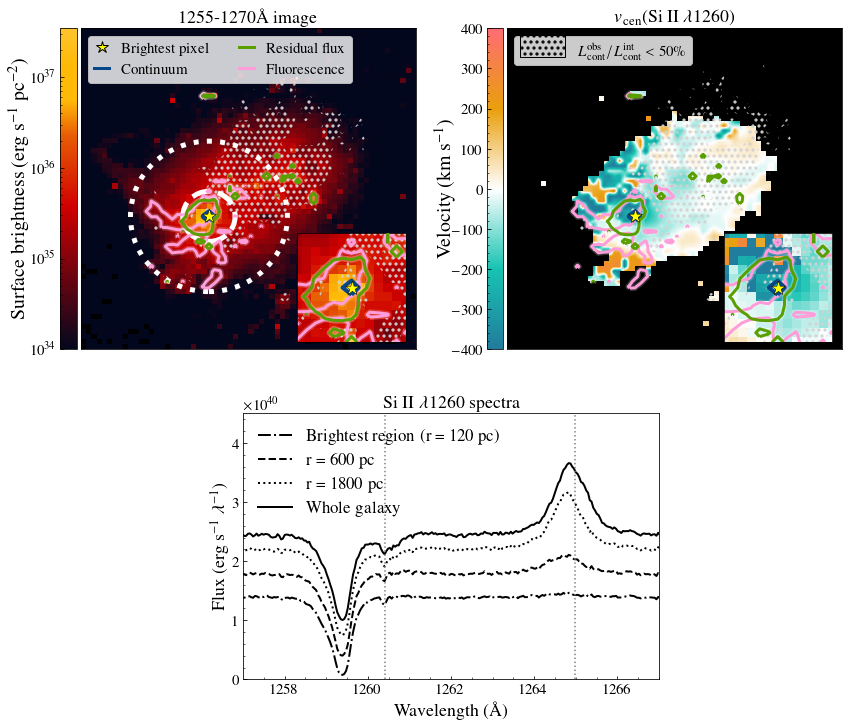

In [311]:
# #### plotting a spectrum
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#5A9F00'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)

idir = 275
# print(fesc[148-90,idir])
fig = plt.figure(figsize = (14,14))
gs = GridSpec(14, 13)
ax2 = plt.subplot(gs[:6, :6])
ax = plt.subplot(gs[:6, 7:])
ax3 = plt.subplot(gs[7:12, 3:-3])

spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

vcII  = (l_systemic/wsiII1260-1)*c
# spec = np.sum(cubeCII[idir,:,:,1:],axis=(0,1)) 
# vcII  = (lcubeCII[1:]/wcII1334-1)*c
idres = np.argmin(spec)  -5
idres2 = np.argmin(spec) +5

idflu = np.argmax(spec)-5
idflu2 =  np.argmax(spec)+5
# idres = np.where(l_systemic > wsiII1260)# np.argmax(spec)-10
# idres = idres[0][0]-15
# idres2 = idres+15
# ax.set_xlim(-1000,2000)
imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubeSiII[idir,:,:,idflu+20:idflu2+20],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/

cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)

imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imageratio = imagecontAtt/imagecontInt
imageratio2 = imageratio.copy()
imageratio2[imageratio2<0.5] = 0

dratio = imageratio2.copy()
dratio[imageratio2>=0.5] =1
dratio = 1-dratio
print(np.nansum(dratio))



im1 = ax2.imshow(imageall/(120*120), norm=LogNorm(vmin=10**34,vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')

cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]


num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
# cmap2 = matplotlib.cm.coolwarm
cmap2.set_bad('black',1.)
im2 = ax.imshow(v260cen, cmap=cmap2, interpolation="bilinear",origin = 'lower', vmin = -400, vmax = 400,
          aspect = 'auto')
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = imagecont.copy()
pp[pp<aa] = 0

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_cont_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
spec_cont_out = np.sum(nsp,axis=(0,1))

axins = zoomed_inset_axes(ax2, 1.8, loc=4) # zoom = 6
axins.imshow(imageall/(120*120), interpolation="nearest",
            norm=LogNorm(vmin=10**34,vmax=5e41/(120*120)), cmap=cmap)


axins.set_xlim(cy-6, cy+6)
axins.set_ylim(cx-6, cx+6)
axins.set_xticks([])
axins.set_yticks([])


axins2 = zoomed_inset_axes(ax, 1.8, loc=4) # zoom = 6
axins2.imshow(v260cen, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
             cmap=cmap2)


axins2.set_xlim(cy-6, cy+6)
axins2.set_ylim(cx-6, cx+6)
axins2.set_xticks([])
axins2.set_yticks([])


ax2.contour( pp, levels=[aa], colors=contCol,  linewidths=6, zorder = 10)
axins.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=4, zorder = 10)
ax.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=6, zorder = 10)
axins2.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=4, zorder = 10)


########## ABS

dd = abs(imageabs.copy())#.copy() 
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
idx = np.linspace(0,len(cumdd)-1,len(cumdd))

gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = abs(imageabs).copy()
pp[pp<aa] = 0
aa2 = aa

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
dtest = nsp.copy()
dtest[pp>=aa] =1
print(np.nansum(dtest[:,:,0]))
print(np.nansum((np.logical_and(dratio,dtest[:,:,0]))))
spec_abs_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_abs_out = np.sum(nsp,axis=(0,1))

ax2.contour( pp, levels=[aa], colors='w', alpha=0.3, linewidths=6, label = '', zorder = 14)
axins2.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6,)
axins.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6,)
ax.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6)

ax2.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
ax.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
axins2.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)


######## Emision

dd = (imageemi-imagecont).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi-imagecont).copy()
pp[pp<aa] = 0

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_fluo_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_fluo_out = np.sum(nsp,axis=(0,1))

print(np.nanmean(v260cen), np.nanmean(v260cen[pp>=aa]) )
print(np.nanmedian(v260cen), np.nanmedian(v260cen[pp>=aa]) )
# ax.imshow(pp,norm=LogNorm(vmin=5e36,vmax=5e41), cmap=cmap, interpolation="nearest",origin = 'lower',
#           aspect = 'auto')

CS = ax2.contour( pp, levels=[aa], colors='w', alpha=0.2, linewidths=6, label = '')
axins2.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6,)
axins.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6,)
ax.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6)

CS = ax2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3, label = '')
axins2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)
axins.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)
ax.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)

labels = ['50% of fluorescent flux']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    


nsp3 = cubeSiII[idir,:,:,:].copy()
nsp3[((imageemi-imagecont))<dd[gidx]] = 0
# nsp3[nsp1 == 0] = 0

spec_emi_in = np.sum(nsp3[:,:,1:],axis=(0,1))

ax2.set_xticks([])
ax2.set_yticks([])
ax.set_xticks([])
ax.set_yticks([])

line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line1 = Line2D([0], [0], color=contCol, linewidth=3)
line2 = Line2D([0], [0], color=resCol, linewidth=3)
line3 = Line2D([0], [0], color=fluCol, linewidth=3)

labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']
ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)

axins2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
axins.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')

line4 = patch = patches.Patch(facecolor='none', hatch="..", edgecolor="k", alpha = 1)   

leg = ax.legend([line4],[r'$L_{\rm cont}^{\rm obs} / L_{\rm cont}^{\rm int} < 50\%$'],loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 3)
for patch in leg.get_patches():
    patch.set_height(22)
    patch.set_y(-2)
# ax.set_xlabel(r'Velocity (km s$^{-1}$)', fontsize = 18)
# ax.set_ylabel(r'Flux', fontsize = 18)

hduin  = fits.open('../Classy/J09264427/J0926+4427_SB99fit.fits')
data   = hduin[1].data
wave   = data['wave']
flux   = data['flux']
err    = data['err']

vsiIId = (wave/wsiII1260-1)*c
cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 
    
fsiII    = flux[cutSiIIall]
esiII    = err[cutSiIIall]
vsiII    = vsiIId[cutSiIIall]
ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
axins2.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')


# ax3.plot(vcII-80,gaussian_filter(spec, sigma = 1.5), color = 'k', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_cont_out, sigma = 1.5), color = 'purple', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_fluo_out, sigma = 1.5), color = 'mediumseagreen', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_abs_out, sigma = 1.5), color = cnoFS, linewidth = 2, label = '')
# ax3.set_xlim(-1000,1450)


# ymin, ymax = ax.get_ylim()
# ax.set_ylim(0.2e40,ymax)
# ax3.set_ylim(0.2e40,ymax)
# ax.legend(frameon=False, fontsize = 18)
# ax.set_ylim(1.2e40,ymax)ax.plot(vcII-80,gaussian_filter(spec_cont_in, sigma = 1.5), color = 'k', linewidth = 2, label = '')
# ax3.set_yticks([])
# ax3.set_xticklabels(['','-500', '0', '500','1000','1500'])
# ax.set_title('Within contours')
ax3.set_title('Si II $\lambda$1260 spectra')
ax2.set_title('1255-1270\AA\ image')
ax.set_title(r'$v_{\rm cen}$(Si II $\lambda$1260)')
ax3.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
ax3.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

divider = make_axes_locatable(ax)
cax2 = divider.append_axes('left', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('left')
cbar2.set_label('Velocity (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = -70



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))


aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax2.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax2.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

ax3.plot(l_systemic[:],gaussian_filter(spec_cont_in[:], sigma = 0.5), color = 'k', linewidth = 2, label = 'Brightest region (r = 120 pc)',
        linestyle = '-.')
ax3.plot(l_systemic[:],gaussian_filter(spec_r5[1:], sigma = 0.5), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
ax3.plot(l_systemic[:],gaussian_filter(spec_r15[1:], sigma = 0.5), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
ax3.plot(l_systemic[:],gaussian_filter(spec, sigma = 0.5), color = 'k', linewidth = 2, label = 'Whole galaxy')
ax3.set_xlim(1257,1267)
ax3.legend(frameon = False, fontsize = 17)
print(np.min(spec_cont_in)/np.median(spec_cont_in))
print(np.min(spec_r5)/np.median(spec_r5))
print(np.min(spec_r15)/np.median(spec_r15))
print(np.min(spec)/np.median(spec))

ax3.set_ylim(0, 4.5*1e40)

ax3.axvline(wsiII1260, linestyle = ':', c='gray')
ax3.axvline(1264.99, linestyle = ':', c='gray')

# plt.savefig('Plots/contourJ0926_SiIId.pdf', bbox_inches = 'tight')

In [460]:
print(v260cen)

[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


/tmp/ipykernel_1155799/3801330179.py:4: RuntimeWarning: divide by zero encountered in true_divide
  im1 = plt.imshow(imagecontAtt/imagecontInt, cmap='magma', interpolation="nearest",origin = 'lower',
/tmp/ipykernel_1155799/3801330179.py:4: RuntimeWarning: invalid value encountered in true_divide
  im1 = plt.imshow(imagecontAtt/imagecontInt, cmap='magma', interpolation="nearest",origin = 'lower',
/tmp/ipykernel_1155799/3801330179.py:16: RuntimeWarning: divide by zero encountered in log10
  im1 = plt.imshow(np.log10(imagecontInt), cmap='magma', interpolation="nearest",origin = 'lower',


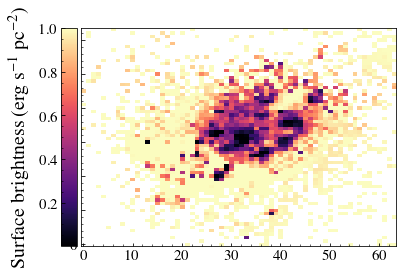

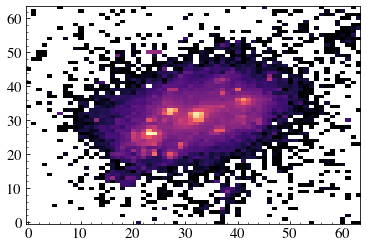

In [53]:
imagecontAtt = np.sum(cubecII[275,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imagecontInt = np.sum(cubecIIint[275,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 

im1 = plt.imshow(imagecontAtt/imagecontInt, cmap='magma', interpolation="nearest",origin = 'lower',
          aspect = 'auto', vmax =1)
ax2 = plt.gca()
divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

plt.figure()

im1 = plt.imshow(np.log10(imagecontInt), cmap='magma', interpolation="nearest",origin = 'lower',
          aspect = 'auto')

/tmp/ipykernel_5679/1947124649.py:74: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/1947124649.py:74: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/1947124649.py:354: UserWarning: The following kwargs were not used by contour: 'edgecolor'
  cs=ax1.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', colors='none', edgecolor = 'red')
/tmp/ipykernel_5679/1947124649.py:356: UserWarning: The following kwargs were not used by contour: 'label'
  ax3.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
/tmp/ipykernel_5679/1947124649.py:357: UserWarning: The following kwargs were not used by contour: 'label'
  ax4.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
/tmp/ipykernel_5679/1947124649.py:359: UserW

1.4453758193905226e+40
241.0
1259.3063237967074


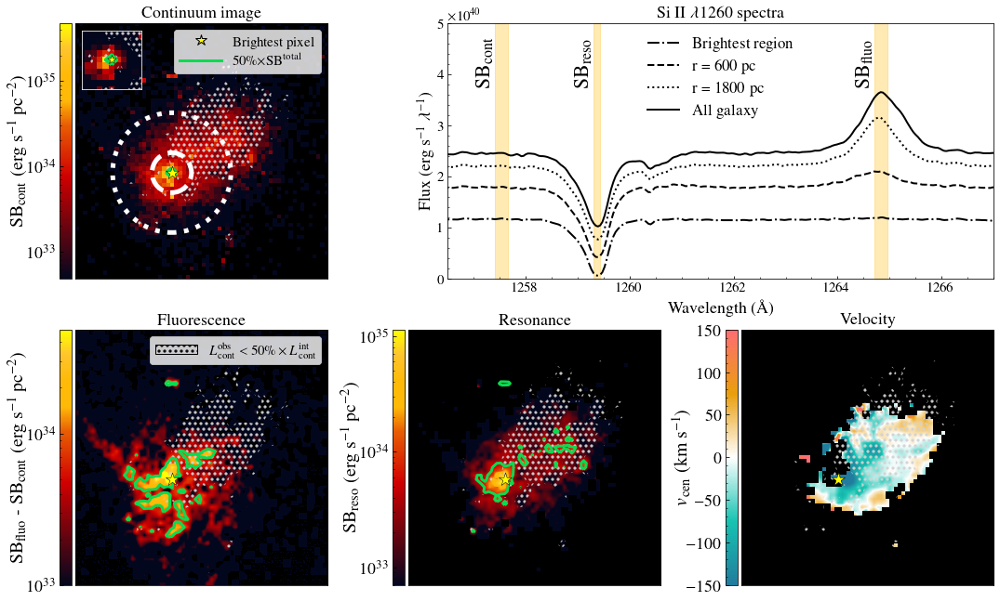

In [308]:
# #### plotting a spectrum
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D", "#FFFF00"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#0BDA51'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)

# num_colors = len(cb_colors)
cmap3 = LinearSegmentedColormap.from_list('test3',cb_colors[::-1])

cmap3.set_bad('black',1.)

idir = 275
spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

vcII  = (l_systemic/wsiII1260-1)*c


# fig, ((ax1, ax4), (ax2, ax3)) = plt.subplots(2,2,figsize = (14,14))
fig = plt.figure(figsize = (18,12))
gs = GridSpec(14, 17)
ax1 = plt.subplot(gs[:6, :5])
axspec = plt.subplot(gs[:6, 7:])
ax4 = plt.subplot(gs[7:-1, :5])
ax3 = plt.subplot(gs[7:-1, 6:11])
ax2 = plt.subplot(gs[7:-1, 12:])
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax3.set_xticks([])
ax3.set_yticks([])
ax4.set_xticks([])
ax4.set_yticks([])

idres = np.argmin(spec) -2# 120
idres2 = np.argmin(spec) +2


idflu = np.argmax(spec)-3
idflu2 =  np.argmax(spec)+3

# ax.set_xlim(-1000,2000)
imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubeSiII[idir,:,:,15-3:15+3],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/
imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 


cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)
# imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
# imagecont2[imagecont2 < 2.e38] = 0
    
# print(l_systemic[1:len(idres[0])+1])
# imageemi  = np.sum(cubeSiII[idir,:,:,idflu[0][0]:idflu[0][-1]],axis=(2))#/
# imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
# imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imageratio = imagecontAtt/imagecontInt
imageratio2 = imageratio.copy()
imageratio2[imageratio2<0.5] = 0




    
im1 = ax1.imshow(imagecont/(120*120), norm=LogNorm(vmin=np.max(imagecont)/(120*120)*0.0001,
                                                   vmax=np.max(imagecont/(120*120))/10), cmap=cmap, interpolation="nearest",
                 origin = 'lower',
          aspect = 'auto')

divider = make_axes_locatable(ax1)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB$_{\rm cont}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]
print(aa)
pp = imagecont.copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_bright = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax1.contour( pp, levels=[aa], colors=resCol,  linewidths=6, zorder = 10)
axins = zoomed_inset_axes(ax1, 1.5, loc=2) # zoom = 6
axins.imshow(imagecont/(120*120), interpolation="nearest",
            norm=LogNorm(vmin=1e34,vmax=1e40/(120*120)), cmap=cmap)
axins.set_xlim(cy-5, cy+5)
axins.set_ylim(cx-5, cx+5)
axins.set_xticks([])
axins.set_yticks([])
axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
axins.scatter(cy,cx, s = 100, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
for spine in axins.spines.values():
    spine.set_edgecolor('white')
    
ax1.set_title(r'Continuum image')



#### EMI PLOt


emi = imageemi-imagecont
# emi[imagecont<1e37] = np.nan

# emi[emi<0] = 0
# emi[np.isnan(emi)] = 0
im4 = ax4.imshow(emi/(120*120),  cmap=cmap, interpolation="bilinear",origin = 'lower',
          aspect = 'auto',norm=LogNorm(vmin=1e33,
                                                   vmax=np.max(imagecont/(120*120))/100),)

divider = make_axes_locatable(ax4)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im4, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB$_{\rm fluo}$ -  SB$_{\rm cont}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
dd = (imageemi-imagecont).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi-imagecont).copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_emi = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax4.contour( pp, levels=[aa], colors=resCol,  linewidths=3, zorder = 10)
# axins = zoomed_inset_axes(ax4, 1.3, loc=2) # zoom = 6
# axins.imshow(emi/(120*120), interpolation="nearest",
#             norm=LogNorm(vmin=1e33,vmax=5e39/(120*120)), cmap=cmap)
# axins.set_xlim(cy-6, cy+6)
# axins.set_ylim(cx-6, cx+6)
# axins.set_xticks([])
# axins.set_yticks([])
# axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
# axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax4.set_title(r'Fluorescence')


######


dratio = imageratio2.copy()
dratio[imageratio2>=0.5] =1
dratio = 1-dratio
print(np.nansum(dratio))


cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]
num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
cmap2.set_bad('black',1.)
v = v260cen.copy()
v[imagecont<5e36] = np.nan
v[(v>200) | (v<-300)] = np.nan
v[:20, :20] = np.nan

# from astropy.convolution import Gaussian2DKernel
# from astropy.convolution import convolve
# kernel = Gaussian2DKernel(x_stddev=1)
# astropy_conv = convolve(v, kernel)

im2 = ax2.imshow(v, cmap=cmap2, interpolation="bilinear",origin = 'lower', vmin = -150, vmax = 150,
          aspect = 'auto')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im2, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'$v_{\rm cen}$ (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
ax2.set_title(r'Velocity')

### ABSOPRTION IMAGES
# idres = np.argmin(spec) 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
# imageabs[imagecont<1.e36] = 0
abst = imageabs.copy()#(imagecont-imageabs)/imagecont#imageabs #-imagecont#-imagecontEWabs156#
abst[imagecont<1e36] = np.nan

# abst[imagecont<1e34*(120*120)] = np.nan
# abst[]
im3 = ax3.imshow(abst/(120*120),  cmap=cmap, interpolation="bilinear",origin = 'lower',
          aspect = 'auto',norm=LogNorm(vmin=7e32,
 vmax=np.nanmax(abst/(120*120))/2))#norm=LogNorm(vmin=9e33,vmax=5e39/(120*120))))#, norm=LogNorm(vmin=np.max(imagecont)/(120*120)*0.0005,
                          #                         vmax=np.max(imagecont/(120*120))/10))#norm=LogNorm(vmin=9e33,vmax=5e39/(120*120)))
divider = make_axes_locatable(ax3)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im3, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
# cbar.set_ticks([-1,-.5,0,0.5,1])
cbar.set_label(r'SB$_{\rm reso}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
# idres = np.argmin(spec) 
# imageabs  = np.sum(cubeSiII[idir,:,:,idres-3:idres+3],axis=(2))#/ (imsize/nxy)**2 
# imageabs[imagecont<1.e36] = 0

dd = (imageabs).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageabs).copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_abs = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax3.contour( pp, levels=[aa], colors=resCol,  linewidths=3, zorder = 10)
# axins = zoomed_inset_axes(ax3, 1.3, loc=2) # zoom = 6
# axins.imshow(emi/(120*120), interpolation="nearest",
#             norm=LogNorm(vmin=1e34,vmax=5e39/(120*120)), cmap=cmap)
# axins.set_xlim(cy-6, cy+6)
# axins.set_ylim(cx-6, cx+6)
# axins.set_xticks([])
# axins.set_yticks([])
# axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
# axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax3.set_title(r'Resonance')




ax1.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax3.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax4.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax1.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax1.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
# l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 



line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line2 = Line2D([0], [0], color=resCol, linewidth=3)
# line3 = Line2D([0], [0], color=fluCol, linewidth=3)
line4 = patch = patches.Patch(facecolor='none', hatch="..", edgecolor="k", alpha = 1)   
leg = ax1.legend([line0, line2],
                 [r'Brightest pixel',r'$50\%\times$SB$^{\rm total}$'],
                 fontsize = 15, ncol = 1, handlelength = 3)
leg = ax4.legend([line4],
                 [r'$L_{\rm cont}^{\rm obs} <  50\%\times L_{\rm cont}^{\rm int} $'],
                 fontsize = 15, ncol = 1, handlelength = 3)
# labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']
# ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)

axspec.plot(l_systemic[1:],gaussian_filter(spec_center[1:], sigma = 1.), color = 'k', linewidth = 2, 
            label = 'Brightest region ',
        linestyle = '-.')
axspec.plot(l_systemic[1:],gaussian_filter(spec_r5[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
axspec.plot(l_systemic[1:],gaussian_filter(spec_r15[1:], sigma = 1.), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
axspec.plot(l_systemic[1:],gaussian_filter(spec[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'All galaxy')
axspec.set_xlim(1256.5,1267)
axspec.legend(frameon = False, fontsize = 17, loc  ='upper center', ncol = 1)
axspec.set_ylim(0, 3*1e40)

print(l_systemic[idres])
# axspec.vlines(l_systemic[int(idres)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0 )
# axspec.vlines(l_systemic[int(idres2)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0)
axspec.fill_betweenx([ 0,5*1e40],l_systemic[int(idres)],l_systemic[int(idres2)-1],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

# axspec.vlines(l_systemic[int(idflu)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0 )
# axspec.vlines(l_systemic[int(idflu2)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0)
axspec.fill_betweenx([0, 5*1e40],l_systemic[int(idflu)],l_systemic[int(idflu2)],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

axspec.fill_betweenx([0, 5*1e40],l_systemic[83],l_systemic[89],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

axspec.text(l_systemic[74], 3.8e40, r'SB$_{\rm cont}$', rotation = 90, fontsize = 22)
axspec.text(l_systemic[int(idres)-9], 3.8e40, r'SB$_{\rm reso}$', rotation = 90, fontsize = 22)
axspec.text(l_systemic[int(idflu)-9], 3.8e40, r'SB$_{\rm fluo}$', rotation = 90, fontsize = 22)

# axspec.plot(vcII[1:], spec_bright)
# axspec.plot(vcII[1:], spec_emi)
# axspec.plot(vcII[1:], spec_abs)
plt.rcParams['hatch.linewidth'] = 2
plt.rcParams['hatch.color'] = '#D3D3D3'
cs=ax1.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', colors='none', edgecolor = 'red')
ax2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax3.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
ax4.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
# plt.rcParams.update({'hatch.color': 'c'})
axins.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')

axspec.set_title('Si II $\lambda$1260 spectra')
axspec.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
axspec.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

axspec.set_ylim(0, 5*1e40)
# axspec.axvline(wsiII1260, linestyle = ':', c='gray')
# axspec.axvline(1264.99, linestyle = ':', c='gray')
plt.savefig('Plots/contourJ0926_SiIIV3.pdf', bbox_inches = 'tight')

NameError: name 'aperture_masks2' is not defined

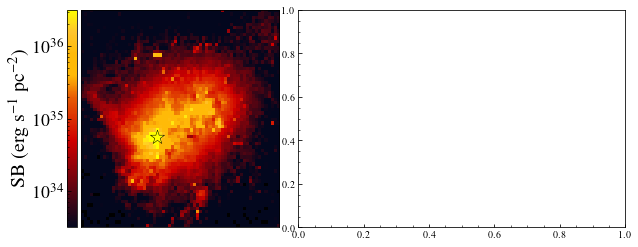

In [25]:
# nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII_dep/',300)
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D", "#FFFF00"]

contCol = '#064789'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)

idir = 275
spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

vcII  = (l_systemic/wsiII1260-1)*c


# fig, ((ax1, ax4), (ax2, ax3)) = plt.subplots(2,2,figsize = (14,14))
fig = plt.figure(figsize = (10,4))
gs = GridSpec(10, 5)
ax_im = plt.subplot(gs[:, :2])
ax_spec = plt.subplot(gs[:, 2:])

ax_im.set_xticks([])
ax_im.set_yticks([])

# ax.set_xlim(-1000,2000)
image_all = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
pc_per_pixel = 120
image_all = image_all/pc_per_pixel**2 # transforming into erg/s/pc2
cx,cy = np.where(image_all == np.max(image_all))
cx = int(cx)
cy = int(cy)
ymax_val = np.nanmax(image_all)
im1 = ax_im.imshow(image_all, 
                 norm=LogNorm(vmin=ymax_val/1e5,
                vmax=ymax_val/1e2), cmap=cmap, interpolation="nearest",
                 origin = 'lower',          aspect = 'auto')

divider = make_axes_locatable(ax_im)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)

ax_im.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')


aperture = CircularAperture([cy,cx], r = 5) 
aperture_masks = aperture.to_mask(method='center') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))
circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax_im.add_patch(circle2)



In [72]:
from astropy.io import fits
cube = cubeSiII[120,:,:,1:]
# Saving variables to a FITS file
fits_filename = 'data.fits'

# Create HDU for cube data
cube_hdu = fits.PrimaryHDU(cube)

# Create HDU for l_systemic data
l_systemic_hdu = fits.ImageHDU(l_systemic, name='L_SYSTEMIC')

# Create HDU list and write to FITS file
hdul = fits.HDUList([cube_hdu, l_systemic_hdu])
hdul.writeto(fits_filename, overwrite=True)

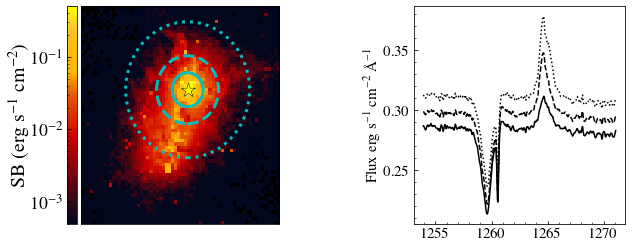

In [73]:
# Increasing aperture

from astropy.io import fits
fits_filename = 'data.fits'
with fits.open(fits_filename) as hdul:
    cube_data = hdul[0].data
    l_systemic_data = hdul['L_SYSTEMIC'].data

cm_per_pixel = 0.120*3.086e+21 ## size kpc

cube_data /= cm_per_pixel**2
num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)
cmap.set_bad('black',1.)

spec_all = np.sum(cube_data,axis=(0,1)) 
vsiII  = (l_systemic_data/1260.41-1)*c

fig = plt.figure(figsize = (10,4))
gs = GridSpec(10, 5)
ax_im = plt.subplot(gs[:, :2])
ax_spec = plt.subplot(gs[:, 3:])

ax_im.set_xticks([])
ax_im.set_yticks([])

image_all = np.sum(cube_data,axis=(2))#/ (imsize/nxy)**2 
image_all = image_all # transforming into erg/s/pc2
cx,cy = np.where(image_all == np.max(image_all))
cx = int(cx)
cy = int(cy)
ymax_val = np.nanmax(image_all)
im1 = ax_im.imshow(image_all, 
                 norm=LogNorm(vmin=ymax_val/1e5,
                vmax=ymax_val/1e2), cmap=cmap, interpolation="nearest",
                 origin = 'lower',          aspect = 'auto')

divider = make_axes_locatable(ax_im)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB (erg s$^{-1}$ cm$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)

ax_im.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')


# Define circular aperture
aperture = CircularAperture([cy, cx], r=5) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
ax_spec.plot(l_systemic_data, spec_r5, c = 'k', label = 'R = 0.6 kpc', ls = '-')
circle2 = plt.Circle((cy,cx), 5, color='c', fill=False , linewidth=3, linestyle = '-')
ax_im.add_patch(circle2)

# Define circular aperture
aperture = CircularAperture([cy, cx], r=10) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
ax_spec.plot(l_systemic_data, spec_r5, c = 'k', label = 'R = 1.2 kpc', ls = '--')
circle2 = plt.Circle((cy,cx), 10, color='c', fill=False , linewidth=3, linestyle = '--')
ax_im.add_patch(circle2)

# Define circular aperture
aperture = CircularAperture([cy, cx], r=20) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
ax_spec.plot(l_systemic_data, spec_r5, c = 'k', label = 'R = 2.4 kpc', ls = ':')
circle2 = plt.Circle((cy,cx), 20, color='c', fill=False , linewidth=3, linestyle = ':')
ax_im.add_patch(circle2)

ax_spec.set_ylabel(r'Flux erg s$^{-1}$ cm$^{-2}$ $\rm \AA^{-1}$ ', fontsize = 15)
ax_spec.tick_params(labelsize = 15)

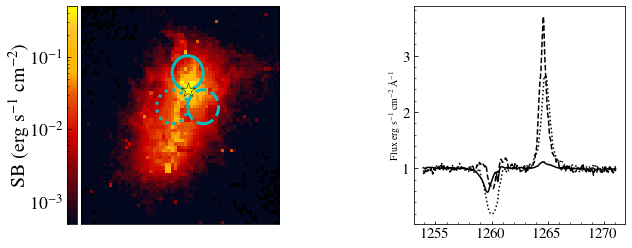

In [74]:
# Offset aperture

from astropy.io import fits
fits_filename = 'data.fits'
with fits.open(fits_filename) as hdul:
    cube_data = hdul[0].data
    l_systemic_data = hdul['L_SYSTEMIC'].data

cm_per_pixel = 0.120*3.086e+21 ## size kpc

cube_data /= cm_per_pixel**2
num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)
cmap.set_bad('black',1.)

spec_all = np.sum(cube_data,axis=(0,1)) 
vsiII  = (l_systemic_data/1260.41-1)*c

fig = plt.figure(figsize = (10,4))
gs = GridSpec(10, 5)
ax_im = plt.subplot(gs[:, :2])
ax_spec = plt.subplot(gs[:, 3:])

ax_im.set_xticks([])
ax_im.set_yticks([])

image_all = np.sum(cube_data,axis=(2))#/ (imsize/nxy)**2 
image_all = image_all # transforming into erg/s/pc2
cx,cy = np.where(image_all == np.max(image_all))
cx = int(cx)
cy = int(cy)
ymax_val = np.nanmax(image_all)
im1 = ax_im.imshow(image_all, 
                 norm=LogNorm(vmin=ymax_val/1e5,
                vmax=ymax_val/1e2), cmap=cmap, interpolation="nearest",
                 origin = 'lower',          aspect = 'auto')

divider = make_axes_locatable(ax_im)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB (erg s$^{-1}$ cm$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)

ax_im.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')

newcx = cx+5
newcy = cy
# Define circular aperture
aperture = CircularAperture([newcy, newcx], r=5) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
median_r5 = np.median(spec_r5)
ax_spec.plot(l_systemic_data, spec_r5/median_r5, c = 'k', label = 'R = 0.6 kpc', ls = '-')
circle2 = plt.Circle((newcy,newcx), 5, color='c', fill=False , linewidth=3, linestyle = '-')
ax_im.add_patch(circle2)

newcx = cx -5
newcy = cy+5
# Define circular aperture
aperture = CircularAperture([newcy, newcx], r=5) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
median_r5 = np.median(spec_r5)

ax_spec.plot(l_systemic_data, spec_r5/median_r5, c = 'k', label = 'R = 1.2 kpc', ls = '--')
circle2 = plt.Circle((newcy,newcx), 5, color='c', fill=False , linewidth=3, linestyle = '--')
ax_im.add_patch(circle2)

newcx = cx -5
newcy = cy-5
# Define circular aperture
aperture = CircularAperture([newcy, newcx], r=5) 
# Create mask from aperture
aperture_masks = aperture.to_mask(method='center')
# Multiply each slice of cube_data by the aperture mask
fimageori = cube_data.copy()
fimage = [aperture_masks.multiply(slice) for slice in fimageori.transpose(2, 0, 1)]
# Sum along the x and y axes for each slice
spec_r5 = gaussian_filter(np.sum(np.asarray(fimage), axis=(1, 2)),sigma = 1)
median_r5 = np.median(spec_r5)

ax_spec.plot(l_systemic_data, spec_r5/median_r5, c = 'k', label = 'R = 2.4 kpc', ls = ':')
circle2 = plt.Circle((newcy,newcx), 5, color='c', fill=False , linewidth=3, linestyle = ':')
ax_im.add_patch(circle2)

ax_spec.set_ylabel(r'Flux erg s$^{-1}$ cm$^{-2}$ $\rm \AA^{-1}$ ')
ax_spec.tick_params(labelsize = 15)

#### C II

/tmp/ipykernel_1088051/2561003198.py:16: RuntimeWarning: divide by zero encountered in true_divide
  spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])
/tmp/ipykernel_1088051/2561003198.py:16: RuntimeWarning: invalid value encountered in true_divide
  spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])


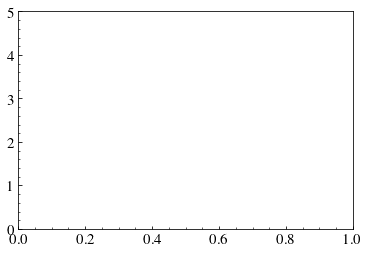

In [1177]:
# #### plotting a spectrum

idir = 275
l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 
vcII   = (l_systemic[:]/wcII1334 -1)*c

# ax.set_xlim(-1000,2000)
imageall = cubecII[idir,:,:,1:]#/ (imsize/nxy)**2 
v260min = np.zeros((64,64))
v260cen = np.zeros((64,64))
v260cen[:,:]=np.nan
for i in range(1,63):
    for j in range(1,63):
        spec = np.sum(imageall[i-1:i+1,j-1:j+1,:], axis = (0,1))
        nmed = np.median(spec)
        spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])
        valid = (vcII>=-800) & (vcII<=500)     
        modFlux = gaussian_filter(spec[valid], sigma = 1)
#         print(np.sum(modFlux) >0)
        if(nmed > 1e36 and np.sum(modFlux) >0):

            V = vcII[valid][modFlux == np.min(modFlux)][0]
            Fmin =  np.min(modFlux[(vcII[valid]>=V-20) & (vcII[valid] <=V+20)])
            modFlux = 1-modFlux
            modFlux[modFlux<= 0] = 0
            vcen = vcII[valid][np.cumsum(modFlux)>= 0.5*np.max(np.cumsum(modFlux))][0]
#             break
#             plt.plot(vcII,spec)
            plt.ylim(0,5)
            v260min[i][j] = V
            v260cen[i][j] = vcen

#             print(Fmin, V, vcen)
        else:
            v260min[i][j] = np.nan
            v260cen[i][j] = np.nan
            
        

0.17547
-21.870653068667625 -87.45386248519
-14.21271385983051 -74.37508594495912
0.12089514644016201
0.30354333528505145
0.4404823315178655
0.5114762486501516


/tmp/ipykernel_5679/2065063131.py:145: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3, label = '')


(0.0, 4.5e+40)

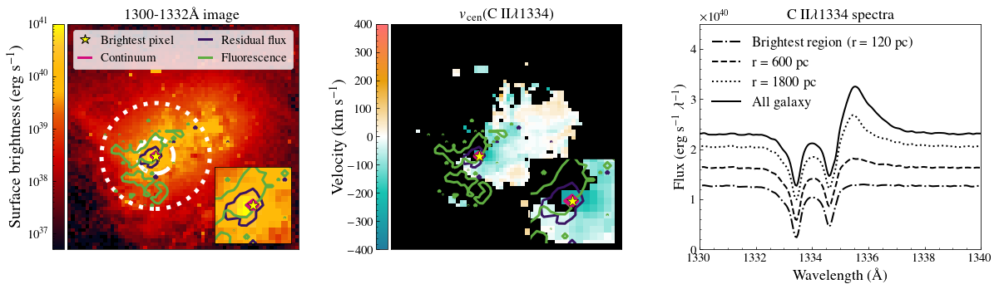

In [191]:
# #### plotting a spectrum


idir = 275
print(fesc[148-90,idir])
fig = plt.figure(figsize = (20,5))
gs = GridSpec(5, 26)
ax2 = plt.subplot(gs[:6, :7])
ax = plt.subplot(gs[:6, 9:16])
ax3 = plt.subplot(gs[:6, 18:26])

spec = np.sum(cubecII[idir,:,:,1:],axis=(0,1)) 
vcII  = (lcubecII[1:]/wcII1334-1)*c

idres = np.argmin(spec)  -6
idres2 = np.argmin(spec) +6

idflu = np.argmax(spec)-14
idflu2 =  np.argmax(spec)+14

# ax.set_xlim(-1000,2000)
imageall = np.sum(cubecII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubecII[idir,:,:,idflu+80:idflu2+80],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubecII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubecII[idir,:,:,idflu:idflu2],axis=(2))#/

cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)


im1 = ax2.imshow(imageall, norm=LogNorm(vmin=5e36,vmax=1e41), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')

cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]


num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
# cmap2 = matplotlib.cm.coolwarm
cmap2.set_bad('black',1.)
im2 = ax.imshow(v260cen, cmap=cmap2, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
          aspect = 'auto')
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = imagecont.copy()
pp[pp<aa] = 0

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_cont_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
spec_cont_out = np.sum(nsp,axis=(0,1))

axins = zoomed_inset_axes(ax2, 1.8, loc=4) # zoom = 6
axins.imshow(imageall, interpolation="nearest",
            norm=LogNorm(vmin=5e36,vmax=1e41), cmap=cmap)


axins.set_xlim(cy-6, cy+6)
axins.set_ylim(cx-6, cx+6)
axins.set_xticks([])
axins.set_yticks([])


axins2 = zoomed_inset_axes(ax, 2, loc=4) # zoom = 6
axins2.imshow(v260cen, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
             cmap=cmap2)


axins2.set_xlim(cy-6, cy+6)
axins2.set_ylim(cx-6, cx+6)
axins2.set_xticks([])
axins2.set_yticks([])


ax2.contour( pp, levels=[aa], colors='#D30C7B',  linewidths=6, zorder = 10)
axins.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=4, zorder = 10)
ax.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=6, zorder = 10)
axins2.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=4, zorder = 10)


########## ABS

dd = abs(imageabs.copy())#.copy() 
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
idx = np.linspace(0,len(cumdd)-1,len(cumdd))

gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = abs(imageabs).copy()
pp[pp<aa] = 0
aa2 = aa

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_abs_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_abs_out = np.sum(nsp,axis=(0,1))

ax2.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
axins.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
ax.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
axins2.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)


######## Emision

dd = (imageemi-imagecont).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi-imagecont).copy()
pp[pp<aa] = 0

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_fluo_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_fluo_out = np.sum(nsp,axis=(0,1))

print(np.nanmean(v260cen), np.nanmean(v260cen[pp>=aa]) )
print(np.nanmedian(v260cen), np.nanmedian(v260cen[pp>=aa]) )

CS = ax2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3, label = '')


labels = ['50% of fluorescent flux']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    
axins2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)

axins.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)
ax.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)

nsp3 = cubecII[idir,:,:,:].copy()
nsp3[((imageemi-imagecont))<dd[gidx]] = 0
# nsp3[nsp1 == 0] = 0

spec_emi_in = np.sum(nsp3[:,:,1:],axis=(0,1))

ax2.set_xticks([])
ax2.set_yticks([])
ax.set_xticks([])
ax.set_yticks([])

line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line1 = Line2D([0], [0], color='#D30C7B', linewidth=3)
line2 = Line2D([0], [0], color='#391463', linewidth=3)
line3 = Line2D([0], [0], color='#5FAD41', linewidth=3)

labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']
ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)


# ax.set_xlabel(r'Velocity (km s$^{-1}$)', fontsize = 18)
# ax.set_ylabel(r'Flux', fontsize = 18)

hduin  = fits.open('../Classy/J09264427/J0926+4427_SB99fit.fits')
data   = hduin[1].data
wave   = data['wave']
flux   = data['flux']
err    = data['err']

vsiIId = (wave/wcII1334-1)*c
cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 
    
fsiII    = flux[cutSiIIall]
esiII    = err[cutSiIIall]

vsiII    = vsiIId[cutSiIIall]
ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
axins2.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')






ax3.set_title('C II$\lambda$1334 spectra')
ax2.set_title('1300-1332\AA\ image')
ax.set_title(r'$v_{\rm cen}$(C II$\lambda$1334)')
ax3.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
ax3.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

divider = make_axes_locatable(ax)
cax2 = divider.append_axes('left', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('left')
cbar2.set_label('Velocity (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = -70



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))


aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax2.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax2.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 

ax3.plot(l_systemic[:],gaussian_filter(spec_cont_in[:], sigma = 1.5), color = 'k', linewidth = 2, label = 'Brightest region (r = 120 pc)',
        linestyle = '-.')
ax3.plot(l_systemic[:],gaussian_filter(spec_r5[1:], sigma = 1.5), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
ax3.plot(l_systemic[:],gaussian_filter(spec_r15[1:], sigma = 1.5), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
ax3.plot(l_systemic[:],gaussian_filter(spec, sigma = 1.5), color = 'k', linewidth = 2, label = 'All galaxy')
ax3.set_xlim(1330,1340)
ax3.legend(frameon = False, fontsize = 17, loc = 'upper left')
print(np.min(spec_cont_in)/np.median(spec_cont_in))
print(np.min(spec_r5)/np.median(spec_r5))
print(np.min(spec_r15)/np.median(spec_r15))
print(np.min(spec)/np.median(spec))

ax3.set_ylim(0, 4.5*1e40)
# plt.savefig('Plots/contourJ0926_CII.pdf', bbox_inches = 'tight')

### J0938

#### Si II

In [285]:
# #### plotting a spectrum

idir = 156#40
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
vcII   = (l_systemic[:]/wsiII1260 -1)*c

# ax.set_xlim(-1000,2000)
imageall = cubeSiII[idir,:,:,1:]#/ (imsize/nxy)**2 
v156min = np.zeros((64,64))
v156cen = np.zeros((64,64))
v156cen[:,:]=np.nan
EWabs156 = np.zeros((64,64))
EWemi156 = np.zeros((64,64))
for i in range(1,63):
    for j in range(1,63):
        spec =gaussian_filter( np.sum(imageall[i-1:i+1,j-1:j+1,:], axis = (0,1)),5)
        nmed = np.median(spec[vcII<=-1000])
        spec = spec/nmed
        valid = (vcII>=-300) & (vcII<=300)     
        modFlux = spec
#         print(np.sum(modFlux) >0)
        if(nmed > 1e35 and np.sum(modFlux) >0 ):

            V = vcII[valid][modFlux[valid] == np.min(modFlux[valid])][0]
            Fmin =  np.min(modFlux[valid][(vcII[valid]>=V-20) & (vcII[valid] <=V+20)])

            EWa, aa = measureEWabs(l_systemic, vcII, modFlux.copy(),
                                            np.zeros(len(valid)), -200, 200)
            print(EWa)
            EWe, aa = measureEWemi(l_systemic, vcII, modFlux.copy(),
                                            np.zeros(len(vcII)), 800, 1200)
            modFlux = 1-modFlux
            modFlux[modFlux<= 0] = 0
            vcen = vcII[valid][np.cumsum(modFlux[valid])>= 0.5*np.max(np.cumsum(modFlux[valid]))][0]
#             break
#             plt.plot(vcII,spec)
#             plt.ylim(0,5)
          #  if(EWa < -0.2):

            v156min[i][j] = V
            v156cen[i][j] = vcen
#                 if(vcen<-150):
#                     plt.figure(figsize = (6,6))
#                     plt.plot(vcII, spec)
#                     plt.axvline(-100)
#                     plt.axvline(100)
#                     plt.show()
                    
#                     print(nmed,EWa)
            EWabs156[i][j] = EWa
            
            EWemi156[i][j] = EWe  
#             print(Fmin, V, vcen)
        else:
            v156min[i][j] = np.nan
            v156cen[i][j] = np.nan
            

#             V    = vcII[valid][modFlux[valid] == np.min(modFlux[valid])][0]
#             Fmin =  np.min(modFlux[valid][(vcII[valid]>=V-20) & (vcII[valid] <=V+20)])
#             EWa, aa = measureEWall(l_systemic[valid], vcII[valid], modFlux[valid].copy(),
#                                             np.zeros(len(valid)), -800, 300)
#             print(EWa)
#             EWe, aa = measureEWemi(l_systemic, vcII, modFlux.copy(),
#                                             np.zeros(len(vcII)), 800, 1200)
#             modFlux = 1-modFlux
#             modFlux[modFlux<= 0] = 0
#             vcen = vcII[valid][np.cumsum(modFlux[valid])>= 0.5*np.max(np.cumsum(modFlux[valid]))][0]
# #             print(vcen, Fmin, EWa, np.std(spec[vcII<-800]))

# #             break
# #             plt.plot(vcII,spec)
# #             plt.ylim(0,5)
#             if(EWa < -0.1):
#                 v260min[i][j] = V
#                 v260cen[i][j] = vcen
      

/tmp/ipykernel_5679/2290257979.py:18: RuntimeWarning: divide by zero encountered in true_divide
  spec = spec/nmed
/tmp/ipykernel_5679/2290257979.py:18: RuntimeWarning: invalid value encountered in true_divide
  spec = spec/nmed


-0.022581208002560266
-0.8278269689294404
-0.9161296357704886
-0.5092533331913025
-0.15688923860784967
-0.42338433021189087
-0.34683254434929983
-0.12511577305330396
-0.035058128649040635
-0.1572051435126814
0.08220588235293469
0.08220588235293469
0.08220588235293469
-0.16686686204672882
-0.6612427515632574
-0.6620058785016196
-0.588852009029757
0.066223050939411
0.07139891524489539
0.08220588235293469
0.08220588235293469
-0.07993090012467555
-0.11098262242683288
-0.07312294052338976
-0.3499593018351311
-0.1692005292027042
-0.803902939786947
-0.3858028291228413
-0.5743364918986287
-1.2384303045454248
-0.36229144873189933
-0.4436974860120011
-0.41753175969600514
-0.36841533518218533
-0.37153331744970614
-0.2817940653616622
-0.026727228814685557
0.08220588235293469
0.08220588235293469
-1.0102576170013124
-0.7886713145794567
-0.14993080581908755
-0.6766289215502679
-0.18500523005349784
-0.7744606150905677
-0.4113197018001975
-0.15915657872717745
-0.1464433337141392
-0.0551407419974256
-0.

0.03431233585596606
-0.07569199057871485
-0.4771923737543097
-0.18521980903405302
-0.09183615769296619
-0.3285539003848682
-0.2890534204493199
-0.284292180007649
0.03195373652436021
-0.045853878120539114
-0.03817548789979232
-0.1952557863350604
-0.17706458273054712
0.02354767761994392
-0.42760327201005927
-0.9747265022955338
-0.9428346792505015
-0.9889059538318571
-0.8676508472612213
-0.6386882224251434
-0.42661399145895895
-0.13668098651157182
-0.24137625826832632
-0.347245125927829
-0.020239531357770645
-0.2800175543921095
-0.377776910955344
-0.22281474005798194
-0.14086148986723077
-0.09883681591627068
-0.002097959604694594
-0.5016564925370429
-0.5830062798904224
-0.188151704896972
-0.006658640286930671
0.06717447219815398
0.08220588235293469
0.06995332189466899
0.02920644771087461
0.08220588235293469
-0.7567925161037998
-0.4852518801457326
-0.03401429104576175
0.08220588235293469
0.07758708405494667
-0.08872034274730412
-0.5286775862142301
-0.750948869957781
-0.0994000732090697
-0.

-0.29593981319943613
-0.37303769464841013
-0.4306916648815907
-0.6290076084149525
-0.6577816580065047
-0.25559175544052304
-0.1813142518280199
-0.64801976663092
-0.6155846890918449
-0.6718148680124004
-0.7472129786507957
-0.7967450377561835
-0.6362070571931653
-0.50563021881536
-0.487876786040669
-0.501791314246583
-1.1831608963172615
-1.3278800062414324
-1.3772045670179396
-1.3432234054248977
-1.3165848355177454
-1.2812651461831317
-1.2572756206401157
-1.186405543738514
-0.88391701672924
-0.41102411334167965
0.009584782144593618
0.058089419558986735
0.027019927776428615
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08128810214414427
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
-0.09351948520973524
-0.08804871222402447
-0.2978615894276419
-0.6502791996715056


-0.8183180715226243
-0.821833436259984
-0.8372285351256582
-0.7536568447873074
-0.9419487936713482
-0.9348988260800289
-0.9205441431172574
-0.9219945493577674
-0.9155398414394763
-0.9494432866207395
-1.0932115406751948
-1.1357720926400376
-1.113764821079608
-1.0174062146711542
-0.9719948912693273
-0.7005101477178712
-0.5556937910850067
-0.6740471181291351
-0.566640476496183
-0.2794661611671801
0.046632034378741326
-0.02561170794332174
0.021883395164765947
0.056617144357781896
0.045856957919173935
0.08220588235293469
0.005961909024648288
0.021952414476127523
0.08220588235293469
0.08220588235293469
-0.5645243831135933
-0.9236146817583912
-0.9773439988040006
0.011497003989481397
0.008219696349024386
-0.6200954176534454
-0.07599362643543882
0.016864541311138688
-0.22377363096314362
-0.11270800220946782
0.0635471734956821
-0.0066258611432638845
-0.44833170330104943
-0.1708224749325397
0.08220588235293469
-0.11829137520597983
-0.7546083840669965
-0.22704281497553067
-0.15663185865333015
-0.4

-0.3441585323806655
-0.19025706861613323
-0.10735089853369069
-0.33951398879475997
-0.2460073447680241
-0.19226024417808485
-0.5036362994249682
-0.06407121115653824
0.08220588235293469
-0.011436422494803014
-0.1812415823303822
-0.0671195289582841
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.03857430859211135
-0.08597542768656469
0.08220588235293469
0.08220588235293469
0.08220588235293469
0.08220588235293469
-0.08441623877903644
0.08220588235293469
-0.6755472359768847
0.08220588235293469
-0.05604187519079171
-0.5118569745913345
-0.13553369369204793
-0.04427518478172779
-0.24089952399613396
0.08220588235293469
-0.058883329809800086
-0.07220187809799807
-0.09303935745581136
-0.5336686964889674
-0.15696668811434583
-0.017567453528590772
-0.1851253333804366
-0.5498607121943904
-0.6200645291629284
-1.0720717805293956
-1.1518306610789713
-0.6957474581448566
-0.43100384709379225
-0.1247593782449582
-0.2019360962610806

199.0
168.0
14
-47.89221707960438 -15.235437931022517
-5.5919247370377425 -15.61898675121475
0.0007777784333138258
0.13781304987368112


/tmp/ipykernel_1155799/927117470.py:48: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/927117470.py:48: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/927117470.py:149: UserWarning: The following kwargs were not used by contour: 'label'
  ax2.contour( pp, levels=[aa], colors='w', alpha=0.3, linewidths=6, label = '', zorder = 14)
/tmp/ipykernel_1155799/927117470.py:185: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[aa], colors='w', alpha=0.2, linewidths=6, label = '')
/tmp/ipykernel_1155799/927117470.py:190: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3, label = '')
/tmp/ipykernel_1155799/927117470.py:222: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contourf( image

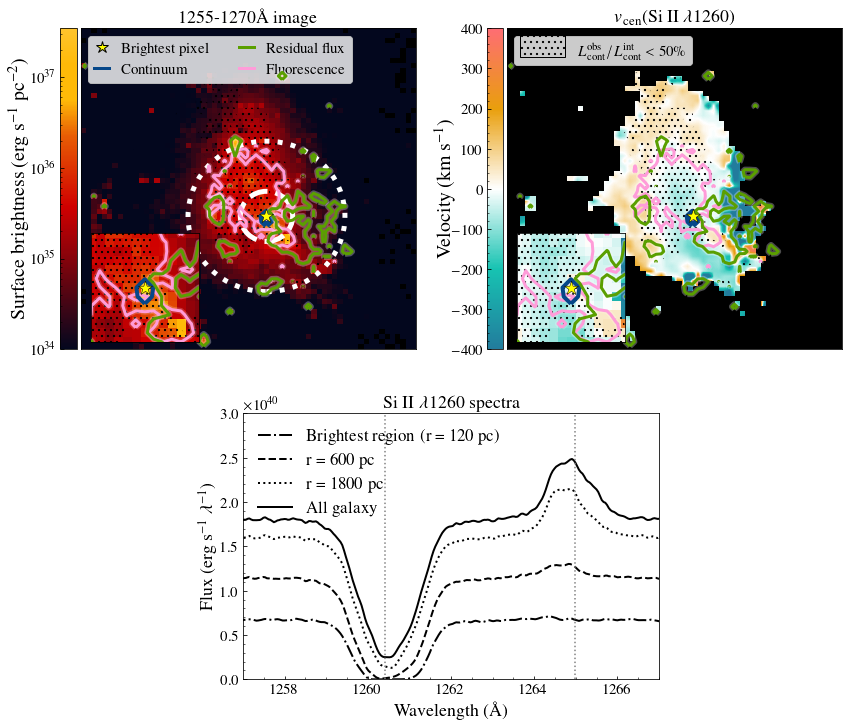

In [671]:
# #### plotting a spectrum
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
idir = 156#40
# print(fesc[148-90,idir])
# print(np.argmin(fesc[148-90]))
# nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII2/',300)
fig = plt.figure(figsize = (14,14))
gs = GridSpec(14, 13)
ax2 = plt.subplot(gs[:6, :6])
ax = plt.subplot(gs[:6, 7:])
ax3 = plt.subplot(gs[7:12, 3:-3])


cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#5A9F00'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)


spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) # the first wavelength pixel bugs, so I start at 1

vcII  = (lcubeSiII[1:]/wsiII1260-1)*c

idres = np.argmin(spec) -5# 120
idres2 = np.argmin(spec) +5

idflu = np.argmax(spec)
idflu2 =  np.argmax(spec)+10

# ax.set_xlim(-1000,2000)
imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubeSiII[idir,:,:,idflu+70:idflu2+70],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/
imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imageratio = imagecontAtt/imagecontInt
imageratio2 = imageratio.copy()
imageratio2[imageratio2<0.5] = 0
dratio = imageratio2.copy()
dratio[imageratio2>=0.5] =1
dratio = 1-dratio
print(np.nansum(dratio))
# ax2.contour( imageratio, levels=[0.5], colors='k', hatches=['.'],alpha=1, linewidths=3)



cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)


im1 = ax2.imshow(imageall/(120*120), norm=LogNorm(vmin=10**34,vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')

cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]

num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
# cmap2 = matplotlib.cm.coolwarm
cmap2.set_bad('black',1.)
im2 = ax.imshow(v156cen, cmap=cmap2, interpolation="bilinear",origin = 'lower', vmin = -400, vmax = 400,
          aspect = 'auto')
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = imagecont.copy()
pp[pp<aa] = 0

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_cont_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
spec_cont_out = np.sum(nsp,axis=(0,1))

axins = zoomed_inset_axes(ax2, 1.8, loc=3) # zoom = 6
axins.imshow(imageall/(120*120), interpolation="nearest",
            norm=LogNorm(vmin=10**34,vmax=5e41/(120*120)), cmap=cmap)


axins.set_xlim(cy-6, cy+6)
axins.set_ylim(cx-6, cx+6)
axins.set_xticks([])
axins.set_yticks([])


axins2 = zoomed_inset_axes(ax, 1.8, loc=3) # zoom = 6
axins2.imshow(v156cen, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
             cmap=cmap2)


axins2.set_xlim(cy-6, cy+6)
axins2.set_ylim(cx-6, cx+6)
axins2.set_xticks([])
axins2.set_yticks([])


ax2.contour( pp, levels=[aa], colors=contCol,  linewidths=6, zorder = 10)
axins.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=4, zorder = 10)
ax.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=6, zorder = 10)
axins2.contour( pp, levels=[dd[gidx]], colors=contCol, alpha=1, linewidths=4, zorder = 10)


########## ABS

dd = abs(imageabs.copy())#.copy() 
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
idx = np.linspace(0,len(cumdd)-1,len(cumdd))

gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = abs(imageabs).copy()
pp[pp<aa] = 0
aa2 = aa

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
dtest = nsp.copy()
dtest[pp>=aa] =1
print(np.nansum(dtest[:,:,0]))
print(np.nansum((np.logical_and(dratio,dtest[:,:,0]))))
spec_abs_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_abs_out = np.sum(nsp,axis=(0,1))

ax2.contour( pp, levels=[aa], colors='w', alpha=0.3, linewidths=6, label = '', zorder = 14)
axins2.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6,)
axins.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6,)
ax.contour( pp, levels=[aa], colors='w',  alpha=0.3, linewidths=6)

ax2.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
ax.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)
axins2.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=3, zorder = 14)



######## Emision

dd = (imageemi-imagecont).copy()
dd[dd<0] = 0
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi-imagecont).copy()
pp[pp<aa] = 0

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_fluo_in = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_fluo_out = np.sum(nsp,axis=(0,1))
print(np.nanmean(v156cen), np.nanmean(v156cen[pp>=aa]) )
print(np.nanmedian(v156cen), np.nanmedian(v156cen[pp>=aa]) )

CS = ax2.contour( pp, levels=[aa], colors='w', alpha=0.2, linewidths=6, label = '')
axins2.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6,)
axins.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6,)
ax.contour( pp, levels=[aa], colors='w',  alpha=0.2, linewidths=6)

CS = ax2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3, label = '')
axins2.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)
axins.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)
ax.contour( pp, levels=[aa], colors=fluCol, alpha=1, linewidths=3)

labels = ['50% of fluorescent flux']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    

nsp3 = cubeSiII[idir,:,:,:].copy()
nsp3[((imageemi-imagecont))<dd[gidx]] = 0
# nsp3[nsp1 == 0] = 0

spec_emi_in = np.sum(nsp3[:,:,1:],axis=(0,1))

ax2.set_xticks([])
ax2.set_yticks([])
ax.set_xticks([])
ax.set_yticks([])

line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line1 = Line2D([0], [0], color=contCol, linewidth=3)
line2 = Line2D([0], [0], color=resCol, linewidth=3)
line3 = Line2D([0], [0], color=fluCol, linewidth=3)

labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']

ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)
          
axins2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
axins.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')

line4 = patch = patches.Patch(facecolor='none', hatch="..", edgecolor="k", alpha = 1)   

leg = ax.legend([line4],[r'$L_{\rm cont}^{\rm obs} / L_{\rm cont}^{\rm int} < 50\%$'],loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 3)
for patch in leg.get_patches():
    patch.set_height(22)
    patch.set_y(-2)
# ax.set_xlabel(r'Velocity (km s$^{-1}$)', fontsize = 18)
# ax.set_ylabel(r'Flux', fontsize = 18)

hduin  = fits.open('../Classy/J09264427/J0926+4427_SB99fit.fits')
data   = hduin[1].data
wave   = data['wave']
flux   = data['flux']
err    = data['err']

vsiIId = (wave/wsiII1260-1)*c
cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 
    
fsiII    = flux[cutSiIIall]
esiII    = err[cutSiIIall]
vsiII    = vsiIId[cutSiIIall]
ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
axins2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')


# ax3.plot(vcII-80,gaussian_filter(spec, sigma = 1.5), color = 'k', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_cont_out, sigma = 1.5), color = 'purple', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_fluo_out, sigma = 1.5), color = 'mediumseagreen', linewidth = 2, label = '')
# ax3.plot(vcII-80,gaussian_filter(spec_abs_out, sigma = 1.5), color = cnoFS, linewidth = 2, label = '')
# ax3.set_xlim(-1000,1450)


# ymin, ymax = ax.get_ylim()
# ax.set_ylim(0.2e40,ymax)
# ax3.set_ylim(0.2e40,ymax)
# ax.legend(frameon=False, fontsize = 18)
# ax.set_ylim(1.2e40,ymax)ax.plot(vcII-80,gaussian_filter(spec_cont_in, sigma = 1.5), color = 'k', linewidth = 2, label = '')
# ax3.set_yticks([])
# ax3.set_xticklabels(['','-500', '0', '500','1000','1500'])
# ax.set_title('Within contours')
ax3.set_title('Si II $\lambda$1260 spectra')
ax2.set_title('1255-1270\AA\ image')
ax.set_title(r'$v_{\rm cen}$(Si II $\lambda$1260)')
ax3.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
ax3.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

divider = make_axes_locatable(ax)
cax2 = divider.append_axes('left', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('left')
cbar2.set_label('Velocity (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = -70



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))


aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubeSiII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax2.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax2.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

ax3.plot(l_systemic[:],gaussian_filter(spec_center[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'Brightest region (r = 120 pc)',
        linestyle = '-.')
ax3.plot(l_systemic[:],gaussian_filter(spec_r5[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
ax3.plot(l_systemic[:],gaussian_filter(spec_r15[1:], sigma = 1.), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
ax3.plot(l_systemic[:],gaussian_filter(spec, sigma = 1.), color = 'k', linewidth = 2, label = 'All galaxy')
ax3.set_xlim(1257,1267)
ax3.legend(frameon = False, fontsize = 17, loc  ='upper left', ncol = 1)
print(np.min(spec_cont_in)/np.median(spec_cont_in))
print(np.min(spec)/np.median(spec))
ax3.set_ylim(0, 3*1e40)
# ax3.axvline(l_systemic[idres])
# ax3.axvline(l_systemic[idres2])

# ax3.axvline(l_systemic[idflu])
# ax3.axvline(l_systemic[idflu2])

# ax3.axvline(l_systemic[idflu+70])
# ax3.axvline(l_systemic[idflu2+70])
# ax3.axvline(l_systemic[np.argmin(spec)])
# ax.contourf( 1/imageratio, levels=[1.5,100000], hatches=['..', ''],  alpha=0.0, origin='lower')

ax3.axvline(wsiII1260, linestyle = ':', c='gray')
ax3.axvline(1264.99, linestyle = ':', c='gray')
plt.savefig('Plots/contourJ0938_SiIId.pdf', bbox_inches = 'tight')

/tmp/ipykernel_5679/2272387338.py:74: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/2272387338.py:74: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_5679/2272387338.py:354: UserWarning: The following kwargs were not used by contour: 'edgecolor'
  cs=ax1.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', colors='none', edgecolor = 'red')
/tmp/ipykernel_5679/2272387338.py:356: UserWarning: The following kwargs were not used by contour: 'label'
  ax3.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
/tmp/ipykernel_5679/2272387338.py:357: UserWarning: The following kwargs were not used by contour: 'label'
  ax4.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
/tmp/ipykernel_5679/2272387338.py:359: UserW

3.0548471101880456e+39
199.0
1260.3543329601675


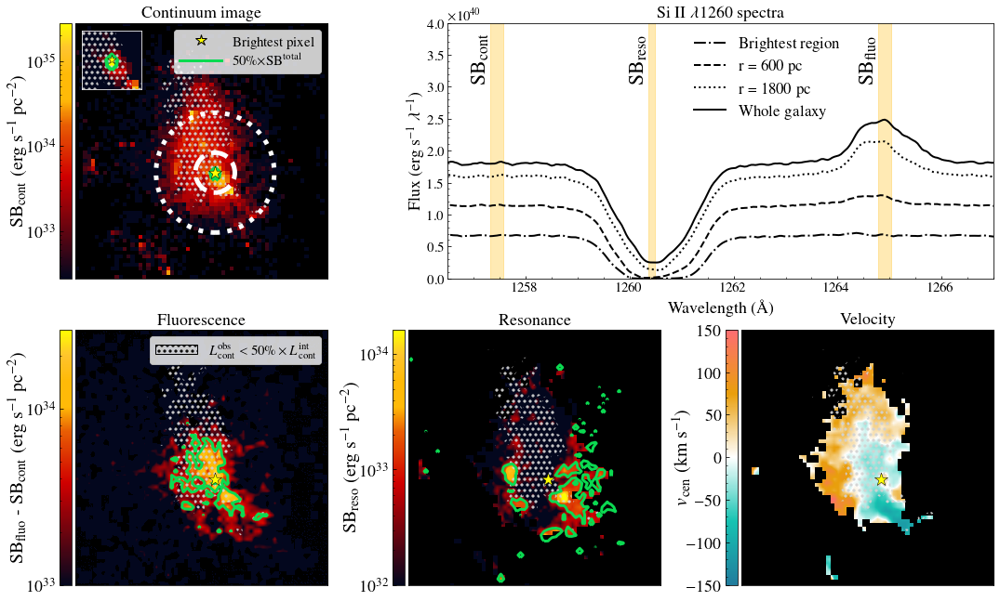

In [310]:
# #### plotting a spectrum
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D", "#FFFF00"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#0BDA51'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)

# num_colors = len(cb_colors)
cmap3 = LinearSegmentedColormap.from_list('test3',cb_colors[::-1])

cmap3.set_bad('black',1.)

idir = 156
spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 

vcII  = (l_systemic/wsiII1260-1)*c


# fig, ((ax1, ax4), (ax2, ax3)) = plt.subplots(2,2,figsize = (14,14))
fig = plt.figure(figsize = (18,12))
gs = GridSpec(14, 17)
ax1 = plt.subplot(gs[:6, :5])
axspec = plt.subplot(gs[:6, 7:])
ax4 = plt.subplot(gs[7:-1, :5])
ax3 = plt.subplot(gs[7:-1, 6:11])
ax2 = plt.subplot(gs[7:-1, 12:])
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax3.set_xticks([])
ax3.set_yticks([])
ax4.set_xticks([])
ax4.set_yticks([])

idres = np.argmin(spec) # 120
idres2 = np.argmin(spec) +4


idflu = np.argmax(spec)-3
idflu2 =  np.argmax(spec)+3

# ax.set_xlim(-1000,2000)
imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubeSiII[idir,:,:,15-3:15+3],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/
imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 


cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)
# imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
# imagecont2[imagecont2 < 2.e38] = 0
    
# print(l_systemic[1:len(idres[0])+1])
# imageemi  = np.sum(cubeSiII[idir,:,:,idflu[0][0]:idflu[0][-1]],axis=(2))#/
# imagecontAtt = np.sum(cubecII[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
# imagecontInt = np.sum(cubecIIint[idir,:,:,10:20],axis=(2))#/ (imsize/nxy)**2 
imageratio = imagecontAtt/imagecontInt
imageratio2 = imageratio.copy()
imageratio2[imageratio2<0.5] = 0




    
im1 = ax1.imshow(imagecont/(120*120), norm=LogNorm(vmin=np.max(imagecont)/(120*120)*0.0001,
                                                   vmax=np.max(imagecont/(120*120))/10), cmap=cmap, interpolation="nearest",
                 origin = 'lower',
          aspect = 'auto')

divider = make_axes_locatable(ax1)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB$_{\rm cont}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]
print(aa)
pp = imagecont.copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_bright = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax1.contour( pp, levels=[aa], colors=resCol,  linewidths=6, zorder = 10)
axins = zoomed_inset_axes(ax1, 1.5, loc=2) # zoom = 6
axins.imshow(imagecont/(120*120), interpolation="nearest",
            norm=LogNorm(vmin=1e34,vmax=1e40/(120*120)), cmap=cmap)
axins.set_xlim(cy-5, cy+5)
axins.set_ylim(cx-5, cx+5)
axins.set_xticks([])
axins.set_yticks([])
axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
axins.scatter(cy,cx, s = 100, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
for spine in axins.spines.values():
    spine.set_edgecolor('white')
    
ax1.set_title(r'Continuum image')



#### EMI PLOt


emi = imageemi-imagecont
# emi[imagecont<1e37] = np.nan

# emi[emi<0] = 0
# emi[np.isnan(emi)] = 0
im4 = ax4.imshow(emi/(120*120),  cmap=cmap, interpolation="bilinear",origin = 'lower',
          aspect = 'auto',norm=LogNorm(vmin=1e33,
                                                   vmax=np.max(imagecont/(120*120))/100),)

divider = make_axes_locatable(ax4)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im4, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'SB$_{\rm fluo}$ -  SB$_{\rm cont}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
dd = (imageemi-imagecont).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi-imagecont).copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_emi = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax4.contour( pp, levels=[aa], colors=resCol,  linewidths=3, zorder = 10)
# axins = zoomed_inset_axes(ax4, 1.3, loc=2) # zoom = 6
# axins.imshow(emi/(120*120), interpolation="nearest",
#             norm=LogNorm(vmin=1e33,vmax=5e39/(120*120)), cmap=cmap)
# axins.set_xlim(cy-6, cy+6)
# axins.set_ylim(cx-6, cx+6)
# axins.set_xticks([])
# axins.set_yticks([])
# axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
# axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax4.set_title(r'Fluorescence')


######


dratio = imageratio2.copy()
dratio[imageratio2>=0.5] =1
dratio = 1-dratio
print(np.nansum(dratio))


cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]
num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
cmap2.set_bad('black',1.)
v = v156cen.copy()
v[imagecont<1e36] = np.nan
v[(v>150) | (v<-150)] = np.nan
v[:20, :20] = np.nan

# from astropy.convolution import Gaussian2DKernel
# from astropy.convolution import convolve
# kernel = Gaussian2DKernel(x_stddev=1)
# astropy_conv = convolve(v, kernel)

im2 = ax2.imshow(v, cmap=cmap2, interpolation="bilinear",origin = 'lower', vmin = -150, vmax = 150,
          aspect = 'auto')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im2, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label(r'$v_{\rm cen}$ (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
ax2.set_title(r'Velocity')

### ABSOPRTION IMAGES
# idres = np.argmin(spec) 
imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
# imageabs[imagecont<1.e36] = 0
abst = imageabs.copy()#(imagecont-imageabs)/imagecont#imageabs #-imagecont#-imagecontEWabs156#
abst[imagecont<1e36] = np.nan

# abst[imagecont<1e34*(120*120)] = np.nan
# abst[]
im3 = ax3.imshow(abst/(120*120),  cmap=cmap, interpolation="bilinear",origin = 'lower',
          aspect = 'auto',norm=LogNorm(vmin=1e32,
 vmax=np.nanmax(abst/(120*120))/2))#norm=LogNorm(vmin=9e33,vmax=5e39/(120*120))))#, norm=LogNorm(vmin=np.max(imagecont)/(120*120)*0.0005,
                          #                         vmax=np.max(imagecont/(120*120))/10))#norm=LogNorm(vmin=9e33,vmax=5e39/(120*120)))
divider = make_axes_locatable(ax3)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im3, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
# cbar.set_ticks([-1,-.5,0,0.5,1])
cbar.set_label(r'SB$_{\rm reso}$ (erg s$^{-1}$ pc$^{-2}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.tick_params(labelsize=18)
# idres = np.argmin(spec) 
# imageabs  = np.sum(cubeSiII[idir,:,:,idres-3:idres+3],axis=(2))#/ (imsize/nxy)**2 
# imageabs[imagecont<1.e36] = 0

dd = (imageabs).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageabs).copy()
pp[pp<aa] = 0
nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_abs = np.sum(nsp,axis=(0,1))

nsp = cubeSiII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
ax3.contour( pp, levels=[aa], colors=resCol,  linewidths=3, zorder = 10)
# axins = zoomed_inset_axes(ax3, 1.3, loc=2) # zoom = 6
# axins.imshow(emi/(120*120), interpolation="nearest",
#             norm=LogNorm(vmin=1e34,vmax=5e39/(120*120)), cmap=cmap)
# axins.set_xlim(cy-6, cy+6)
# axins.set_ylim(cx-6, cx+6)
# axins.set_xticks([])
# axins.set_yticks([])
# axins.contour( pp, levels=[dd[gidx]], colors=resCol, alpha=1, linewidths=4, zorder = 10)
# axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax3.set_title(r'Resonance')




ax1.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax3.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax4.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask
fimageori = cubeSiII[idir,:,:,1:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))
spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax1.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax1.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
# l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 



line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line2 = Line2D([0], [0], color=resCol, linewidth=3)
# line3 = Line2D([0], [0], color=fluCol, linewidth=3)
line4 = patch = patches.Patch(facecolor='none', hatch="..", edgecolor="k", alpha = 1)   
leg = ax1.legend([line0, line2],
                 [r'Brightest pixel',r'$50\%$$\times$SB$^{\rm total}$'],
                 fontsize = 15, ncol = 1, handlelength = 3)
leg = ax4.legend([line4],
                 [r'$L_{\rm cont}^{\rm obs} <  50\% \times L_{\rm cont}^{\rm int}$'],
                 fontsize = 15, ncol = 1, handlelength = 3)
# labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']
# ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)

axspec.plot(l_systemic[1:],gaussian_filter(spec_center[1:], sigma = 1.), color = 'k', linewidth = 2, 
            label = 'Brightest region ',
        linestyle = '-.')
axspec.plot(l_systemic[1:],gaussian_filter(spec_r5[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
axspec.plot(l_systemic[1:],gaussian_filter(spec_r15[1:], sigma = 1.), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
axspec.plot(l_systemic[1:],gaussian_filter(spec[1:], sigma = 1.), color = 'k', linewidth = 2, label = 'Whole galaxy')
axspec.set_xlim(1256.5,1267)
axspec.legend(frameon = False, fontsize = 17, loc  =(0.44,0.6), ncol = 1)
axspec.set_ylim(0, 3*1e40)

print(l_systemic[idres])
# axspec.vlines(l_systemic[int(idres)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0 )
# axspec.vlines(l_systemic[int(idres2)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0)
axspec.fill_betweenx([ 0,5*1e40],l_systemic[int(idres)],l_systemic[int(idres2)-1],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

# axspec.vlines(l_systemic[int(idflu)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0 )
# axspec.vlines(l_systemic[int(idflu2)],1.2*1e40, 2.5*1e40, color= 'k', zorder = 0)
axspec.fill_betweenx([0, 5*1e40],l_systemic[int(idflu)],l_systemic[int(idflu2)],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

axspec.fill_betweenx([0, 5*1e40],l_systemic[73],l_systemic[79],
                     color= '#FFBA08', alpha = 0.3, zorder = 0)

axspec.text(l_systemic[64], 3.1e40, r'SB$_{\rm cont}$', rotation = 90, fontsize = 22)
axspec.text(l_systemic[int(idres)-9], 3.1e40, r'SB$_{\rm reso}$', rotation = 90, fontsize = 22)
axspec.text(l_systemic[int(idflu)-9], 3.1e40, r'SB$_{\rm fluo}$', rotation = 90, fontsize = 22)

# axspec.plot(vcII[1:], spec_bright)
# axspec.plot(vcII[1:], spec_emi)
# axspec.plot(vcII[1:], spec_abs)
plt.rcParams['hatch.linewidth'] = 2
plt.rcParams['hatch.color'] = '#D3D3D3'
cs=ax1.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', colors='none', edgecolor = 'red')
ax2.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower')
ax3.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
ax4.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')
# plt.rcParams.update({'hatch.color': 'c'})
axins.contourf( imageratio, levels=[0,0.75], hatches=['..', ''],  alpha=0.0, origin='lower', label='A blou blou')

axspec.set_title('Si II $\lambda$1260 spectra')
axspec.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
axspec.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

axspec.set_ylim(0, 4*1e40)
# axspec.axvline(wsiII1260, linestyle = ':', c='gray')
# axspec.axvline(1264.99, linestyle = ':', c='gray')
plt.savefig('Plots/contourJ0938_SiIIV3.pdf', bbox_inches = 'tight')

#### C II

In [328]:
# #### plotting a spectrum

idir = 156
l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 
vcII   = (l_systemic[:]/wcII1334 -1)*c

# ax.set_xlim(-1000,2000)
imageall = cubecII[idir,:,:,1:]#/ (imsize/nxy)**2 
v156min = np.zeros((64,64))
v156cen = np.zeros((64,64))
v156cen[:,:]=np.nan
for i in range(1,63):
    for j in range(1,63):
        spec = np.sum(imageall[i-1:i+1,j-1:j+1,:], axis = (0,1))
        nmed = np.median(spec)
        spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])
        valid = (vcII>=-800) & (vcII<=500)     
        modFlux = gaussian_filter(spec[valid], sigma = 1)
#         print(np.sum(modFlux) >0)
        if(nmed > 1e36 and np.sum(modFlux) >0):

            V = vcII[valid][modFlux == np.min(modFlux)][0]
            Fmin =  np.min(modFlux[(vcII[valid]>=V-20) & (vcII[valid] <=V+20)])
            modFlux = 1-modFlux
            modFlux[modFlux<= 0] = 0
            vcen = vcII[valid][np.cumsum(modFlux)>= 0.5*np.max(np.cumsum(modFlux))][0]
#             break
#             plt.plot(vcII,spec)
#             plt.ylim(0,5)
            v156min[i][j] = V
            v156cen[i][j] = vcen

#             print(Fmin, V, vcen)
        else:
            v156min[i][j] = np.nan
            v156cen[i][j] = np.nan
            
        

/tmp/ipykernel_2749183/2681916757.py:16: RuntimeWarning: divide by zero encountered in true_divide
  spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])
/tmp/ipykernel_2749183/2681916757.py:16: RuntimeWarning: invalid value encountered in true_divide
  spec = spec/np.nanmedian(spec[(vcII>=1500) & (vcII<=2000)     ])


0.0081069
214
173
-124.11667409831648 -188.52955640516114
-4.456497888180362 -54.26253236639942
0.008858527601675536
0.180146572774484


/tmp/ipykernel_2749183/2657337022.py:151: UserWarning: The following kwargs were not used by contour: 'label'
  CS = ax2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3, label = '')


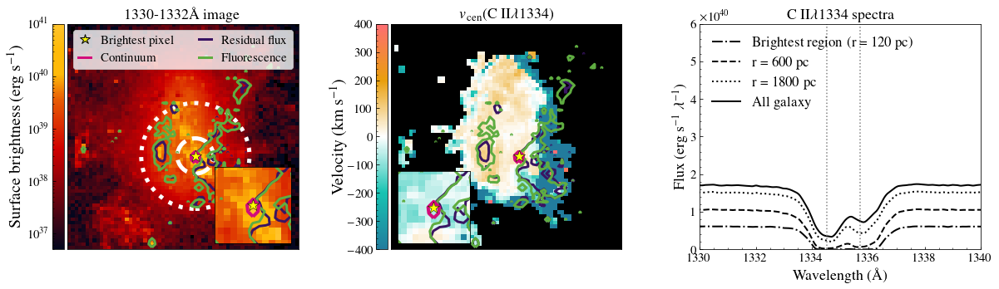

In [334]:
# #### plotting a spectrum
# idir = 210

print(fesc[148-90,idir])
print(np.argmin(fesc[148-90]))
# nxy,imsize,lcubeSiII,cubeSiII = read_cube('./data_cubes_output_148/SiII2/',300)
fig = plt.figure(figsize = (20,5))
gs = GridSpec(5, 26)
ax2 = plt.subplot(gs[:6, :7])
ax = plt.subplot(gs[:6, 9:16])
ax3 = plt.subplot(gs[:6, 18:26])



spec = np.sum(cubecII[idir,:,:,1:],axis=(0,1)) # the first wavelength pixel bugs, so I start at 1
l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 

vcII  = (l_systemic/wcII1334-1)*c

idres  = np.argmin(spec) -5# 120
idres2 = np.argmin(spec) +5

idflu = np.where(l_systemic > 1335.71)# np.argmax(spec)-10
idflu = idflu[0][0]-3
print(idflu)
idflu2 =  idflu+6

# ax.set_xlim(-1000,2000)
imageall = np.sum(cubecII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 

imagecont = np.sum(cubecII[idir,:,:,idflu-130:idflu2-130],axis=(2))#/ (imsize/nxy)**2 
imageabs  = np.sum(cubecII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
imageemi  = np.sum(cubecII[idir,:,:,idflu:idflu2],axis=(2))#/

cx,cy = np.where(imagecont == np.max(imagecont))
cx = int(cx)
cy = int(cy)


im1 = ax2.imshow(imageall, norm=LogNorm(vmin=5e36,vmax=1e41), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')

cb_colors = ["#227C9D", "#17C3B2", "#FFFFFF", "#E99F0C", "#FE6D73"]

num_colors = len(cb_colors)
cmap2 = LinearSegmentedColormap.from_list('testcool',cb_colors)
# cmap2 = matplotlib.cm.coolwarm
cmap2.set_bad('black',1.)
im2 = ax.imshow(v156cen, cmap=cmap2, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
          aspect = 'auto')
dd = imagecont.copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

lvl = 0.5
idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = imagecont.copy()
pp[pp<aa] = 0

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<dd[gidx]] = 0
spec_cont_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=dd[gidx]] = 0
spec_cont_out = np.sum(nsp,axis=(0,1))

axins = zoomed_inset_axes(ax2, 1.8, loc=4) # zoom = 6
axins.imshow(imageall, interpolation="nearest",
            norm=LogNorm(vmin=5e36,vmax=1e41), cmap=cmap)


axins.set_xlim(cy-6, cy+6)
axins.set_ylim(cx-6, cx+6)
axins.set_xticks([])
axins.set_yticks([])


axins2 = zoomed_inset_axes(ax, 1.7, loc=3) # zoom = 6
axins2.imshow(v260cen, interpolation="nearest",origin = 'lower', vmin = -400, vmax = 400,
             cmap=cmap2)


axins2.set_xlim(cy-6, cy+6)
axins2.set_ylim(cx-6, cx+6)
axins2.set_xticks([])
axins2.set_yticks([])


ax2.contour( pp, levels=[aa], colors='#D30C7B',  linewidths=6, zorder = 10)
axins.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=4, zorder = 10)
ax.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=6, zorder = 10)
axins2.contour( pp, levels=[dd[gidx]], colors='#D30C7B', alpha=1, linewidths=4, zorder = 10)


########## ABS

dd = abs(imageabs.copy())#.copy() 
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)
idx = np.linspace(0,len(cumdd)-1,len(cumdd))

gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = abs(imageabs).copy()
pp[pp<aa] = 0
aa2 = aa

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_abs_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_abs_out = np.sum(nsp,axis=(0,1))

ax2.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
axins.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
ax.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)
axins2.contour( pp, levels=[dd[gidx]], colors='#391463', alpha=1, linewidths=3)


######## Emision

dd = (imageemi).copy()
dd = np.sort(dd.flatten())[::-1]
cumdd = np.cumsum(dd)

idx = np.linspace(0,len(cumdd)-1,len(cumdd))
gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
aa = dd[gidx]

pp = (imageemi).copy()
pp[pp<aa] = 0

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp<aa] = 0
spec_fluo_in = np.sum(nsp,axis=(0,1))

nsp = cubecII[idir,:,:,1:].copy()
nsp[pp>=aa] = 0
spec_fluo_out = np.sum(nsp,axis=(0,1))

print(np.nanmean(v156cen), np.nanmean(v156cen[pp>=aa]) )
print(np.nanmedian(v156cen), np.nanmedian(v156cen[pp>=aa]) )

CS = ax2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3, label = '')


labels = ['50% of fluorescent flux']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    
axins2.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)

axins.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)
ax.contour( pp, levels=[dd[gidx]], colors='#5FAD41', alpha=1, linewidths=3)

nsp3 = cubecII[idir,:,:,:].copy()
nsp3[((imageemi-imagecont))<dd[gidx]] = 0
# nsp3[nsp1 == 0] = 0

spec_emi_in = np.sum(nsp3[:,:,1:],axis=(0,1))

ax2.set_xticks([])
ax2.set_yticks([])
ax.set_xticks([])
ax.set_yticks([])

line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line1 = Line2D([0], [0], color='#D30C7B', linewidth=3)
line2 = Line2D([0], [0], color='#391463', linewidth=3)
line3 = Line2D([0], [0], color='#5FAD41', linewidth=3)

labels = ['Brightest pixel','Continuum', 'Residual flux', 'Fluorescence']
ax2.legend([line0,line1,line2,line3], labels, loc = 'upper left',fontsize = 15, ncol = 2, handlelength = 1)


ax2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
axins.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
ax.scatter(cy,cx, s =220, color = '#FFFF00', marker = '*',  linewidths=0.5, zorder =15, edgecolor = 'k')
axins2.scatter(cy,cx, s = 220, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15 , edgecolor = 'k')



ax3.set_title('C II$\lambda$1334 spectra')
ax2.set_title('1330-1332\AA\ image')
ax.set_title(r'$v_{\rm cen}$(C II$\lambda$1334)')
ax3.set_xlabel(r'Wavelength (\AA)', fontsize = 18)
ax3.set_ylabel(r'Flux (erg s$^{-1}$ $\lambda^{-1}$)', fontsize = 18)

divider = make_axes_locatable(ax2)
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im1, cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$)',fontsize = 20, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

divider = make_axes_locatable(ax)
cax2 = divider.append_axes('left', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('left')
cbar2.set_label('Velocity (km s$^{-1}$)',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = -70



aperture2 = CircularAperture([cy,cx], r = 1) 
aperture_masks2 = aperture2.to_mask(method='center') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

aperture2 = CircularAperture([cy,cx], r = 5) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r5 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))


aperture2 = CircularAperture([cy,cx], r = 15) 
aperture_masks2 = aperture2.to_mask(method='subpixel') # create mask

fimageori = cubecII[idir,:,:,:].copy()
fimage = []
for i in range(fimageori.shape[-1]):
    fimage.append(aperture_masks2.multiply(fimageori[:,:,i]))

spec_r15 = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

circle2 = plt.Circle((cy,cx), 5, color='white', fill=False , linewidth=5, linestyle = '--')
ax2.add_patch(circle2)

circle3 = plt.Circle((cy,cx), 15, color='white', fill=False , linewidth=5, linestyle = ':')
ax2.add_patch(circle3)
# ax2.text(cy-5, cx-3, r' $\mathbf{600\ pc}$', color = 'white', weight='bold', fontsize = 20)
l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 

ax3.plot(l_systemic[:],gaussian_filter(spec_center[1:], sigma = 1.5), color = 'k', linewidth = 2, label = 'Brightest region (r = 120 pc)',
        linestyle = '-.')
ax3.plot(l_systemic[:],gaussian_filter(spec_r5[1:], sigma = 1.5), color = 'k', linewidth = 2, label = 'r = 600 pc', 
         linestyle = '--')
ax3.plot(l_systemic[:],gaussian_filter(spec_r15[1:], sigma = 1.5), color = 'k', linewidth = 2,
         label = 'r = 1800 pc', linestyle = ':')
ax3.plot(l_systemic[:],gaussian_filter(spec, sigma = 1.5), color = 'k', linewidth = 2, label = 'All galaxy')
# ax3.axvline(l_systemic[idres])
# ax3.axvline(l_systemic[idres2])

# ax3.axvline(l_systemic[idflu])
# ax3.axvline(l_systemic[idflu2])

# ax3.axvline(l_systemic[idflu+-100])
# ax3.axvline(l_systemic[idflu2-100])
# ax3.axvline(l_systemic[np.argmin(spec)])
ax3.axvline(wcII1334, linestyle = ':', c='gray')

ax3.axvline(1335.71, linestyle = ':', c='gray')   

ax3.set_xlim(1330,1340)
ax3.legend(frameon = False, fontsize = 17, loc= 'upper left')
print(np.min(spec_cont_in)/np.median(spec_cont_in))
print(np.min(spec)/np.median(spec))
ax3.set_ylim(0, 6*1e40)
plt.savefig('Plots/contourJ0938_CII.pdf', bbox_inches = 'tight')

# Spatial indicators / fesc

In [1757]:
from scipy.optimize import curve_fit

def power_law(x, a, b):
    return a*np.power(x,b)

sizecont = np.zeros(300)
sizeabs = np.zeros(300)
sizeflu = np.zeros(300)
sizedust = np.zeros(300)

distabs = np.zeros(300)
distflu = np.zeros(300)
distdust = np.zeros(300)
overlapabsflu = np.zeros(300)
overlapabscont = np.zeros(300)
overlapflucont = np.zeros(300)

dustincont = np.zeros(300)
dustinabs = np.zeros(300)
dustinflu = np.zeros(300)

totfluxcont = np.zeros(300)
totfluxflu = np.zeros(300)
totfluxabs = np.zeros(300)

ffluxcont = np.zeros(300)
centerfluxcont = np.zeros(300)

rall = np.zeros(300)
rnoscatt = np.zeros(300)

EW = np.zeros(300)
rescen = np.zeros(300)
vcen = np.zeros(300)
reszero = np.zeros(300)
cube = cubeSiII[:,:,:,1:]

rinccont = np.zeros(300)
rincabs = np.zeros(300)
rincflu = np.zeros(300)

ewfludiff = np.zeros(300)
ewresdiff = np.zeros(300)

resiinc = np.zeros(300)
sizefluabs = np.zeros(300)
for idir in range(300):
#     if(fesc900[148-90][idir]>0.01):
#         continue
#     print(idir, fesc900[148-90][idir])
    spec = gaussian_filter(np.sum(cube[idir,:,:,:],axis=(0,1)), sigma =1) 
    l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vcII  = (l_systemic/wsiII1260-1)*c
    spec2 = spec.copy()
    spec2[abs(vcII)>1000] =1e50
    idres = np.argmin(spec2)  -2 #np.where(abs(vcII)<200)#
    idres2 = np.argmin(spec2) +2
#     print(fesc[148-90][idir])
#     print(vcII[idres[0][0]])
    idflu = np.argmax(spec)-4
    idflu2 =  np.argmax(spec)+4
#     if(fesc[148-90][idir]>0.005 and fesc[148-90][idir] < 0.009):
#         plt.figure()
#         plt.plot(vcII, spec)
#         plt.axvline(vcII[idres])
#         plt.axvline(vcII[idres2])

#         plt.axvline(vcII[idflu+4])
#         plt.show()
#     print(l_systemic[idflu-230:idflu2-230])
    imageall  = np.sum(cube[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    imagecont = np.sum(cube[idir,:,:,idflu-240:idflu2-240],axis=(2))#/ (imsize/nxy)**2 
    imageabs  = np.sum(cube[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
    imageemi  = np.sum(cube[idir,:,:,idflu:idflu2],axis=(2))#/
    imagecontAtt = np.sum(cubecII[idir,:,:,10:15],axis=(2))#/ (imsize/nxy)**2 
    imagecontInt = np.sum(cubecIIint[idir,:,:,10:15],axis=(2))#/ (imsize/nxy)**2 
    imageratio = imagecontAtt/imagecontInt
    
 #   imagecsrat = imagecont / imagecontAtt
#     plt.figure()
#     plt.imshow(imagecsrat, vmin = 0, vmax = 1)
#     plt.show()
    cx,cy = np.where(imagecont == np.max(imagecont))
    cx = int(cx)
    cy = int(cy)
#     print(cx,cy)
   # im1 = plt.imshow(imagecont/(120*120), norm=LogNorm(vmin=5e36/(120*120),vmax=5e40/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
    #      aspect = 'auto')
#     plt.figure()
#     ax= plt.gca()
#     im1 = plt.imshow(imageratio, cmap = cmap, interpolation="nearest",origin = 'lower',
#          aspect = 'auto', vmax = 3)
#     ax.scatter(cy,cx, s = 100, marker = '*', c = 'yellow')
#     divider = make_axes_locatable(ax)
#     cax2 = divider.append_axes('left', size='5%', pad=0.05)
#     cbar2 = fig.colorbar(im1, cax=cax2, orientation='vertical')
#     cax2.yaxis.set_ticks_position('left')
#     cbar2.set_label('Velocity (km s$^{-1}$)',fontsize = 20, rotation=90)
#     cbar2.ax.get_yaxis().labelpad = -70
#     plt.show()
#     plt.figure()
#     plt.plot(vcII, cubeSiII[idir,cx,cy,1:])
#     plt.show()
    # SIZE CONT
       
    dd = imageall.copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    lvl = .9
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))
    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]
    ppc = imageall.copy()
    ppc[ppc<aa] = 0
    sizecont[idir]= np.sum(ppc>0)
#     print(idir, sizecont[idir], dustincont[idir])
    dustincont[idir] = imageratio[cx,cy]#np.nanmedian(imageratio[pp>0]) #np.mean(imagecsrat[cx-1:cx+1,cy-1:cy+1]) #
    # size ABS
#     print(idir, sizecont[idir], dustincont[idir])

    totfluxcont[idir] = np.sum(ppc)

    
    ### ABS
    
    
    dd = imageabs.copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))

    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]

    pp = imageabs.copy()
    pp[pp<aa] = 0
    sizeabs[idir]  =  np.sum(pp>0 )
    alldist = []
    for xx, yy in zip(*np.where(pp>0)):
#         print(xx,yy, cx,cy)
#         print(np.array(cx,cy), np.array(xx,yy))
        alldist.append(np.linalg.norm(np.array((cx,cy))-np.array((xx,yy))))
    distabs[idir] = np.median(alldist)
    dustinabs[idir] = np.nanmedian(imageratio[pp>0])
    totfluxabs[idir] = np.sum(pp)
    overlapabscont[idir] = np.sum((ppc>0) & (pp>0))

    
    
    ### size fluo
    
    dd = (imageemi-imagecont).copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))

    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]

    ppe = (imageemi-imagecont).copy()
    ppe[ppe<aa] = 0
    sizeflu[idir]  =  np.sum(ppe>0)
    alldist = []
    for xx, yy in zip(*np.where(ppe>0)):
#         print(xx,yy, cx,cy)
#         print(np.array(cx,cy), np.array(xx,yy))
        alldist.append(np.linalg.norm(np.array((cx,cy))-np.array((xx,yy))))
    distflu[idir] = np.median(alldist)
    dustinflu[idir] = np.nanmedian(imageratio[ppe>0])
    totfluxflu[idir] = np.sum(ppe)

    overlapabsflu[idir] = np.sum((ppe>0) & (pp>0))
    overlapflucont[idir] = np.sum((ppe>0) & (ppc>0))

    
    ## SIZE DUSTy
    

    ppe = (imageratio).copy()
    ppe[(ppe<0.5)] = 0
    sizedust[idir]  =  np.sum(ppe>0)
    alldist = []
#     print( sizedust[idir], 120*120)
    for xx, yy in zip(*np.where(ppe>0)):
#         print(xx,yy, cx,cy)
#         print(np.array(cx,cy), np.array(xx,yy))
        alldist.append(np.linalg.norm(np.array((cx,cy))-np.array((xx,yy))))
    distdust[idir] = np.median(alldist)

    
    ### REsidual flux
    
    
    ppe = (cubeSiII[idir,:,:,1:]).copy()
    ppe[imageratio>1] = 0
    
    curspec  =  gaussian_filter(np.sum(ppe, axis=(0,1)),sigma = 1)
    
    curspec /= np.median(curspec[vcII < -1000])
    allspec = gaussian_filter(np.sum(cubeSiII[idir,:,:,1:], axis=(0,1)),sigma = 1)
    ffluxcont[idir] = np.median(allspec[vcII < -1000])
    allspec /= np.median(allspec[vcII < -1000])



    rnoscatt[idir] = np.min(curspec[abs(vcII)<400])
    rall[idir] = np.min(allspec[abs(vcII)<400])

    ### Spec int
    
    spec =  gaussian_filter(cubeSiII[idir,cx,cy,1:], sigma = 1)
    centerfluxcont[idir] = np.nanmedian(spec[vcII <-1100])
    spec /= np.nanmedian(spec[vcII <-1100])
#     if(fesc[148-90][idir]>0.005 and fesc[148-90][idir] < 0.009):
#         plt.figure()
#         plt.plot(vcII, spec)
#         plt.show()
    EW[idir], oo = measureEWall(l_systemic, vcII, spec, np.zeros(len(spec)), -500,500)
    rescen[idir] =  np.min(spec[(vcII>-500)&(vcII<500)])
    if(EW[idir] < -0.1):
        vcen[idir] = vcII[(vcII>-500)&(vcII<500)][np.argmin(spec[(vcII>-500)&(vcII<500)])]
    else:
        vcen[idir] = np.nan
    reszero[idir] = spec[vcII>-5][0]
#     plt.figure()
#     plt.plot(vcII, spec)
#     plt.show()
#     print(fesc900[148-90,idir], EW[idir],dustincont[idir], vcen[idir], reszero[idir])
   # print(np.median(alldist))
   # print(fesc[148-90,idir])
   # ax.contour( pp, levels=[aa], colors='w',  linewidths=2, zorder = 10)
    nrad = 10
    contmed = np.zeros(nrad-1)
    absmed = np.zeros(nrad-1)
    flumed = np.zeros(nrad-1)
    ewabs = np.zeros(nrad-1)
    ewemi = np.zeros(nrad-1)
    residual = np.zeros(nrad-1)
    for rad in range(1,nrad):

        aperture = CircularAperture([cy,cx], r=rad) 
        aperture_masks = aperture.to_mask(method='center') # create mask
        fimageori = cube[idir,:,:,].copy()
        fimage = []
        for i in range(fimageori.shape[-1]):
            fimage.append(aperture_masks.multiply(fimageori[:,:,i]))

        spec_center = np.sum(np.asarray(fimage)[:,:,:],axis=(1,2))

        rmed = (vcII<-1000)
        fmed = np.nanmedian(spec_center[rmed])
        #spec_center /= fmed
        contmed[rad-1] =  fmed
        absmed[rad-1] =  np.min(spec_center[abs(vcII)< 300])
        flumed[rad-1] =  np.max(spec_center[vcII >900])
#         if(fesc[148-90][idir]>0.005 and fesc[148-90][idir] < 0.009 and rad <5):

#             plt.plot(vcII, spec_center)

            #plt.show()
        spec_center /= fmed

        ewabs[rad-1] , oo = measureEWall(l_systemic, vcII, spec_center, np.zeros(len(spec_center)), -300,300)  
        ewemi[rad-1] , oo = measureEWall(l_systemic, vcII, spec_center, np.zeros(len(spec_center)), 900,1100)  
        residual[rad-1] =  np.min(spec_center[abs(vcII)< 300])
#     if(fesc[148-90][idir]>0.005 and fesc[148-90][idir]):
#         plt.show()
#         plt.figure()

    ewfludiff[idir] = ewemi[-1]-ewemi[0]
    ewresdiff[idir] = ewabs[-1]-ewabs[0]
    resiinc[idir] = residual[-1] - residual[0]
    try:
        pars, cov = curve_fit(f=power_law, xdata=np.arange(1,5), ydata=contmed[:4], p0=[contmed[0], 0.9], bounds=(-np.inf, np.inf))
        rinccont[idir] = pars[1]
    except:
        rinccont[idir] = 0
        
    try:  
        pars, cov = curve_fit(f=power_law, xdata=np.arange(1,5), ydata=absmed[:4], p0=[absmed[0], 0.9], bounds=(-np.inf, np.inf))
        rincabs[idir] = pars[1]    
    except:
        rincabs[idir]=0
        
    try:
        pars, cov = curve_fit(f=power_law, xdata=np.arange(1,5), ydata=flumed[:4], p0=[flumed[0], 0.9], bounds=(-np.inf, np.inf))
        rincflu[idir] = pars[1]  
    except:
        rincflu[idir]= 0
    #     print(fesc[148-90,idir], pars)
#     plt.figure()
#     plt.plot(np.arange(1,nrad),ewemi)
# #     plt.plot(np.arange(1,5),power_law(np.arange(1,5), pars[0],pars[1]))
#     plt.show()
    print()

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.wa

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.wa

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.wa

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt


/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.wa

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountere

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/home/simon/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.wa

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: invalid value encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/2787762047.py:76: RuntimeWarning: divide by zero encountered in true_divide
  imageratio = imagecontAtt/imagecontInt
/tmp/ipykernel_1155799/

## FESC / Sizes

No handles with labels found to put in legend.


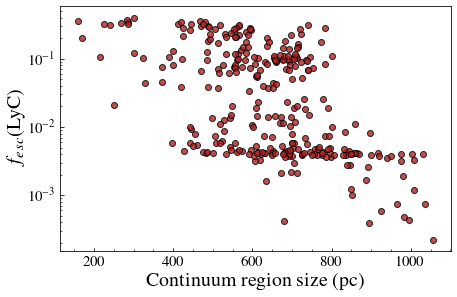

In [1798]:
fig, ax= plt.subplots(1,1, figsize =(7,4.5))


ax.scatter(sizecont,fesc900[148-90],  c = 'Firebrick', linestyle = 'None', marker = 'o',
            edgecolor = 'k', alpha = 0.8)

ax.set_ylabel(r'$f_{esc}$(LyC)', fontsize = 20)
ax.set_xlabel(r'Continuum region size (pc)', fontsize = 20)
ax.legend(frameon=False, fontsize = 20)
ax.set_yscale('log')
# plt.savefig('Plots/FluoClassySiIICII.pdf', bbox_inches = 'tight')



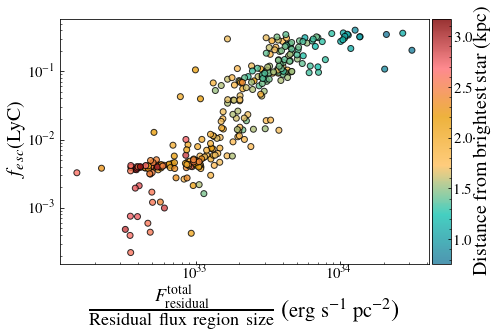

In [1792]:
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)


fig, ax= plt.subplots(1,1, figsize =(7,4.5))


im= ax.scatter( totfluxabs/(sizeabs*120*120),fesc900[148-90],  c = distabs*120/1000, linestyle = 'None', marker = 'o',
            edgecolor = 'k', alpha = 0.8, cmap = cmap)

ax.set_ylabel(r'$f_{esc}$(LyC)', fontsize = 20)
ax.set_xlabel(r'$\frac{F^{\rm total}_{\rm residual}}{\rm Residual\ flux\ region\ size}$ ({\huge erg s$^{-1}$ pc$^{-2}$})', 
              fontsize = 25)
ax.set_yscale('log')
ax.set_xscale('log')

divider = make_axes_locatable(ax)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Distance from brightest star (kpc)',fontsize = 20, rotation=90, labelpad = 50)
cbar2.ax.get_yaxis().labelpad = 0
# plt.savefig('Plots/FluoClassySiIICII.pdf', bbox_inches = 'tight')



## Fesc / orientation

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


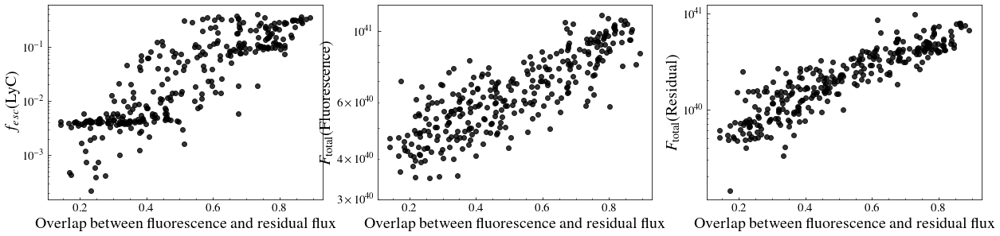

In [1812]:
fig, (ax, ax2, ax3)= plt.subplots(1,3, figsize =(21,4.5))


ax.scatter(overlapabsflu/sizeabs,fesc900[148-90],  c = 'k', linestyle = 'None', marker = 'o',
            edgecolor = 'k', alpha = 0.8)

ax.set_ylabel(r'$f_{esc}$(LyC)', fontsize = 20)
ax.set_xlabel(r'Overlap between fluorescence and residual flux', fontsize = 20)
ax.legend(frameon=False, fontsize = 20)
ax.set_yscale('log')
# plt.savefig('Plots/FluoClassySiIICII.pdf', bbox_inches = 'tight')

ax2.scatter(overlapabsflu/sizeabs,totfluxflu,  c = 'k', linestyle = 'None', marker = 'o',
            edgecolor = 'k', alpha = 0.8)
# ax2.scatter(overlapabsflu/sizeabs,totfluxabs,  c = 'blue', linestyle = 'None', marker = 'o',
#             edgecolor = 'k', alpha = 0.8)

ax2.set_ylabel(r'$F_{\rm total}$(Fluorescence)', fontsize = 20)
ax2.set_xlabel(r'Overlap between fluorescence and residual flux', fontsize = 20)
ax2.legend(frameon=False, fontsize = 20)
ax2.set_yscale('log')
ax2.set_yticks([1e40, 1e41])
ax2.set_ylim(3e40, 1.2e41)

# ax3.scatter(overlapabsflu/sizeabs,totfluxflu,  c = 'Firebrick', linestyle = 'None', marker = 'o',
#             edgecolor = 'k', alpha = 0.8)
ax3.scatter(overlapabsflu/sizeabs,totfluxabs,  c = 'k', linestyle = 'None', marker = 'o',
            edgecolor = 'k', alpha = 0.8)

ax3.set_ylabel(r'$F_{\rm total}$(Residual)', fontsize = 20)
ax3.set_xlabel(r'Overlap between fluorescence and residual flux', fontsize = 20)
ax3.legend(frameon=False, fontsize = 20)
ax3.set_yscale('log')

Text(0, 0.5, ' overlap with fluo / Size residual region')

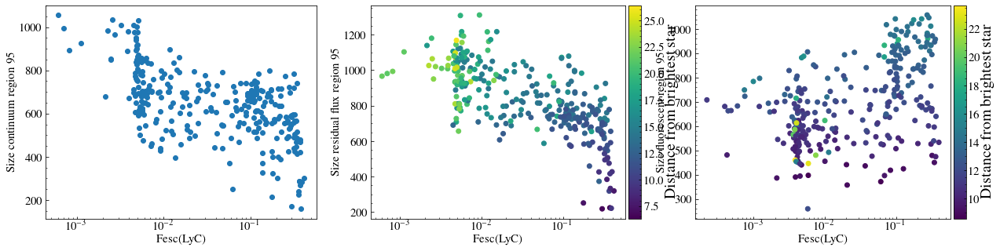

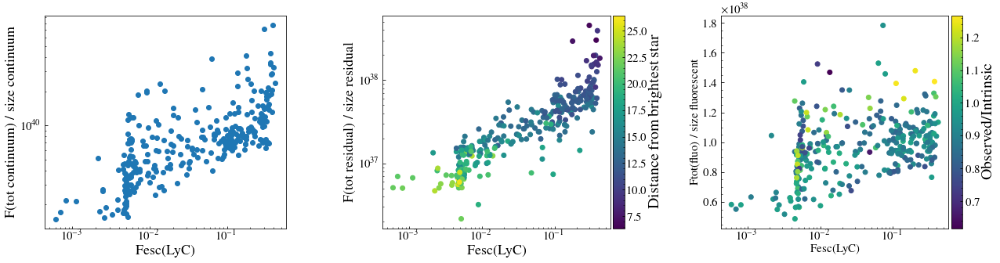

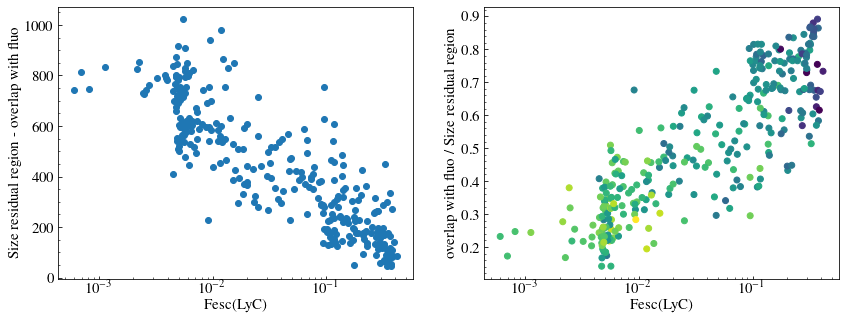

In [1736]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))


ax1.scatter(fesc[148-90], sizecont)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Size continuum region 95%')


im2 = ax2.scatter(fesc[148-90], sizeabs, c = distabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Size residual flux region 95%')
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Distance from brightest star',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0

im3 = ax3.scatter(fesc900[148-90], sizeflu, c = distflu)
ax3.set_xscale('log')
ax3.set_xlabel('Fesc(LyC)')
ax3.set_ylabel('Size fluorescent region 95%')
divider = make_axes_locatable(ax3)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im3, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Distance from brightest star',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0




fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))
plt.subplots_adjust(wspace=0.4)
ax1.scatter(fesc[148-90], totfluxcont/sizecont)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)', fontsize = 18)
ax1.set_ylabel('F(tot continuum) / size continuum', fontsize = 18)
ax1.set_yscale('log')

im2=ax2.scatter(fesc[148-90], totfluxabs/sizeabs, c= distabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)', fontsize = 18)
ax2.set_ylabel('F(tot residual) / size residual', fontsize = 18)
ax2.set_yscale('log')

divider = make_axes_locatable(ax2)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Distance from brightest star',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0


im3 = ax3.scatter(fesc[148-90], totfluxflu/sizeflu, c = dustinflu)
ax3.set_xscale('log')
ax3.set_xlabel('Fesc(LyC)')
ax3.set_ylabel('Ftot(fluo) /  size fluorescent')
divider = make_axes_locatable(ax3)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im3, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Observed/Intrinsic',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))

ax1.scatter(fesc[148-90],sizeabs- overlapabsflu)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Size residual region - overlap with fluo')


im2 = ax2.scatter(fesc[148-90], overlapabsflu/sizeabs, c = sizeabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel(' overlap with fluo / Size residual region')



# divider = make_axes_locatable(ax2)
# cax2 = divider.append_axes('right', size='5%', pad=0.05)
# cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
# cax2.yaxis.set_ticks_position('right')
# cbar2.set_label('Distance from brightest star',fontsize = 20, rotation=90)
# cbar2.ax.get_yaxis().labelpad = 0

# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))
# ax1.scatter(fesc900[148-90], sizeflu)
# ax1.set_xscale('log')
# ax1.set_xlabel('Fesc(LyC)')
# ax1.set_ylabel('Size fluorescent region 95%')

# ax2.scatter(fesc900[148-90], overlapabsflu)
# ax2.set_xscale('log')
# ax2.set_xlabel('Fesc(LyC)')
# # ax2.set_ylabel('Overlap residual flux /fluorescent region 95%')

# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))
# ax1.scatter(fesc900[148-90], dustincont)
# ax1.set_xscale('log')
# ax1.set_xlabel('Fesc(LyC)')
# ax1.set_ylabel('Size fluorescent region 50%')

# ax2.scatter(fesc900[148-90], overlapabsflu)
# ax2.set_xscale('log')
# ax2.set_xlabel('Fesc(LyC)')
# ax2.set_ylabel('Overlap residual flux /fluorescent region 95%')






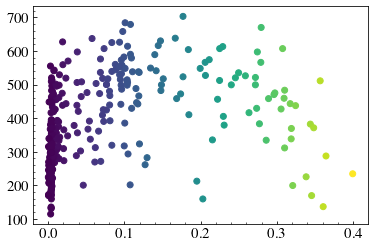

In [1816]:
plt.scatter(fesc900[148-90], overlapabsflu, c= fesc900[148-90])

## FESC / Att

Text(0, 0.5, 'Observed / Intrinsice')

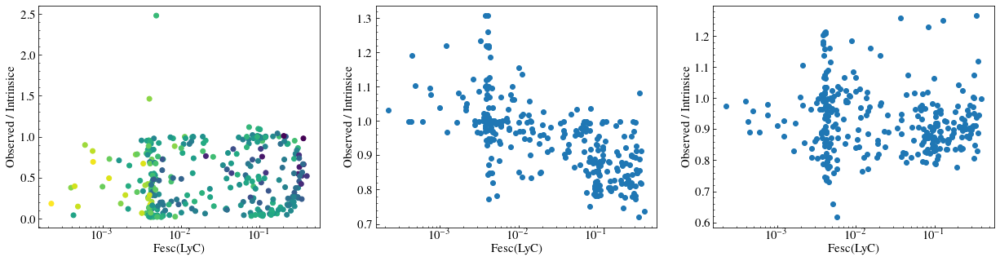

In [1738]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))
ax1.scatter(fesc900[148-90], dustincont, c= sizecont)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Observed / Intrinsice')
# ax1.set_yscale('log')

im2=ax2.scatter(fesc900[148-90], dustinabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Observed / Intrinsice')
# ax2.set_yscale('log')


im3 = ax3.scatter(fesc900[148-90], dustinflu)
ax3.set_xscale('log')
ax3.set_xlabel('Fesc(LyC)')
ax3.set_ylabel('Observed / Intrinsice')


Text(0, 0.5, 'Observed / Intrinsice')

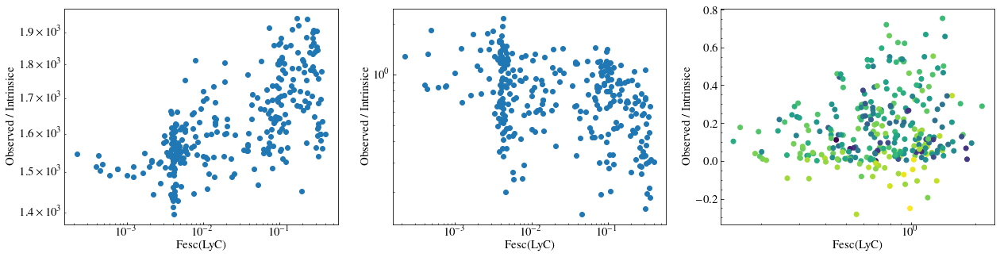

In [1759]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))
ax1.scatter(fesc900[148-90], sizedust)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Observed / Intrinsice')
ax1.set_yscale('log')

im2=ax2.scatter(fesc900[148-90], rinccont)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Observed / Intrinsice')
ax2.set_yscale('log')


im3 = ax3.scatter(rinccont, resiinc, c= EW)
ax3.set_xscale('log')
ax3.set_xlabel('Fesc(LyC)')
ax3.set_ylabel('Observed / Intrinsice')

## Fesc absorption properties

Text(0, 0.5, 'Observed / Intrinsice')

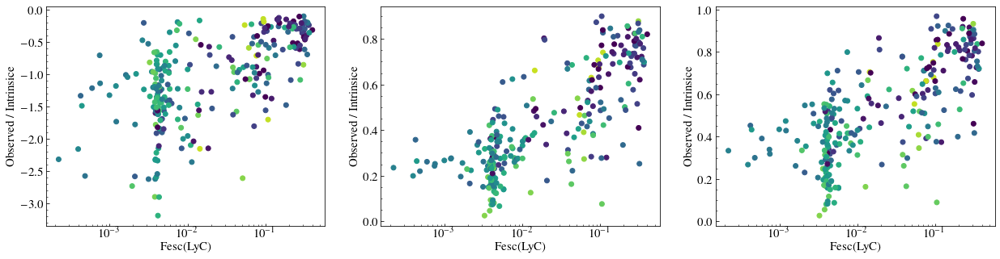

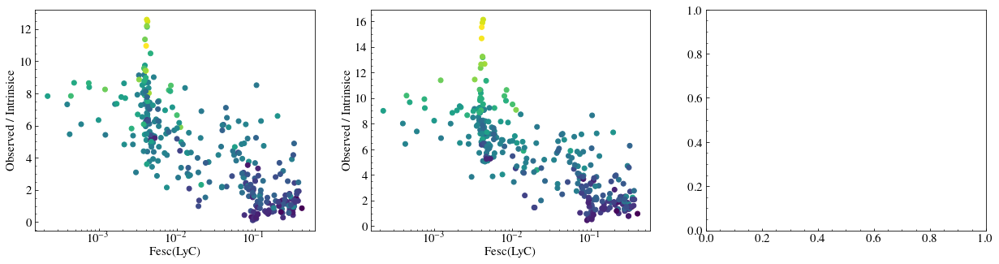

In [1594]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))
ax1.scatter(fesc900[148-90], EW, c = vcen, vmin = -200, vmax = 200)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Observed / Intrinsice')
# ax1.set_yscale('log')

im2=ax2.scatter(fesc900[148-90], rnoscatt, c = vcen, vmin = -200, vmax = 200)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Observed / Intrinsice')
# ax2.set_yscale('log')

im2=ax3.scatter(fesc900[148-90], rall, c = vcen, vmin = -200, vmax = 200)
ax3.set_xscale('log')
ax3.set_xlabel('Fesc(LyC)')
ax3.set_ylabel('Observed / Intrinsice')


fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (21,5))
ax1.scatter(fesc900[148-90], (1-rall)*10**dustinabs, c = dustinabs)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Observed / Intrinsice')
# ax1.set_yscale('log')

im2=ax2.scatter(fesc900[148-90], (1-rnoscatt)*10**dustinabs, c = dustinabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Observed / Intrinsice')
# ax2.set_yscale('log')

In [1386]:
print(directions[np.round(abs(directions[:,0]),2) ==0.16])
print(directions[275])
# print(directions[np.round(abs(directions),2) == np.round(abs(directions[156]))])
for i in range(300):
    if np.array_equiv(np.round(abs(directions[i]),2), np.round(abs(directions[275]),2)):
        print(i, directions[i])
# print(directions[np.where(directions ==directions[156])[0][0],np.where(directions ==direc),2)tions[156])[0][1]] )

[[ 0.1550377   0.97886952  0.13333333]
 [-0.1550377   0.97886952  0.13333333]
 [-0.1550377  -0.97886952  0.13333333]
 [ 0.1550377  -0.97886952  0.13333333]
 [ 0.1550377   0.97886952 -0.13333333]
 [-0.1550377   0.97886952 -0.13333333]
 [-0.1550377  -0.97886952 -0.13333333]
 [ 0.1550377  -0.97886952 -0.13333333]]
[ 0.60551522 -0.12044447 -0.78666667]
24 [0.60551522 0.12044447 0.78666667]
31 [-0.60551522  0.12044447  0.78666667]
32 [-0.60551522 -0.12044447  0.78666667]
39 [ 0.60551522 -0.12044447  0.78666667]
260 [ 0.60551522  0.12044447 -0.78666667]
267 [-0.60551522  0.12044447 -0.78666667]
268 [-0.60551522 -0.12044447 -0.78666667]
275 [ 0.60551522 -0.12044447 -0.78666667]


## FLuorescent understand

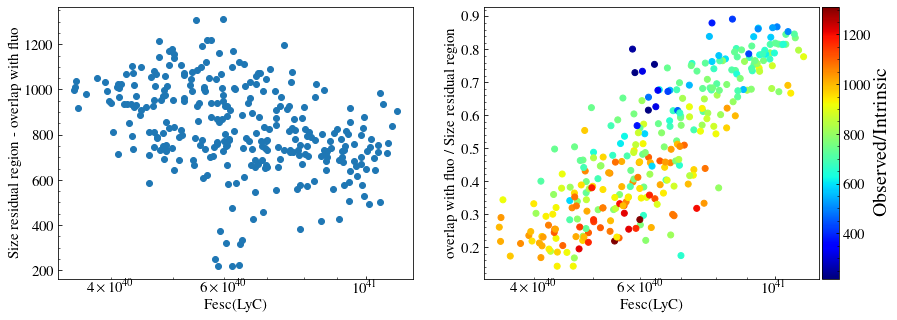

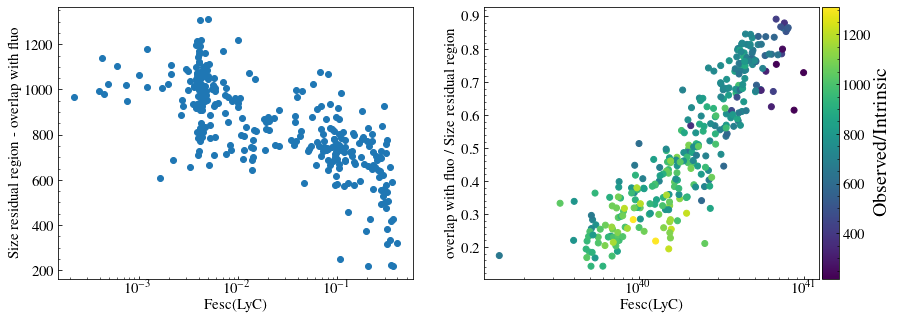

In [1595]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))

ax1.scatter(totfluxflu,sizeabs)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Size residual region - overlap with fluo')


im2 = ax2.scatter(totfluxflu, overlapabsflu/sizeabs, c= sizeabs, cmap = 'jet')
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel(' overlap with fluo / Size residual region')
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Observed/Intrinsic',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0



fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))

ax1.scatter(fesc900[148-90],sizeabs)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Size residual region - overlap with fluo')


im2 = ax2.scatter(totfluxabs, overlapabsflu/sizeabs, c = sizeabs)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel(' overlap with fluo / Size residual region')
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes('right', size='5%', pad=0.05)
cbar2 = fig.colorbar(im2, cax=cax2, orientation='vertical')
cax2.yaxis.set_ticks_position('right')
cbar2.set_label('Observed/Intrinsic',fontsize = 20, rotation=90)
cbar2.ax.get_yaxis().labelpad = 0



Text(0, 0.5, 'Size residual region - overlap with fluo')

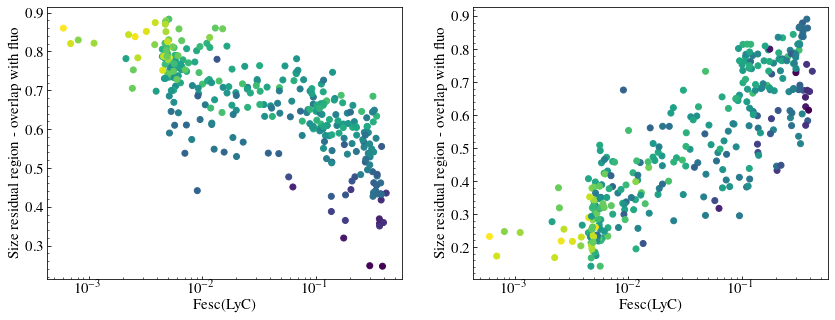

In [1647]:


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))

ax1.scatter(fesc[148-90], overlapflucont/sizeflu, c= sizecont)
ax1.set_xscale('log')
ax1.set_xlabel('Fesc(LyC)')
ax1.set_ylabel('Size residual region - overlap with fluo')

ax2.scatter(fesc[148-90], overlapabsflu/sizeabs, c= sizecont)
ax2.set_xscale('log')
ax2.set_xlabel('Fesc(LyC)')
ax2.set_ylabel('Size residual region - overlap with fluo')




# Predicting fesc

## Lyman leakers

[1051.3004 1051.4048 1051.5165 ... 1339.3248 1339.4292 1339.541 ]
[1066.2876 1066.4104 1066.5181 ... 1383.9775 1384.0774 1384.2003]
[1208.2238 1208.4512 1208.6787 ... 2049.2354 2049.4653 2049.6948]


(0.0, 2.0)

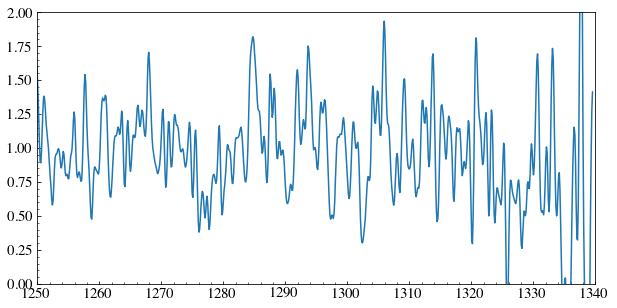

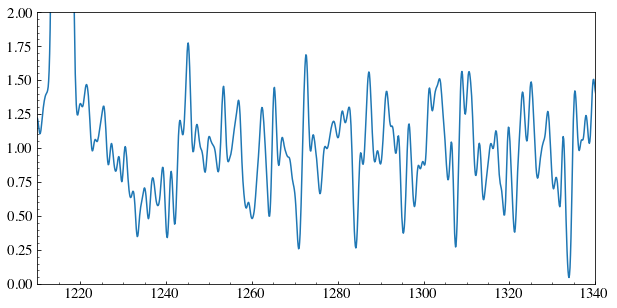

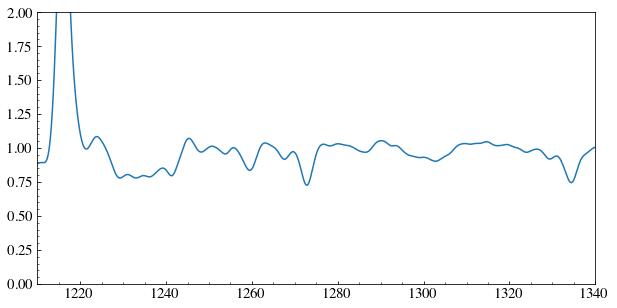

In [1858]:
galName = 'J1154'
# spec = '../Residual flux/Spectra/J0925+1403g160mbin12.fits'
spec = '..//Residual flux/Spectra/J1152+3400g160mbin12.fits'

zGal = 0.3419#df['redshift'][df['Galaxy']=='J0926+4427'].values[0]

gal      = fits.open(spec)
HR       = gal[1].data  
# print(repr(gal[1].header))
wM, fM, eM = HR['wave'],  HR['flux'],  HR['sigma_flux']
vdisData = 71/2.355 #This should be the resolution of your spectra in km/s
wM = wM/(1+zGal)
fM = gaussian_filter(fM, sigma = 2)
fM /= np.median(fM[(wM > 1270) & (wM < 1300)])
print(wM)
plt.figure(figsize=(10,5))
plt.plot(wM,fM)
plt.xlim(1250,1340)
plt.ylim(0,2)

galName = 'J1142'
# spec = '../Residual flux/Spectra/J0925+1403g160mbin12.fits'
spec = '..//Residual flux/Spectra/J0925+1403g160mbin12.fits'

zGal = 0.3013#df['redshift'][df['Galaxy']=='J0926+4427'].values[0]

gal      = fits.open(spec)
HR       = gal[1].data  
# print(repr(gal[1].header))
wM, fM, eM = HR['wave'],  HR['flux'],  HR['sigma_flux']
vdisData = 71/2.355 #This should be the resolution of your spectra in km/s
wM = wM/(1+zGal)
fM = gaussian_filter(fM, sigma =4)
fM /= np.median(fM[(wM > 1270) & (wM < 1300)])
print(wM)
plt.figure(figsize=(10,5))
plt.plot(wM,fM)
plt.xlim(1210,1340)
plt.ylim(0,2)


galName = 'J1142'
# spec = '../Residual flux/Spectra/J0925+1403g160mbin12.fits'
spec = '../Residual flux/Spectra/tol1247-232g140labin3.fits'

zGal = 0.0488#df['redshift'][df['Galaxy']=='J0926+4427'].values[0]

gal      = fits.open(spec)
HR       = gal[1].data  
# print(repr(gal[1].header))
wM, fM, eM = HR['wave'],  HR['flux'],  HR['sigma_flux']
vdisData = 71/2.355 #This should be the resolution of your spectra in km/s
wM = wM/(1+zGal)
fM = gaussian_filter(fM, sigma =4)
fM /= np.median(fM[(wM > 1270) & (wM < 1300)])
print(wM)
plt.figure(figsize=(10,5))
plt.plot(wM,fM)
plt.xlim(1210,1340)
plt.ylim(0,2)

## Fesc classy

(-1.0, 38.7)

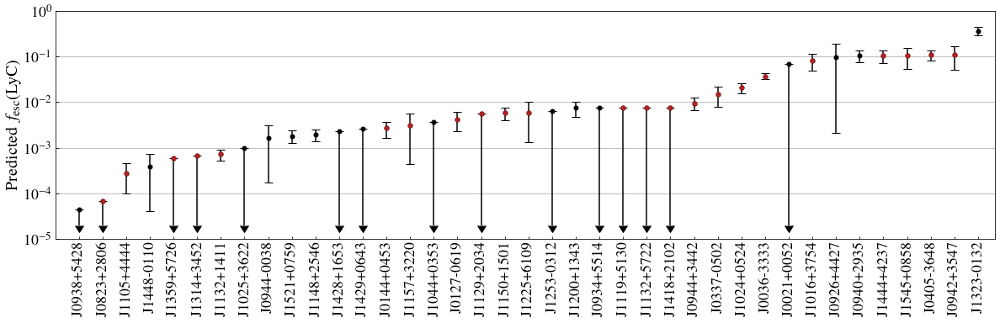

In [6]:
dfFS   = pd.read_csv('csv/Classy_dep_fit_V2.csv')
# bestDir         = dfFS['DirAll'][i]
# bestOut         = dfFS['OutputAll'][i]
# bestChi2FS      = dfFS['x2All'][i]
dfFS.loc[dfFS.Galaxy == 'J0926_4427', 'OutputAll'] = 148
dfFS.loc[dfFS.Galaxy == 'J0926_4427', 'DirAll'] = 275

dfFS10   = pd.read_csv('csv/Classy_dep_10fits_abs.csv')
fescall = np.zeros((45, 10)) +np.nan
maskr50 = np.array(df['r50'].values)
# print(maskr50, len(maskr50))
mask = np.ones(45).astype(bool)
mask[[6,20,25,35,42,44]] = 0
for i in range(45):
    for j in range(10):
        if(dfFS10['x2All'+str(j)][i] <= 2*dfFS10['x2All0'][i]):
            fescall[i, j] = fesc900[dfFS10['OutputAll'+str(j)][i]-90,dfFS10['DirAll'+str(j)][i]]

fescmin = np.nanmin(fescall, axis =1)
fescmax = np.nanmax(fescall, axis =1)
fescstd = np.nanstd(fescall, axis = 1)
fescmed = np.nanmedian(fescall, axis = 1)
fescmin[fescmin<1e-5] =1e-5            
# print(dfFS['Galaxy' == 'J0926+4427'])
fescClassy = [fesc900[dfFS['OutputAll'][i]-90,dfFS['DirAll'][i]] for i in range(45)]
label_arr = [label[i].upper() for i in range(len(label))]
label_arr = np.asarray(label_arr)


fescC = fescClassy.copy()
label_arr = np.array(label_arr)[mask]
fescClassy = np.array(fescClassy)[mask]
fescstd = np.array(fescstd)[mask]
fescS = fescstd.copy()
maskr50 = maskr50[mask]
masklow = ( np.array(fescC)[mask] - fescS <1e-5)


label_arr = [x for _,x in sorted(zip(fescClassy,label_arr))]
# fescmin = [x for _,x in sorted(zip(fescClassy,fescmin))]
# fescmax = [x for _,x in sorted(zip(fescClassy,fescmax))]
fescstd = [x for _,x in sorted(zip(fescClassy,fescstd))]
maskr50 = [x for _,x in sorted(zip(fescClassy,maskr50))]
masklow= [x for _,x in sorted(zip(fescClassy,masklow))]

fescClassy = sorted(fescClassy)

maskr50 = np.asarray(maskr50)
masklow = np.asarray(masklow)
fig, ax1 = plt.subplots(1,1, figsize= (20,5))
ax1.errorbar(np.arange(len(fescClassy))[~masklow],np.array(fescClassy)[~masklow], 
             yerr =  np.array(fescstd)[~masklow],
             linestyle = 'none', 
             marker = 'o', c ='k', markersize = 5, capsize = 5)

ax1.errorbar(np.arange(len(np.array(fescClassy)))[masklow],np.array(fescClassy)[masklow], 
             yerr = [np.array(fescClassy)[masklow]-2e-5,np.zeros(len(np.array(fescClassy)[masklow]))],
             linestyle = 'none', uplims=True,
             marker = 'o', c ='k', markersize = 5, capsize = 5)

# ax1.scatter(np.arange(39),np.array(fescmin)[mask])
# ax1.scatter(np.arange(39),np.array(fescmax)[mask])

ax1.errorbar(np.arange(len(fescClassy))[np.array(maskr50)>1.3],np.array(fescClassy)[np.array(maskr50)>1.3], 
                     linestyle = 'none',marker = 'o', c ='FireBrick', markersize = 5, capsize = 5)

ax1.set_xticks(np.arange(len(fescClassy)))
ax1.set_xticklabels(np.array(label_arr), rotation = 90)
ax1.set_yscale('log')
ax1.minorticks_off()
ax1.grid(axis='y')
ax1.set_ylim(1e-5, 1)
ax1.set_ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
ax1.tick_params(labelsize = 18)
ax1.set_xlim(-1, 38.7)

(1e-05, 1)

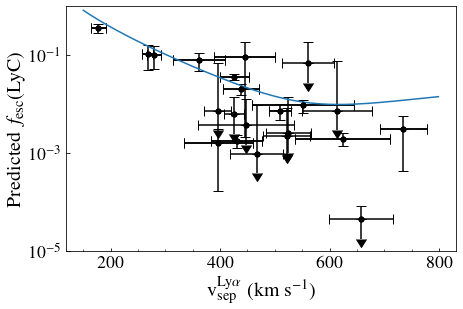

In [10]:
plt.figure(figsize=(7,4.5))
masklow = ( np.array(fescC)[mask] - fescS <1e-5)

plt.errorbar(np.array(df['VsepLya'].values)[mask], np.array(fescC)[mask], 
             yerr = [np.zeros(len(fescS)), fescS], xerr = np.array(df['ErrVsepLya'].values)[mask], 
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.errorbar(np.array(df['VsepLya'].values)[mask][~masklow], np.array(fescC)[mask][~masklow], 
             yerr = [fescS[~masklow],np.zeros(len(fescS[~masklow]))], 
             xerr = np.array(df['ErrVsepLya'].values)[mask][~masklow], 
             linestyle = 'none', c= 'k', marker = 'o', markersize = 5,capsize = 5)
plt.errorbar(np.array(df['VsepLya'].values)[mask][masklow], np.array(fescC)[mask][masklow], 
             yerr = np.zeros(len(fescS[masklow]))+np.array(fescC)[mask][masklow]*0.6, uplims = True,
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.yscale('log')

plt.xlabel(r'v$_{\rm sep}^{\rm Ly\alpha}$ (km s$^{-1}$)', fontsize = 20)
plt.ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
plt.tick_params(labelsize = 18)
plt.plot(np.arange(150,800),(3.24*10**4)/(np.arange(150,800)**2) -1.05*10**2/np.arange(150,800) +0.095 )
plt.ylim(1e-5,1)

(1e-05, 1)

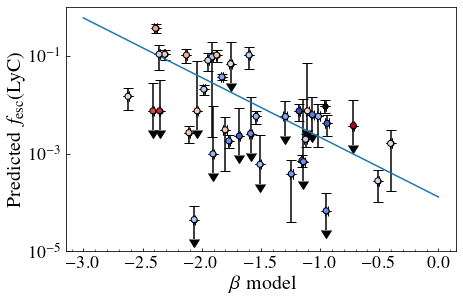

In [65]:
plt.figure(figsize=(7,4.5))
masklow = ( np.array(fescC)[mask] - fescS <1e-5)

plt.errorbar(np.array(df['BetaModel'].values)[mask], np.array(fescC)[mask], 
             yerr = [np.zeros(len(fescS)), fescS], xerr = np.array(df['ErrBetaModel'].values)[mask], 
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.errorbar(np.array(df['BetaModel'].values)[mask][~masklow], np.array(fescC)[mask][~masklow], 
             yerr = [fescS[~masklow],np.zeros(len(fescS[~masklow]))], 
             xerr = np.array(df['ErrBetaModel'].values)[mask][~masklow], 
             linestyle = 'none', c= 'k', marker = 'o', markersize = 5,capsize = 5)
plt.errorbar(np.array(df['BetaModel'].values)[mask][masklow], np.array(fescC)[mask][masklow], 
             yerr = np.zeros(len(fescS[masklow]))+np.array(fescC)[mask][masklow]*0.6, uplims = True,
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)

# plt.errorbar(np.array(df['BetaModel'].values)[mask][np.array(maskr50)>1.3],
#              np.array(fescC)[mask][np.array(maskr50)>1.3], 
#                      linestyle = 'none',marker = 'o', c ='FireBrick', markersize = 5, capsize = 5)
plt.scatter(np.array(df['BetaModel'].values)[mask], np.array(fescC)[mask], 
             c= np.array(df['RSiIV1402'].values)[mask], marker = 'o', edgecolor = 'k',
            zorder = 5, cmap = 'coolwarm')

plt.yscale('log')

plt.xlabel(r'$\beta$ model', fontsize = 20)
plt.ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
plt.tick_params(labelsize = 18)
plt.plot(np.arange(-3,1),1.3*1e-4 * 10**(-1.22*np.arange(-3,1)) )
plt.ylim(1e-5,1)

(1e-05, 1)

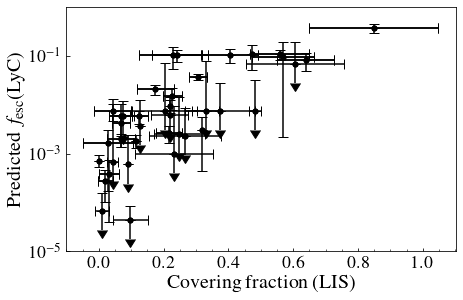

In [9]:
plt.figure(figsize=(7,4.5))
masklow = ( np.array(fescC)[mask] - fescS <1e-5)
df['average_cf'] = df[['RSiII1260', 'RCII334']].mean(axis=1)


plt.errorbar(np.array(df['average_cf'].values)[mask], np.array(fescC)[mask], 
             yerr = [np.zeros(len(fescS)), fescS], xerr = np.array(df['ErrRSiII1260'].values)[mask], 
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.errorbar(np.array(df['average_cf'].values)[mask][~masklow], np.array(fescC)[mask][~masklow], 
             yerr = [fescS[~masklow],np.zeros(len(fescS[~masklow]))], 
             xerr = np.array(df['ErrRSiII1260'].values)[mask][~masklow], 
             linestyle = 'none', c= 'k', marker = 'o', markersize = 5,capsize = 5)
plt.errorbar(np.array(df['average_cf'].values)[mask][masklow], np.array(fescC)[mask][masklow], 
             yerr = np.zeros(len(fescS[masklow]))+np.array(fescC)[mask][masklow]*0.6, uplims = True,
             linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.yscale('log')

plt.xlabel(r'Covering fraction (LIS)', fontsize = 20)
plt.ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
plt.tick_params(labelsize = 18)
# plt.plot(np.arange(150,800),(3.24*10**4)/(np.arange(150,800)**2) -1.05*10**2/np.arange(150,800) +0.095 )
plt.ylim(1e-5,1)

# Robustness as function of los


## 275


9 [-0.12330617 -0.29768744  0.94666667] [ 0.60551522 -0.12044447 -0.78666667]
141.58400942854007
10 [ 0.12330617 -0.29768744  0.94666667] [ 0.60551522 -0.12044447 -0.78666667]
129.36012246717993
92 [-0.64807407 -0.64807407  0.4       ] [ 0.60551522 -0.12044447 -0.78666667]
128.97847938604994
93 [-0.41608917 -0.81662097  0.4       ] [ 0.60551522 -0.12044447 -0.78666667]
117.92124733062386
141 [0.95105652 0.30901699 0.        ] [ 0.60551522 -0.12044447 -0.78666667]
57.407547029932736
260 [ 0.60551522  0.12044447 -0.78666667] [ 0.60551522 -0.12044447 -0.78666667]
13.83550939049056
285 [ 0.12293224 -0.45878935 -0.88      ] [ 0.60551522 -0.12044447 -0.78666667]
34.718252627161675
286 [ 0.33585711 -0.33585711 -0.88      ] [ 0.60551522 -0.12044447 -0.78666667]
20.595789016803554


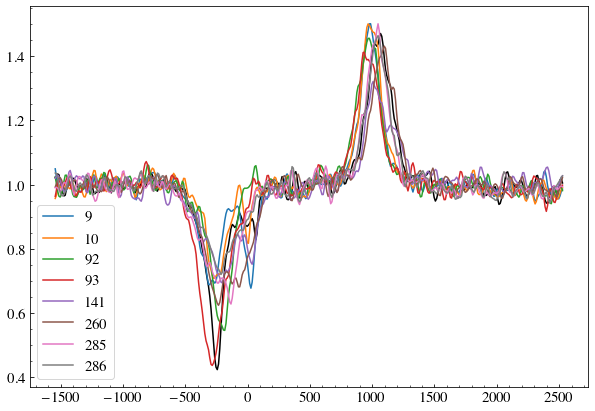

In [1130]:
idir = 275
alli275 = []
alli275.append(275)
lsiII, fluxsiII = read_spectrum_si(path_to_data2, 148 )
lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
lsiII_systemic = lsiII_systemic[1:]
vsiII        = (lsiII_systemic/wsiII1260 -1)*c
 
sigma_pixelsi  = 30 / 2.355/ ((vsiII[50]-vsiII[49]))
mainmodel    = gaussian_filter(fluxsiII[idir,1:]/np.median(fluxsiII[idir,1:]), sigma = sigma_pixelsi)
f            = interpolate.interp1d(vsiII, mainmodel)
mainmodelNewsi = f(vsiII)
rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
fmedSiII = np.nanmedian(mainmodelNewsi[rmedSiII])
mainmodelNewsi /= fmedSiII 
plt.figure(figsize = (10,7))
plt.plot(vsiII, mainmodelNewsi, c= 'k')

for i in range(300):
# lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    
    lsiII_systemic = lsiII + np.dot(directions[i,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c

    model          = gaussian_filter(fluxsiII[i,1:]/np.median(fluxsiII[i,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII_s)

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    
    maskSiII = (vsiII>-500) & (vsiII < 500)
    if((np.nansum((modelNewsi[maskSiII] - mainmodelNewsi[maskSiII])**2) <1.) & (i!= idir) & 
     (0<np.degrees(np.arccos(np.clip(np.dot(directions[idir,:], directions[i,:]), -1.0, 1.0)))<180)):
        print(i,directions[i,:], directions[idir,:])
        alli275.append(i)
        plt.plot(vsiII, modelNewsi, label =i)
       # print(np.dot(directions[idir,:], directions[i,:]))
        print(np.degrees(np.arccos(np.clip(np.dot(directions[idir,:], directions[i,:]), -1.0, 1.0))))
        #i+=5
        
plt.legend()


117.92124733062386
55.217822916484955
129.36012246717993
[ 0.60551522 -0.12044447 -0.78666667]
26 24
2
90
4.47213595499958
0.17547
[-0.41608917 -0.81662097  0.4       ]
30 38
2
25
3.605551275463989
0.1505
[ 0.12330617 -0.29768744  0.94666667]
28 40
2
10
2.118033988749895
0.12509


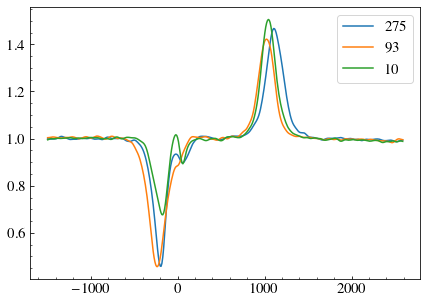

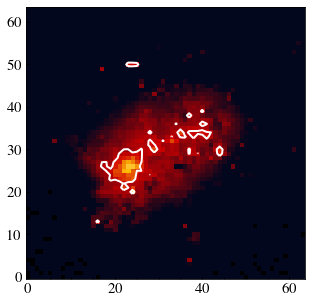

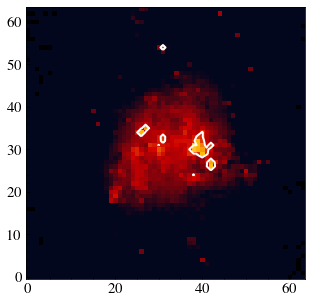

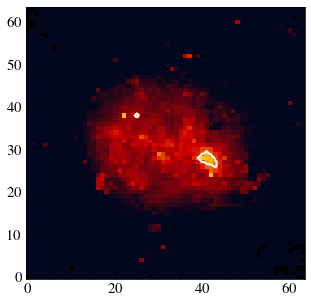

In [1242]:
# plt.figure(figsize = (5,5))
# imageall = np.sum(cubeSiII[275,:,:,:],axis=(2))#/ (imsize/nxy)**2 

# im1 = plt.imshow(imageall/(120*120), norm=LogNorm(vmin=5e38/(120*120),vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
#           aspect = 'auto')
print(np.degrees(np.arccos(np.clip(np.dot(directions[275,:], directions[93,:]), -1.0, 1.0))))
print(np.degrees(np.arccos(np.clip(np.dot(directions[10,:], directions[93,:]), -1.0, 1.0))))
print(np.degrees(np.arccos(np.clip(np.dot(directions[10,:], directions[275,:]), -1.0, 1.0))))

fig, axspec = plt.subplots(1,1,figsize = (7,5))
for idir in [275, 93,10]:
    print(directions[idir])
    plt.figure(figsize = (5,5))

    #imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
    l_systemic = lcubeSiII[1:] #+ np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vcII  = (l_systemic/wsiII1260-1)*c
    idres = np.argmin(spec)  -2
    idres2 = np.argmin(spec) +2
    axspec.plot(vcII, gaussian_filter(spec/np.median(spec), sigma = sigma_pixelsi), label = idir)

    idflu = np.argmax(spec)-5
    idflu2 =  np.argmax(spec)+5

    imageall  = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    imagecont = np.sum(cubeSiII[idir,:,:,idflu+20:idflu2+20],axis=(2))#/ (imsize/nxy)**2 
    imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
    imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/

    cx,cy = np.where(imagecont == np.max(imagecont))
    cx = int(cx)
    cy = int(cy)
    print(cx,cy)
    im1 = plt.imshow(imageall/(120*120), norm=LogNorm(vmin=5e38/(120*120),vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')
    
    ax=plt.gca()
    dd = imagecont.copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
   # print(dd,cumdd[-1])
    lvl = 0.5
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))
    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    #print(lvl*cumdd[-1])
    aa = dd[gidx]
   # print(aa)
    pp = imagecont.copy()
    pp[pp<aa] = 0
    print(np.sum(pp>0))
    

    ########## ABS

    dd = abs(imageabs.copy())#.copy() 
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))

    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]

    pp = abs(imageabs).copy()
    pp[pp<aa] = 0
    print(np.sum(pp>0))
    alldist = []
    for xx, yy in zip(*np.where(pp>0)):
#         print(xx,yy, cx,cy)
#         print(np.array(cx,cy), np.array(xx,yy))
        alldist.append(np.linalg.norm(np.array((cx,cy))-np.array((xx,yy))))
    
    print(np.median(alldist))
    print(fesc[148-90,idir])
    ax.contour( pp, levels=[aa], colors='w',  linewidths=2, zorder = 10)
axspec.legend()


## 156


40 [0.73617942 0.11659937 0.66666667] [ 0.30901699 -0.95105652  0.        ]
83.30411736725092
69 [-0.80450362  0.26139907  0.53333333] [ 0.30901699 -0.95105652  0.        ]
119.81562463863246
89 [-0.90523132  0.14337456  0.4       ] [ 0.30901699 -0.95105652  0.        ]
114.58792519563333
95 [ 0.14337456 -0.90523132  0.4       ] [ 0.30901699 -0.95105652  0.        ]
25.14554442402683
177 [ 0.7007932  -0.7007932  -0.13333333] [ 0.30901699 -0.95105652  0.        ]
27.98738341609137
200 [ 0.90523132  0.14337456 -0.4       ] [ 0.30901699 -0.95105652  0.        ]
81.75683539173689


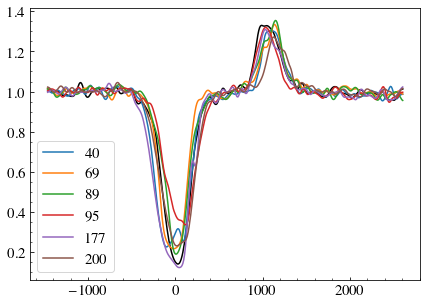

In [1138]:
idir = 156
alli156 = []
alli156.append(156)
lsiII, fluxsiII = read_spectrum_si(path_to_data2, 148 )
lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
lsiII_systemic = lsiII_systemic[1:]
vsiII        = (lsiII_systemic/wsiII1260 -1)*c
 
sigma_pixelsi  = 60 / 2.355/ ((vsiII[50]-vsiII[49]))
mainmodel    = gaussian_filter(fluxsiII[idir,1:]/np.median(fluxsiII[idir,1:]), sigma = sigma_pixelsi)
f            = interpolate.interp1d(vsiII, mainmodel)
mainmodelNewsi = f(vsiII)
rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
fmedSiII = np.nanmedian(mainmodelNewsi[rmedSiII])
mainmodelNewsi /= fmedSiII 
# plt.figure(figsize = (10,7))
fig, axspec = plt.subplots(1,1,figsize = (7,5))
axspec.plot(vsiII, mainmodelNewsi, c= 'k')

for i in range(300):
# lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    
    lsiII_systemic = lsiII + np.dot(directions[i,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c

    model          = gaussian_filter(fluxsiII[i,1:]/np.median(fluxsiII[i,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII_s)

    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    
    maskSiII = (vsiII>-600) & (vsiII < 1400)
    if((np.nansum((modelNewsi[maskSiII] - mainmodelNewsi[maskSiII])**2) <2) & (i!= idir) & 
     (0<np.degrees(np.arccos(np.clip(np.dot(directions[idir,:], directions[i,:]), -1.0, 1.0)))<180)):
        print(i,directions[i,:], directions[idir,:])
        alli156.append(i)
        plt.plot(vsiII, modelNewsi, label=i)
       # print(np.dot(directions[idir,:], directions[i,:]))
        print(np.degrees(np.arccos(np.clip(np.dot(directions[idir,:], directions[i,:]), -1.0, 1.0))))
        #i+=5
plt.legend()

114.58792519563333
112.52140898014318
95.32012598715345

5
151
9.486832980505138
0.0081069

1
152
16.703185795666727
0.0093121

2
176
12.589537363407594
0.0054697


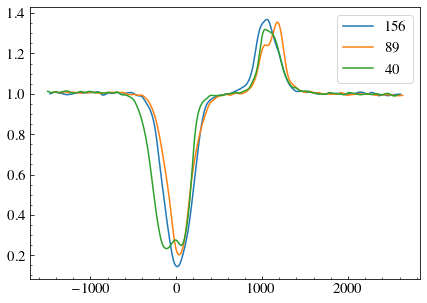

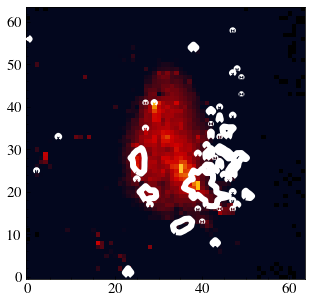

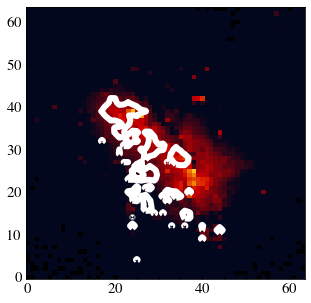

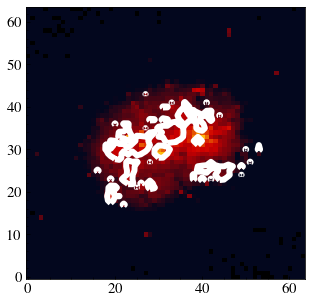

In [1243]:
# plt.figure(figsize = (5,5))
# imageall = np.sum(cubeSiII[275,:,:,:],axis=(2))#/ (imsize/nxy)**2 

# im1 = plt.imshow(imageall/(120*120), norm=LogNorm(vmin=5e38/(120*120),vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
#           aspect = 'auto')
fig, axspec = plt.subplots(1,1,figsize = (7,5))
print(np.degrees(np.arccos(np.clip(np.dot(directions[156,:], directions[89,:]), -1.0, 1.0))))
print(np.degrees(np.arccos(np.clip(np.dot(directions[40,:], directions[89,:]), -1.0, 1.0))))
print(np.degrees(np.arccos(np.clip(np.dot(directions[40,:], directions[275,:]), -1.0, 1.0))))

for idir in [156, 89, 40]:
    print()
    plt.figure(figsize = (5,5))

    #imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
    l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vcII  = (l_systemic/wsiII1260-1)*c
    idres = np.argmin(spec)  -2
    idres2 = np.argmin(spec) +2
    axspec.plot(vcII, gaussian_filter(spec/np.median(spec), sigma = sigma_pixelsi), label = idir)

    idflu = np.argmax(spec)-5
    idflu2 =  np.argmax(spec)+5

    imageall  = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    imagecont = np.sum(cubeSiII[idir,:,:,idflu+20:idflu2+20],axis=(2))#/ (imsize/nxy)**2 
    imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
    imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/

    
    
    im1 = plt.imshow(imageall/(120*120), norm=LogNorm(vmin=5e38/(120*120),vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto')
    
    ax=plt.gca()
    dd = imagecont.copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
   # print(dd,cumdd[-1])
    lvl = 0.5
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))
    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    #print(lvl*cumdd[-1])
    aa = dd[gidx]
   # print(aa)
    pp = imagecont.copy()
    pp[pp<aa] = 0
    print(np.sum(pp>0))

    

    ########## ABS

    dd = abs(imageabs.copy())#.copy() 
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))

    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]

    pp = abs(imageabs).copy()
    pp[pp<aa] = 0
    print(np.sum(pp>0))
    alldist = []
    for xx, yy in zip(*np.where(pp>0)):
#         print(xx,yy, cx,cy)
#         print(np.array(cx,cy), np.array(xx,yy))
        alldist.append(np.linalg.norm(np.array((cx,cy))-np.array((xx,yy))))
    
    print(np.median(alldist))
    ax.contour( pp, levels=[aa], colors='w',  linewidths=6, zorder = 10)
    print(fesc[148-90,idir])

axspec.legend()


#     spec_cont_in = np.sum(nsp,axis=(0,1))

#     nsp = cubeSiII[idir,:,:,1:].copy()
#     nsp[pp>=dd[gidx]] = 0
#     spec_cont_out = np.sum(nsp,axis=(0,1))

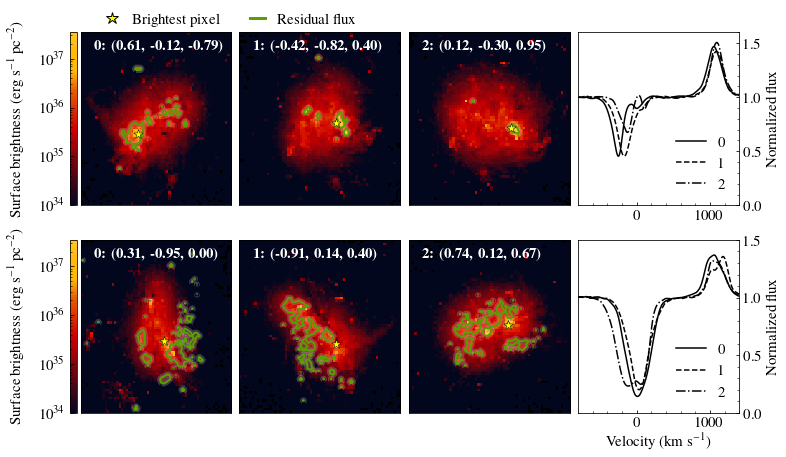

In [1352]:
fig, axs = plt.subplots(2,4,figsize = (12,7))
plt.subplots_adjust(wspace=0.05)
axs = axs.flatten()
axs1 = axs[3]
axs2 = axs[-1]
panel = 0
im=[]
linesS = ['-','--','-.']

for idir in [275, 93,10, 156, 89, 40]:
    print()

    #imageall = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    spec = np.sum(cubeSiII[idir,:,:,1:],axis=(0,1)) 
    l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vcII  = (l_systemic/wsiII1260-1)*c
    idres = np.argmin(spec)  -2
    idres2 = np.argmin(spec) +2
    if(panel<3):
        axs1.plot(vcII, gaussian_filter(spec/np.median(spec), sigma = sigma_pixelsi), label = panel%4,
                 ls = linesS[panel] , c= 'k')
    else:
        axs2.plot(vcII, gaussian_filter(spec/np.median(spec), sigma = sigma_pixelsi), label = panel%4,
                 ls = linesS[panel%4] , c= 'k')
    idflu = np.argmax(spec)-5
    idflu2 =  np.argmax(spec)+5

    imageall  = np.sum(cubeSiII[idir,:,:,:],axis=(2))#/ (imsize/nxy)**2 
    imagecont = np.sum(cubeSiII[idir,:,:,idflu+20:idflu2+20],axis=(2))#/ (imsize/nxy)**2 
    imageabs  = np.sum(cubeSiII[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
    imageemi  = np.sum(cubeSiII[idir,:,:,idflu:idflu2],axis=(2))#/

    cx,cy = np.where(imagecont == np.max(imagecont))
    cx = int(cx)
    cy = int(cy)
    
    im.append(axs[panel].imshow(imageall/(120*120), norm=LogNorm(vmin=10**34,vmax=5e41/(120*120)), cmap=cmap, interpolation="nearest",origin = 'lower',
          aspect = 'auto'))
    
    ax=axs[panel]
    ax.set_xticks([])
    ax.set_yticks([])
    ########## ABS

    dd = abs(imageabs.copy())#.copy() 
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))

    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]

    pp = abs(imageabs).copy()
    pp[pp<aa] = 0
    ax.contour( pp, levels=[aa], colors='w',  linewidths=6, zorder = 10, alpha = 0.2)

    ax.contour( pp, levels=[aa], colors=resCol,  linewidths=2, zorder = 10)
    ax.scatter(cy,cx, s = 100, color = '#FFFF00', marker = '*', linewidths=0.5, zorder =15, edgecolor = 'k')
    ax.text(5,57,r'\bf %d: (%.2f, %.2f, %.2f)'%(panel%4, directions[idir][0],directions[idir][1],directions[idir][2]), color = 'w')

    panel+=1
    if(panel ==3):
        panel+=1
line0 = Line2D([], [],  markersize =13,color = '#FFFF00', marker = '*', linewidth=0., zorder =15, markeredgecolor = 'k')
line2 = Line2D([0], [0], color=resCol, linewidth=3)

labels = ['Brightest pixel', 'Residual flux']
axs[1].legend([line0,line2], labels, loc = (-0.87,1),fontsize = 15, ncol = 2, handlelength = 1, frameon = False)

axs1.set_xlim(-800,1400)
axs2.set_xlim(-800,1400)
axs1.set_ylim(0,1.6)
axs2.set_ylim(0,1.5)
axs1.set_yticks([0.0,0.5,1,1.5])
axs1.legend(frameon=False)
axs2.legend(frameon=False)
axs1.set_ylabel('Normalized flux',fontsize = 15)
axs2.set_ylabel('Normalized flux',fontsize = 15)
axs2.set_xlabel(r'Velocity (km s$^{-1}$)',fontsize = 15)

axs1.yaxis.set_ticks_position("right")
axs1.yaxis.set_label_position("right")
axs2.yaxis.set_ticks_position("right")
axs2.yaxis.set_label_position("right")
divider = make_axes_locatable(axs[0])
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im[0], cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 15, rotation=90)
cbar.ax.get_yaxis().labelpad = -70

divider = make_axes_locatable(axs[4])
cax = divider.append_axes('left', size='5%', pad=0.05)
cbar = fig.colorbar(im[3], cax=cax, orientation='vertical')
cax.yaxis.set_ticks_position('left')
cbar.set_label('Surface brightness (erg s$^{-1}$ pc$^{-2}$)',fontsize = 15, rotation=90)
cbar.ax.get_yaxis().labelpad = -70
plt.savefig('Plots/sameSpectraDir.pdf', bbox_inches = 'tight')

In [1244]:
dfFS   = pd.read_csv('csv/Classy_dep_20fits.csv')
fescJ0926 = np.zeros(10)
fescJ0938 = np.zeros(10)

for i in range(10):
   # print(dfFS['OutputAll'+str(i)][dfFS['Galaxy']=='J0926_4427'],dfFS['DirAll'+str(i)][dfFS['Galaxy']=='J0926_4427'])
#     print(fesc[0])
    print(dfFS['x2All'+str(i)][dfFS['Galaxy']=='J0926_4427'].values)
    fescJ0926[i] = fesc[dfFS['OutputAll'+str(i)][dfFS['Galaxy']=='J0926_4427']-90,dfFS['DirAll'+str(i)][dfFS['Galaxy']=='J0926_4427']]
    print(fescJ0926[i])
print(np.median(fescJ0926), np.std(fescJ0926))

for i in range(10):
   # print(dfFS['OutputAll'+str(i)][dfFS['Galaxy']=='J0926_4427'],dfFS['DirAll'+str(i)][dfFS['Galaxy']=='J0926_4427'])
#     print(fesc[0])
    print(dfFS['x2All'+str(i)][dfFS['Galaxy']=='J0938_5428'].values)

    fescJ0938[i] =fesc[dfFS['OutputAll'+str(i)][dfFS['Galaxy']=='J0938_5428']-90,dfFS['DirAll'+str(i)][dfFS['Galaxy']=='J0938_5428']]
    print(fescJ0938[i])

print(np.median(fescJ0926), np.std(fescJ0926))
print(np.median(fescJ0938), np.std(fescJ0938))

[0.69534528]
0.040972
[0.69619657]
0.17547
[0.72789405]
0.11714
[0.73218201]
0.30553
[0.76774856]
0.10137
[0.77471416]
0.033545
[0.78026069]
0.2763
[0.78080897]
0.07625
[0.78242599]
0.048846
[0.78374491]
0.12604
0.10925499999999999 0.0905467293103953
[1.02988292]
0.0001651
[1.04404723]
0.00036424
[1.10713642]
0.00058818
[1.13127301]
0.0001335
[1.13151486]
4.5316e-05
[1.18764939]
0.0002913
[1.18942033]
0.00017347
[1.19044124]
5.7353e-05
[1.20079449]
0.00041596
[1.20363756]
0.00074488
0.10925499999999999 0.0905467293103953
0.000232385 0.0002200554180711986


# COmparison with Lyb

0
275 148
0.6303883788272914 0.5711224863826343
0.7147948788310762 0.7056703223237211


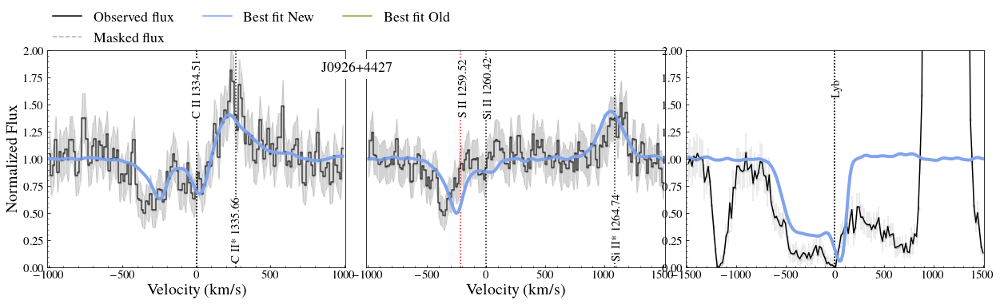

1
138 148
1.5610471638681482 0.42282353794788047
4.811912735667276 0.4292734038536446


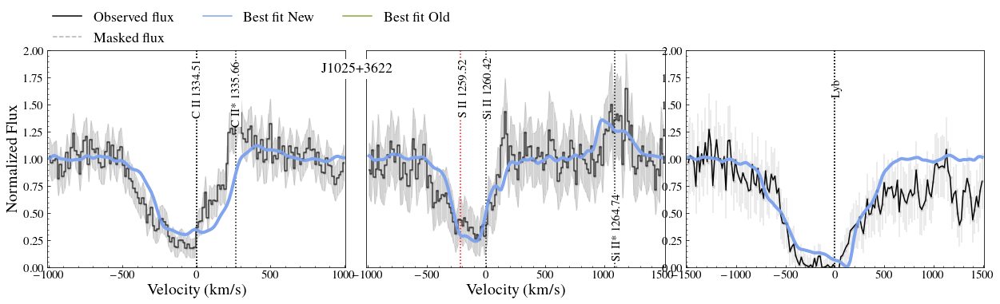

2
157 148
14.16030191292586 1.8610816580755096
23.478599894705763 0.09689040797393204


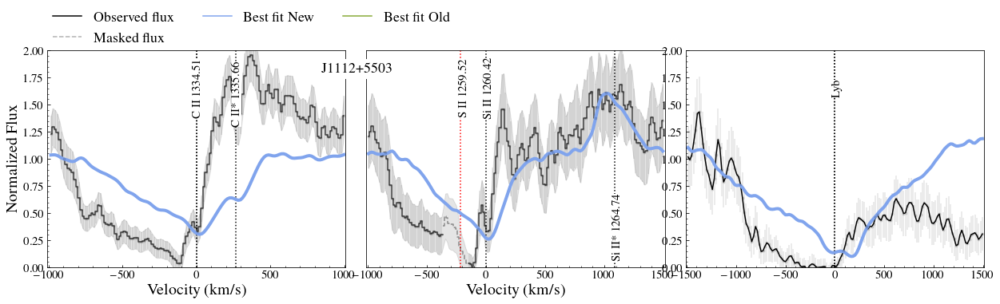

3
177 148
4.599573827005001 1.136112580781744
3.9447733338623556 0.19430595604482676


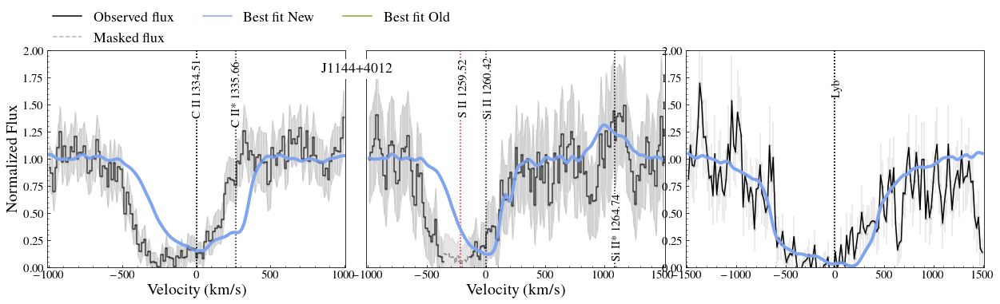

4
177 148
6.507894593605043 2.0736854955043573
4.305494943819054 0.30688214172748035


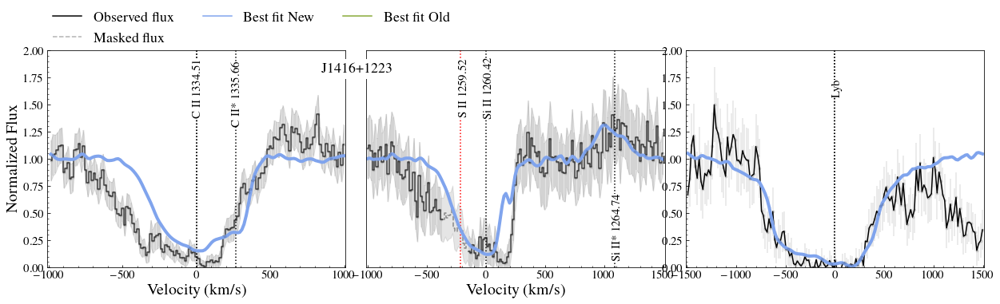

5
138 148
0.9356966311989833 0.8121320964573366
3.7842708495739705 0.8358548416504857


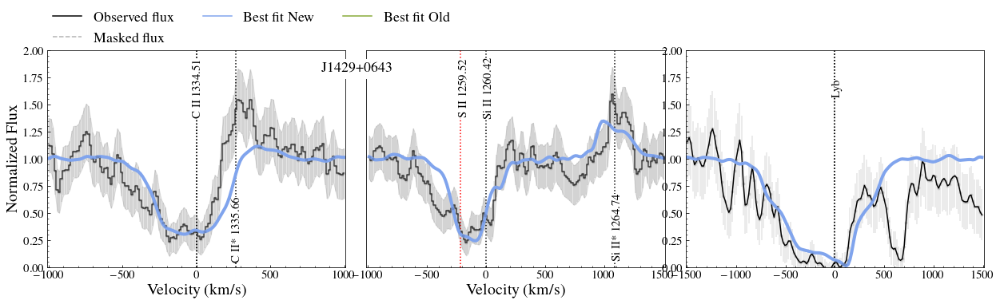

6
133 148
3.2882142298630357 0.0
1.665894783951214 0.0


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/simon/anaconda3/lib/python3.9/site-packages/matplotlib/axes/_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


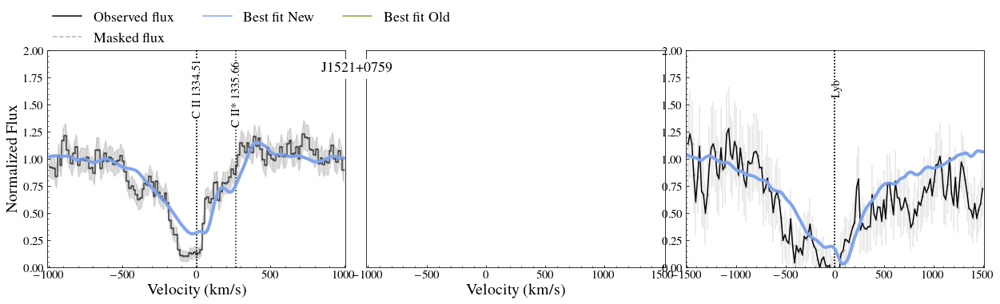

7
157 148
22.47041744185211 6.747967746694448
17.12665822703769 0.7583985554489955


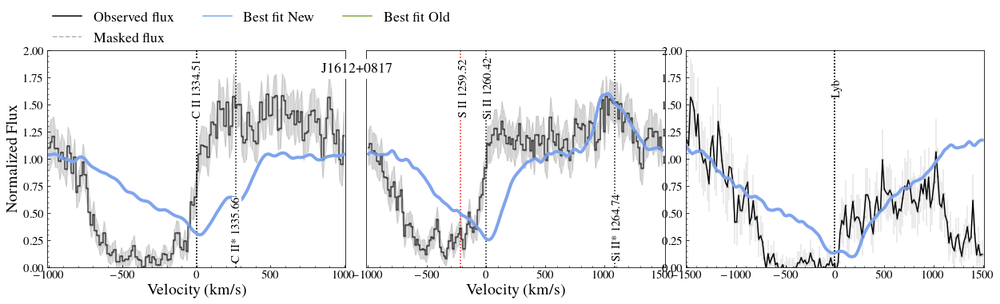

In [30]:
dfFS   = pd.read_csv('csv/Classy_dep_fit_148.csv')
v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)

r50gal = []
r50cosgal = []
chi2emiC_FS = []
chi2emiS_FS = []
chi2emiC_FS2 = []
chi2emiS_FS2 = []
tt = -1
for i in range(len(galaxy)):

    if(label[i].upper() not in ['J0926+4427','J1025+3622','J1112+5503', 'J1144+4012','J1416+1223',\
                               'J1429+0643', 'J1521+0759', 'J1612+0817']):

        continue
#     if(maskIt[i] == True and (label[i].upper() not in maskGal)):
#         print('yes')
    ## Plot galaxy spectra
    tt +=1
    print(tt)
    hduin  = fits.open('../Classy/%s/%s_SB99fit.fits'%(galaxy[i].replace("_", ""), label[i].upper()))
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[i]

    d_A = cosmo.angular_diameter_distance(z=classy.loc[classy.Galaxy == label[i].upper(), 'redshift'].values).value
    theta = 1.25 # arcsec
    theta_radian = theta * np.pi / 180 / 3600
    distance_coskpc = d_A * theta_radian *1e3
#     print(distance_coskpc)
    r50gal.append(classy.loc[classy.Galaxy == label[i].upper(), 'r50kpc'].values)
    r50cosgal.append(distance_coskpc)
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c
    vlyb = (wave/1025.728-1)*c
    cutCIIall = (vcIId>-1000) & (vcIId<1000) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 
    cutlyb = (vlyb>-1500) & (vlyb<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    maskLyb  = mask[cutlyb]    

    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    flyb    = flux[cutlyb]

    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    elyb    = err[cutlyb]

    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]
    vlyb     = vlyb[cutlyb]
    
    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    if(tt == 25):
        fcII/=1.1
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII
    if(tt ==29 ):
        rmedSiII = (vsiII>1000) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    
    rmedLyb= ((vlyb<-1000)) & maskLyb
    fmedLyb = np.nanmedian(flyb[rmedLyb])
    flyb /=     fmedLyb 

    
    if(tt==31):
        fsiII/=0.9
    if(tt==34):
        fsiII/=1.02        
    fig, axs = plt.subplots(1,3,figsize=(21,5))
    
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        axs[0].axvline(0, linestyle = ':', c='k')

        axs[0].text(-30, 1.65, "C II 1334.51", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(tt in [1,2,3,4,6,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,33,38]):
            yl = 1.6
        else:
            yl = 0.35
            
        if (tt == 15 or tt == 34 or tt == 32):
            axs[0].text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[0].text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        axs[0].axvline(264, linestyle = ':', c='k')   
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    axs[0].errorbar(vcII, fcIIgood, yerr = ecII, fmt='.k' , alpha=0.1)
    axs[0].plot(vcII, fcIIgood,  c='k', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    axs[0].plot(vcII, fcIIbad,  c='k', alpha = 0.4,drawstyle='steps-mid', label = 'Masked flux', linestyle = '--')#, label = 'Observed'

    #     if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
#         ax2.fill_between(vcII[~maskCII], 0, 2, 
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",
    axs[0].fill_between(vcII,fcII - ecII, fcII + ecII,color= 'k', alpha = 0.1)


    

    
    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].axvline(0, linestyle = ':', c='k')
       # if(i == 0):
        axs[1].text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        if(i == 2):
            axs[1].text(1066, 0.37, "Si II* 1264.74", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        else:
            axs[1].text(1056, 0.37, "Si II* 1264.74", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1))

        axs[1].axvline(1086, linestyle = ':', c='k')
        axs[1].axvline(-214, linestyle = ':', c='r')
        axs[1].text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',
            bbox=dict(facecolor='white', edgecolor='white', pad = -1))
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,27,34,35]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII& ~((vsiII >-364) & (vsiII <-144)))] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII&~((vsiII >-364) & (vsiII <-144))] =np.nan 
        
    axs[1].errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.k' , alpha=0.1)
    axs[1].plot(vsiII, fsiIIgood,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    axs[1].plot(vsiII, fsiIIbad,  c='k',  alpha = 0.4,drawstyle='steps-mid', linestyle = '--' )

#     if(len(fsiII[~maskSiII])>0 and np.nansum(fsiII[maskSiII]) != 0):
#         ax3.fill_between(vsiII[~maskSiII], 0,2, alpha=0.2,color="none", hatch="X", edgecolor="k")  
#     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall],   c = 'k' )
    axs[1].fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'k', alpha = 0.1)


    if(np.nansum(flyb[maskLyb]) != 0):
        axs[2].axvline(0, linestyle = ':', c='k')
    #     axs[0].set_title('C II 1334')
        axs[2].axvline(0, linestyle = ':', c='k')

        axs[2].text(-30, 1.65, "Lyb", rotation=90, verticalalignment='center',
        bbox=dict(facecolor='white', edgecolor='white', pad = -1)) 

    axs[2].errorbar(vlyb, flyb, yerr = elyb, fmt='.k' , alpha=0.1)
    axs[2].plot(vlyb, flyb, c= 'k')

    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll'][i]
    bestOut         = dfFS['OutputAll'][i]
    bestChi2FS      = dfFS['x2All'][i]
    print(bestDir, bestOut)
    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )
    llyb, fluxlyb = read_spectrum_lyb('Lyb/', bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
#     alpha          = np.nansum((modelNewcii[maskCII]*fcII[maskCII]/(ecII[maskCII])**2))/ \
#                     np.nansum(modelNewcii[maskCII]**2/ecII[maskCII]**2)     
#     modelNewcii    *= alpha   
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best fit')

               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)
#     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     modelNewsi    *= alpha
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  

    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].plot(vsiII, modelNewsi, c =cFS, lw = 4)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    
#     axs[0].legend(fontsize = 18, frameon = False, ncol = 2)
#     axs[1].legend(fontsize = 18, frameon = False, ncol = 2)

    #if(i == 0):
#         handles, labels = axs[0].get_legend_handles_labels()

    lyb_systemic = llyb + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(llyb) 
    lyb_systemic = lyb_systemic[1:]
    vlyb_s        = (lyb_systemic/1025.728 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[i].upper(), 'resol'] / 2.355/ ((vlyb_s[50]-vlyb_s[49]))
    model          = gaussian_filter(fluxlyb[bestDir,1:]/np.median(fluxlyb[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vlyb_s, model)
    modelNewlyb     = f(vlyb)
#     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     modelNewsi    *= alpha
    rmedlyb = (vlyb<-1000) 
    fmedlyb = np.nanmedian(modelNewlyb[rmedlyb])
    modelNewlyb /= fmedlyb  

    #if(np.nansum(fsiII[maskSiII]) != 0):

    axs[2].plot(vlyb, modelNewlyb, c =cFS, lw = 4)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    
        
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
#     axs[1].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-1010,1010)
    axs[1].set_xlim(-1010,1510)
    axs[2].set_xlim(-1510,1510)
    axs[2].set_ylim(0,2)

    axs[1].text(-1390, 1.8, label[i].upper(), fontsize = 18,
        bbox=dict(facecolor='white', edgecolor='white'))
    
    axs[0].set_ylim(0,2)
    axs[1].set_ylim(0,2)
  #  maskCII  = maskCII & (vcII > 100) & (vcII < 500) #& (modelNewcii > 1.05)
  #  maskSiII = maskSiII & (vsiII > 700)& (vsiII < 1400)# & (modelNewsi > 1.05)
    maskCII = maskCII & (abs(vcII <550))
    maskSiII = maskSiII & (vsiII > - 550) & (~((vsiII >-364) & (vsiII <-144)))
    
    try:
        lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)/len(modelNewcii[maskCII])
    except:
        lnlikecII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)/len(modelNewsi[maskSiII])
    except:
        lnlikesiII = 0
    print(lnlikecII, lnlikesiII)
    lnlikeall  = lnlikecII + lnlikesiII
    chi2emiC_FS.append(lnlikecII)
    chi2emiS_FS.append(lnlikesiII)

    
    try:
        lnlikecII  =  np.nansum(((fcII[(vcII >100) & (vcII <300)]-modelNewcii[(vcII >100) & (vcII <300)])**2)\
                                /ecII[(vcII >100) & (vcII <300)]**2)/len(modelNewcii[(vcII >100) & (vcII <300)])
    except:
        lnlikecII = 0
    try:
        lnlikesiII =  np.nansum(((fsiII[(vsiII >950) & (vsiII <1150)] - modelNewsi[(vsiII >950) & (vsiII <1150)])**2)\
                                 /esiII[(vsiII >950) & (vsiII <1150)]**2) /len(modelNewsi[(vsiII >950) & (vsiII <1150)])
    except:
        lnlikesiII = 0
    print(lnlikecII, lnlikesiII)
    lnlikeall  = lnlikecII + lnlikesiII
    chi2emiC_FS2.append(lnlikecII)
    chi2emiS_FS2.append(lnlikesiII)
    
    plt.subplots_adjust(wspace=0.07, hspace=None)

    
    
    line1 = Line2D([0], [0], label='Observed flux', color='k')    
    line2 = Line2D([0], [0], label='Masked flux', color='k', linestyle = '--', alpha = 0.3)    

    line3 = Line2D([0], [0], label='Best fit New', color=cFS)
    line4 = Line2D([0], [0], label='Best fit Old', color=cnoFS)

#         patch = mpatches.Patch(facecolor='none', hatch="X", edgecolor="k", label='Masked', alpha = 0.2)   

#         handles.extend([patch,line])
    axs[0].legend([line1,line2,line3, line4], ['Observed flux', 'Masked flux', 'Best fit New', 'Best fit Old'], frameon = False, ncol = 3,
                 loc = (0.,1), fontsize = 18)
        
    plt.show()


# Visualization

## All profiles

In [314]:
import ipyvolume as ipv

KeyboardInterrupt: 

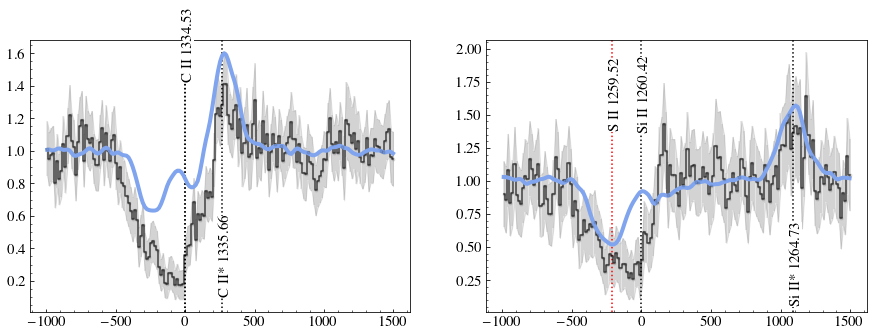

In [52]:
#%matplotlib inline
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#5A9F00'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)
for angle in range(0,300):
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(22, 7))
   # ax = plt.axes(projection = '3d')
   # ax._axis3don = False
    # 3d contour plot
    image = np.sum(cubeSiII[angle,:,:,10:20], axis = (2))
    ax1.imshow(image, cmap = cmap, aspect = 'auto', interpolation = 'nearest',
             norm=LogNorm(vmin=np.max(image)/1e5,vmax=np.max(image)/2))
    spec = np.sum(cubeSiII[angle,:,:,1:], axis = (0,1))
    l_systemic = lcubeSiII[1:] + np.dot(directions[angle,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    ax2.plot(l_systemic, spec, c = 'orange')
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.tick_params(labelsize = 18, colors = 'w')
    ax2.set_xlabel(r'$\lambda$ [A]',fontsize=16, color = 'w')
    ax2.set_ylabel(r'flux [erg/s/A]',fontsize=16, color = 'w')
    ax2.set_title('Si II 1260 + Si II* 1265',fontsize=16, color = 'w')
    
    l_systemic = lcubecII[1:] + np.dot(directions[angle,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 

    spec = np.sum(cubecII[angle,:,:,1:], axis = (0,1))
#     spec  /= np.median(spec)
    ax3.plot(l_systemic, spec, c = 'orange')

    ax3.tick_params(labelsize = 18, colors = 'w')
    ax3.set_xlabel(r'$\lambda$ [A]',fontsize=16, color = 'w')
    ax3.set_ylabel(r'flux [erg/s/A]',fontsize=16, color = 'w')
    ax3.set_title('C II 1334 + C II* 1335',fontsize=16, color = 'w')
    
#     ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.xaxis._axinfo['grid']['color'] = (1, 1, 1, 0)
#     ax.yaxis._axinfo['grid']['color'] = (1, 1, 1, 0)
#     ax.zaxis._axinfo['grid']['color'] = (1, 1, 1, 0)
    
    # adjust view from 0, 2, 4, 6, ..., 360
    #ax.view_init(60, angle)
    
    # save figure with different names depend on the view
    filename='Images/3d_vis_'+str(angle)+'.png'
    plt.savefig(filename, dpi=75, transparent=True)
    plt.close()
#     plt.show()

In [18]:
from PIL import Image
png_count = 300
files = []

def gen_frame(path):
    im = Image.open(path)
    alpha = im.getchannel('A')

    # Convert the image into P mode but only use 255 colors in the palette out of 256
    im = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=255)

    # Set all pixel values below 128 to 255 , and the rest to 0
    mask = Image.eval(alpha, lambda a: 255 if a <=128 else 0)

    # Paste the color of index 255 and use alpha as a mask
    im.paste(255, mask)

    # The transparency index is 255
    im.info['transparency'] = 255

    return im



for i in range(40,png_count):
    seq = str(i)
    file_names = 'Images/3d_vis_'+ seq +'.png'
    files.append(file_names)
    
# print(files)
frames = []
files
for i in files:
    new_frame = gen_frame(i)
    frames.append(new_frame)
    
# frames = [frame.convert('PA') for frame in frames]
    
# Save into a GIF file that loops forever   
frames[0].save('3d_vis_black.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0,disposal=2)

Text(0.5, 1.0, 'C II 1334 + C II* 1335')

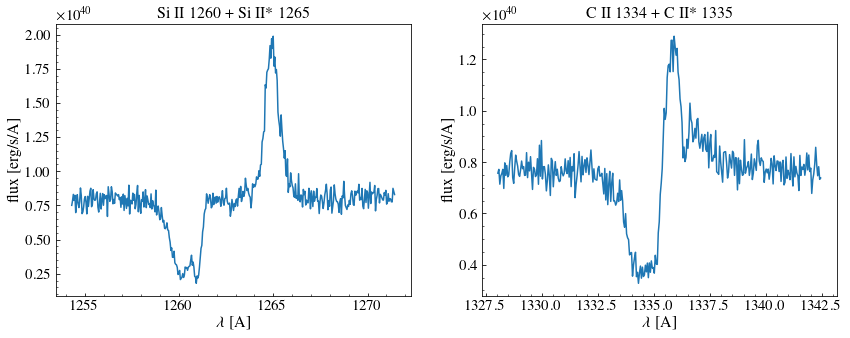

In [382]:
path_to_data = 'CII_SiII_depletion/' # To change if you move the data
v_cm = np.genfromtxt('./dat_files/vcm_90_164.dat',unpack=True)

output  = 96    # 148, 156 or 164 (A,B and C in Mauerhofer+21). 
idir = 113 # to choose a direction of observation, between 0 and ndirections-1


l, flux = read_spectrum_si(path_to_data,output) 
l_systemic = l + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(l) 
vsiII   = (l_systemic[1:]/wsiII1260 -1)*c

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5))
ax1.plot(l_systemic[1:],flux[idir,1:]) #/np.median(flux[idir,1:])
ax1.set_xlabel(r'$\lambda$ [A]',fontsize=16)
ax1.set_ylabel(r'flux [erg/s/A]',fontsize=16)
ax1.set_title('Si II 1260 + Si II* 1265',fontsize=16)
l, flux = read_spectrum_c(path_to_data,output) 
l_systemic = l + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(l) 
vcII   = (l_systemic[1:]/wcII1334 -1)*c
ax2.plot(l_systemic[1:],flux[idir,1:]) #/np.median(flux[idir,1:])
ax2.set_xlabel(r'$\lambda$ [A]',fontsize=16)
ax2.set_ylabel(r'flux [erg/s/A]',fontsize=16)
ax2.set_title('C II 1334 + C II* 1335',fontsize=16)


### All profiles for 1 fits

In [67]:
#%matplotlib inline
cb_colors = ["#03071e","#370617","#6a040f","#9d0208","#d00000","#dc2f02",
             "#e85d04","#FFBA08","#FFBA08","#FFC42D"]

contCol = '#064789'
fluCol = '#FF9CD9' 
resCol = '#5A9F00'

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test2',cb_colors)

cmap.set_bad('black',1.)
for angle in range(0,300):
    hduin  = fits.open('../Classy/J10253622/J1025+3622_SB99fit.fits')
    data   = hduin[1].data
    wave   = data['wave']
    flux   = data['flux']
    err    = data['err']
    mask   = mask_all[17]

    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-1000) & (vcIId<1500) 
    cutSiIIall = (vsiIId>-1000) & (vsiIId<1500) 

    maskCII  = mask[cutCIIall]
    maskSiII = mask[cutSiIIall]    
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]

    rmedCII = ((vcII<-500) | (vcII > 700)) & maskCII
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII

    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) & maskSiII

    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII

    
    
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    

    
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].axvline(0, linestyle = ':', c='w')
    #     axs[0].set_title('C II 1334')
        axs[0].axvline(0, linestyle = ':', c='w')

        axs[0].text(-30, 1.65, "C II 1334.53", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        if(tt in [1,2,3,4,6,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,33,38] and i not in [37, 44] ):
            yl = 1.6
        else:
            yl = 0.35
            
        if (tt == 15 or tt == 34 or tt == 32):
            axs[0].text(254, yl, "C II* 1335.66", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        else:
            axs[0].text(234, yl, "C II* 1335.66", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        axs[0].axvline(264, linestyle = ':', c='w')   
        
    fcIIgood = fcII.copy()
    fcIIgood[~(maskCII)] =np.nan
    fcIIbad = fcII.copy()
    fcIIbad[maskCII] =np.nan    

    axs[0].errorbar(vcII, fcIIgood, yerr = ecII, fmt='.w' , alpha=0.1)
    axs[0].plot(vcII, fcIIgood,  c='w', alpha = 0.7,drawstyle='steps-mid', label = 'Observed flux')#, label = 'Observed'
    axs[0].plot(vcII, fcIIbad,  c='w', alpha = 0.4,drawstyle='steps-mid', label = 'Masked flux', linestyle = '--')#, label = 'Observed'

    if(len(fcII[~maskCII])>0 and np.nansum(fcII[maskCII]) != 0):
        axs[0].fill_between(vcII[~maskCII], 0,2, alpha=0.1,color="#3a3d40")  
#                             alpha=0.8, label = 'Masked', color="white",  zorder = 5)#hatch="X",edgecolor="k",
    axs[0].fill_between(vcII,fcII - ecII, fcII + ecII,color= 'w', alpha = 0.1)


    

    
    if(np.nansum(fsiII[maskSiII]) != 0):

        axs[1].axvline(0, linestyle = ':', c='w')
       # if(i == 0):
        axs[1].text(-30, 1.65, "Si II 1260.42", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        if(i == 2):
            axs[1].text(1066, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        else:
            axs[1].text(1056, 0.37, "Si II* 1264.73", rotation=90, verticalalignment='center',color='w',
        bbox=dict(facecolor='None', edgecolor='None', pad = -1))

        axs[1].axvline(1086, linestyle = ':', c='w')
        axs[1].axvline(-214, linestyle = ':', c='c')
        axs[1].text(-234, 1.65, "S II 1259.52", rotation=90, verticalalignment='center',color='w',
            bbox=dict(facecolor='None', edgecolor='None', pad = -1))
        
    if(i == 42 or i ==36):
        maskSiII = np.ones(len(maskSiII)).astype('bool')
        
    if(tt in [0,1,5,6,7,8,9,14,15,16,18,19,23,25,34] or i in [25,29,31,33,35,37,40,44,42]):

        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan  
        maskSiIIadd = np.ones(len(maskSiII)).astype('bool')
    else:
        fsiIIgood = fsiII.copy()
        fsiIIgood[~(maskSiII)] =np.nan
        fsiIIbad = fsiII.copy()
        fsiIIbad[maskSiII] =np.nan 
        maskSiIIadd = ~((vsiII >-364) & (vsiII <-144))

        #maskSiII = maskSiII & ~((vsiII >-364) & (vsiII <-144))
        
    axs[1].errorbar(vsiII, fsiIIgood, yerr = esiII, fmt='.w' , alpha=0.1)
    axs[1].plot(vsiII, fsiIIgood,  c='w',  alpha = 0.7,drawstyle='steps-mid' )
    axs[1].plot(vsiII, fsiIIbad,  c='w',  alpha = 0.7,drawstyle='steps-mid', linestyle = '--' )

    if(len(fsiII[~maskSiII | ~maskSiIIadd])>0 and np.nansum(fsiII[maskSiII]) != 0):
        axs[1].fill_between(vsiII[~maskSiII], 0,2, alpha=0.1,color="#3a3d40") 
        axs[1].fill_between(vsiII[~maskSiIIadd & maskSiII], 0,2, alpha=0.1,color="#3a3d40") 

#         axs[1].fill_between(vsiII[maskSiII], 0,2, alpha=0.3,color="#FFFFFF")  

#     axs[1].plot(vsiIId[cutSiIIall], absflux[cutSiIIall],   c = 'k' )
    axs[1].fill_between(vsiII,fsiII-esiII, fsiII+esiII, color = 'w', alpha = 0.1)


    path_to_data2 = './CII_SiII_depletion/' 

    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = angle#dfFS['DirAll'][i]
    bestOut         = 148
    #bestChi2FS      = dfFS['x2All'][i]

    lcII, fluxcII   = read_spectrum_c(path_to_data2,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data2, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = classy.loc[classy.Galaxy == label[17].upper(), 'resol'] / 2.355/((vcII_s[50]-vcII_s[49]))
    model          = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    f              = interpolate.interp1d(vcII_s, model)
    modelNewcii    = f(vcII)
#     alpha          = np.nansum((modelNewcii[maskCII]*fcII[maskCII]/(ecII[maskCII])**2))/ \
#                     np.nansum(modelNewcii[maskCII]**2/ecII[maskCII]**2)     
#     modelNewcii    *= alpha   
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    if(np.nansum(fcII[maskCII]) != 0):
        axs[0].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best fit')

               #label = 'Best simu with FS - TS %d - Dir %d - Chi2 %.2f'%(bestOut, bestDir, bestChi2FS))
   

        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  = classy.loc[classy.Galaxy == label[17].upper(), 'resol'] / 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    model          = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    f              = interpolate.interp1d(vsiII_s, model)
    modelNewsi     = f(vsiII)
#     alpha          = np.nansum((modelNewsi[maskSiII]*fsiII[maskSiII]/(esiII[maskSiII])**2))/ \
#                     np.nansum(modelNewsi[maskSiII]**2/esiII[maskSiII]**2)
#     modelNewsi    *= alpha
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  

    if(np.nansum(fsiII[maskSiII]) != 0):
        axs[1].plot(vsiII, modelNewsi, c =cFS, lw = 4)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    
#     axs[0].legend(fontsize = 18, frameon = False, ncol = 2)
#     axs[1].legend(fontsize = 18, frameon = False, ncol = 2)

    #if(i == 0):
#         handles, labels = axs[0].get_legend_handles_labels()


    line1 = Line2D([0], [0], label='Observed flux', color='w')    
    line2 = Line2D([0], [0], label='Masked flux', color='w', linestyle = '--', alpha = 0.3)    

    line3 = Line2D([0], [0], label='Best fit', color=cFS)
    patch = patches.Patch(facecolor='#3a3d40', label='Masked', alpha = 0.2)   

#         handles.extend([patch,line])
    l=axs[0].legend([line1,patch,line3], ['Observed flux', 'Masked flux', 'Best fit'], frameon = False, ncol = 3,
                 loc = (0.4,1), fontsize = 18, )
    for text in l.get_texts():
        text.set_color("white")
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,color = 'w')
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20,color = 'w')
    axs[0].set_ylabel('Normalized Flux', fontsize = 20,color = 'w')
#     axs[1].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-1010,1010)
    axs[1].set_xlim(-1010,1510)
    axs[1].text(-1390, 1.8, label[17].upper(), fontsize = 18,
        bbox=dict(facecolor='None', edgecolor='None'),color = 'w')
    
    axs[0].set_ylim(0,2)
    axs[1].set_ylim(0,2)
    
    axs[0].text(0.05, 0.9, r'log$_{10}(M_\star / M_\odot)$ = ' + str(classy['MstarTot'][17]),
                transform=axs[0].transAxes, fontsize = 16,color = 'w')
    axs[0].text(0.05, 0.8, r'$Z_{\rm gas}$ = '+str(classy['Zstell'][17]) + ' $Z_\odot$',
                transform=axs[0].transAxes, fontsize = 16,color = 'w')
    axs[0].spines[['top', 'right','left','bottom']].set_color('white')
   # ax.xaxis.label.set_color('red')
    axs[0].tick_params(axis='both', colors='w')
    axs[1].spines[['top', 'right','left','bottom']].set_color('white')
   # ax.xaxis.label.set_color('red')
    axs[1].tick_params(axis='both', colors='w')
    plt.subplots_adjust(wspace=0.07, hspace=None)
    filename='Images/spectra_vis_'+str(angle)+'.png'
    plt.savefig(filename, dpi=75, transparent=True)
    plt.close()
#     plt.show()

In [68]:
from PIL import Image
png_count = 300
files = []

def gen_frame(path):
    im = Image.open(path)
    alpha = im.getchannel('A')

    # Convert the image into P mode but only use 255 colors in the palette out of 256
    im = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=255)

    # Set all pixel values below 128 to 255 , and the rest to 0
    mask = Image.eval(alpha, lambda a: 255 if a <=128 else 0)

    # Paste the color of index 255 and use alpha as a mask
    im.paste(255, mask)

    # The transparency index is 255
    im.info['transparency'] = 255

    return im



for i in range(40,png_count):
    seq = str(i)
    file_names = 'Images/spectra_vis_'+ seq +'.png'
    files.append(file_names)
    
# print(files)
frames = []
files
for i in files:
    new_frame = gen_frame(i)
    frames.append(new_frame)
    
# frames = [frame.convert('PA') for frame in frames]
    
# Save into a GIF file that loops forever   
frames[0].save('spectra_vis_black.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=200, loop=0,disposal=2)

In [69]:
labelmass = [x for _, x in sorted(zip(classy['MstarTot'],label))]
print(labelmass)

['j1418+2102', 'j0934+5514', 'j1323-0132', 'j1444+4237', 'j0405-3648', 'j0940+2935', 'j1016+3754', 'j1119+5130', 'j1044+0353', 'j0944-0038', 'j1150+1501', 'j0337-0502', 'j1225+6109', 'j1132+5722', 'j1545+0858', 'j0942+3547', 'j1314+3452', 'j1448-0110', 'j0144+0453', 'j1253-0312', 'j1024+0524', 'j1129+2034', 'j1200+1343', 'j1148+2546', 'j0944+3442', 'j1359+5726', 'j1132+1411', 'j0127-0619', 'j0926+4427', 'j1429+0643', 'j1025+3622', 'j1105+4444', 'j1521+0759', 'j1157+3220', 'j0021+0052', 'j0808+3948', 'j0036-3333', 'j0938+5428', 'j0823+2806', 'j1428+1653', 'j1112+5503', 'j1416+1223', 'j1612+0817', 'j1144+4012', 'j1525+0757']
